# Exploratory Data Analysis
This notebook performs EDA on the Rosenthal Video tape collection.

## Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os
import sys
import glob
import re

## Access Files

First step is to navigate to the `Rosenthal` folder under `gallina` and load all the files into an iglob iterator.

### Rosenthal Folder

In [2]:
print("Current directory:",os.getcwd())

Current directory: /mnt/rds/redhen/gallina/home/hxm471/RedHenLab-Multimodal_TV_Show_Segmentation/notebooks


In [3]:
# Check if the Rosenthal directory exists
ros_path = "/mnt/rds/redhen/gallina/Rosenthal/"
print("Directory exists:",os.path.isdir(ros_path))

# Check that the Rosenthal directory is not empty
ros_items = os.listdir(ros_path)
if len(ros_items)==0:
    print("Error! Directory is empty")
else:
    # If not empty print the subdirectories
    print("Items in directory:",ros_items)

Directory exists: True
Items in directory: ['1972', '1978', '1996', '2001', '1985', '1961', '1982', '1988', '2006', '1975', '1991', '1995', '1971', '2002', '1962', '1986', '1981', '2005', '1992', '1998', '1976', '1990', '1974', '1989', '1983', '1960', '1984', '1979', '1997', '1973', '2000', '2004', '1999', '1977', '1993', '1980', '1987', '1969', '1963', '1994', '2003']


In [4]:
# Starting index of the file name (used to remove path info)
FILE_START_INDEX = 58

In [5]:
# Method to traverse through all of the iglob files recursively
def traverse_iglob(files):
    # Establish a counter variable to keep track of no of files.
    ctr=0
    # Maintain a list to extract only the file names
    files_split=[]
    
    # Loop through the iglob iterator and update the variables
    for file in files:
        print(file)
        ctr+=1
        file_split = file[FILE_START_INDEX:].split('_')
        year, month, day = file_split[0].split('-')
        files_split.append([file_split[0]]+[year]+[month]+[day]+file_split[1:5]+[file_split[-1]]+[file])
    return ctr,files_split

In [6]:
# Crete iglob iterator for all mp4 files
mp4_files = glob.iglob(ros_path+"**/*.mp4", recursive=True)

# Use method to extract file count and name
mp4_ctr, mp4_files_split = traverse_iglob(mp4_files)

/mnt/rds/redhen/gallina/Rosenthal/1972/1972-07/1972-07-01/1972-07-01_0000_US_00010144_V0_U1_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10/1972-10-06/1972-10-06_0000_US_00016471_V0_VHS16_MB13_H15_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10/1972-10-06/1972-10-06_0000_US_00015980_V1_VHS5_MB30_H7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09/1972-09-14/1972-09-14_0000_US_00025933_B0_B11_MB36_E5_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09/1972-09-01/1972-09-01_0000_US_00016359_V0_VHSP21_M8_H6_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-06/1972-06-20/1972-06-20_0000_US_00019725_B1_B46_M2_E7_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-06/1972-06-20/1972-06-20_0000_US_00019724_B3_B1_MB40_E8_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-06/1972-06-19/1972-06-19_0000_US_00019723_B1_B47_M4_E10_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-01/1972-01-19/1972-01-19_0000_US_00010324_B0_B7_M2_E7_DJ_BE.mp4
/mnt/rds/redhen/gallina/Rosen

/mnt/rds/redhen/gallina/Rosenthal/1972/1972-02/1972-02-05/1972-02-05_0000_US_00028650_B0_B51_MB48_H12_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-02/1972-02-05/1972-02-05_0000_US_00028649_B0_B33_MB35_E9_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-02/1972-02-05/1972-02-05_0000_US_00028651_B0_B48_MB32_E11_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-02/1972-02-02/1972-02-02_0000_US_00028653_B0_B6_M6_E6_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-02/1972-02-02/1972-02-02_0000_US_00028655_B0_B6_M6_E6_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-02/1972-02-02/1972-02-02_0000_US_00028654_B0_B51_MB48_H12_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-02/1972-02-02/1972-02-02_0000_US_00028652_B0_B6_M6_E6_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-02/1972-02-01/1972-02-01_0000_US_00028657_B0_B10_MB52_H19_TL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-02/1972-02-01/1972-02-01_0000_US_00028659_B0_B33_MB35_E9_TL.mp4
/mnt/rds/redhen/gallina/Rosenthal

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-08/1996-07-08_0000_US_00041476_V4_VHS46_MB21_H9_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-08/1996-07-08_0000_US_00041476_V4_VHS18_MB5_H7_SM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-08/1996-07-08_0000_US_00041476_V4_VHSP17_M18_E13_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-08/1996-07-08_0000_US_00041488_V5_VHS40_MB34_H28_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-02/1996-07-02_0000_US_00017121_V5_VHSP12_MB20_H17_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-02/1996-07-02_0000_US_00017119_V2_B30_M13_H19_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-02/1996-07-02_0000_US_00017120_V3_VHS25_MB9_H14_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-02/1996-07-02_0000_US_00017119_V2_VHS12_MB12_H5_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-02/1996-07-02_0000_US_00017118_V1_VHSP14_MB21_H9_ZY.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-03/1996-07-03_0000_US_00041495_V3_VHS24_MB38_H25_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-03/1996-07-03_0000_US_00041494_V4_VHS16_MB13_H15_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-03/1996-07-03_0000_US_00041498_V1_VHS48_MB39_H8_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-03/1996-07-03_0000_US_00041493_V5_VHS31_MB25_H13_AS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-03/1996-07-03_0000_US_00041497_V2_VHS52_MB19_E4_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-03/1996-07-03_0000_US_00041494_V4_VHS51_MB22_H37_NG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-09/1996-07-09_0000_US_00041473_V5_VHS18_MB5_H7_PL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-09/1996-07-09_0000_US_00041473_V5_VHS31_MB25_H13_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07/1996-07-09/1996-07-09_0000_US_00041473_V5_VHS12_MB12_H5_D

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-16/1996-09-16_0000_US_00017980_V5_VHS18_MB27_H11_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-16/1996-09-16_0000_US_00017416_V4_VHSP6_MB11_E2_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-16/1996-09-16_0000_US_00017457_V1_VHS23_MB22_E1_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-16/1996-09-16_0000_US_00017456_V2_VHS16_MB13_H15_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-16/1996-09-16_0000_US_00017980_V5_VHSP6_MM3_E2_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-16/1996-09-16_0000_US_00017455_V5_VHS5_MB50_H30_AK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-16/1996-09-16_0000_US_00017457_V1_VHS31_MB25_H13_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-16/1996-09-16_0000_US_00017455_V5_VHS19_MB29_H3_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-24/1996-09-24_0000_US_00017506_V2_VHS28_MB3_E3_AM.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-03/1996-03-22/1996-03-22_0000_US_00026042_V1_VHS35_MB41_H26_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-03/1996-03-22/1996-03-22_0000_US_00026056_V5_VHS34_MB44_H21_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-03/1996-03-22/1996-03-22_0000_US_00026056_V5_VHS46_MB21_H9_AZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-03/1996-03-22/1996-03-22_0000_US_00026058_V2_VHS44_MB27_H22_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-03/1996-03-22/1996-03-22_0000_US_00026058_V2_VHS47_MB8_H34_AS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-03/1996-03-22/1996-03-22_0000_US_00026059_V3_VHS55_MB5_H7_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-03/1996-03-22/1996-03-22_0000_US_00026059_V3_VHS12_MB12_H5_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-03/1996-03-22/1996-03-22_0000_US_00026056_V5_VHS34_MB44_H21_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-03/1996-03-22/1996-03-22_0000_US_00026060_V4_VHS12_MB12_H5

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-10/1996-10-23/1996-10-23_0000_US_00010732_B5_VHS5_MB50_H30_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-10/1996-10-23/1996-10-23_0000_US_00016010_V2_VHSP16_MB10_H10_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-10/1996-10-23/1996-10-23_0000_US_00016010_V2_VHS48_MB39_H8_AZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-10/1996-10-23/1996-10-23_0000_US_00013865_V3_VHS28_MB3_E3_OB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-10/1996-10-23/1996-10-23_0000_US_00013871_V4_VHS12_MB25_H6_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-10/1996-10-29/1996-10-29_0000_US_00026783_V5_VHS48_MB30_H7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-10/1996-10-29/1996-10-29_0000_US_00026775_V2_VHS52_MB19_E4_NV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-10/1996-10-29/1996-10-29_0000_US_00026774_V7_VHS35_MB41_H26_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-10/1996-10-29/1996-10-29_0000_US_00015746_V1_VHS29_MB5_H7_GG.mp4


/mnt/rds/redhen/gallina/Rosenthal/1996/1996-04/1996-04-24/1996-04-24_0000_US_00026202_V2_VHSP20_MB23_H4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-04/1996-04-24/1996-04-24_0000_US_00026201_V3_VHS44_MB27_H22_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-04/1996-04-24/1996-04-24_0000_US_00026204_V4_VHS5_MB50_H30_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-04/1996-04-24/1996-04-24_0000_US_00026203_V5_VHSP17_M18_E13_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-04/1996-04-24/1996-04-24_0000_US_00026203_V5_VHS29_MB5_H7_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-04/1996-04-16/1996-04-16_0000_US_00026533_V_VHS35_MB41_H26_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-04/1996-04-16/1996-04-16_0000_US_00026532_V1_VHSP21_M8_H6_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-04/1996-04-05/1996-04-05_0000_US_00026578_B2_VHS51_M18_EB1_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-04/1996-04-05/1996-04-05_0000_US_00026576_B5_VHS15_MB24_H1_BW.mp4


/mnt/rds/redhen/gallina/Rosenthal/1996/1996-06/1996-06-24/1996-06-24_0000_US_00017132_V2_VHSP17_MB19_E4_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-06/1996-06-24/1996-06-24_0000_US_00017132_V2_VHS52_MB19_E4_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-06/1996-06-24/1996-06-24_0000_US_00017130_V4_VHSP14_MB21_H9_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-06/1996-06-24/1996-06-24_0000_US_00017133_V1_VHSP14_MB21_H9_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-06/1996-06-24/1996-06-24_0000_US_00017131_V3_VHS32_MB29_H3_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-06/1996-06-05/1996-06-05_0000_US_00017584_V2_VHS28_MB3_E3_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-06/1996-06-05/1996-06-05_0000_US_00017583_V1_VHS31_MB25_H13_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-06/1996-06-05/1996-06-05_0000_US_00017585_V4_VHS5_MB50_H30_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-06/1996-06-11/1996-06-11_0000_US_00017518_V2_VHS18_MB27_H11_NV.mp4


/mnt/rds/redhen/gallina/Rosenthal/1996/1996-12/1996-12-09/1996-12-09_0000_US_00026122_V2_VHS24_MB38_H25_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-12/1996-12-09/1996-12-09_0000_US_00026122_V2_VHS30_MB26_E12_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-12/1996-12-09/1996-12-09_0000_US_00026254_V5_VHS31_MB25_H13_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-12/1996-12-09/1996-12-09_0000_US_00026101_V4_VHSP20_MB23_H4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-12/1996-12-03/1996-12-03_0000_US_00017530_V5_VHSP16_MB43_H23_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-12/1996-12-03/1996-12-03_0000_US_00017529_V3_VHSP21_M8_H6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-12/1996-12-03/1996-12-03_0000_US_00017530_V5_VHS40_MB11_H28_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-12/1996-12-03/1996-12-03_0000_US_00017529_V3_VHSP21_MM1_H6_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-12/1996-12-31/1996-12-31_0000_US_00008923_V1_VHS24_MB16_H2_JS.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-26/1996-01-26_0000_US_00017778_V5_VHS47_MB8_H34_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-26/1996-01-26_0000_US_00017777_V4_VHSP14_MB21_H9_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-14/1996-01-14_0000_US_00016733_V3_VHS28_MB3_E3_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-13/1996-01-13_0000_US_00021501_V5_VHS15_MB24_H1_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-13/1996-01-13_0000_US_00021504_V1_VHS42_MB6_H20_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-13/1996-01-13_0000_US_00021501_B5_VHS38_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-19/1996-01-19_0000_US_00017884_V2_VHSP16_MB10_H10_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-19/1996-01-19_0000_US_00017699_V4_VHSP17_MB19_E4_HM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-19/1996-01-19_0000_US_00017883_V3_VHSP16_MB10_H10_NV.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-30/1996-01-30_0000_US_00017759_V5_VHSP21_MM1_H6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-30/1996-01-30_0000_US_00017757_V1_VHSP21_MM1_H6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-30/1996-01-30_0000_US_00017693_V3_VHS23_MB22_E1_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-30/1996-01-30_0000_US_00017758_V2_VHSP6_MB11_E2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-05/1996-01-05_0000_US_00021508_V1_VHS24_MB38_H25_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-05/1996-01-05_0000_US_00021510_V3_VHS47_MB8_H34_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-05/1996-01-05_0000_US_00021510_V3_VHSP16_MB10_H10_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-05/1996-01-05_0000_US_00021508_V1_VHSP18_MB41_H26_NV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-01/1996-01-24/1996-01-24_0000_US_00017691_V5_VHS29_MB5_H7_JS.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-05/1996-05-20/1996-05-20_0000_US_00017367_V2_VHS42_MB6_H20_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-05/1996-05-20/1996-05-20_0000_US_00016994_V4_VHSP20_MB23_H4_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-05/1996-05-20/1996-05-20_0000_US_00016994_V4_VHS35_MB41_H26_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-05/1996-05-20/1996-05-20_0000_US_00017367_V2_VHS25_MB9_H14_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-05/1996-05-20/1996-05-20_0000_US_00016912_V5_VHSP6_MB11_E2_JD_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-05/1996-05-20/1996-05-20_0000_US_00017366_V3_VHSP11_MB6_H8_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-05/1996-05-20/1996-05-20_0000_US_00017368_V1_VHS12_MB12_H5_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-05/1996-05-01/1996-05-01_0000_US_00026344_V1_VHSP18_MB20_H17_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-05/1996-05-01/1996-05-01_0000_US_00026347_V4_VHS5_MB50_H30_NV_BE.m

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-11/1996-11-07/1996-11-07_0000_US_00017586_V2_VHS28_MB3_E3_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-11/1996-11-07/1996-11-07_0000_US_00017587_V1_VHS25_MB56_H2_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-11/1996-11-07/1996-11-07_0000_US_00017627_V5_VHSP6_MB11_E2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-11/1996-11-07/1996-11-07_0000_US_00017624_V2_VHSP12_MB20_H17_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-11/1996-11-07/1996-11-07_0000_US_00017623_V1_VHS31_MB25_H13_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-11/1996-11-07/1996-11-07_0000_US_00026328_V3_VHSP17_MB19_E4_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-11/1996-11-07/1996-11-07_0000_US_00017587_V1_VHSP18_MB24_H1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-11/1996-11-07/1996-11-07_0000_US_00026325_V5_VHSP12_MB20_H17_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-11/1996-11-10/1996-11-10_0000_US_00026475_V5_VHS49_MB39_H8_KC.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-02/1996-02-04/1996-02-04_0000_US_00017661_V2_VHS15_MB4_H12_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-02/1996-02-04/1996-02-04_0000_US_00017307_V4_VHS53_MB26_E12_GS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-02/1996-02-09/1996-02-09_0000_US_00017311_V1_VHS12_MB12_H5_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-02/1996-02-22/1996-02-22_0000_US_00017027_V5_VHS48_MB39_H8_AS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-02/1996-02-22/1996-02-22_0000_US_00017032_V1_VHSP17_MB19_E4_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-02/1996-02-22/1996-02-22_0000_US_00017027_V5_VHS18_MB5_H7_AW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-02/1996-02-22/1996-02-22_0000_US_00017031_V2_VHSP20_MB23_H4_NV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-02/1996-02-22/1996-02-22_0000_US_00017022_V4_VHS23_MB22_E1_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-02/1996-02-22/1996-02-22_0000_US_00017030_V3_VHSP17_MB19_E4_JS

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-09/1996-08-09_0000_US_00017647_V5_VHS18_MB27_H11_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-09/1996-08-09_0000_US_00017467_V3_VHS18_MB27_H11_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-09/1996-08-09_0000_US_00017653_V3_VHS18_MB27_H11_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-09/1996-08-09_0000_US_00017652_V2_VHSP17_MB19_E4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-09/1996-08-09_0000_US_00017654_V4_VHSP20_MB23_H4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-09/1996-08-09_0000_US_00017466_V1_VHSP18_MB24_H1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-03/1996-08-03_0000_US_00026296_V2_VHS31_MB25_H13_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-04/1996-08-04_0000_US_00017643_V4_VHSP21_MM1_H6_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-04/1996-08-04_0000_US_00017478_V4_VHS18_MB27_H11_JS.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-15/1996-08-15_0000_US_00026388_V5_VHS31_MB25_H13_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-15/1996-08-15_0000_US_00026387_V4_VHS12_MB12_H5_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-15/1996-08-15_0000_US_00026383_V3_B51_MB19_E4_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-15/1996-08-15_0000_US_00017833_V2_VHS46_MB21_H9_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-27/1996-08-27_0000_US_00026307_V5_VHSP21_MM1_H6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-27/1996-08-27_0000_US_00014413_V2_VHSP14_MB21_H9_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-27/1996-08-27_0000_US_00026306_V3_VHS18_MB27_H11_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-27/1996-08-27_0000_US_00026321_V1_VHSP20_MB23_H4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1996/1996-08/1996-08-06/1996-08-06_0000_US_00017549_V3_VHS46_MB21_H9_JA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-07/2001-07-30/2001-07-30_0000_US_00041445_V1_VHS53_MB26_E12_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-07/2001-07-30/2001-07-30_0000_US_00041445_V1_VHS41_MB45_H29_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-07/2001-07-30/2001-07-30_0000_US_00041444_V2_VHS25_MB53_H38_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-07/2001-07-30/2001-07-30_0000_US_00041448_V5_VHS12_MB12_H5_DG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-07/2001-07-30/2001-07-30_0000_US_00041446_V3_VHSP25_MB27_H22_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-07/2001-07-30/2001-07-30_0000_US_00041448_V5_VHSP25_MB27_H22_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-07/2001-07-30/2001-07-30_0000_US_00041446_V3_VHS58_MB57_H3_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-07/2001-07-02/2001-07-02_0000_US_00009667_V5_VHSP14_MB21_H9_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-07/2001-07-02/2001-07-02_0000_US_00009668_V4_VHS52_MB19_E4_

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-10/2001-04-10_0000_US_00013300_V5_VHSP12_MB20_H17_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-10/2001-04-10_0000_US_00013348_V4_VHS5_MB5_H7_GG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-10/2001-04-10_0000_US_00013372_V2_VHS16_MB14_H9_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-10/2001-04-10_0000_US_00013346_V5_VHS24_MB16_H2_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-10/2001-04-10_0000_US_00013397_V3_VHS15_M6_H9_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-10/2001-04-10_0000_US_00013348_V4_VHS18_MB5_H7_GS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-10/2001-04-10_0000_US_00013376_V1_VHS23_MB22_E1_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-22/2001-04-22_0000_US_00007825_V3_VHSP11_M2_H4_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-25/2001-04-25_0000_US_00013386_V2_VHS16_MB14_H9_CS.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-02/2001-04-02_0000_US_00011661_V4_VHS42_MB6_H20_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-02/2001-04-02_0000_US_00011634_V2_VHSP6_MB15_E2_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-02/2001-04-02_0000_US_00011671_V3_VHS1_MB3_E3_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-02/2001-04-02_0000_US_00011633_V1_VHS6_MB12_H5_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-02/2001-04-02_0000_US_00011661_V4_VHSP9_M3_H16_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-02/2001-04-02_0000_US_00011675_V5_VHS52_MB19_E4_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-30/2001-04-30_0000_US_00012269_V4_VHS24_MB16_H2_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-30/2001-04-30_0000_US_00012271_V1_VHSP12_MB20_H17_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-04/2001-04-30/2001-04-30_0000_US_00012258_V3_VHSP6_MB19_E4_MS.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-09/2001-10-09_0000_US_00014544_V0_VHS12_MB12_H5_NC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-09/2001-10-09_0000_US_00008131_V11_VHSP1_MB9_H14_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-09/2001-10-09_0000_US_00008132_V10_VHS7_MB7_H11_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-09/2001-10-09_0000_US_00012074_V3_VHS15_M6_H9_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-09/2001-10-09_0000_US_00014519_V0_VHS42_MB6_H20_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-09/2001-10-09_0000_US_00012068_V5_VHS18_MB5_H7_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-09/2001-10-09_0000_US_00012073_V1_VHSP12_MB20_H17_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-09/2001-10-09_0000_US_00014532_V0_VHS47_MB8_H34_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-09/2001-10-09_0000_US_00008131_V11_VHS43_MB31_H27_DA.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-27/2001-10-27_0000_US_00007385_V10_VHSP20_MB23_H4_BB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-27/2001-10-27_0000_US_00007385_V10_VHS26_MB8_EB1_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-27/2001-10-27_0000_US_00007384_V11_VHSP11_M2_H4_JL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-27/2001-10-27_0000_US_00007362_V4_VHSP7_M4_H13_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-27/2001-10-27_0000_US_00007384_V11_VHS50_MB20_H17_AK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-15/2001-10-15_0000_US_00008164_V10_VHS20_MB6_H8_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-15/2001-10-15_0000_US_00012973_V5_VHS6_MB12_H5_CH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-15/2001-10-15_0000_US_00008165_V11_VHS5_MB5_H7_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-15/2001-10-15_0000_US_00028936_V0_VHS47_MB8_H34_WR.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-19/2001-09-19_0000_US_00016528_V0_VHS32_MB29_H3_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-19/2001-09-19_0000_US_00007801_V_VHS14_MB13_H1_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-19/2001-09-19_0000_US_00007676_V0_VHS23_MB22_E1_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-19/2001-09-19_0000_US_00007872_V4_VHS25_MB9_H14_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-19/2001-09-19_0000_US_00007800_V3_VHS15_M6_H9_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-19/2001-09-19_0000_US_00007671_V3_VHSP11_M2_H4_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-19/2001-09-19_0000_US_00012888_V4_VHS12_MB12_H5_HC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-19/2001-09-19_0000_US_00007805_V0_VHSP7_M4_H13_JL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-19/2001-09-19_0000_US_00016522_V0_VHSP12_MB20_H17_JS.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-25/2001-09-25_0000_US_00008278_V4_VHSP7_M4_H13_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-25/2001-09-25_0000_US_00008266_V11_VHS5_MB5_H7_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-25/2001-09-25_0000_US_00008265_V10_VHS20_MB6_H8_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-25/2001-09-25_0000_US_00014528_V0_VHS53_MB26_E12_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-25/2001-09-25_0000_US_00008267_V5_VHS40_MB34_H28_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-25/2001-09-25_0000_US_00008274_V2_VHS16_MB14_H9_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-25/2001-09-25_0000_US_00008267_V5_VHS15_M6_H9_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-25/2001-09-25_0000_US_00008283_V3_VHS15_M6_H9_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-25/2001-09-25_0000_US_00008265_V10_VHSP18_MB1_H24_AK.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-24/2001-09-24_0000_US_00007874_V5_VHS47_MB8_H34_PZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-24/2001-09-24_0000_US_00014504_V0_VHS15_MB24_H1_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-24/2001-09-24_0000_US_00007874_V5_VHSP1_MB9_H14_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-24/2001-09-24_0000_US_00007867_V4_VHSP9_M3_H16_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-24/2001-09-24_0000_US_00014504_V0_VHS24_MB38_H25_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-24/2001-09-24_0000_US_00014521_V0_VHSP16_MB43_H23_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-24/2001-09-24_0000_US_00007866_V3_VHSP11_M2_H4_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-24/2001-09-24_0000_US_00007867_V4_VHSP20_MB23_H4_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-09/2001-09-24/2001-09-24_0000_US_00007879_V1_VHS9_MB4_H12_CC.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-06/2001-03-06_0000_US_00013548_V3_VHSP17_MB19_E4_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-06/2001-03-06_0000_US_00013548_V3_VHS47_MB8_H34_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-06/2001-03-06_0000_US_00013547_V1_VHS23_MB22_E1_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-06/2001-03-06_0000_US_00013538_V5_VHS7_MB15_16_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-06/2001-03-06_0000_US_00013537_V4_VHSP19_MB26_E12_CS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-06/2001-03-06_0000_US_00013528_V2_VHS12_MB25_H6_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-08/2001-03-08_0000_US_00013488_V5_VHS40_MB34_H28_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-08/2001-03-08_0000_US_00013521_V2_VHS52_MB19_E4_KH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-08/2001-03-08_0000_US_00013569_V4_VHS25_MB9_H14_JK.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-28/2001-03-28_0000_US_00011802_V1_VHSP6_MB15_E2_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-28/2001-03-28_0000_US_00015800_V6_VHSP20_MB23_H4_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-28/2001-03-28_0000_US_00011797_V3_VHSP11_M2_H4_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-28/2001-03-28_0000_US_00011816_V2_VHS14_MB13_H1_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-28/2001-03-28_0000_US_00015800_V6_VHSP12_MB20_H17_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-28/2001-03-28_0000_US_00011805_V5_VHS41_MB45_H29_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-28/2001-03-28_0000_US_00011816_V2_VHS40_MB34_H28_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-28/2001-03-28_0000_US_00011805_V5_VHSP7_M4_H13_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-03/2001-03-28/2001-03-28_0000_US_00011789_V4_VHS8_MB10_H10_JK.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-01/2001-01-15/2001-01-15_0000_US_00013632_V4_VHS41_MB45_H29_JA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-01/2001-01-15/2001-01-15_0000_US_00013632_V4_VHS27_MB12_H5_DB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-01/2001-01-15/2001-01-15_0000_US_00013667_V5_VHS53_MB26_E12_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-01/2001-01-15/2001-01-15_0000_US_00013672_V2_VHS41_MB45_H29_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-01/2001-01-15/2001-01-15_0000_US_00013672_V2_VHSP17_M18_E13_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-01/2001-01-15/2001-01-15_0000_US_00013633_V1_VHSP18_MB24_H6_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-01/2001-01-15/2001-01-15_0000_US_00015936_V11_VHS15_MB4_H12_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-01/2001-01-15/2001-01-15_0000_US_00013677_V3_VHSP11_M2_H4_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-01/2001-01-15/2001-01-15_0000_US_00013667_V5_VHS25_MB9_H14_PS.

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-21/2001-12-21_0000_US_00006968_V1_VHS25_MB53_H38_NG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-21/2001-12-21_0000_US_00006967_V2_VHSP2_MB19_E4_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-21/2001-12-21_0000_US_00012601_V0_VHS26_MB8_EB1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-21/2001-12-21_0000_US_00006925_V3_VHSP2_MB19_E4_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-21/2001-12-21_0000_US_00007033_V11_VHS26_MB8_EB1_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-21/2001-12-21_0000_US_00007036_V6_VHSP12_MB20_E11_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-21/2001-12-21_0000_US_00007037_V5_VHSP6_MB15_E2_DC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-21/2001-12-21_0000_US_00012571_V0_VHS53_MB26_E12_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-21/2001-12-21_0000_US_00007035_V7_VHSP12_MB20_H17_MS.m

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-22/2001-12-22_0000_US_00007984_V11_VHS5_MB5_H7_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-22/2001-12-22_0000_US_00007032_V4_VHS12_MB11_H6_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-22/2001-12-22_0000_US_00013419_V7_VHS25_MB9_H14_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-22/2001-12-22_0000_US_00007031_V10_VHSP7_M4_H13_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-28/2001-12-28_0000_US_00007978_V7_VHS25_MB9_H14_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-28/2001-12-28_0000_US_00007977_V8_VHSP16_MB10_H10_EM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-28/2001-12-28_0000_US_00007969_V6_VHS24_MB16_H2_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-10/2001-12-10_0000_US_00007255_V10_VHS15_MB24_H1_DA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-10/2001-12-10_0000_US_00012644_V0_VHS33_M18_EB1_EO.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-24/2001-12-24_0000_US_00007024_V4_VHS40_MB34_H28_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-24/2001-12-24_0000_US_00012599_V0_VHS16_MB13_H15_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-24/2001-12-24_0000_US_00007027_V1_VHSP6_MB15_E2_CH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-24/2001-12-24_0000_US_00007026_V2_VHS9_MB4_H12_JK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-24/2001-12-24_0000_US_00007021_V11_VHS5_MB52_H7_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-24/2001-12-24_0000_US_00007025_V3_VHSP11_M2_H4_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-24/2001-12-24_0000_US_00007022_V10_VHS15_M6_H9_MS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-24/2001-12-24_0000_US_00007024_V4_VHS8_MB10_H10_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-12/2001-12-24/2001-12-24_0000_US_00007025_V3_VHS38_MB4_H31_JG.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-15/2001-06-15_0000_US_00015653_V2_VHS19_MB29_H3_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-15/2001-06-15_0000_US_00015661_V4_VHSP20_MB23_H4_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-15/2001-06-15_0000_US_00015660_V3_VHS25_MB9_H14_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-15/2001-06-15_0000_US_00015646_V8_VHS49_MB30_H7_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-15/2001-06-15_0000_US_00015644_V7_VHSP11_MB6_H8_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-15/2001-06-15_0000_US_00015643_V6_VHSP17_MB19_E4_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-15/2001-06-15_0000_US_00015646_V8_VHS49_MB30_H7_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-15/2001-06-15_0000_US_00015643_V6_VHS24_MB38_H25_GS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-15/2001-06-15_0000_US_00015653_V2_VHS52_MB19_E4_NN.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-13/2001-06-13_0000_US_00009698_V3_VHS26_MB8_EB1_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-13/2001-06-13_0000_US_00009699_V2_VHSP18_MB24_H1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-13/2001-06-13_0000_US_00009697_V4_VHS24_MB16_H2_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-13/2001-06-13_0000_US_00009696_V5_VHSP14_MB21_H9_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-14/2001-06-14_0000_US_00015652_V5_VHS27_MB12_H5_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-14/2001-06-14_0000_US_00015650_V6_VHSP16_MB10_H10_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-14/2001-06-14_0000_US_00015649_V3_VHSP17_MB19_E4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-14/2001-06-14_0000_US_00015650_V2_VHS24_MB38_H25_KH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-14/2001-06-14_0000_US_00015648_V4_VHS12_MB28_H6_CS.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-02/2001-02-26/2001-02-26_0000_US_00013337_V5_VHS46_MB21_H9_AZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-02/2001-02-26/2001-02-26_0000_US_00013336_V1_VHSP6_MB15_E2_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-02/2001-02-26/2001-02-26_0000_US_00013336_V1_VHS14_MB13_H1_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-02/2001-02-26/2001-02-26_0000_US_00013285_V2_VHS24_MB38_H25_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-02/2001-02-26/2001-02-26_0000_US_00013271_V9_VHS41_MB45_H29_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-02/2001-02-26/2001-02-26_0000_US_00013271_V9_VHS9_MB4_H12_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-02/2001-02-26/2001-02-26_0000_US_00013249_V3_VHS20_MB6_H8_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-02/2001-02-26/2001-02-26_0000_US_00013337_V5_VHSP9_MB27_H3_RL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-02/2001-02-26/2001-02-26_0000_US_00013272_V19_VHSP12_MB20_H17_CS.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-17/2001-08-17_0000_US_00008235_V5_VHS23_M15_E1_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-17/2001-08-17_0000_US_00008202_V1_VHS6_MB12_H5_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-17/2001-08-17_0000_US_00008231_V4_VHS12_MB11_H6_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-17/2001-08-17_0000_US_00008228_V3_VHSP11_M2_H4_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-17/2001-08-17_0000_US_00008207_V2_VHS9_MB4_H12_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-17/2001-08-17_0000_US_00008235_V5_VHSP12_MB20_H17_CV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-13/2001-08-13_0000_US_00014419_V6_VHS19_MB29_H3_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-13/2001-08-13_0000_US_00008211_V2_VHS6_MB12_H5_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-13/2001-08-13_0000_US_00008216_V4_VHSP9_M3_H16_MS.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-01/2001-08-01_0000_US_00008098_V4_VHSP9_M3_H16_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-01/2001-08-01_0000_US_00008096_V2_VHS9_MB4_H12_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-01/2001-08-01_0000_US_00008098_V4_VHS18_MB5_H7_AK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-01/2001-08-01_0000_US_00008097_V3_VHS15_M6_H9_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-01/2001-08-01_0000_US_00008099_V5_VHS24_MB16_H2_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-06/2001-11-06_0000_US_00009221_V10_VHS18_MB27_H11_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-06/2001-11-06_0000_US_00009252_V3_VHSP11_MB6_H8_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-06/2001-11-06_0000_US_00009172_V1_VHSP6_MB11_E2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-06/2001-11-06_0000_US_00016539_V8_VHS42_MB6_H20_PZ_BE.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-11/2001-11-11_0000_US_00009224_V11_VHS27_MB12_H5_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-11/2001-11-11_0000_US_00014020_V11_VHS5_MB50_H30_AD_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-11/2001-11-11_0000_US_00012638_V0_VHS18_M10_H11_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-11/2001-11-11_0000_US_00014020_V11_VHS16_MB13_H15_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-11/2001-11-11_0000_US_00014015_V10_VHS58_MB10_H24_TM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-11/2001-11-11_0000_US_00014015_V10_VHSP11_MB6_H8_CC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-11/2001-11-11_0000_US_00012638_V0_VHS12_MB12_H5_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-11/2001-11-11_0000_US_00014028_V4_VHS24_MB16_H2_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-11/2001-11-11_0000_US_00014030_V8_VHSP16_MB10_H10

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-14/2001-11-14_0000_US_00014000_V3_VHSP15_M1_H3_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-14/2001-11-14_0000_US_00014007_V4_VHS48_MB39_H8_HL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-14/2001-11-14_0000_US_00016517_V1_VHSP18_MB24_H1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-14/2001-11-14_0000_US_00014009_V2_VHS49_MB30_H7_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-14/2001-11-14_0000_US_00014008_V11_VHS5_MB5_H7_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-14/2001-11-14_0000_US_00014009_V2_VHS27_MB12_H5_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-14/2001-11-14_0000_US_00014009_V2_VHS31_MB25_H13_AS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-14/2001-11-14_0000_US_00014034_V5_VHS25_MB9_H14_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-11/2001-11-14/2001-11-14_0000_US_00012598_V0_VHS16_MB13_H15_KC.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-01/2001-05-01_0000_US_00009814_V2_VHS19_MB29_H3_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-01/2001-05-01_0000_US_00012240_V3_VHS25_MB9_H14_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-01/2001-05-01_0000_US_00012252_V2_VHS27_MB12_H5_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-01/2001-05-01_0000_US_00012246_V4_VHSP9_M3_H16_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-01/2001-05-01_0000_US_00012231_V5_VHS25_MB9_H14_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-01/2001-05-01_0000_US_00012246_V4_VHS57_MB2_H35_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-01/2001-05-01_0000_US_00012231_V5_VHS18_MB5_H7_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-18/2001-05-18_0000_US_00011856_V1_VHS14_MB13_H1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-18/2001-05-18_0000_US_00011849_V5_VHS7_MB7_H11_PS.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-17/2001-05-17_0000_US_00013821_V3_VHS15_MB4_H12_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-17/2001-05-17_0000_US_00013828_V1_VHS24_MB16_H2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-17/2001-05-17_0000_US_00012194_V2_VHS39_MB9_H32_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-17/2001-05-17_0000_US_00012212_V4_VHS12_MB25_H6_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-17/2001-05-17_0000_US_00012194_V2_VHS27_MB12_H5_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-17/2001-05-17_0000_US_00012203_V5_VHSP18_MB24_H1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-10/2001-05-10_0000_US_00013873_V2_VHS27_MB12_H5_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-10/2001-05-10_0000_US_00012198_V4_VHS50_MB20_H17_GS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-10/2001-05-10_0000_US_00013882_V3_VHS28_MB3_E3_GG.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1985/1985-01/1985-01-19/1985-01-19_0000_US_00022083_B0_B36_MB40_E8_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-01/1985-01-13/1985-01-13_0000_US_00043981_B0_B48_MB32_E11_HC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-05/1985-05-08/1985-05-08_0000_US_00023855_B0_B46_M2_E7_CK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-05/1985-05-08/1985-05-08_0000_US_00023854_B0_B48_MB32_E11_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-05/1985-05-08/1985-05-08_0000_US_00023856_B0_B33_MB57_E9_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-05/1985-05-08/1985-05-08_0000_US_00041544_B0_B36_MB40_E8_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-05/1985-05-02/1985-05-02_0000_US_00023869_B0_BP2_MB46_H10_EO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-05/1985-05-02/1985-05-02_0000_US_00023868_B0_B33_MB57_E9_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-05/1985-05-02/1985-05-02_0000_US_00023861_B0_B33_MB57_E9_EO.mp4
/mnt/rds/redhen/ga

/mnt/rds/redhen/gallina/Rosenthal/1985/1985-07/1985-07-13/1985-07-13_0000_US_NA015336_B0_B64_M10_H44_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-07/1985-07-13/1985-07-13_0000_US_NA015337_B0_B70_M25_H42_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-07/1985-07-13/1985-07-13_0000_US_NA015335_B0_B76_M30_E15_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-07/1985-07-28/1985-07-28_0000_US_00022188_B0_BP1_MB16_E3_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-09/1985-09-25/1985-09-25_0000_US_00043957_B0_B49_MB42_E5_DX_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-09/1985-09-07/1985-09-07_0000_US_00043064_B0_BP2_MB46_H10_JA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-09/1985-09-30/1985-09-30_0000_US_00041143_B0_B37_MB49_H14_PZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-09/1985-09-02/1985-09-02_0000_US_00022337_B0_B33_MB35_E9_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1985/1985-09/1985-09-23/1985-09-23_0000_US_00021556_B0_B49_MB42_E5_BB_BE.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1982/1982-06/1982-06-21/1982-06-21_0000_US_NA001847_B0_B30_MB24_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-06/1982-06-30/1982-06-30_0000_US_NA001858_B3_B70_MB58_E22_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-06/1982-06-30/1982-06-30_0000_US_NA001857_B5_B37_M37_H47_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-06/1982-06-30/1982-06-30_0000_US_NA001858_B3_BP3_M46_E20_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-06/1982-06-11/1982-06-11_0000_US_NA001802_B0_BP3_M46_E20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-06/1982-06-11/1982-06-11_0000_US_NA001801_B5_B78_M22_E22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-06/1982-06-23/1982-06-23_0000_US_NA020123_B0_B7_M35_E3_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-06/1982-06-23/1982-06-23_0000_US_NA001849_B0_B69_M32_E3_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-06/1982-06-29/1982-06-29_0000_US_NA001851_B4_BP3_M46_E20_JM.mp4
/mnt/rds/redhen/gallina/Rosen

/mnt/rds/redhen/gallina/Rosenthal/1982/1982-02/1982-02-16/1982-02-16_0000_US_00021909_B0_B49_MB42_E5_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-02/1982-02-11/1982-02-11_0000_US_NA020107_B0_B64_M10_H44_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-02/1982-02-23/1982-02-23_0000_US_NA001439_B0_B12_M43_E6_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-02/1982-02-02/1982-02-02_0000_US_00022223_B0_B33_MB35_E9_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-08/1982-08-16/1982-08-16_0000_US_00021759_B0_B46_M2_E7_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-08/1982-08-08/1982-08-08_0000_US_NA002009_B2_B12_M21_H40_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-08/1982-08-11/1982-08-11_0000_US_00021767_B0_BP2_MB46_H10_BB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-08/1982-08-27/1982-08-27_0000_US_00021758_B0_B12_M6_E6_BB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-08/1982-08-20/1982-08-20_0000_US_00023667_B0_B12_M6_E6_RX.mp4
/mnt/rds/redhen/gallina/Rose

/mnt/rds/redhen/gallina/Rosenthal/1982/1982-10/1982-10-17/1982-10-17_0000_US_NA026484_B0_B75_M42_H38_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-10/1982-10-03/1982-10-03_0000_US_NA026483_B4_B58_M45_H30_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-04/1982-04-27/1982-04-27_0000_US_00020153_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-04/1982-04-29/1982-04-29_0000_US_00043108_B0_B54_MB40_E8_MB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-04/1982-04-02/1982-04-02_0000_US_00043107_B0_B37_MB49_H14_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-04/1982-04-21/1982-04-21_0000_US_00020152_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-04/1982-04-26/1982-04-26_0000_US_NA020116_B0_B70_M25_H42_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1982/1982-04/1982-04-09/1982-04-09_0000_US_00020216_V0_U2_M10_EG1_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-05/1988-05-25/1988-05-25_0000_US_00010407_V0_B12_M10_E11_JS_BE.mp4
/mnt/rds/redhen/gallina/Ro

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-20/1988-11-20_0000_US_NA019905_B4_B1_M41_E5_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-20/1988-11-20_0000_US_NA019924_B9_B1_M41_E5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-20/1988-11-20_0000_US_00040712_B0_B37_MB49_H14_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-20/1988-11-20_0000_US_NA019928_B13_B69_M32_E17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-20/1988-11-20_0000_US_NA019907_B6_B10_M43_E6_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-20/1988-11-20_0000_US_NA019914_B13_B82_M29_H41_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-20/1988-11-20_0000_US_00041129_B0_B33_MB57_E9_MB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-20/1988-11-20_0000_US_NA019904_B3_B82_M29_H41_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-20/1988-11-20_0000_US_NA019925_B10_BP3_M46_E1_TM.mp4
/mnt/rds/redhen/gallina/Ros

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-30/1988-11-30_0000_US_NA020874_B13_BP3_M46_E20_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-30/1988-11-30_0000_US_NA020875_B14_B69_M32_E3_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-30/1988-11-30_0000_US_NA020858_B11_B80_M20_E7_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-30/1988-11-30_0000_US_NA020853_B6_B58_M19_H30_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-30/1988-11-30_0000_US_NA020873_B12_B33_M40_H14_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-30/1988-11-30_0000_US_NA020852_B5_B64_M10_H44_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-30/1988-11-30_0000_US_NA020849_B2_B12_M21_H40_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-30/1988-11-30_0000_US_NA020854_B7_B70_M25_H42_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-30/1988-11-30_0000_US_NA020850_B3_B76_M30_E15_HS.mp4
/mnt/rds/redhen/gallina/Ro

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-21/1988-11-21_0000_US_00041789_B0_BP2_MB46_H10_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-21/1988-11-21_0000_US_NA019921_B6_B78_M22_E22_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-21/1988-11-21_0000_US_NA019919_B4_B76_M30_E15_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-21/1988-11-21_0000_US_NA019942_B12_B82_M29_H41_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-21/1988-11-21_0000_US_NA019943_B13_B80_M20_E7_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-21/1988-11-21_0000_US_NA019920_B5_B78_M22_E22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-21/1988-11-21_0000_US_NA019930_B14_B58_M19_H30_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-21/1988-11-21_0000_US_NA019934_B4_B73_M39_E2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-21/1988-11-21_0000_US_NA019917_B2_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina/Ro

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-22/1988-11-22_0000_US_NA019948_B4_B70_M25_H42_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-22/1988-11-22_0000_US_NA019935_B5_B75_M42_H38_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-22/1988-11-22_0000_US_NA019938_B8_B69_M32_E17_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-22/1988-11-22_0000_US_NA019931_B1_B73_M39_E2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-22/1988-11-22_0000_US_NA019957_B13_BP3_M46_E1_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-22/1988-11-22_0000_US_NA019941_B11_B7_M35_E3_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-22/1988-11-22_0000_US_NA019933_B3_B55_M38_H48_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-22/1988-11-22_0000_US_NA019936_B6_B12_M21_H40_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-22/1988-11-22_0000_US_NA019956_B12_B70_M25_H42_HS.mp4
/mnt/rds/redhen/gallina/Rosen

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-17/1988-11-17_0000_US_NA019863_B1_B73_M39_E2_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-17/1988-11-17_0000_US_NA019871_B9_B75_M42_H38_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-17/1988-11-17_0000_US_NA019886_B10_B78_M22_E22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-17/1988-11-17_0000_US_NA019880_B4_B64_M10_H44_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-17/1988-11-17_0000_US_NA019888_B12_B58_M19_H30_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-17/1988-11-17_0000_US_NA019864_B2_B69_M32_E17_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-17/1988-11-17_0000_US_NA019870_B8_B76_M30_E15_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-17/1988-11-17_0000_US_NA019867_B5_B37_M37_H47_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-11/1988-11-17/1988-11-17_0000_US_NA019875_B13_B55_M38_H48_CF.mp4
/mnt/rds/redhen/gallina/Ro

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-02/1988-08-02_0000_US_NA018402_B11_B64_M10_H44_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-02/1988-08-02_0000_US_NA018399_B8_B69_M32_E17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-02/1988-08-02_0000_US_00040706_B0_B49_MB42_E5_EO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-02/1988-08-02_0000_US_00041746_B0_B37_MB49_H14_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-02/1988-08-02_0000_US_00010493_B0_B6_M6_E6_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-02/1988-08-02_0000_US_NA018418_B14_B81_M7_H28_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-02/1988-08-02_0000_US_NA018408_B4_B12_M21_H40_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-02/1988-08-02_0000_US_NA018400_B9_B1_M41_E5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-02/1988-08-02_0000_US_NA018393_B2_B64_M10_H44_QG.mp4
/mnt/rds/redhen/gallina/Rose

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-24/1988-08-24_0000_US_NA018708_B9_B7_M35_E3_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-24/1988-08-24_0000_US_NA018701_B2_B73_M39_E2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-24/1988-08-24_0000_US_NA018702_B3_B1_M41_E5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-24/1988-08-24_0000_US_NA018707_B8_B10_M43_E6_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-24/1988-08-24_0000_US_NA018705_B6_B37_M37_H47_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-24/1988-08-24_0000_US_NA018706_B7_B78_M22_E22_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-24/1988-08-24_0000_US_NA018714_B14_B37_M37_H47_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-24/1988-08-24_0000_US_NA018724_B10_B69_M32_E17_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-24/1988-08-24_0000_US_NA018728_B14_B82_M29_H41_CF.mp4
/mnt/rds/redhen/gallina/Rosenth

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-15/1988-08-15_0000_US_00021616_B0_B49_MB42_E5_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-15/1988-08-15_0000_US_NA022027_B0_B78_M22_E22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-15/1988-08-15_0000_US_00010511_B0_B1_MB40_E8_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-15/1988-08-15_0000_US_NA022024_B0_B49_M41_E5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-15/1988-08-15_0000_US_NA018564_B10_B1_M41_E5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-15/1988-08-15_0000_US_NA018602_B8_B1_M41_E5_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-15/1988-08-15_0000_US_NA018557_B9_B78_M22_E22_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-15/1988-08-15_0000_US_NA018589_B7_B70_M25_H42_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-15/1988-08-15_0000_US_00010511_B0_B4_M4_E10_JD_BE.mp4
/mnt/rds/redhen/gallina/Rosentha

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-09/1988-08-09_0000_US_NA018499_B2_B12_M21_H40_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-09/1988-08-09_0000_US_NA018504_B7_B81_M7_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-09/1988-08-09_0000_US_NA018506_B9_B37_M37_H47_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-09/1988-08-09_0000_US_NA018503_B6_BP3_M46_E1_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-09/1988-08-09_0000_US_NA018500_B3_B10_M43_E6_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-09/1988-08-09_0000_US_NA018525_B14_B1_M41_E5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-09/1988-08-09_0000_US_NA018502_B5_B63_M19_H30_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-09/1988-08-09_0000_US_NA018508_B11_B80_M20_E7_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-09/1988-08-09_0000_US_NA018521_B10_B75_M42_H38_JM.mp4
/mnt/rds/redhen/gallina/Rosenth

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-19/1988-08-19_0000_US_NA018649_B3_B70_M25_H42_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-19/1988-08-19_0000_US_NA018647_B1_B78_M22_E22_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-19/1988-08-19_0000_US_NA018653_B7_B82_M29_H41_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-19/1988-08-19_0000_US_00041058_V0_VHS50_MB20_H17_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-19/1988-08-19_0000_US_NA018661_B8_B37_M37_H47_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-19/1988-08-19_0000_US_NA022032_B0_B70_M25_H42_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-19/1988-08-19_0000_US_NA018562_B5_BP3_M46_E1_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-19/1988-08-19_0000_US_NA018658_B14_B69_M32_E17_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-19/1988-08-19_0000_US_NA018660_B5_B69_M32_E17_CF.mp4
/mnt/rds/redhen/gallina/R

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-26/1988-12-26_0000_US_NA021195_B10_B78_M22_E22_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-26/1988-12-26_0000_US_NA021181_B8_B67_M7_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-26/1988-12-26_0000_US_NA021180_B7_B37_M37_H47_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-26/1988-12-26_0000_US_NA021190_B4_B58_M19_H30_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-26/1988-12-26_0000_US_NA021176_B3_B69_M32_E3_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-26/1988-12-26_0000_US_NA021186_B13_B10_M43_E6_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-26/1988-12-26_0000_US_NA021199_B14_B81_M29_H41_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-26/1988-12-26_0000_US_NA021179_B6_B10_M43_E6_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-26/1988-12-26_0000_US_NA021177_B4_B10_M43_E6_DG.mp4
/mnt/rds/redhen/gallina/Rosent

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-22/1988-12-22_0000_US_NA021132_B4_B73_M39_E2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-22/1988-12-22_0000_US_NA021138_B12_B67_M7_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-22/1988-12-22_0000_US_NA021148_B9_B70_M25_H42_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-22/1988-12-22_0000_US_NA021129_B3_B80_M20_E7_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-22/1988-12-22_0000_US_NA021141_B14_B64_M10_H44_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-22/1988-12-22_0000_US_NA021145_B5_B69_M32_E3_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-22/1988-12-22_0000_US_NA021147_B8_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-22/1988-12-22_0000_US_NA021142_B14_B58_M19_H30_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-22/1988-12-22_0000_US_NA021133_B7_B75_M42_H38_JM.mp4
/mnt/rds/redhen/gallina/Rosen

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-29/1988-12-29_0000_US_NA021219_B11_B55_M38_H48_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-29/1988-12-29_0000_US_NA021228_B8_B10_M43_E6_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-29/1988-12-29_0000_US_NA021230_B10_B12_M21_H40_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-29/1988-12-29_0000_US_NA021215_B7_B70_M25_H42_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-29/1988-12-29_0000_US_NA021211_B3_B12_M21_H40_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-29/1988-12-29_0000_US_NA021224_B4_B12_M21_H40_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-29/1988-12-29_0000_US_NA021188_B13_B78_M22_E22_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-29/1988-12-29_0000_US_NA021234_B14_B73_M39_E2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-29/1988-12-29_0000_US_NA021220_B12_B76_M30_E15_DG.mp4
/mnt/rds/redhen/gallina/R

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-05/1988-12-05_0000_US_NA020917_B7_B1_M41_E5_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-05/1988-12-05_0000_US_NA020934_B10_BP3_M46_E20_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-05/1988-12-05_0000_US_NA020915_B3_B75_M42_H38_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-05/1988-12-05_0000_US_NA020918_B8_B33_M40_H14_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-05/1988-12-05_0000_US_NA020938_B14_B10_M43_E6_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-05/1988-12-05_0000_US_NA020926_B14_B75_M42_H38_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-05/1988-12-05_0000_US_NA020929_B5_B58_M19_H30_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-05/1988-12-05_0000_US_NA020925_B5_B67_M7_H28_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-12/1988-12-05/1988-12-05_0000_US_NA020919_B9_B80_M20_E7_DG.mp4
/mnt/rds/redhen/gallina/Rosent

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-01/1988-01-26/1988-01-26_0000_US_00043333_B0_B55_MB40_E8_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-01/1988-01-14/1988-01-14_0000_US_NA015831_B10_B75_M42_H38_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-17/1988-09-17_0000_US_NA019042_B12_B45_M30_E15_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-17/1988-09-17_0000_US_NA019036_B13_BP3_M46_E1_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-17/1988-09-17_0000_US_NA019008_B12_B33_M40_H14_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-17/1988-09-17_0000_US_NA019035_B12_B81_M7_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-17/1988-09-17_0000_US_NA019052_B12_B1_M41_E5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-17/1988-09-17_0000_US_NA019045_B5_B64_M10_H44_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-17/1988-09-17_0000_US_NA019051_B11_B75_M42_H38_QG.mp4
/mnt/rds/redhen/gallin

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-26/1988-09-26_0000_US_NA019166_B14_B75_M42_H38_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-26/1988-09-26_0000_US_NA019155_B5_B12_M21_H40_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-26/1988-09-26_0000_US_NA019177_B14_B70_M25_H42_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-26/1988-09-26_0000_US_NA019165_B1_BP3_M46_E1_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-26/1988-09-26_0000_US_NA019159_B9_B69_M32_E17_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-26/1988-09-26_0000_US_NA019161_B11_B37_M37_H47_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-26/1988-09-26_0000_US_NA022055_B0_B76_M30_E15_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-26/1988-09-26_0000_US_NA019178_B2_B58_M19_H30_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-26/1988-09-26_0000_US_NA019148_B3_B73_M39_E2_JM.mp4
/mnt/rds/redhen/gallina/Ros

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-29/1988-09-29_0000_US_NA019201_B6_BP3_M46_E1_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-29/1988-09-29_0000_US_NA019222_B12_B55_M38_H48_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-29/1988-09-29_0000_US_NA019205_B10_B69_M32_E17_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-29/1988-09-29_0000_US_NA019210_B14_B80_M20_E7_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-29/1988-09-29_0000_US_NA019214_B4_B1_M41_E5_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-29/1988-09-29_0000_US_NA019204_B9_B78_M22_E22_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-29/1988-09-29_0000_US_NA019203_B8_B58_M19_H30_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-29/1988-09-29_0000_US_NA019213_B3_B78_M22_E22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-29/1988-09-29_0000_US_NA019141_B14_B1_M41_E5_JM.mp4
/mnt/rds/redhen/gallina/Rosent

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-16/1988-09-16_0000_US_NA019019_B10_B7_M35_E3_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-16/1988-09-16_0000_US_NA019020_B8_B78_M22_E22_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-16/1988-09-16_0000_US_NA019031_B8_B70_M25_H42_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-16/1988-09-16_0000_US_NA019039_B9_B37_M37_H47_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-16/1988-09-16_0000_US_NA019028_B4_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-16/1988-09-16_0000_US_NA019038_B2_B64_M10_H44_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-16/1988-09-16_0000_US_NA019023_B11_B82_M29_H41_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-16/1988-09-16_0000_US_NA019033_B10_B37_M37_H47_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-16/1988-09-16_0000_US_NA019025_B13_B82_M29_H41_QG.mp4
/mnt/rds/redhen/gallina/Ro

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-06/1988-09-06_0000_US_NA018877_B7_B37_M37_H47_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-06/1988-09-06_0000_US_NA018876_B6_B64_M10_H44_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-06/1988-09-06_0000_US_NA018883_B13_B1_M41_E5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-06/1988-09-06_0000_US_NA018879_B9_B69_M32_E17_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-06/1988-09-06_0000_US_NA018873_B3_B81_M7_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-06/1988-09-06_0000_US_NA018898_B14_B70_M25_H42_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-06/1988-09-06_0000_US_NA018895_B12_B70_M25_H42_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-06/1988-09-06_0000_US_NA018881_B11_B75_M42_H38_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-09/1988-09-06/1988-09-06_0000_US_NA018893_B10_B7_M35_E3_CF.mp4
/mnt/rds/redhen/gallina/Rose

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-28/1988-10-28_0000_US_NA019555_B1_B1_M41_E5_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-28/1988-10-28_0000_US_NA019602_B7_B64_M10_H44_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-28/1988-10-28_0000_US_NA019596_B11_B78_M22_E22_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-28/1988-10-28_0000_US_NA019601_B5_B58_M19_H30_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-28/1988-10-28_0000_US_NA019593_B8_B73_M39_E2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-28/1988-10-28_0000_US_NA019601_B5_B64_M10_H44_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-28/1988-10-28_0000_US_NA019594_B9_B12_M21_H40_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-28/1988-10-28_0000_US_NA019590_B5_B58_M19_H30_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-28/1988-10-28_0000_US_NA019591_B6_B37_M37_H47_MM.mp4
/mnt/rds/redhen/gallina/Rosent

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-17/1988-10-17_0000_US_NA019438_B1_B66_M7_H28_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-17/1988-10-17_0000_US_NA019443_B6_B1_M41_E5_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-17/1988-10-17_0000_US_NA019454_B4_B58_M19_H30_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-17/1988-10-17_0000_US_NA019449_B12_B37_M37_H47_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-17/1988-10-17_0000_US_NA019444_B7_B64_M10_H44_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-17/1988-10-17_0000_US_NA019460_B10_B78_M22_E22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-17/1988-10-17_0000_US_NA019462_B12_B55_M38_H48_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-17/1988-10-17_0000_US_NA019440_B3_B58_M19_H30_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-17/1988-10-17_0000_US_NA019439_B2_BP3_M46_E1_QG.mp4
/mnt/rds/redhen/gallina/Rosen

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-14/1988-10-14_0000_US_NA019403_B4_B69_M32_E17_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-14/1988-10-14_0000_US_NA019418_B6_B80_M20_E7_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-14/1988-10-14_0000_US_NA019414_B2_B58_M19_H30_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-14/1988-10-14_0000_US_NA019426_B14_B69_M32_E17_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-14/1988-10-14_0000_US_00041763_V0_VHS15_MB24_H1_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-14/1988-10-14_0000_US_NA019412_B14_B12_M21_H40_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-14/1988-10-14_0000_US_NA019408_B10_B82_M29_H41_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-14/1988-10-14_0000_US_NA019416_B4_B33_M40_H14_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-14/1988-10-14_0000_US_NA019413_B1_B10_M43_E6_QG.mp4
/mnt/rds/redhen/gallina/R

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-02/1988-10-02_0000_US_NA019258_B10_B12_M21_H40_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-02/1988-10-02_0000_US_NA019243_B7_B37_M37_H47_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-02/1988-10-02_0000_US_NA019240_B4_B73_M39_E2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-02/1988-10-02_0000_US_NA019262_B14_B64_M10_H44_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-02/1988-10-02_0000_US_NA019238_B2_B12_M21_H40_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-02/1988-10-02_0000_US_00010377_V0_BP1_M1_E9_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-02/1988-10-02_0000_US_NA019248_B14_B70_M25_H42_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-02/1988-10-02_0000_US_NA019252_B4_B12_M21_H40_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-02/1988-10-02_0000_US_NA019257_B9_B80_M20_E7_CF.mp4
/mnt/rds/redhen/gallina/Rosen

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-20/1988-10-20_0000_US_NA019495_B14_B75_M42_H38_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-20/1988-10-20_0000_US_NA019482_B2_B69_M32_E17_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-20/1988-10-20_0000_US_NA019507_B14_B64_M10_H44_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-20/1988-10-20_0000_US_NA019504_B10_B78_M22_E22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-20/1988-10-20_0000_US_NA019495_B14_B37_M37_H47_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-20/1988-10-20_0000_US_NA019487_B7_B82_M29_H41_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-20/1988-10-20_0000_US_00023908_B0_B51_MB48_H12_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-20/1988-10-20_0000_US_NA019489_B9_B12_M21_H40_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-20/1988-10-20_0000_US_NA019485_B5_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-04/1988-04-16/1988-04-16_0000_US_00041798_B0_BP2_MB46_H10_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-04/1988-04-16/1988-04-16_0000_US_00020439_U0_U2_M13_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-04/1988-04-01/1988-04-01_0000_US_00043104_B0_B36_MB11_E3_CK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-04/1988-04-18/1988-04-18_0000_US_00040751_B0_B36_MB40_E8_HC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-04/1988-04-15/1988-04-15_0000_US_00040750_B0_B33_MB57_E9_MB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-04/1988-04-15/1988-04-15_0000_US_00023183_B0_B60_MB32_E11_BB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-04/1988-04-15/1988-04-15_0000_US_00040755_B0_B46_M2_E7_PZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-04/1988-04-06/1988-04-06_0000_US_NA016836_B2_B78_M22_E22_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-07/1988-07-08/1988-07-08_0000_US_NA022000_B0_B55_M38_H48_MM.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-07/1988-07-04/1988-07-04_0000_US_00021061_V0_VHS49_MB46_H24_GM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-07/1988-07-04/1988-07-04_0000_US_00021063_V0_VHS23_M15_E1_BW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-07/1988-07-25/1988-07-25_0000_US_NA018294_B11_B73_M39_E2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-07/1988-07-25/1988-07-25_0000_US_NA018296_B13_B12_M21_H40_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-07/1988-07-25/1988-07-25_0000_US_NA022007_B0_B80_M20_E7_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-07/1988-07-25/1988-07-25_0000_US_NA022006_B0_B10_M43_E6_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-07/1988-07-25/1988-07-25_0000_US_NA018447_B0_B63_M19_H30_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-07/1988-07-25/1988-07-25_0000_US_NA018310_B14_B37_M37_H47_CR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-07/1988-07-25/1988-07-25_0000_US_NA018295_B12_B75_M42_H38_JM.mp4
/mnt/rds/redhen/g

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-12/2006-12-11/2006-12-11_0000_US_00018527_V4_VHS29_MB5_H7_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-12/2006-12-11/2006-12-11_0000_US_00018530_V1_VHS23_MB22_E1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-12/2006-12-11/2006-12-11_0000_US_00018529_V2_VHS18_MB27_H11_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-12/2006-12-11/2006-12-11_0000_US_00018522_V3_VHSP18_MB24_H1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-12/2006-12-11/2006-12-11_0000_US_00018527_V4_VHS35_MB41_H26_HL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-12/2006-12-30/2006-12-30_0000_US_00018510_V3_VHSP20_MB23_H4_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-12/2006-12-30/2006-12-30_0000_US_00000193_V7_M3_VHS11_H13_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-12/2006-12-08/2006-12-08_0000_US_Archive_V2_MB13_VHS14_H1_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-12/2006-12-08/2006-12-08_0000_US_00018526_V4_VHSP17_MB19_E4_AM.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-11/2006-01-11_0000_US_00000048_V2_M1_VHSP3_H3_JK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-11/2006-01-11_0000_US_00000967_V11_M2_VHS10_H4_LS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-11/2006-01-11_0000_US_00003000_V13_VHS8_MB10_H10_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-11/2006-01-11_0000_US_00001435_V5_VHS14_MB13_H1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-11/2006-01-11_0000_US_00002667_V1_MB5_VHS5_H7_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-11/2006-01-11_0000_US_00002391_V4_VHS4_MB17_E1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-11/2006-01-11_0000_US_00000048_V2_VHSP18_MB10_H24_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-11/2006-01-11_0000_US_00001669_V12_VHS4_MB1_E1_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-11/2006-01-11_0000_US_00000527_V3_VHS1_MB3_E3_CC.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-18/2006-01-18_0000_US_00001430_V5_VHS9_MB14_H12_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-18/2006-01-18_0000_US_00000859_V11_M2_VHS10_H4_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-18/2006-01-18_0000_US_00002995_V13_VHSP5_MB8_EB1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-18/2006-01-18_0000_US_00000136_V1_MB9_VHSP4_H5_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-18/2006-01-18_0000_US_00002623_V2_MB7_VHS7_H11_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-18/2006-01-18_0000_US_00000275_V3_MB1_VHS4_E1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-18/2006-01-18_0000_US_00002193_V10_VHS9_MB14_H12_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-18/2006-01-18_0000_US_00003174_V12_VHSP5_MB8_EB1_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-18/2006-01-18_0000_US_00000136_V1_VHS16_MB13_H15_PL.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-04/2006-01-04_0000_US_00001356_V4_VHSP4_MB9_H14_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-04/2006-01-04_0000_US_00003005_V13_VHSP5_MB8_EB1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-04/2006-01-04_0000_US_00000063_V2_MB7_VHS7_H11_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-04/2006-01-04_0000_US_00001823_V10_VHS3_MB3_E3_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-04/2006-01-04_0000_US_00001084_V12_VHS25_MB56_H38_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-04/2006-01-04_0000_US_00001439_V5_VHS7_MB7_H11_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-04/2006-01-04_0000_US_00000135_V1_MB10VHS6_H12_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-04/2006-01-04_0000_US_00001041_V11_M2_VHS10_H4_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-01/2006-01-04/2006-01-04_0000_US_00000671_V3_MB8_VHSP5_EB1_CG.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-28/2006-06-28_0000_US_00003499_V1_MB10_VHS6_H12_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-28/2006-06-28_0000_US_00000103_V11_MB3_VHS3_H9_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-28/2006-06-28_0000_US_00000103_V11_VHS39_MB9_H32_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-28/2006-06-28_0000_US_00000103_V11_VHS15_MB24_H1_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-28/2006-06-28_0000_US_00000595_V13_MB12_VHS13_H2_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-28/2006-06-28_0000_US_00001327_V4_VHS40_MB34_H28_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-28/2006-06-28_0000_US_00004019_V2_MB11_VHS8_H2_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-28/2006-06-28_0000_US_00003910_V10_MB13_VHS14_H1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-28/2006-06-28_0000_US_00001327_V4_VHSP4_MB9_H14_SA.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-02/2006-06-02_0000_US_00002078_V7_VHS50_MB20_H17_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-02/2006-06-02_0000_US_00002089_V6_VHS43_MB31_H27_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-02/2006-06-02_0000_US_00000168_V11_MB5_VHS5_H7_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-02/2006-06-02_0000_US_00002746_V1_MB10_VHS6_H12_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-02/2006-06-02_0000_US_00000856_V10_MB3_VHS3_H9_LS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-02/2006-06-02_0000_US_00002089_V6_MB1_VHS15_EB1_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-02/2006-06-02_0000_US_00001348_V4_VHSP4_MB9_H14_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-02/2006-06-02_0000_US_00000732_V12_MB8_VHSP5_EB1_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-02/2006-06-02_0000_US_00000995_V8_VHS41_MB45_H29_NN_BE.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-01/2006-06-01_0000_US_00003559_V3_MB3_VHS3_H9_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-01/2006-06-01_0000_US_00001103_V13_MB7_VHS7_H11_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-01/2006-06-01_0000_US_00001349_V4_VHSP17_M18_E13_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-01/2006-06-01_0000_US_00001349_V4_VHSP4_MB9_H14_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-01/2006-06-01_0000_US_00001103_V13_VHS5_MB50_H30_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-01/2006-06-01_0000_US_00000740_V12_VHSP18_MB1_H24_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-01/2006-06-01_0000_US_00000740_V12_VHSP5_MB8_EB1_SA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-01/2006-06-01_0000_US_00000901_V10_MB7_VHS7_H11_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-01/2006-06-01_0000_US_00002747_V1_MB5_VHS5_H7_JK.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-11/2006-11-25/2006-11-25_0000_US_00000210_V7_M3_VHS11_H13_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-11/2006-11-17/2006-11-17_0000_US_00018495_V2_VHS16_MB13_H15_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-11/2006-11-17/2006-11-17_0000_US_00018494_V7_VHS16_MB13_H15_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-11/2006-11-17/2006-11-17_0000_US_00018485_V8_VHSP17_MB19_E4_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-11/2006-11-17/2006-11-17_0000_US_00018489_V1_VHSP12_MB20_H17_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-11/2006-11-17/2006-11-17_0000_US_00018544_V13_VHSP19_MB26_E12_NV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-11/2006-11-17/2006-11-17_0000_US_00018490_V4_VHSP20_MB23_H4_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-11/2006-11-17/2006-11-17_0000_US_00018477_V10_VHS23_M15_E1_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-11/2006-11-17/2006-11-17_0000_US_00018518_V6_VHSP17_MB19_E4_JS.mp

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-24/2006-08-24_0000_US_00004048_V1_VHS41_MB45_H29_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-24/2006-08-24_0000_US_00003928_V11_M4_VHS12_H6_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-24/2006-08-24_0000_US_00004048_V1_MB5_VHS5_H7_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-24/2006-08-24_0000_US_00002810_V12_MB5_VHS5_H7_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-24/2006-08-24_0000_US_00002057_V10_MB8_VHS4_E1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-24/2006-08-24_0000_US_00003652_V5_MB2_VHS2_H8_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-24/2006-08-24_0000_US_00002057_V10_VHS46_MB21_H9_KZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-24/2006-08-24_0000_US_00000619_V4_MB9_VHSP4_H5_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-24/2006-08-24_0000_US_00003618_V2_VHS50_MB20_H17_DA.mp4
/mnt/rds/redhen

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-08/2006-08-08_0000_US_00000130_V5_MB7_VHS7_H11_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-08/2006-08-08_0000_US_00003518_V1_MB2_VHS2_H8_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-08/2006-08-08_0000_US_00000599_V10_MB10_VHS6_H12_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-08/2006-08-08_0000_US_00001045_V4_MB9_VHSP4_H14_GG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-08/2006-08-08_0000_US_00000108_V13_MB9_VHSP4_H5_JK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-08/2006-08-08_0000_US_00000108_V13_MB2_VHS2_H8_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-08/2006-08-08_0000_US_00001045_V4_VHS40_MB34_H28_TM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-08/2006-08-08_0000_US_00003930_V12_MB5_VHS5_H7_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-08/2006-08-08_0000_US_00003930_V12_VHS23_M15_E1_RX.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-31/2006-08-31_0000_US_00005149_V3_VHSP11_M2_H4_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-31/2006-08-31_0000_US_00002647_V11_MB5_VHS5_H7_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-31/2006-08-31_0000_US_00000708_V12_VHS57_MB2_H35_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-31/2006-08-31_0000_US_00003623_V1_MB13_VHS14_H13_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-31/2006-08-31_0000_US_00000708_V12_MB6_VHS8_H10_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-31/2006-08-31_0000_US_00000374_V4_VHS51_MB22_H37_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-31/2006-08-31_0000_US_00000374_V4_MB12_VHS13_H2_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-31/2006-08-31_0000_US_00003659_V5_VHS41_MB45_H29_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-31/2006-08-31_0000_US_00002860_V10_M3_VHS11_H13_JN.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-24/2006-02-24_0000_US_00003085_V4_VHS42_MB6_H20_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-24/2006-02-24_0000_US_00001609_V12_VHSP4_MB9_H14_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-24/2006-02-24_0000_US_00003085_V4_VHSP7_M4_H13_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-24/2006-02-24_0000_US_00003664_V1_M2_VHS10_H4_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-24/2006-02-24_0000_US_00000191_V6_VHS16_MB13_H15_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-24/2006-02-24_0000_US_00001150_V8_MB6_VHS8_H10_MA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-24/2006-02-24_0000_US_00001011_V10_MB3_VHS3_H9_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-24/2006-02-24_0000_US_00003707_V2_M2_VHS10_H4_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-24/2006-02-24_0000_US_00001609_V12_MB1_VHS4_E1_JN.mp4
/mnt/rds/redhen/

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-15/2006-02-15_0000_US_00000646_V11_MB9_VHSP4_H5_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-15/2006-02-15_0000_US_00001573_V10_MB12_VHS6_H5_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-15/2006-02-15_0000_US_00000054_V1_MB11_VHSP2_E2_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-15/2006-02-15_0000_US_00000646_V11_VHS31_MB25_H13_AS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-15/2006-02-15_0000_US_00000244_V2_MB7_VHS7_H11_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-15/2006-02-15_0000_US_00000054_V1_MB5_VHS5_H7_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-15/2006-02-15_0000_US_00003090_V4_VHS12_MB12_H5_AS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-15/2006-02-15_0000_US_00000086_V3_VHSP1_MB14_H2_DB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-15/2006-02-15_0000_US_00003090_V4_VHS7_MB7_H11_KP_BE.mp4


/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-09/2006-02-09_0000_US_00001266_V10_MB3_VHS3_E3_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-09/2006-02-09_0000_US_00001973_V4_VHSP4_MB9_H14_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-09/2006-02-09_0000_US_00000106_V1_MB5_VHS5_H7_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-09/2006-02-09_0000_US_00000023_V3_VHS53_MB26_E12_AK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-09/2006-02-09_0000_US_00001912_V5_VHS14_MB13_H1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-09/2006-02-09_0000_US_00000023_V3_MB8_VHS4_E1_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-09/2006-02-09_0000_US_00003159_V12_VHS8_MB10_H10_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-09/2006-02-09_0000_US_00001973_V4_VHS12_MB12_H5_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-02/2006-02-09/2006-02-09_0000_US_00000719_V11_VHS5_MB5_H7_CC_BE.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-28/2006-05-28_0000_US_00001620_V13_MB7_VHS7_H11_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-10/2006-05-10_0000_US_00003054_V4_VHSP7_M4_H13_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-10/2006-05-10_0000_US_00001566_V13_MB7_VHS7_H11_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-10/2006-05-10_0000_US_00003997_V1_MB2_VHS2_H8_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-10/2006-05-10_0000_US_00003670_V3_MB12_VHS13_H2_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-10/2006-05-10_0000_US_00000258_V11_VHS15_MB24_H1_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-10/2006-05-10_0000_US_00000819_V12_VHS23_M15_E1_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-10/2006-05-10_0000_US_00000768_V10_MB3_VHS3_H9_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-10/2006-05-10_0000_US_00003497_V2_MB3_VHS3_H9_MS.mp4
/mnt/rds/redhen

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-15/2006-05-15_0000_US_00000760_V10_VHSP20_MB23_H4_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-15/2006-05-15_0000_US_00000608_V5_MB2_VHS2_H8_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-15/2006-05-15_0000_US_00000238_V11_VHS25_MB53_H38_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-15/2006-05-15_0000_US_00003996_V1_MB10_VHS6_H12_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-15/2006-05-15_0000_US_00003051_V4_VHS20_MB6_H8_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-15/2006-05-15_0000_US_00003478_V2_MB13_VHS14_H13_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-15/2006-05-15_0000_US_00000805_V12_MB1_VHS4_E1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-15/2006-05-15_0000_US_00003686_V3_M2_VHS10_H4_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-15/2006-05-15_0000_US_00000238_V11_VHS25_MB53_H38_KQ.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-08/2006-05-08_0000_US_00002736_V1_M2_VHS10_H4_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-08/2006-05-08_0000_US_00000685_V5_MB13_VHS14_H1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-08/2006-05-08_0000_US_00000281_V11_M2_VHS10_H4_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-08/2006-05-08_0000_US_00002736_V1_VHS23_M15_E1_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-08/2006-05-08_0000_US_00002736_V1_VHS24_MB38_H25_AK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-08/2006-05-08_0000_US_00001999_V3_VHSP1_MB18_H2_KE_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-08/2006-05-08_0000_US_00000823_V12_MB1_VHS4_E1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-08/2006-05-08_0000_US_00003515_V2_MB5_VHS5_H7_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-05/2006-05-08/2006-05-08_0000_US_00000783_V10_MB3_VHS3_H9_JK.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-05/2006-07-05_0000_US_00000035_V12_VHSP5_MB8_EB1_CC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-05/2006-07-05_0000_US_00001235_V4_VHS40_MB34_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-05/2006-07-05_0000_US_00003969_V3_VHS18_MB5_H7_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-05/2006-07-05_0000_US_00003491_V1_M1_VHS9_H3_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-05/2006-07-05_0000_US_00002852_V10_MB8_VHS4_E1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-05/2006-07-05_0000_US_00000066_V11_MB10_VHS6_H12_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-05/2006-07-05_0000_US_00001235_V4_MB14_VHSP10_H12_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-05/2006-07-05_0000_US_00000259_V5_MB13_VHS14_H1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-05/2006-07-05_0000_US_00003969_V3_MB13_VH59_H13_MS.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-26/2006-07-26_0000_US_00002827_V10_MB10_VHS6_H12_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-26/2006-07-26_0000_US_00002827_V10_VHS31_MB25_H13_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-26/2006-07-26_0000_US_00000148_V5_MB3_VHS3_H9_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-26/2006-07-26_0000_US_00002854_V11_MB9_VHSP1_H5_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-26/2006-07-26_0000_US_00001153_V4_MB18_VHSP7_H13_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-26/2006-07-26_0000_US_00003927_V12_MB10_VHS6_H12_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-28/2006-07-28_0000_US_00003908_V12_VHS24_MB38_H25_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-28/2006-07-28_0000_US_00002049_V4_M1_VHS9_H3_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-07/2006-07-28/2006-07-28_0000_US_00000147_V5_M3_VHS11_H13_CG.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-15/2006-04-15_0000_US_00014491_V0_VHS50_MB20_H17_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-27/2006-04-27_0000_US_00000873_V12_VHS24_MB38_H25_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-27/2006-04-27_0000_US_00002711_V1_VHS41_MB45_H29_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-27/2006-04-27_0000_US_00001590_V13_VHS7_MB7_H11_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-27/2006-04-27_0000_US_00000873_V12_MB8_VHSP5_EB1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-27/2006-04-27_0000_US_00002711_V1_MB13_VHS14_H13_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-27/2006-04-27_0000_US_00002741_V2_MB13_VHS14_H13_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-27/2006-04-27_0000_US_00000842_V10_VHS18_MB5_H7_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-27/2006-04-27_0000_US_00000785_V8_MB13_VHS14_H1_JK.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-07/2006-04-07_0000_US_00000929_V12_MB1_VHS4_E1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-07/2006-04-07_0000_US_00001604_V13_VHS7_MB7_H11_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-07/2006-04-07_0000_US_00000069_V6_MB6_VHS8_H10_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-07/2006-04-07_0000_US_00003592_V1_MB13_VHS14_H13_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-07/2006-04-07_0000_US_00003077_V4_VHS4_MB21_E1_MS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-07/2006-04-07_0000_US_00001090_V8_MB2_VHS2_H8_LS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-07/2006-04-07_0000_US_00000079_V7_M3_VHS11_H13_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-07/2006-04-07_0000_US_00001232_V10_VHS16_MB13_H15_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-07/2006-04-07_0000_US_00003077_V4_VHS16_MB13_H15_PZ_BE.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-25/2006-04-25_0000_US_00002742_V2_M1_VHS9_H3_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-25/2006-04-25_0000_US_00003065_V4_VHS7_MB7_H11_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-25/2006-04-25_0000_US_00000813_V5_MB13_VHS14_H1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-25/2006-04-25_0000_US_00000884_V12_VHSP16_MB43_H23_CK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-25/2006-04-25_0000_US_00000884_V12_MB1_VHS4_E1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-25/2006-04-25_0000_US_00002875_V3_MB13_VHS14_H13_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-25/2006-04-25_0000_US_00003065_V4_VHS57_MB2_H35_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-25/2006-04-25_0000_US_00001076_V10_MB3_VHS3_E3_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-04/2006-04-25/2006-04-25_0000_US_00002875_V3_VHSP16_MB43_H23_MB.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-27/2006-03-27_0000_US_00000483_V11_MB3_VHS3_H9_LS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-27/2006-03-27_0000_US_00003565_V1_MB9_VHS11_H1_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-27/2006-03-27_0000_US_00001048_V12_MB1_VHS4_E1_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-27/2006-03-27_0000_US_00003595_V2_MB13_VHS14_H13_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-27/2006-03-27_0000_US_00002317_V13_VHS3_MB3_E3_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-27/2006-03-27_0000_US_00001585_V10_VHS3_MB3_E3_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-27/2006-03-27_0000_US_00001116_V5_MB9_VHHSP4_H14_JK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-27/2006-03-27_0000_US_00001116_V5_VHS8_MB10_H10_CC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-27/2006-03-27_0000_US_00003110_V4_VHS12_MB12_H5_DX.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-16/2006-03-16_0000_US_00001410_V5_MB13_VHS14_H1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-16/2006-03-16_0000_US_00002324_V13_VHS5_MB5_H7_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-16/2006-03-16_0000_US_00003133_V12_VHS25_MB16_H2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-16/2006-03-16_0000_US_00001579_V10_MB12_VHS6_H5_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-16/2006-03-16_0000_US_00003133_V12_VHSP4_MB9_H14_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-16/2006-03-16_0000_US_00003562_V2_MB12_VHS13_H2_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-16/2006-03-16_0000_US_00002628_V3_VHS35_MB41_H26_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-16/2006-03-16_0000_US_00000533_V11_M2_VHS10_H4_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-16/2006-03-16_0000_US_00003094_V4_VHSP7_M4_H13_CH.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-09/2006-03-09_0000_US_00003710_V2_M2_VHS10_H4_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-09/2006-03-09_0000_US_00001415_V5_VHS2_MB6_H8_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-09/2006-03-09_0000_US_00000561_V11_MB3_VHS3_H9_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-09/2006-03-09_0000_US_00002625_V3_MB8_VHS4_E1_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-09/2006-03-09_0000_US_00003671_V1_M2_VHS10_H4_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-09/2006-03-09_0000_US_00003152_V12_VHSP6_MB15_E2_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-09/2006-03-09_0000_US_00003099_V4_VHS53_MB26_E12_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-09/2006-03-09_0000_US_00002329_V13_VHS15_M6_H9_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-03/2006-03-09/2006-03-09_0000_US_00003099_V4_VHS18_MB5_H7_HL.mp4
/mnt/rds/redhen/gal

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-22/2006-09-22_0000_US_00002052_V8_VHS41_MB45_H29_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-22/2006-09-22_0000_US_00002091_V6_MB3_VHS3_H9_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-22/2006-09-22_0000_US_00003464_V5_M3_VHS12_T1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-22/2006-09-22_0000_US_00002648_V11_MB8_VHS4_E1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-22/2006-09-22_0000_US_00002778_V12_MB6_VHS8_H10_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-22/2006-09-22_0000_US_00000207_V14_MB11_VHS12_H6_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-22/2006-09-22_0000_US_00002091_V6_VHSP17_M18_E13_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-22/2006-09-22_0000_US_00002612_V7_MB8_VHS4_E1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-22/2006-09-22_0000_US_00003427_V2_MB2_VHS2_H8_DB.mp4
/mnt/rds/redhen/

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-18/2006-09-18_0000_US_00002773_V12_MB10_VHS6_H12_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-18/2006-09-18_0000_US_00000200_V4_VHS18_MB5_H7_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-18/2006-09-18_0000_US_00003458_V3_VHS37_MB22_H37_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-18/2006-09-18_0000_US_00003466_V5_MB13_VHS14_H13_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-18/2006-09-18_0000_US_00003431_V2_M3_VHS12_T1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-18/2006-09-18_0000_US_00003447_V1_M3_VHS12_T1.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-18/2006-09-18_0000_US_00002773_V12_VHS34_MB44_H21_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-18/2006-09-18_0000_US_00000200_V4_MB1_VHS4_E1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-18/2006-09-18_0000_US_00003458_V3_MB9_VHS11_H1_DB.mp4
/mnt/rds/redhen/

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-27/2006-10-27_0000_US_00018042_V14_VHS42_MB6_H20_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-27/2006-10-27_0000_US_00018040_V12_VHS55_MB5_H7_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-27/2006-10-27_0000_US_00018042_V14_VHS24_MB38_H25_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-27/2006-10-27_0000_US_00018038_V10_VHS5_MB5_H7_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-27/2006-10-27_0000_US_00018022_V3_VHSP14_MB21_H9_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-27/2006-10-27_0000_US_00018025_V6_VHS24_MB16_H2_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-27/2006-10-27_0000_US_00018037_V1_VHSP6_MB11_E2_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-27/2006-10-27_0000_US_00018023_V4_VHS24_MB16_H2_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-27/2006-10-27_0000_US_00018027_V8_VHSP16_MB10_H10_ZY.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-24/2006-10-24_0000_US_00002644_V13_MB7_VHS7_H11_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-24/2006-10-24_0000_US_00003993_V11_MB7_VHS7_H11_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-24/2006-10-24_0000_US_00004065_V1_M3_VHS12_T1_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-24/2006-10-24_0000_US_00002847_V5_MB1_VHS15_EB1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-24/2006-10-24_0000_US_00002847_V5_MB0_VHS0_H0_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-24/2006-10-24_0000_US_00003992_V3_VHS25_MB53_H38_AK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-24/2006-10-24_0000_US_00003991_V4_MB10_VHS6_H12_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-24/2006-10-24_0000_US_00003992_V3_MB8_VHS4_E1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-24/2006-10-24_0000_US_00004014_V10_MB5_VHS5_H7_JN.mp4
/mnt/rds/redhen/

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-26/2006-10-26_0000_US_00018031_V4_VHSP9_MB27_H11_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-26/2006-10-26_0000_US_00018030_V3_VHSP6_MB11_E2_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-26/2006-10-26_0000_US_00018035_V12_VHSP16_MB43_H23_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-26/2006-10-26_0000_US_00018036_V13_VHS15_MB4_H12_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-26/2006-10-26_0000_US_00018028_V1_VHS23_MB22_E1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-26/2006-10-26_0000_US_00018032_V5_VHS28_MB3_E3_DB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-26/2006-10-26_0000_US_00018029_V2_VHS16_MB13_H15_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-26/2006-10-26_0000_US_00018034_V11_VHS5_MB5_H7_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-26/2006-10-26_0000_US_00018035_V12_VHSP16_MB10_H10_CC.mp4


/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-04/2006-10-04_0000_US_00002670_V11_MB10_VHS6_H12_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-04/2006-10-04_0000_US_00000186_V4_MB8_VHS4_E1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-04/2006-10-04_0000_US_00002799_V12_MB9_VHSP1_H5_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-04/2006-10-04_0000_US_00002712_V13_M1_VHS9_H3_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-04/2006-10-04_0000_US_00003421_V2_MB5_VHS5_H6_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-04/2006-10-04_0000_US_00002799_V12_VHS25_MB53_H38_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-04/2006-10-04_0000_US_00002796_V1_MB2_VHS2_H8_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-04/2006-10-04_0000_US_00003451_V3_MB5_VHS5_H6_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-10/2006-10-04/2006-10-04_0000_US_00003900_V10_MB10_VHS6_H12_CG.mp4
/mnt/rds/redhen/

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-12/1991-01-12_0000_US_NA030382_V15_VHS50_MB24_H5_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-12/1991-01-12_0000_US_NA030806_V0_VHS35_M34_H26_KZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-12/1991-01-12_0000_US_NA030389_V1_VHS51_MB8_H16_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-18/1991-01-18_0000_US_NA030511_V18_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-18/1991-01-18_0000_US_NA030506_V12_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-18/1991-01-18_0000_US_NA030501_V7_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-18/1991-01-18_0000_US_NA030500_V5_VHS42_M25_H37_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-18/1991-01-18_0000_US_NA030496_V0_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-18/1991-01-18_0000_US_NA030499_V4_VHS52_MB4_H31_BA.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-08/1991-01-08_0000_US_NA030347_V13_VHS51_MB8_H16_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-08/1991-01-08_0000_US_NA030808_V0_VHS43_M29_H27_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-08/1991-01-08_0000_US_NA030358_V16_VHS23_MB12_H28_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-08/1991-01-08_0000_US_NA030354_V12_VHS50_MB24_H5_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-08/1991-01-08_0000_US_00020259_B631_B8_MB28_E5_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-08/1991-01-08_0000_US_NA030353_V11_VHS52_MB4_H31_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-08/1991-01-08_0000_US_NA030351_V9_VHS41_MB30_H34_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-08/1991-01-08_0000_US_NA030356_V14_VHS39_MB27_H32_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-08/1991-01-08_0000_US_NA030357_V15_VHS23_MB12_H28_RH.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-21/1991-01-21_0000_US_NA030564_V18_VHS42_M25_H37_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-21/1991-01-21_0000_US_NA030522_V2_VHS24_MB2_H24_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-21/1991-01-21_0000_US_00020985_V0_VHS34_MB44_H21_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-21/1991-01-21_0000_US_00020292_B650_B4_M4_E10_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-21/1991-01-21_0000_US_00018979_V3_VHS50_MB20_H17_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-21/1991-01-21_0000_US_NA030553_V9_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-21/1991-01-21_0000_US_00020294_B606_B4_M4_H12_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-21/1991-01-21_0000_US_NA030521_V1_VHS61_MB6_H43_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-21/1991-01-21_0000_US_NA030545_V13_VHS61_MB6_H43_JO.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-09/1991-01-09_0000_US_NA030367_V16_VHS52_MB4_H31_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-09/1991-01-09_0000_US_NA030360_V9_VHS53_MB26_H17_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-09/1991-01-09_0000_US_NA030365_V14_VHS41_MB30_H34_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-09/1991-01-09_0000_US_NA030363_V12_VHS51_MB8_H16_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-09/1991-01-09_0000_US_NA030361_V10_VHS39_MB27_H32_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-09/1991-01-09_0000_US_NA030362_V11_VHSP21_MB57_H49_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-09/1991-01-09_0000_US_NA030355_V13_VHSP21_MB57_H49_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-09/1991-01-09_0000_US_NA030366_V15_VHSP20_MB10_H33_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-01/1991-01-09/1991-01-09_0000_US_00020258_B597_B6_M6_E6_OB.m

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-16/1991-12-16_0000_US_NA033774_V11_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-16/1991-12-16_0000_US_NA033754_V8_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-16/1991-12-16_0000_US_NA033748_V2_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-16/1991-12-16_0000_US_NA033767_V21_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-16/1991-12-16_0000_US_NA033777_V14_VHS24_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-16/1991-12-16_0000_US_NA033768_V1_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-16/1991-12-16_0000_US_NA033775_V12_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-16/1991-12-16_0000_US_NA033773_V10_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-16/1991-12-16_0000_US_NA033772_V9_VHS40_MB16_H35_LA.mp

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-06/1991-12-06_0000_US_NA033687_V12_VHSP25_MB22_H26_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-06/1991-12-06_0000_US_NA033684_V9_VHS47_MB56_E11_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-06/1991-12-06_0000_US_NA033685_V10_VHS18_MB28_E10_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-06/1991-12-06_0000_US_NA033689_V14_VHS48_MB9_H23_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-06/1991-12-06_0000_US_NA033980_V0_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-06/1991-12-06_0000_US_NA033686_V11_VHS51_MB8_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-06/1991-12-06_0000_US_NA033688_V13_VHS12_MB1_H29_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-06/1991-12-06_0000_US_00020710_B_B1_M3_E8_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-06/1991-12-06_0000_US_00020710_B0_B33_MB51_E9_LA.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-01/1991-12-01_0000_US_NA033633_V21_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-01/1991-12-01_0000_US_NA033626_V8_VHSP16_MB11_H2_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-01/1991-12-01_0000_US_NA033628_V16_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-01/1991-12-01_0000_US_NA033622_V4_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-01/1991-12-01_0000_US_NA033627_V15_VHS48_MB9_H23_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-01/1991-12-01_0000_US_NA033629_V17_VHS38_MB23_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-01/1991-12-01_0000_US_NA033625_V7_VHSP15_MB13_E12_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-01/1991-12-01_0000_US_NA033631_V19_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-01/1991-12-01_0000_US_NA033621_V3_VHS42_M25_H37_BA.m

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-25/1991-12-25_0000_US_NA033851_V16_VHSP16_MB11_H2_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-25/1991-12-25_0000_US_00040534_V0_VHS24_MB38_H25_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-25/1991-12-25_0000_US_NA033988_V0_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-25/1991-12-25_0000_US_NA033847_V12_VHS47_MB56_E11_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-25/1991-12-25_0000_US_NA033838_V3_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-25/1991-12-25_0000_US_NA033850_V15_VHS61_MB6_H43_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-25/1991-12-25_0000_US_NA033841_V6_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-25/1991-12-25_0000_US_NA033852_V17_VHSP25_MB22_H26_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-25/1991-12-25_0000_US_NA033856_V21_VHS38_MB23_H20_BA

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-30/1991-06-30_0000_US_NA032166_V20_VHS48_MB9_H23_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-30/1991-06-30_0000_US_NA032153_V7_VHS48_MB9_H23_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-30/1991-06-30_0000_US_00020537_B_B8_MB28_E5_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-30/1991-06-30_0000_US_NA032164_V18_VHS41_MB30_H34_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-30/1991-06-30_0000_US_NA032150_V4_VHSP15_MB13_E12_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-30/1991-06-30_0000_US_NA032161_V15_VHS47_MB56_E11_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-30/1991-06-30_0000_US_NA032149_V3_VHS35_MB5_H9_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-30/1991-06-30_0000_US_00020537_B0_B6_M6_E6_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-30/1991-06-30_0000_US_NA032162_V16_VHSP16_MB11_H2_TM.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-01/1991-06-01_0000_US_00020500_B817_B12_M10_E11_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-01/1991-06-01_0000_US_NA031910_V8_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-01/1991-06-01_0000_US_00020503_B818_B5_M1_E9_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-01/1991-06-01_0000_US_NA031907_V5_VHS53_MB26_H17_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-01/1991-06-01_0000_US_NA031908_V6_VHS38_MB23_H20_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-20/1991-06-20_0000_US_00022215_B0_B10_MB52_H19_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-20/1991-06-20_0000_US_NA032074_V2_VHSP15_MB13_E12_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-20/1991-06-20_0000_US_NA032076_V9_VHS18_MB28_E10_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-20/1991-06-20_0000_US_NA032070_V13_VHS47_MB56_E11_BA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-06/1991-06-06_0000_US_NA031958_V8_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-06/1991-06-06_0000_US_NA031965_V15_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-06/1991-06-06_0000_US_NA031947_V4_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-06/1991-06-06_0000_US_NA031955_V1_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-06/1991-06-06_0000_US_NA031956_V2_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-06/1991-06-06_0000_US_00020459_B0_B7_M2_E7_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-06/1991-06-06_0000_US_NA031964_V14_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-06/1991-06-06_0000_US_NA031961_V11_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-06/1991-06-06_0000_US_00020458_B_B2_MB28_E5_WC.mp4
/mnt/rds/redhen

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-07/1991-06-07_0000_US_NA031977_V12_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-07/1991-06-07_0000_US_NA031976_V11_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-07/1991-06-07_0000_US_00020965_V0_VHS31_MB14_H13_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-07/1991-06-07_0000_US_NA031979_V14_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-07/1991-06-07_0000_US_NA031978_V13_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-07/1991-06-07_0000_US_NA031967_V2_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-07/1991-06-07_0000_US_00040093_V0_VHS35_MB41_H26_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-07/1991-06-07_0000_US_NA031975_V10_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-06/1991-06-07/1991-06-07_0000_US_NA031974_V9_VHSP15_MB13_E12_LA.mp

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-29/1991-08-29_0000_US_NA032752_V13_VHSP16_M32_H23_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-29/1991-08-29_0000_US_NA032761_V10_VHSP18_MB2_H24_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-29/1991-08-29_0000_US_NA032762_V11_VHS41_MB30_H34_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-29/1991-08-29_0000_US_NA032755_V16_VHS16_M26_H15_KQ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-29/1991-08-29_0000_US_NA032765_V14_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-29/1991-08-29_0000_US_NA032760_V9_VHS40_MB16_H35_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-29/1991-08-29_0000_US_NA032766_V15_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-29/1991-08-29_0000_US_NA032745_V3_VHSP25_MB27_H22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-29/1991-08-29_0000_US_NA032763_V12_VHSP18_MB2_H24_LA.

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-20/1991-08-20_0000_US_00019347_V6_VHS12_MB12_H5_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-20/1991-08-20_0000_US_NA032650_V4_VHS41_MB30_H29_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-20/1991-08-20_0000_US_NA032654_V12_VHS18_MB5_H16_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-20/1991-08-20_0000_US_NA032651_V9_VHS60_M28_H44_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-20/1991-08-20_0000_US_NA032646_V16_VHSP18_M23_H18_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-20/1991-08-20_0000_US_NA032649_V3_VHS50_MB8_H17_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-20/1991-08-20_0000_US_NA032639_V4_VHS31_MB25_H43_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-20/1991-08-20_0000_US_NA032648_V2_VHSP18_M23_H18_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-20/1991-08-20_0000_US_NA032656_V14_VHSP17_M25_E13_JM.mp4

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-25/1991-08-25_0000_US_00019342_V2_VHS32_MB29_H3_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-25/1991-08-25_0000_US_NA032711_V20_VHS58_M18_H46_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-25/1991-08-25_0000_US_NA032695_V4_VHS25_MB13_H2_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-25/1991-08-25_0000_US_NA032707_V16_VHS52_MB3_E4_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-25/1991-08-25_0000_US_NA032700_V9_VHS12_MB12_H5_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-25/1991-08-25_0000_US_NA032694_V3_VHS15_M22_H1_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-25/1991-08-25_0000_US_NA032698_V7_VHSP25_MB27_H22_MB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-25/1991-08-25_0000_US_NA032710_V19_VHS23_M24_E1_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-25/1991-08-25_0000_US_NA032714_V0_VHS40_M36_H28_EN.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-21/1991-08-21_0000_US_NA032662_V2_VHSP20_MM2_E19_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-21/1991-08-21_0000_US_NA032657_V16_VHSP18_M23_H18_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-21/1991-08-21_0000_US_NA032666_V12_VHS25_MB13_H2_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-21/1991-08-21_0000_US_NA032665_V11_VHS57_MB2_H35_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-21/1991-08-21_0000_US_00020629_B841_B1_M3_E8_OB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-21/1991-08-21_0000_US_NA032668_V14_VHS59_M27_H7_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-21/1991-08-21_0000_US_NA032655_V13_VHS59_M27_H7_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-21/1991-08-21_0000_US_NA032664_V10_VHS52_MB3_E4_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-08/1991-08-21/1991-08-21_0000_US_NA032671_V4_VHSP16_M32_H23_AO.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-20/1991-02-20_0000_US_NA031012_V22_VHS35_M34_H26_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-20/1991-02-20_0000_US_00020357_B681_B1_M3_E8_LZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-20/1991-02-20_0000_US_NA031024_V15_VHS40_M36_H28_NG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-20/1991-02-20_0000_US_NA031023_V14_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-20/1991-02-20_0000_US_00020330_B703_B6_M6_E6_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-20/1991-02-20_0000_US_NA031020_V10_VHS23_M24_E1_JO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-20/1991-02-20_0000_US_NA031015_V2_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-20/1991-02-20_0000_US_NA031018_V8_VHS35_M34_H26_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-20/1991-02-20_0000_US_00020321_B709_B1_M3_E8_OB.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-11/1991-02-11_0000_US_NA030915_V15_VHS43_M29_H27_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-11/1991-02-11_0000_US_NA030898_V15_VHS42_M30_H20_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-11/1991-02-11_0000_US_NA030911_V10_VHS57_MB2_H35_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-11/1991-02-11_0000_US_NA030899_V16_VHS57_MB2_H35_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-11/1991-02-11_0000_US_NA030910_V9_VHSP23_M23_H18_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-11/1991-02-11_0000_US_NA030914_V14_VHS39_M35_H32_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-11/1991-02-11_0000_US_00020353_B678_B7_M2_E7_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-11/1991-02-11_0000_US_NA030895_V17_VHS51_MB22_H9_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-11/1991-02-11_0000_US_NA030916_V16_VHS41_MB30_H29_JO.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-14/1991-02-14_0000_US_NA030947_V22_VHS43_M29_H27_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-14/1991-02-14_0000_US_NA030960_V14_VHS16_M26_H15_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-14/1991-02-14_0000_US_NA030956_V9_VHS60_M28_H44_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-14/1991-02-14_0000_US_00020354_B0_B5_M1_E9_LZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-14/1991-02-14_0000_US_NA030957_V10_VHS18_MB5_H16_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-14/1991-02-14_0000_US_00020349_B673_B4_M4_E10_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-14/1991-02-14_0000_US_NA030961_V15_VHS25_MB13_H2_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-14/1991-02-14_0000_US_NA030954_V5_VHS43_M29_H27_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-14/1991-02-14_0000_US_NA030962_V16_VHS47_M31_H34_AO.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-17/1991-02-17_0000_US_NA030972_V7_VHS42_M30_H20_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-17/1991-02-17_0000_US_NA030982_V1_VHS38_MB4_H31_KQ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-17/1991-02-17_0000_US_NA030980_V16_VHS47_M31_H34_KZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-17/1991-02-17_0000_US_NA030973_V8_VHS57_MB2_H35_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-17/1991-02-17_0000_US_NA030979_V15_VHS23_M24_E1_KG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-17/1991-02-17_0000_US_00020362_B0_B6_M6_E6_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-17/1991-02-17_0000_US_NA030983_V2_VHSP20_MM2_E19_DB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-17/1991-02-17_0000_US_NA030974_V9_VHSP25_MB27_H22_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-02/1991-02-10/1991-02-10_0000_US_NA030892_V8_VHS47_MB56_E11_LA.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-20/1991-11-20_0000_US_NA033540_V15_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-20/1991-11-20_0000_US_NA033521_V5_VHS48_MB9_H23_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-20/1991-11-20_0000_US_NA033539_V14_VHS12_MB1_H29_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-20/1991-11-20_0000_US_NA033520_V2_VHS12_MB1_H29_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-20/1991-11-20_0000_US_NA033529_V16_VHS38_MB23_H20_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-20/1991-11-20_0000_US_NA033535_V10_VHS61_MB6_H43_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-20/1991-11-20_0000_US_00020690_B_B5_M1_E9_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-20/1991-11-20_0000_US_00020695_B_B4_M4_E10_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-20/1991-11-20_0000_US_NA033536_V11_VHS18_MB28_E10_RH.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-08/1991-11-08_0000_US_00020729_B0_B10_MB52_H19_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-08/1991-11-08_0000_US_00020728_B_B12_M10_E11_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-08/1991-11-08_0000_US_NA033422_V1_VHS41_MB30_H34_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-08/1991-11-08_0000_US_00020728_B0_B48_MB32_E11_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-08/1991-11-08_0000_US_NA033412_V2_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-08/1991-11-08_0000_US_NA033433_V12_VHS24_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-08/1991-11-08_0000_US_NA033430_V9_VHS38_MB23_H20_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-08/1991-11-08_0000_US_00020729_B_B4_M4_E10_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-08/1991-11-08_0000_US_NA033432_V11_VHS23_MB12_H28_JO.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-07/1991-11-07_0000_US_NA033411_V1_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-07/1991-11-07_0000_US_NA033445_V18_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-07/1991-11-07_0000_US_NA033419_V14_VHS12_MB1_H29_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-07/1991-11-07_0000_US_00018724_V2_VHS30_MB26_E12_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-07/1991-11-07_0000_US_NA033420_V15_VHSP15_MB13_E12_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-07/1991-11-07_0000_US_NA033444_V17_VHSP20_MB10_H33_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-07/1991-11-07_0000_US_NA033410_V5_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-07/1991-11-07_0000_US_00020722_B_B1_M3_E8_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-07/1991-11-07_0000_US_NA033418_V13_VHSP25_MB22_H26_BA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-04/1991-11-04_0000_US_NA033358_V5_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-04/1991-11-04_0000_US_NA033374_V21_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-04/1991-11-04_0000_US_NA033385_V15_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-04/1991-11-04_0000_US_NA033378_V9_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-04/1991-11-04_0000_US_NA033382_V12_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-04/1991-11-04_0000_US_NA033384_V14_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-04/1991-11-04_0000_US_NA033381_V11_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-04/1991-11-04_0000_US_00018720_V2_VHS32_MB29_H3_MP_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-11/1991-11-04/1991-11-04_0000_US_NA033376_V2_VHS40_MB16_H35_LA

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-23/1991-05-23_0000_US_NA031836_V2_VHSP16_MB11_H2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-23/1991-05-23_0000_US_NA031841_V12_VHS38_MB23_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-23/1991-05-23_0000_US_NA031835_V1_VHS47_MB56_E11_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-23/1991-05-23_0000_US_NA031843_V14_VHS51_MB8_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-23/1991-05-23_0000_US_NA031840_V11_VHSP25_MB22_H26_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-23/1991-05-23_0000_US_NA031839_V10_VHS51_MB8_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-23/1991-05-23_0000_US_NA031843_V14_VHSP15_MB13_E12_TM_2.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-23/1991-05-23_0000_US_NA031832_V13_VHS24_MB2_H24_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-23/1991-05-23_0000_US_00020448_B821_B4_M4_E10_JK.m

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-12/1991-05-12_0000_US_NA031726_V3_VHS61_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-12/1991-05-12_0000_US_NA031739_V16_VHS12_MB1_H29_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-12/1991-05-12_0000_US_NA031738_V15_VHS51_MB8_H16_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-12/1991-05-12_0000_US_NA031743_V20_VHS52_MB4_H31_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-12/1991-05-12_0000_US_NA031730_V7_VHS24_MB2_H24_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-12/1991-05-12_0000_US_NA031736_V13_VHS61_MB6_H43_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-12/1991-05-12_0000_US_NA031741_V18_VHS41_MB30_H34_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-12/1991-05-12_0000_US_NA031742_V19_VHSP20_MB10_H33_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-12/1991-05-12_0000_US_00020488_B802_B12_M10_E11_JS.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-25/1991-05-25_0000_US_00040087_V0_VHS53_MB26_E12_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-21/1991-05-21_0000_US_NA031824_V15_VHS48_MB9_H23_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-21/1991-05-21_0000_US_NA031821_V12_VHS35_MB5_H9_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-21/1991-05-21_0000_US_NA031820_V11_VHS40_MB16_H35_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-21/1991-05-21_0000_US_NA031815_V1_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-21/1991-05-21_0000_US_NA031814_V15_VHS23_MB12_H28_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-21/1991-05-21_0000_US_NA031818_V9_VHS42_M25_H37_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-21/1991-05-21_0000_US_NA031807_V4_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-05/1991-05-21/1991-05-21_0000_US_NA031823_V14_VHSP16_MB11_H2_TM.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-13/1991-07-13_0000_US_NA032277_V5_VHS39_MB27_H32_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-13/1991-07-13_0000_US_NA032278_V6_VHS53_MB26_H17_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-13/1991-07-13_0000_US_NA032280_V8_VHS42_M25_H37_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-21/1991-07-21_0000_US_NA032344_V7_VHS18_MB28_E10_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-21/1991-07-21_0000_US_NA032356_V19_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-21/1991-07-21_0000_US_NA032342_V5_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-21/1991-07-21_0000_US_NA032352_V15_VHS24_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-21/1991-07-21_0000_US_NA032355_V18_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-21/1991-07-21_0000_US_NA032357_V20_VHS40_MB16_H35_LA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-04/1991-07-04_0000_US_NA032193_V5_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-04/1991-07-04_0000_US_NA032191_V3_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-04/1991-07-04_0000_US_NA032192_V4_VHS53_MB26_H17_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-04/1991-07-04_0000_US_00020541_B_B1_M3_E8_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-04/1991-07-04_0000_US_NA032203_V15_VHSP21_MB57_H49_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-04/1991-07-04_0000_US_00020547_B0_B7_M2_E7_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-04/1991-07-04_0000_US_NA032201_V13_VHS23_MB12_H28_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-04/1991-07-04_0000_US_00020541_B_B51_MB48_H12_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-04/1991-07-04_0000_US_NA032194_V6_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-18/1991-07-18_0000_US_NA032331_V10_VHS52_MB4_H31_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-18/1991-07-18_0000_US_NA032332_V11_VHS50_MB24_H5_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-18/1991-07-18_0000_US_NA032326_V16_VHS18_MB28_E10_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-18/1991-07-18_0000_US_NA032335_V14_VHS53_MB26_H17_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-18/1991-07-18_0000_US_NA032323_V13_VHS12_MB1_H29_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-18/1991-07-18_0000_US_NA032336_V15_VHS38_MB23_H20_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-18/1991-07-18_0000_US_NA032330_V9_VHS35_MB5_H9_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-18/1991-07-18_0000_US_NA032325_V15_VHS51_MB8_H16_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-18/1991-07-18_0000_US_NA032318_V4_VHS53_MB26_H17_JO.mp4


/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-11/1991-07-11_0000_US_NA032259_V1_VHS23_MB12_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-11/1991-07-11_0000_US_NA032258_V16_VHS50_MB24_H5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-11/1991-07-11_0000_US_NA032268_V15_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-11/1991-07-11_0000_US_NA032264_V11_VHSP15_MB13_E12_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-11/1991-07-11_0000_US_NA032262_V9_VHS35_MB5_H9_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-11/1991-07-11_0000_US_NA032267_V14_VHS18_MB28_E10_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-11/1991-07-11_0000_US_NA032260_V2_VHS42_M25_H37_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-11/1991-07-11_0000_US_NA032255_V13_VHSP15_MB13_E12_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-07/1991-07-11/1991-07-11_0000_US_NA032265_V12_VHSP16_MB11_H2_BA.mp

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-21/1991-04-21_0000_US_NA031557_V15_VHS42_M25_H37_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-21/1991-04-21_0000_US_NA031558_V16_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-21/1991-04-21_0000_US_NA031555_V13_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-21/1991-04-21_0000_US_NA031562_V20_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-21/1991-04-21_0000_US_NA031559_V17_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-21/1991-04-21_0000_US_NA031546_V4_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-21/1991-04-21_0000_US_NA031545_V3_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-21/1991-04-21_0000_US_NA031560_V18_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-21/1991-04-21_0000_US_NA031549_V7_VHS53_MB26_H17_LA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-22/1991-04-22_0000_US_00020382_B769_VHS19_MB29_H3_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-22/1991-04-22_0000_US_NA031563_V1_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-22/1991-04-22_0000_US_NA031571_V14_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-22/1991-04-22_0000_US_NA031561_V19_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-22/1991-04-22_0000_US_00020381_B770_B48_MB32_E11_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-22/1991-04-22_0000_US_NA031564_V2_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-22/1991-04-22_0000_US_NA031572_V15_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-22/1991-04-22_0000_US_NA031566_V9_VHSP20_MB10_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-22/1991-04-22_0000_US_NA031568_V11_VHS50_MB24_H5_LA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-08/1991-04-08_0000_US_NA031455_V14_VHS42_M25_H37_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-08/1991-04-08_0000_US_NA031447_V1_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-08/1991-04-08_0000_US_00020375_B0_B5_M1_E9_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-08/1991-04-08_0000_US_NA031448_V2_VHSP20_MB10_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-08/1991-04-08_0000_US_00020419_B744_B7_M2_E7_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-08/1991-04-08_0000_US_NA031450_V9_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-08/1991-04-08_0000_US_00020420_B745_B2_MB28_E5_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-08/1991-04-08_0000_US_NA031453_V12_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-04/1991-04-08/1991-04-08_0000_US_NA031452_V11_VHS39_MB27_H32_LA.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033136_V12_VHS24_MB2_H24_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033122_V2_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033134_V10_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033135_V11_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033131_V1_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033138_V14_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033139_V15_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033127_V13_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033137_V13_VHS52_MB4_H31_LA.mp

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-21/1991-10-21_0000_US_NA033231_V2_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-21/1991-10-21_0000_US_NA033242_V13_VHS42_M25_H37_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-21/1991-10-21_0000_US_NA033254_V10_VHS48_MB9_H23_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-21/1991-10-21_0000_US_NA033246_V17_VHS47_MB56_E11_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-21/1991-10-21_0000_US_NA033259_V15_VHS40_MB16_H35_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-21/1991-10-21_0000_US_NA033258_V14_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-21/1991-10-21_0000_US_00010731_V4_VHSP6_MM3_E2_NC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-21/1991-10-21_0000_US_NA033251_V1_VHS24_MB2_H24_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-21/1991-10-21_0000_US_NA033256_V12_VHS52_MB4_H31_BA.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-08/1991-10-08_0000_US_NA033115_V11_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-08/1991-10-08_0000_US_NA033107_V13_VHSP15_MB13_E12_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-08/1991-10-08_0000_US_NA033118_V14_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-08/1991-10-08_0000_US_NA033114_V10_VHS48_MB9_H23_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-08/1991-10-08_0000_US_NA033111_V1_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-08/1991-10-08_0000_US_NA033113_V9_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-08/1991-10-08_0000_US_NA033110_V16_VHS18_MB28_E10_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-08/1991-10-08_0000_US_NA033102_V2_VHS24_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-08/1991-10-08_0000_US_NA033116_V12_VHS52_MB4_H31_BA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-18/1991-10-18_0000_US_NA033239_V10_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-18/1991-10-18_0000_US_NA033238_V9_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-18/1991-10-18_0000_US_NA033230_V1_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-18/1991-10-18_0000_US_NA033226_V13_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-18/1991-10-18_0000_US_00020652_B_B8_MB28_E5_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-18/1991-10-18_0000_US_NA033229_V16_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-18/1991-10-18_0000_US_00020651_B0_B7_MB48_H12_CV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-18/1991-10-18_0000_US_NA033243_V14_VHS42_M25_H37_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-18/1991-10-18_0000_US_NA033221_V2_VHS53_MB26_H17_LA.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-03/1991-03-03_0000_US_NA031137_V13_VHS50_MB8_H17_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-03/1991-03-03_0000_US_00020318_B697_B4_M4_H12_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-03/1991-03-03_0000_US_NA031142_V18_VHS51_MB22_H9_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-03/1991-03-03_0000_US_NA031140_V16_VHS47_M31_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-03/1991-03-03_0000_US_00020308_B696_B1_M3_E8_JG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-03/1991-03-03_0000_US_NA031143_V19_VHS57_MB2_H35_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-03/1991-03-03_0000_US_NA031144_V20_VHSP17_M25_E13_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-03/1991-03-03_0000_US_NA031138_V14_VHSP21_M33_H10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-09/1991-03-09_0000_US_NA031198_V7_VHS61_MB6_H43_AC.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-29/1991-03-29_0000_US_00020399_B723_B12_M10_E11_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-29/1991-03-29_0000_US_NA031370_V1_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-29/1991-03-29_0000_US_NA031381_V12_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-29/1991-03-29_0000_US_NA031383_V14_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-29/1991-03-29_0000_US_NA031380_V11_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-29/1991-03-29_0000_US_NA031362_V4_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-29/1991-03-29_0000_US_00020398_B722_B12_M10_E11_CC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-29/1991-03-29_0000_US_00020983_V0_VHS12_MB12_H5_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-29/1991-03-29_0000_US_NA031379_V10_VHS51_MB8_H16_BA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-06/1991-03-06_0000_US_NA031165_V13_VHS39_M35_H32_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-06/1991-03-06_0000_US_NA031179_V16_VHS48_MB11_E17_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-06/1991-03-06_0000_US_NA031168_V5_VHS35_M34_H26_LB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-06/1991-03-06_0000_US_NA031174_V10_VHS16_M26_H15_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-06/1991-03-06_0000_US_NA031173_V9_VHS12_MB12_H5_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-06/1991-03-06_0000_US_NA031172_V8_VHS40_M36_H28_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-06/1991-03-06_0000_US_NA031178_V15_VHS39_M35_H32_LB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-06/1991-03-06_0000_US_NA031180_V6_VHS31_MB25_H43_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-03/1991-03-06/1991-03-06_0000_US_NA031169_V1_VHSP21_M33_H10_LB.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-25/1991-09-25_0000_US_NA033028_V11_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-25/1991-09-25_0000_US_00019522_V1_VHS31_MB25_H13_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-25/1991-09-25_0000_US_00020612_B883_B7_M2_E7_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-25/1991-09-25_0000_US_NA033032_V15_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-25/1991-09-25_0000_US_00019517_V4_VHS42_MB6_H20_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-25/1991-09-25_0000_US_NA033027_V10_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-25/1991-09-25_0000_US_00020643_B860_B8_MB28_E5_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-25/1991-09-25_0000_US_NA033024_V2_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-25/1991-09-25_0000_US_NA033022_V16_VHS50_MB24_H5_LA.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-18/1991-09-18_0000_US_NA032970_V15_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-18/1991-09-18_0000_US_NA032966_V11_VHS12_MB1_H29_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-18/1991-09-18_0000_US_NA032961_V16_VHS18_MB28_E10_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-18/1991-09-18_0000_US_NA032962_V3_VHS38_MB23_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-18/1991-09-18_0000_US_NA032958_V13_VHS51_MB8_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-18/1991-09-18_0000_US_00020610_B881_B5_M1_E9_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-18/1991-09-18_0000_US_NA032964_V9_VHS18_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-18/1991-09-18_0000_US_00020610_B881_B50_MB46_H10_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-18/1991-09-18_0000_US_NA032967_V12_VHS48_MB9_H23_JM.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-23/1991-09-23_0000_US_NA033002_V21_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-23/1991-09-23_0000_US_00019530_V1_VHS37_MB22_H36_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-23/1991-09-23_0000_US_NA033007_V10_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-23/1991-09-23_0000_US_NA033008_V11_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-23/1991-09-23_0000_US_NA033009_V12_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-23/1991-09-23_0000_US_NA032983_V2_VHSP21_MB57_H49_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-23/1991-09-23_0000_US_NA033006_V9_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-23/1991-09-23_0000_US_NA033004_V1_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-09/1991-09-23/1991-09-23_0000_US_NA033011_V14_VHSP15_MB13_E12_LA.mp

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-05/1995-08-05_0000_US_00008839_V0_VHS23_M15_E1_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-05/1995-08-05_0000_US_NA051962_V3_VHS64_MB25_E11_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-05/1995-08-05_0000_US_00008839_V0_VHS12_MB12_H5_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-05/1995-08-05_0000_US_00040622_B0_B53_MB52_H19_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-05/1995-08-05_0000_US_00023701_B0_B48_MB32_E11_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-24/1995-08-24_0000_US_00026657_B0_B43_MB4_H12_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-16/1995-08-16_0000_US_NA052118_V13_VHS40_MB27_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-16/1995-08-16_0000_US_00010688_V0_B47_M4_E10_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-16/1995-08-16_0000_US_NA052111_V6_VHS51_MB11_H27_TM.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-06/1995-08-06_0000_US_NA051981_V22_VHS41_MB2_H33_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-06/1995-08-06_0000_US_NA051975_V16_VHS67_MB30_H2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-06/1995-08-06_0000_US_NA051978_V19_VHS51_MB11_H27_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-06/1995-08-06_0000_US_NA051982_V23_VHS64_MB25_E11_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-06/1995-08-06_0000_US_NA051974_V15_VHS60_MB23_H1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-06/1995-08-06_0000_US_00023700_B0_B33_MB35_E9_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-06/1995-08-06_0000_US_00023704_B0_B51_MB48_H12_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-06/1995-08-06_0000_US_NA051977_V18_VHS41_MB2_H33_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-06/1995-08-06_0000_US_NA051979_V20_VHS65_MB12_H34_TM.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-03/1995-08-03_0000_US_NA051959_V21_VHS67_MB30_H2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-03/1995-08-03_0000_US_NA051950_V9_VHS48_MB59_H24_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-03/1995-08-03_0000_US_NA051937_V15_VHSP16_MB6_H43_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-03/1995-08-03_0000_US_NA051928_V6_VHS25_MB26_E10_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-03/1995-08-03_0000_US_NA051935_V13_VHS24_MB24_H31_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-03/1995-08-03_0000_US_NA051945_V4_VHS47_MB20_H18_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-03/1995-08-03_0000_US_NA051955_V14_VHSP21_MB19_H35_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-03/1995-08-03_0000_US_NA051938_V16_VHS24_MB24_H31_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-03/1995-08-03_0000_US_NA051953_V12_VHS60_MB23_H1_TM.

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-14/1995-08-14_0000_US_NA052094_V9_VHS62_MB8_E23_JH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-14/1995-08-14_0000_US_NA052089_V4_VHS67_MB30_H2_CR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-14/1995-08-14_0000_US_NA052083_V21_VHS40_MB27_H17_CR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-14/1995-08-14_0000_US_NA052063_V1_VHS47_MB20_H18_KB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-14/1995-08-14_0000_US_NA052075_V13_VHS65_MB12_H34_CR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-14/1995-08-14_0000_US_NA052097_V12_VHSP20_MB16_H37_CR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-14/1995-08-14_0000_US_NA052067_V5_VHS65_MB12_H34_KB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-14/1995-08-14_0000_US_NA052070_V8_VHSP20_MB16_H37_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-14/1995-08-14_0000_US_NA052096_V11_VHS60_MB23_H1_CR.mp

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-02/1995-02-02_0000_US_NA049241_V9_VHS48_MB59_H24_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-02/1995-02-02_0000_US_NA049210_V1_VHSP19_MB22_H5_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-02/1995-02-02_0000_US_NA049215_V6_VHS67_MB30_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-02/1995-02-02_0000_US_NA049236_V4_VHS62_MB8_E23_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-02/1995-02-02_0000_US_NA049216_V7_VHS67_MB30_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-02/1995-02-02_0000_US_NA049224_V15_VHS41_MB2_H33_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-02/1995-02-02_0000_US_00018625_V2_VHS29_MB5_H7_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-02/1995-02-02_0000_US_NA049242_V10_VHS40_MB27_H17_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-02/1995-02-02_0000_US_NA049243_V11_VHS60_MB23_H1_AR.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-20/1995-02-20_0000_US_NA049475_V1_VHS41_MB2_H33_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-20/1995-02-20_0000_US_NA049481_V7_VHS15_MB58_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-20/1995-02-20_0000_US_NA049507_V9_VHSP16_MB6_H43_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-20/1995-02-20_0000_US_NA049480_V6_VHS60_MB23_H1_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-20/1995-02-20_0000_US_NA049515_V17_VHS60_MB23_H1_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-20/1995-02-20_0000_US_NA049487_V13_VHS62_MB8_E23_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-20/1995-02-20_0000_US_NA049491_V17_VHS60_MB23_H1_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-20/1995-02-20_0000_US_NA049479_V5_VHS41_MB2_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-20/1995-02-20_0000_US_NA049510_V12_VHSP16_MB6_H43_JM.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-10/1995-02-10_0000_US_NA049367_V16_VHSP21_MB19_H35_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-10/1995-02-10_0000_US_NA049364_V13_VHS18_MB56_H51_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-10/1995-02-10_0000_US_00018777_B0_B47_M4_E10_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-10/1995-02-10_0000_US_NA049358_V7_VHSP16_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-10/1995-02-10_0000_US_NA049352_V1_VHS64_MB25_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-10/1995-02-10_0000_US_NA049375_V4_VHS51_MB11_H27_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-10/1995-02-10_0000_US_NA049382_V11_VHS41_MB2_H33_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-10/1995-02-10_0000_US_NA049357_V6_VHS50_MB9_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-10/1995-02-10_0000_US_NA049359_V8_VHSP19_MB22_H5_JM.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-26/1995-02-26_0000_US_NA049594_V16_VHS67_MB30_H2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-26/1995-02-26_0000_US_NA049600_V22_VHS41_MB2_H33_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-26/1995-02-26_0000_US_NA049598_V20_VHSP20_MB16_H37_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-26/1995-02-26_0000_US_NA049597_V19_VHS24_MB24_H31_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-26/1995-02-26_0000_US_NA049580_V2_VHS15_MB58_H20_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-26/1995-02-26_0000_US_NA049596_V18_VHS62_MB8_E23_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-26/1995-02-26_0000_US_NA049593_V15_VHS65_MB12_H34_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-07/1995-02-07_0000_US_00018795_B0_B10_MB52_H19_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-02/1995-02-07/1995-02-07_0000_US_NA049277_V20_VHS48_MB59_H24_AG.mp

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-11/1995-11-07/1995-11-07_0000_US_00026885_B0_B51_MB48_H12_DG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-11/1995-11-07/1995-11-07_0000_US_00026884_B0_B33_MB35_E9_KH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-11/1995-11-07/1995-11-07_0000_US_00026883_B0_B36_MB11_E3_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-11/1995-11-07/1995-11-07_0000_US_00026886_B0_B48_MB32_E11_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-11/1995-11-07/1995-11-07_0000_US_00016270_V0_VHS32_MB29_H3_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-11/1995-11-21/1995-11-21_0000_US_00016265_V1_VHS41_MB45_H29_GS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-11/1995-11-21/1995-11-21_0000_US_00016261_V3_VHS15_MB4_H12_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-11/1995-11-21/1995-11-21_0000_US_00016263_V5_VHS24_MB16_H2_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-11/1995-11-21/1995-11-21_0000_US_00009987_V2_VHS15_MB4_H12_DJ.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-11/1995-05-11_0000_US_NA050736_V21_VHS62_MB8_E23_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-11/1995-05-11_0000_US_NA050709_V13_VHSP16_MB6_H43_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-11/1995-05-11_0000_US_00022571_B0_B6_M6_E6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-11/1995-05-11_0000_US_NA050734_V18_VHS50_MB9_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-11/1995-05-11_0000_US_NA050730_V14_VHS62_MB8_E23_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-11/1995-05-11_0000_US_NA050697_V1_VHS50_MB9_H16_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-11/1995-05-11_0000_US_NA050712_V16_VHS25_MB26_E10_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-11/1995-05-11_0000_US_NA050726_V10_VHS67_MB30_H2_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-11/1995-05-11_0000_US_NA050727_V11_VHS57_MB28_H32_QG.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-02/1995-05-02_0000_US_NA050564_V13_VHS51_MB11_H27_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-02/1995-05-02_0000_US_NA050558_V7_VHS57_MB28_H32_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-02/1995-05-02_0000_US_NA050553_V2_VHS62_MB8_E23_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-02/1995-05-02_0000_US_NA050587_V18_VHS52_MB5_H26_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-02/1995-05-02_0000_US_NA050578_V9_VHS62_MB8_E23_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-02/1995-05-02_0000_US_NA050588_V19_VHS24_MB24_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-02/1995-05-02_0000_US_NA050583_V14_VHS47_MB20_H18_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-02/1995-05-02_0000_US_NA050580_V11_VHSP16_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-02/1995-05-02_0000_US_NA050590_V21_VHS15_MB58_H20_CF.mp

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-16/1995-05-16_0000_US_NA050791_V12_VHS15_MB58_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-16/1995-05-16_0000_US_NA050793_V14_VHS48_MB59_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-16/1995-05-16_0000_US_NA050793_V14_VHS15_MB58_H20_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-16/1995-05-16_0000_US_NA050778_V20_VHSP16_MB6_H43_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-16/1995-05-16_0000_US_NA050768_V7_VHSP16_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-16/1995-05-16_0000_US_NA050763_V2_VHS40_MB27_H17_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-16/1995-05-16_0000_US_NA050793_V14_VHS60_MB23_H1_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-16/1995-05-16_0000_US_NA050774_V13_VHS60_MB23_H1_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-16/1995-05-16_0000_US_NA050798_V21_VHS24_MB24_H31_MM.

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-21/1995-05-21_0000_US_NA050854_V18_VHS67_MB30_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-21/1995-05-21_0000_US_NA050838_V2_VHS24_MB24_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-21/1995-05-21_0000_US_NA050851_V15_VHS57_MB28_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-21/1995-05-21_0000_US_NA050854_V18_VHS18_MB56_E21_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-21/1995-05-21_0000_US_NA050852_V16_VHS65_MB12_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-21/1995-05-21_0000_US_NA050856_V20_VHS40_MB27_H17_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-21/1995-05-21_0000_US_00028382_B0_B10_MB52_H19_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-21/1995-05-21_0000_US_NA050858_V22_VHS15_MB58_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-21/1995-05-21_0000_US_NA050859_V23_VHS64_MB25_E11_JM.m

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-22/1995-05-22_0000_US_NA050872_V11_VHS65_MB12_H34_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-22/1995-05-22_0000_US_NA050837_V1_VHS64_MB25_E11_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-22/1995-05-22_0000_US_NA050841_V5_VHS40_MB27_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-22/1995-05-22_0000_US_00028391_B0_B36_MB11_E3_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-22/1995-05-22_0000_US_NA050861_V20_VHS62_MB8_E23_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-22/1995-05-22_0000_US_NA050844_V8_VHS40_MB27_H17_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-22/1995-05-22_0000_US_NA050875_V14_VHS60_MB23_H1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-22/1995-05-22_0000_US_NA050843_V7_VHS24_MB24_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-22/1995-05-22_0000_US_NA050853_V17_VHS62_MB8_E23_JM.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-18/1995-01-18_0000_US_NA048999_V14_VHS24_MB24_H31_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-18/1995-01-18_0000_US_NA048986_V1_VHS25_MB26_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-18/1995-01-18_0000_US_NA048972_V6_VHS51_MB11_H27_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-18/1995-01-18_0000_US_NA048982_V16_VHS62_MB8_E23_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-18/1995-01-18_0000_US_NA048996_V11_VHSP19_MB22_H5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-18/1995-01-18_0000_US_NA048979_V13_VHS40_MB27_H17_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-18/1995-01-18_0000_US_NA048995_V10_VHS65_MB12_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-18/1995-01-18_0000_US_NA048971_V5_VHS18_MB56_H51_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-18/1995-01-18_0000_US_NA048981_V15_VHS52_MB5_H26_TM.m

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-02/1995-01-02_0000_US_NA048750_V4_VHS41_MB2_H33_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-02/1995-01-02_0000_US_NA048739_V39_VHS67_MB30_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-02/1995-01-02_0000_US_NA048755_V9_VHS51_MB11_H27_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-02/1995-01-02_0000_US_NA048742_V42_VHS60_MB23_H1_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-02/1995-01-02_0000_US_NA048737_V37_VHSP21_MB19_H35_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-02/1995-01-02_0000_US_NA048733_V33_VHS18_MB56_H51_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-02/1995-01-02_0000_US_NA048741_V41_VHS15_MB58_H20_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-02/1995-01-02_0000_US_NA048758_V12_VHS41_MB2_H33_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-02/1995-01-02_0000_US_NA048743_V43_VHS48_MB59_H24_TM.m

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-07/1995-01-07_0000_US_NA048817_V3_VHS65_MB12_H34_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-07/1995-01-07_0000_US_00021500_V4_VHS23_MB22_E1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-14/1995-01-14_0000_US_00021655_B0_BP1_MB16_E3_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-14/1995-01-14_0000_US_NA048927_V3_VHS60_MB23_H1_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-26/1995-01-26_0000_US_NA049141_V21_VHS67_MB30_H2_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-26/1995-01-26_0000_US_NA049134_V17_VHS67_MB30_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-26/1995-01-26_0000_US_NA049121_V4_VHSP21_MB19_H35_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-26/1995-01-26_0000_US_00028696_B0_B46_M2_E7_BW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-26/1995-01-26_0000_US_00028695_B0_B46_M2_E7_SS.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-03/1995-01-03_0000_US_NA048761_V15_VHS47_MB20_H18_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-03/1995-01-03_0000_US_NA048744_V18_VHS40_MB27_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-03/1995-01-03_0000_US_NA048749_V3_VHS50_MB9_H16_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-03/1995-01-03_0000_US_NA048751_V5_VHS25_MB26_E10_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-03/1995-01-03_0000_US_NA048772_V10_VHS48_MB59_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-03/1995-01-03_0000_US_NA048766_V4_VHS62_MB8_E23_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-03/1995-01-03_0000_US_NA048776_V14_VHSP19_MB22_H5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-03/1995-01-03_0000_US_NA048730_V17_VHS51_MB11_H27_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-01/1995-01-03/1995-01-03_0000_US_NA048776_V14_VHSP16_MB6_H43_TM.m

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-25/1995-12-25_0000_US_00008875_V0_VHS40_MB11_H28_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-25/1995-12-25_0000_US_00008864_V3_VHS18_MB27_H11_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-25/1995-12-25_0000_US_00008873_V0_VHS12_MB12_H5_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-25/1995-12-25_0000_US_00008875_V0_VHS5_MB50_H30_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-25/1995-12-25_0000_US_00008888_B0_VHS31_MB25_H13_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-25/1995-12-25_0000_US_00008863_V2_VHSP20_MB23_H4_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-04/1995-12-04_0000_US_00008820_V1_VHS32_MB29_H3_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-04/1995-12-04_0000_US_00008925_V4_VHS24_MB16_H2_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-04/1995-12-04_0000_US_00008805_V2_VHSP17_MB19_E4_JS.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-24/1995-12-24_0000_US_00016079_V4_VHS23_MB22_E1_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-12/1995-12-24/1995-12-24_0000_US_00008816_V0_VHS12_MB12_H5_LA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-19/1995-06-19_0000_US_NA051279_V9_VHS60_MB23_H1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-19/1995-06-19_0000_US_NA051252_V7_VHS67_MB30_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-19/1995-06-19_0000_US_NA051262_V17_VHS47_MB20_H18_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-19/1995-06-19_0000_US_00022847_B0_B46_M2_E7_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-19/1995-06-19_0000_US_00040499_V0_VHS12_MB12_H5_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-19/1995-06-19_0000_US_NA051250_V5_VHS40_MB27_H17_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-19/1995-06-19_0000_US_NA051246_V1_VHS15_MB58_H20_TM.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-14/1995-06-14_0000_US_NA051198_V13_VHS65_MB12_H34_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-14/1995-06-14_0000_US_NA051219_V14_VHS25_MB26_E10_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-14/1995-06-14_0000_US_NA051186_V1_VHSP16_MB6_H43_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-14/1995-06-14_0000_US_NA051214_V9_VHSP21_MB19_H35_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-14/1995-06-14_0000_US_NA051208_V3_VHS67_MB30_H2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-14/1995-06-14_0000_US_NA051191_V6_VHS18_MB56_E21_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-14/1995-06-14_0000_US_NA051204_V20_VHS65_MB12_H34_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-14/1995-06-14_0000_US_NA051187_V2_VHS24_MB24_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-14/1995-06-14_0000_US_NA051201_V16_VHS62_MB8_E23_TM.mp

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-27/1995-06-27_0000_US_00023710_B0_B36_MB11_E3_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-27/1995-06-27_0000_US_NA051402_V10_VHSP21_MB19_H35_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-27/1995-06-27_0000_US_NA051379_V7_VHSP16_MB6_H43_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-27/1995-06-27_0000_US_NA051396_V4_VHS40_MB27_H17_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-27/1995-06-27_0000_US_NA051403_V11_VHSP20_MB16_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-27/1995-06-27_0000_US_NA051388_V16_VHS67_MB30_H2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-27/1995-06-27_0000_US_NA051410_V18_VHS41_MB2_H33_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-27/1995-06-27_0000_US_00023511_B0_B47_M4_E10_EO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-27/1995-06-27_0000_US_NA051378_V6_VHS52_MB5_H26_MM.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-18/1995-06-18_0000_US_00040494_V0_VHS43_MB31_H27_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-18/1995-06-18_0000_US_NA051267_V22_VHS41_MB2_H33_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-18/1995-06-18_0000_US_NA051260_V15_VHS64_MB25_E11_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-18/1995-06-18_0000_US_NA051268_V23_VHS64_MB25_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-18/1995-06-18_0000_US_00022801_B0_B11_M15_E5_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-18/1995-06-18_0000_US_00022555_B0_B33_MB51_E9_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-18/1995-06-18_0000_US_NA051263_V18_VHS25_MB26_E10_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-18/1995-06-18_0000_US_NA051247_V2_VHS25_MB26_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-18/1995-06-18_0000_US_00022848_B0_B6_M6_E6_HM.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-29/1995-06-29_0000_US_00040501_V0_VHS24_MB38_H25_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-29/1995-06-29_0000_US_NA051451_V19_VHS50_MB9_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-29/1995-06-29_0000_US_00023713_B0_B33_MB57_E9_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-29/1995-06-29_0000_US_NA051435_V3_VHS15_MB58_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-29/1995-06-29_0000_US_NA051419_V7_VHS65_MB12_H34_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-29/1995-06-29_0000_US_NA051436_V4_VHS47_MB20_H18_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-29/1995-06-29_0000_US_NA051443_V11_VHS51_MB11_H27_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-29/1995-06-29_0000_US_00023714_B0_B36_MB11_E3_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-06/1995-06-29/1995-06-29_0000_US_00040501_V0_VHS5_MB50_H30_MB.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-14/1995-04-14_0000_US_NA050332_V14_VHS47_MB20_H18_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-14/1995-04-14_0000_US_NA050329_V11_VHS24_MB24_H31_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-14/1995-04-14_0000_US_NA050303_V5_VHSP16_MB6_H43_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-14/1995-04-14_0000_US_NA050306_V8_VHS25_MB26_E10_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-14/1995-04-14_0000_US_NA050330_V12_VHSP19_MB22_H5_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-14/1995-04-14_0000_US_NA050317_V20_VHS64_MB25_E11_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-14/1995-04-14_0000_US_NA050328_V10_VHS48_MB59_H24_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-14/1995-04-14_0000_US_NA050314_V16_VHS57_MB28_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-14/1995-04-14_0000_US_NA050313_V15_VHS62_MB8_E23_JM

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-28/1995-04-28_0000_US_NA050535_V9_VHS60_MB23_H1_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-28/1995-04-28_0000_US_NA050521_V15_VHS47_MB20_H18_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-28/1995-04-28_0000_US_NA050514_V8_VHS24_MB24_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-28/1995-04-28_0000_US_NA050530_V4_VHS15_MB58_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-28/1995-04-28_0000_US_NA050519_V13_VHS15_MB58_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-28/1995-04-28_0000_US_NA050540_V14_VHS64_MB25_E11_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-28/1995-04-28_0000_US_NA050513_V7_VHSP16_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-28/1995-04-28_0000_US_NA050508_V2_VHS60_MB23_H1_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-28/1995-04-28_0000_US_NA050538_V12_VHSP21_MB19_H35_CF.mp

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-04/1995-04-04_0000_US_NA050149_V13_VHS62_MB8_E23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-04/1995-04-04_0000_US_NA050153_V20_VHS18_MB56_E21_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-04/1995-04-04_0000_US_NA050141_V5_VHSP21_MB19_H35_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-04/1995-04-04_0000_US_NA050164_V10_VHSP16_MB6_H43_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-04/1995-04-04_0000_US_NA050163_V9_VHS24_MB24_H31_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-04/1995-04-04_0000_US_NA050158_V4_VHS47_MB20_H18_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-04/1995-04-04_0000_US_NA050171_V17_VHS25_MB26_E10_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-04/1995-04-04_0000_US_NA050144_V8_VHS52_MB5_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-04/1995-04-04_0000_US_NA050142_V6_VHS64_MB25_E11_JM.mp

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-18/1995-04-18_0000_US_NA050348_V6_VHSP20_MB16_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-18/1995-04-18_0000_US_NA050347_V5_VHS48_MB59_H24_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-18/1995-04-18_0000_US_NA050343_V1_VHS51_MB11_H27_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-18/1995-04-18_0000_US_NA050369_V9_VHS24_MB24_H31_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-18/1995-04-18_0000_US_NA050374_V14_VHS65_MB12_H34_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-18/1995-04-18_0000_US_NA050372_V12_VHS67_MB30_H2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-18/1995-04-18_0000_US_00022567_B0_B6_M6_E6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-18/1995-04-18_0000_US_NA050370_V10_VHSP16_MB6_H43_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-18/1995-04-18_0000_US_NA050358_V16_VHS62_MB8_E23_CF.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-24/1995-04-24_0000_US_00022588_B0_B4_M4_E10_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-24/1995-04-24_0000_US_NA050423_V1_VHS41_MB2_H33_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-24/1995-04-24_0000_US_NA050457_V10_VHS62_MB8_E23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-24/1995-04-24_0000_US_NA050429_V7_VHS18_MB56_E21_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-24/1995-04-24_0000_US_NA050439_V17_VHS24_MB24_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-24/1995-04-24_0000_US_00022583_B0_B4_M4_E10_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-24/1995-04-24_0000_US_NA050450_V3_VHS65_MB12_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-24/1995-04-24_0000_US_00022589_B0_B7_M2_E7_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-04/1995-04-24/1995-04-24_0000_US_NA050451_V4_VHS24_MB24_H31_CF.mp4
/mnt/rds/redhen/g

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-10/1995-10-24/1995-10-24_0000_US_00010680_B0_B33_MB51_E9_PW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-10/1995-10-24/1995-10-24_0000_US_00010681_B0_B49_MB42_E5_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-10/1995-10-24/1995-10-24_0000_US_00010681_B0_B48_MB32_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-10/1995-10-24/1995-10-24_0000_US_00010680_B0_B10_MB52_H19_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-10/1995-10-24/1995-10-24_0000_US_00010679_B0_B42_MB10_H10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-10/1995-10-16/1995-10-16_0000_US_00041094_B0_B36_MB11_E3_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-10/1995-10-16/1995-10-16_0000_US_00041096_B0_B49_MB42_E5_EO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-10/1995-10-16/1995-10-16_0000_US_00041097_B0_B36_MB11_E3_DG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-10/1995-10-16/1995-10-16_0000_US_00041095_B0_B33_MB57_E9_EO.mp4
/mnt/rds/redhen/

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-09/1995-03-09_0000_US_NA049791_V17_VHS25_MB26_E10_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-09/1995-03-09_0000_US_NA049756_V2_VHS67_MB30_H2_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-09/1995-03-09_0000_US_NA049788_V14_VHS47_MB20_H18_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-09/1995-03-09_0000_US_NA049762_V8_VHS24_MB24_H31_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-09/1995-03-09_0000_US_NA049760_V6_VHS62_MB8_E23_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-09/1995-03-09_0000_US_NA049786_V12_VHS48_MB59_H24_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-09/1995-03-09_0000_US_NA049792_V18_VHS67_MB30_H2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-09/1995-03-09_0000_US_NA049785_V11_VHS47_MB20_H18_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-09/1995-03-09_0000_US_NA049784_V10_VHS60_MB23_H1_TM.mp4

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-16/1995-03-16_0000_US_NA049867_V8_VHS67_MB30_H2_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-16/1995-03-16_0000_US_NA049896_V18_VHS18_MB56_H51_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-16/1995-03-16_0000_US_NA049881_V3_VHS60_MB23_H1_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-16/1995-03-16_0000_US_NA049860_V1_VHS64_MB25_E11_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-16/1995-03-16_0000_US_NA049882_V4_VHSP21_MB19_H35_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-16/1995-03-16_0000_US_NA049889_V11_VHS57_MB28_H32_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-16/1995-03-16_0000_US_NA049864_V5_VHS52_MB5_H26_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-16/1995-03-16_0000_US_NA049888_V10_VHS18_MB56_E21_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-16/1995-03-16_0000_US_NA049890_V12_VHSP20_MB16_H37_JM.mp

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-29/1995-03-29_0000_US_NA050066_V15_VHS50_MB9_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-29/1995-03-29_0000_US_NA050056_V5_VHS65_MB12_H34_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-29/1995-03-29_0000_US_NA050080_V10_VHSP16_MB6_H43_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-29/1995-03-29_0000_US_NA050069_V20_VHS67_MB30_H2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-29/1995-03-29_0000_US_NA050067_V16_VHS65_MB12_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-29/1995-03-29_0000_US_NA050073_V3_VHS48_MB59_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-29/1995-03-29_0000_US_NA050084_V14_VHS50_MB9_H16_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-29/1995-03-29_0000_US_NA050082_V12_VHS25_MB26_E10_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-29/1995-03-29_0000_US_NA050081_V11_VHS50_MB9_H16_QG.mp

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-01/1995-03-01_0000_US_NA049661_V17_VHSP16_MB6_H43_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-01/1995-03-01_0000_US_00025823_B0_B7_M2_E7_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-01/1995-03-01_0000_US_NA049624_V2_VHS67_MB30_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-01/1995-03-01_0000_US_00025827_B0_B37_MB9_H14_NV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-01/1995-03-01_0000_US_NA049635_V13_VHS15_MB58_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-01/1995-03-01_0000_US_NA049656_V12_VHS64_MB25_E11_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-01/1995-03-01_0000_US_NA049655_V11_VHS41_MB2_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-01/1995-03-01_0000_US_NA049653_V9_VHS15_MB58_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-03/1995-03-01/1995-03-01_0000_US_NA049637_V15_VHS62_MB8_E23_JM.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-09/1995-09-13/1995-09-13_0000_US_00026872_B0_B32_MB32_E11_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-09/1995-09-13/1995-09-13_0000_US_00040419_B0_B51_MB48_H12_PW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-09/1995-09-13/1995-09-13_0000_US_00026870_B0_B33_MB35_E9_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-09/1995-09-13/1995-09-13_0000_US_00026871_B0_B1_MB40_E8_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-09/1995-09-11/1995-09-11_0000_US_00026866_B0_B6_M6_E6_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-09/1995-09-11/1995-09-11_0000_US_00043200_V0_VHS50_MB20_H17_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-09/1995-09-11/1995-09-11_0000_US_00026864_B0_B1_MB40_E8_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-09/1995-09-11/1995-09-11_0000_US_00026865_B0_B46_M2_E7_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-09/1995-09-11/1995-09-11_0000_US_00008831_V0_VHS25_MB16_H2_MP.mp4
/mnt/rds/redhen/gal

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-13/1995-07-13_0000_US_NA051614_V2_VHSP16_MB6_H43_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-13/1995-07-13_0000_US_00025746_B0_B50_MB46_H10_PW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-13/1995-07-13_0000_US_NA051642_V10_VHS64_MB25_E11_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-13/1995-07-13_0000_US_NA051635_V3_VHS18_MB56_E21_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-13/1995-07-13_0000_US_NA051618_V6_VHS67_MB30_H2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-13/1995-07-13_0000_US_NA051625_V13_VHS51_MB11_H27_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-13/1995-07-13_0000_US_NA051620_V8_VHS57_MB28_H32_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-13/1995-07-13_0000_US_00022612_B0_B12_M10_E11_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-13/1995-07-13_0000_US_00025743_B0_B33_MB35_E9_SS.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-04/1995-07-04_0000_US_NA051478_V1_VHSP19_MB22_H5_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-04/1995-07-04_0000_US_NA051506_V12_VHS65_MB12_H34_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-04/1995-07-04_0000_US_NA051481_V5_VHS41_MB2_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-04/1995-07-04_0000_US_NA051491_V15_VHS67_MB30_H2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-04/1995-07-04_0000_US_NA051482_V6_VHS64_MB25_E11_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-04/1995-07-04_0000_US_NA051483_V7_VHS51_MB11_H27_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-04/1995-07-04_0000_US_NA051492_V16_VHS60_MB23_H1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-04/1995-07-04_0000_US_NA051484_V8_VHSP21_MB19_H35_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-04/1995-07-04_0000_US_00017080_V0_VHS48_MB30_H7_NV.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-28/1995-07-28_0000_US_00023630_B0_B53_MB52_H19_EO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-28/1995-07-28_0000_US_NA051847_V7_VHS15_MB58_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-28/1995-07-28_0000_US_00023630_B0_B36_MB11_E3_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-28/1995-07-28_0000_US_NA051871_V12_VHS15_MB58_H20_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-28/1995-07-28_0000_US_NA051873_V14_VHS52_MB5_H26_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-28/1995-07-28_0000_US_NA051869_V10_VHS47_MB20_H18_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-28/1995-07-28_0000_US_NA051870_V11_VHS47_MB20_H18_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-28/1995-07-28_0000_US_NA051845_V5_VHS52_MB5_H26_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-28/1995-07-28_0000_US_NA051856_V16_VHS64_MB25_E11_MM.m

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-01/1995-07-01_0000_US_NA051456_V3_VHS40_MB27_H17_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-06/1995-07-06_0000_US_NA051518_V6_VHS62_MB8_E23_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-06/1995-07-06_0000_US_NA051532_V3_VHS47_MB20_H18_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-06/1995-07-06_0000_US_NA051539_V10_VHS60_MB23_H1_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-06/1995-07-06_0000_US_NA051541_V12_VHS57_MB28_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-06/1995-07-06_0000_US_NA051533_V4_VHS50_MB9_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-06/1995-07-06_0000_US_NA051520_V8_VHS52_MB5_H26_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-06/1995-07-06_0000_US_NA051529_V20_VHS67_MB30_H2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-06/1995-07-06_0000_US_NA051527_V15_VHS65_MB12_H34_MM.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-30/1995-07-30_0000_US_NA051874_V15_VHS64_MB25_E11_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-30/1995-07-30_0000_US_00023626_B0_B47_M4_E10_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-30/1995-07-30_0000_US_NA051875_V16_VHS15_MB58_H20_KB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-30/1995-07-30_0000_US_NA051879_V20_VHSP16_MB6_H43_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-30/1995-07-30_0000_US_NA051881_V22_VHS60_MB23_H1_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-30/1995-07-30_0000_US_00043201_V0_VHSP17_M18_E13_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-30/1995-07-30_0000_US_NA051877_V18_VHSP19_MB22_H5_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-30/1995-07-30_0000_US_00023625_B0_B33_MB35_E9_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-07/1995-07-30/1995-07-30_0000_US_00023627_B0_B33_MB35_E9_EO.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-23/2002-07-23_0000_US_00007786_V10_VHS15_MB24_H1_KG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-23/2002-07-23_0000_US_00013236_V0_VHSP16_MB10_H10_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-23/2002-07-23_0000_US_00007794_V4_VHS12_MB11_H6_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-23/2002-07-23_0000_US_00007793_V3_VHS15_M6_H9_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-23/2002-07-23_0000_US_00007792_V2_VHS9_MB4_H12_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-23/2002-07-23_0000_US_00007795_V5_VHS3_MB3_E3_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-23/2002-07-23_0000_US_00007769_V1_VHS6_MB12_H5_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-23/2002-07-23_0000_US_00013236_V0_VHS42_MB6_H20_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-23/2002-07-23_0000_US_00007786_V10_VHS14_MB13_H1_MS.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-19/2002-07-19_0000_US_00007530_V8_VHS24_MB16_H9_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-19/2002-07-19_0000_US_00007522_V5_VHS24_MB16_H2_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-19/2002-07-19_0000_US_00007525_V2_VHS9_MB4_H12_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-19/2002-07-19_0000_US_00007524_V3_VHSP11_M2_H4_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-19/2002-07-19_0000_US_00007528_V9_VHSP9_M7_H16_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-19/2002-07-19_0000_US_00007523_V4_VHS24_MB16_H2_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-19/2002-07-19_0000_US_00012982_V0_VHS41_MB45_H29_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-19/2002-07-19_0000_US_00007527_V11_VHS5_MB5_H7_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-07/2002-07-19/2002-07-19_0000_US_00007528_V9_VHSP20_MB23_H4_HL_BE.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-17/2002-03-17_0000_US_00016489_V0_VHS25_MB16_H2_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-25/2002-03-25_0000_US_00021048_V1_VHSP18_MB24_H1_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-25/2002-03-25_0000_US_00021038_V0_VHS5_MB5_H7_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-25/2002-03-25_0000_US_00021049_V0_VHS29_M8_H7_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-25/2002-03-25_0000_US_00015972_V5_VHS31_MB14_H13_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-25/2002-03-25_0000_US_00021050_V2_VHS27_MB12_H5_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-25/2002-03-25_0000_US_00021040_V0_VHS38_MB4_H31_AS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-25/2002-03-25_0000_US_00021040_V0_VHS27_MB12_H5_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-25/2002-03-25_0000_US_00015565_V0_VHS37_MB22_H36_LA.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-08/2002-03-08_0000_US_00016294_V9_VHS31_MB25_H13_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-08/2002-03-08_0000_US_00016226_V2_VHS18_MB27_H11_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-08/2002-03-08_0000_US_00016305_V_VHS12_MB28_H6_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-08/2002-03-08_0000_US_00015629_V0_VHS47_MB8_H34_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-08/2002-03-08_0000_US_00016307_V7_VHS28_MB3_E3_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-08/2002-03-08_0000_US_00016290_V1_VHSP20_MB23_H4_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-08/2002-03-08_0000_US_00015629_V0_VHS31_MB25_H13_LA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-08/2002-03-08_0000_US_00016229_V0_VHS24_MB16_H2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-08/2002-03-08_0000_US_00016224_V3_VHSP20_MB23_H4_AM.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-15/2002-03-15_0000_US_00015698_V0_VHS12_MB12_H5_NC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-15/2002-03-15_0000_US_00008307_V10_VHS20_MB6_H8_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-15/2002-03-15_0000_US_00005698_V0_VHS37_MB22_H37_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-15/2002-03-15_0000_US_00008300_V3_VHS15_M6_H9_CH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-15/2002-03-15_0000_US_00008307_V10_VHS15_MB24_H1_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-15/2002-03-15_0000_US_00008314_V1_VHS57_MB2_H35_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-15/2002-03-15_0000_US_00008302_V2_VHS46_MB21_H9_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-15/2002-03-15_0000_US_00008301_V6_VHSP5_MB8_EB1_CC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-03/2002-03-15/2002-03-15_0000_US_00008308_V9_VHS20_MB6_H8_CH.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-03/2002-09-03_0000_US_00007579_V10_VHS38_MB4_H31_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-03/2002-09-03_0000_US_00007585_V1_VHSP12_MB20_H17_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-03/2002-09-03_0000_US_00007577_V4_VHS12_MB11_H6_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-03/2002-09-03_0000_US_00007587_V3_VHSP2_MB19_E4_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-03/2002-09-03_0000_US_00007579_V10_VHS20_MB6_H8_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-03/2002-09-03_0000_US_00012187_V0_VHSP21_MM1_H6_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-03/2002-09-03_0000_US_00007578_V5_VHS7_MB7_H11_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-03/2002-09-03_0000_US_00007586_V2_VHS14_MB13_H1_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-03/2002-09-03_0000_US_00007587_V3_VHS58_MB29_H3_TM_BE.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-02/2002-09-02_0000_US_00007589_V2_VHS16_MB14_H9_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-02/2002-09-02_0000_US_00007584_V11_VHS5_MB5_H7_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-02/2002-09-02_0000_US_00007589_V2_VHSP18_MB10_H24_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-02/2002-09-02_0000_US_00012286_V0_VHS27_MB12_H5_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-02/2002-09-02_0000_US_00007590_V3_VHSP11_M2_H4_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-02/2002-09-02_0000_US_00007588_V1_VHS14_MB13_H1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-02/2002-09-02_0000_US_00007591_V4_VHS8_MB10_H10_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-02/2002-09-02_0000_US_00007583_V10_VHS20_MB6_H8_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-02/2002-09-02_0000_US_00007582_V5_VHS7_MB7_H11_RL.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-09/2002-10-09_0000_US_00012315_V0_VHS16_MB14_H9_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-09/2002-10-09_0000_US_00008588_V3_VHSP15_MB14_H13_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-09/2002-10-09_0000_US_00008591_V10_VHS29_MB15_16_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-09/2002-10-09_0000_US_00008589_V4_VHS39_MB9_H32_JA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-09/2002-10-09_0000_US_00008590_V5_VHS24_MB16_H2_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-09/2002-10-09_0000_US_00008586_V1_VHSP6_MB11_E2_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-09/2002-10-09_0000_US_00008587_V2_VHSP17_M18_E13_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-09/2002-10-09_0000_US_00012284_V0_VHS14_MB13_H1_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-03/2002-10-03_0000_US_00014117_V2_VHSP19_MB26_E12_OB_BE.mp

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-02/2002-10-02_0000_US_00012308_V0_VHS24_MB16_H2_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-02/2002-10-02_0000_US_00014132_V4_VHS12_MB25_H6_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-02/2002-10-02_0000_US_00012309_V0_VHS9_MB4_H12_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-02/2002-10-02_0000_US_00014136_V10_VHS5_MB5_H7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-02/2002-10-02_0000_US_00014125_V2_VHSP17_MB19_E4_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-02/2002-10-02_0000_US_00014137_V5_VHS25_MB9_H14_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-02/2002-10-02_0000_US_00014136_V10_VHS46_MB21_H9_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-02/2002-10-02_0000_US_00014124_V1_VHS27_MB12_H5_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-08/2002-10-08_0000_US_00014156_V2_VHS27_MB12_H5_JS.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-04/2002-04-04_0000_US_00007398_V10_VHS49_MB30_H7_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-04/2002-04-04_0000_US_00007392_V4_VHS23_MB22_E1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-04/2002-04-04_0000_US_00007393_V3_VHSP6_MB19_E4_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-04/2002-04-04_0000_US_00007399_V5_VHSP4_MB2_H2_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-04/2002-04-04_0000_US_00007398_V10_VHS20_MB6_H8_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-04/2002-04-04_0000_US_00007399_V5_VHS41_MB45_H29_AZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-04/2002-04-04_0000_US_00007395_V1_VHS23_MB22_E1_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-04/2002-04-04_0000_US_00007394_V2_VHS9_MB4_H12_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-17/2002-04-17_0000_US_00007636_V4_VHSP18_MB13_H1_CC.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-30/2002-04-30_0000_US_00007546_V5_VHSP9_M3_H16_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-30/2002-04-30_0000_US_00006992_V2_VHS16_MB14_H9_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-30/2002-04-30_0000_US_00006984_V3_VHSP6_MB19_E4_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-30/2002-04-30_0000_US_00006985_V4_VHSP9_M3_H16_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-30/2002-04-30_0000_US_00006985_V4_VHS40_MB34_H28_CK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-30/2002-04-30_0000_US_00006991_V1_VHSP5_MB8_EB1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-30/2002-04-30_0000_US_00006987_V10_VHS20_MB6_H8_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-30/2002-04-30_0000_US_00006991_V1_VHS16_MB13_H15_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-04/2002-04-30/2002-04-30_0000_US_00006987_V10_VHS57_MB2_H35_KG_BE.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-27/2002-06-27_0000_US_00012701_V10_VHS8_MB6_H8_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-27/2002-06-27_0000_US_00012705_V3_VHS28_MB3_E3_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-27/2002-06-27_0000_US_00012696_V5_VHS25_MB9_H14_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-27/2002-06-27_0000_US_00012705_V3_VHS38_MB4_H31_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-27/2002-06-27_0000_US_00012702_V4_VHS7_MB7_H11_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-27/2002-06-27_0000_US_00012663_V1_VHSP12_MB20_H17_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-27/2002-06-27_0000_US_00012700_V4_VHS12_MB11_H6_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-27/2002-06-27_0000_US_00012700_V4_VHS14_MB13_H1_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-27/2002-06-27_0000_US_00012663_V1_VHSP25_MB27_H22_CK_BE.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-13/2002-06-13_0000_US_00012666_V3_VHS1_MB3_E3_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-13/2002-06-13_0000_US_00012677_V10_VHS27_MB12_H5_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-13/2002-06-13_0000_US_00012716_V2_VHS16_MB14_H9_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-13/2002-06-13_0000_US_00012678_V5_VHSP11_MB6_H8_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-13/2002-06-13_0000_US_00012679_V1_VHS26_MB8_EB1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-13/2002-06-13_0000_US_00012678_V5_VHS46_MB21_H9_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-13/2002-06-13_0000_US_00012678_V5_VHS14_MB13_H1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-13/2002-06-13_0000_US_00012706_V4_VHS12_MB11_H6_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-13/2002-06-13_0000_US_00012716_V2_VHS9_MB4_H12_OB.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-03/2002-06-03_0000_US_00016575_V0_VHS43_MB31_H27_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-03/2002-06-03_0000_US_00012683_V3_VHS15_M6_H9_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-03/2002-06-03_0000_US_00013663_V1_VHS25_MB9_H14_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-03/2002-06-03_0000_US_00012650_V2_VHS9_MB4_H12_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-03/2002-06-03_0000_US_00012713_V5_VHS25_MB9_H14_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-03/2002-06-03_0000_US_00013745_V10_VHSP16_MB10_H10_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-03/2002-06-03_0000_US_00012721_V4_VHS18_MB5_H7_JA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-03/2002-06-03_0000_US_00012721_V4_VHSP9_M3_H16_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-06/2002-06-03/2002-06-03_0000_US_00012721_V4_VHS7_MB7_H11_OB.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-16/2002-12-16_0000_US_00009014_V11_VHSP6_MB11_E2_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-16/2002-12-16_0000_US_00014329_V0_VHSP16_MB10_H10_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-16/2002-12-16_0000_US_00009011_V2_VHSP20_MB23_H4_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-16/2002-12-16_0000_US_00009010_V4_VHS24_MB16_H2_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-16/2002-12-16_0000_US_00009013_V10_VHS12_MB28_H6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-16/2002-12-16_0000_US_00009008_V1_VHS27_MB12_H5_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-16/2002-12-16_0000_US_00014329_V0_VHS42_MB6_H20_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-16/2002-12-16_0000_US_00014325_V0_VHSP16_MB10_H10_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-16/2002-12-16_0000_US_00009012_V5_VHSP14_MB21_H9_CC.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-09/2002-12-09_0000_US_00014608_V10_VHS43_MB31_H27_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-09/2002-12-09_0000_US_00014609_V11_VHS23_MB22_E1_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-09/2002-12-09_0000_US_00014607_V3_VHSP19_MB26_E12_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-09/2002-12-09_0000_US_00014608_V10_VHS26_MB8_EB1_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-09/2002-12-09_0000_US_00014607_V3_VHS5_MB50_H30_CV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-09/2002-12-09_0000_US_00014618_V1_VHS29_M8_H7_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-09/2002-12-09_0000_US_00014621_V4_VHS12_MB28_H6_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-09/2002-12-09_0000_US_00014617_V2_VHS29_M8_H7_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-12/2002-12-09/2002-12-09_0000_US_00014620_V5_VHS42_MB6_H20_KH.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-10/2002-01-10_0000_US_00015878_V10_VHS12_MB28_H6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-10/2002-01-10_0000_US_00006916_V3_VHS1_MB3_E3_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-10/2002-01-10_0000_US_00015791_V2_VHS18_MB27_H11_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-10/2002-01-10_0000_US_00006917_V4_VHS24_MB16_H2_MS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-10/2002-01-10_0000_US_00015540_V0_VHSP16_MB43_H23_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-10/2002-01-10_0000_US_00006918_V5_VHS15_M6_H9_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-10/2002-01-10_0000_US_00006943_V0_VHS23_MB22_E1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-10/2002-01-10_0000_US_00015877_V1_VHS29_MB5_H7_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-31/2002-01-31_0000_US_00008495_V4_VHS40_MB34_H28_NN_BE.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-02/2002-01-02_0000_US_00012985_V0_VHSP7_M4_H13_JG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-02/2002-01-02_0000_US_00006956_V1_VHS34_MB44_H21_JG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-02/2002-01-02_0000_US_00006926_V3_VHS15_M6_H9_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-02/2002-01-02_0000_US_00012985_V0_VHS25_MB56_H2_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-02/2002-01-02_0000_US_00012447_V0_VHSP16_MB10_H10_PS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-02/2002-01-02_0000_US_00006945_V5_VHS15_M6_H9_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-02/2002-01-02_0000_US_00006947_V10_VHS20_MB6_H8_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-02/2002-01-02_0000_US_00013845_V12_VHS5_MB5_H7_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-02/2002-01-02_0000_US_00006948_V11_VHS5_MB5_H7_MS.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-06/2002-01-06_0000_US_00006895_V8_VHSP11_M2_H4_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-06/2002-01-06_0000_US_00006896_V4_VHS5_MB50_H30_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-06/2002-05-06_0000_US_00016210_V0_VHS37_MB22_H36_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-06/2002-05-06_0000_US_00012118_V1_VHSP16_MB10_H10_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-06/2002-05-06_0000_US_00012125_V4_VHS8_MB10_H10_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-06/2002-05-06_0000_US_00012162_V10_VHS20_MB6_H8_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-06/2002-05-06_0000_US_00012115_V3_VHSP6_MB19_E4_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-06/2002-05-06_0000_US_00012086_V2_VHS9_MB4_H12_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-06/2002-05-06_0000_US_00012088_V11_VHS5_MB5_H7_CC.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-08/2002-05-08_0000_US_00026801_V5_VHS55_MB5_H7_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-08/2002-05-08_0000_US_00012127_V3_VHS15_MB24_H1_AK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-08/2002-05-08_0000_US_00016904_V0_VHSP25_MB27_H22_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-08/2002-05-08_0000_US_00012094_V2_VHS27_MB12_H5_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-08/2002-05-08_0000_US_00026804_V10_VHS24_MB38_H25_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-08/2002-05-08_0000_US_00012126_V4_VHS27_MB12_H5_AA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-08/2002-05-08_0000_US_00016304_V0_VHS5_MB50_H30_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-08/2002-05-08_0000_US_00012085_V_VHSP6_MB15_E2_CC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-08/2002-05-08_0000_US_00012127_V3_VHS13_M1_H3_LZ.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-10/2002-05-10_0000_US_00026799_V1_VHS5_MB50_H30_LA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-10/2002-05-10_0000_US_00016501_V0_VHSP25_MB27_H22_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-10/2002-05-10_0000_US_00016722_V0_VHS18_M10_H11_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-10/2002-05-10_0000_US_00021512_V8_VHS55_MB5_H7_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-10/2002-05-10_0000_US_00026798_V4_VHS52_MB19_E4_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-10/2002-05-10_0000_US_00021514_V11_VHSP20_MB23_H4_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-10/2002-05-10_0000_US_00026800_V5_VHS46_MB21_H9_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-10/2002-05-10_0000_US_00021516_V9_VHS52_MB19_E4_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-05/2002-05-10/2002-05-10_0000_US_00026796_V3_VHS25_MB16_H2_WR.mp

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-27/2002-11-27_0000_US_00016455_V0_VHS23_MB22_E1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-27/2002-11-27_0000_US_00007897_V10_VHS20_MB6_H8_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-27/2002-11-27_0000_US_00007889_V1_VHS14_MB13_H1_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-27/2002-11-27_0000_US_00007892_V5_VHS23_MB22_E1_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-27/2002-11-27_0000_US_00007886_V2_VHS16_MB14_H9_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-27/2002-11-27_0000_US_00007881_V4_VHS12_MB11_H6_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-27/2002-11-27_0000_US_00007896_V3_VHS1_MB3_E3_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-27/2002-11-27_0000_US_00012189_V0_VHSP20_MB23_H4_JK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-15/2002-11-15_0000_US_00014942_V7_VHSP20_MB23_H4_MB.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-25/2002-11-25_0000_US_00014473_V11_VHS5_MB5_H7_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-25/2002-11-25_0000_US_00014668_V2_VHS58_MB29_H3_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-25/2002-11-25_0000_US_00018135_V0_VHSP25_MB27_H22_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-25/2002-11-25_0000_US_00014690_V3_VHS15_MB4_H12_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-25/2002-11-25_0000_US_00014673_V5_VHS23_M15_E1_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-25/2002-11-25_0000_US_00014672_V4_VHSP9_MB27_H11_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-25/2002-11-25_0000_US_00014668_V2_VHS16_MB13_H15_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-25/2002-11-25_0000_US_00014673_V5_VHSP14_MB21_H9_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-11/2002-11-25/2002-11-25_0000_US_00021052_V0_VHS5_MB5_H7_DJ.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-02/2002-08-02_0000_US_00015223_V2_VHS16_MB13_H15_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-02/2002-08-02_0000_US_00015230_V11_VHSP18_MB24_H1_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-02/2002-08-02_0000_US_00015234_V3_VHSP17_MB19_E4_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-02/2002-08-02_0000_US_00015367_V5_VHS5_MB30_H7_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-02/2002-08-02_0000_US_00015223_V2_VHS12_MB12_H5_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-02/2002-08-02_0000_US_00015364_V8_VHSP20_MB23_H4_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-02/2002-08-02_0000_US_00015232_V9_VHS18_MB27_H11_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-02/2002-08-02_0000_US_00015231_V10_VHS12_MB28_H6_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-02/2002-08-02_0000_US_00015366_V6_VHS18_MB27_H11_NV_BE.mp4


/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-15/2002-08-15_0000_US_00012141_V0_VHS52_MB19_E4_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-15/2002-08-15_0000_US_00015238_V2_VHS28_MB3_E3_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-15/2002-08-15_0000_US_00015239_V1_VHSP20_MB23_H4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-15/2002-08-15_0000_US_00015279_V5_VHS25_MB9_H14_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-15/2002-08-15_0000_US_00015240_V3_VHS31_MB25_H13_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-15/2002-08-15_0000_US_00012141_V_VHSP6_MB15_E2_AA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-15/2002-08-15_0000_US_00015278_V4_VHS18_MB27_H11_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-27/2002-08-27_0000_US_00016177_V3_VHS35_MB41_H26_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-27/2002-08-27_0000_US_00016170_V1_VHSP18_MB24_H1_GG.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-13/2002-08-13_0000_US_00015281_V_VHS23_MB22_E1_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-13/2002-08-13_0000_US_00015276_V2_VHS27_MB12_H5_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-13/2002-08-13_0000_US_00012975_V0_VHS37_MB22_H37_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-13/2002-08-13_0000_US_00015371_V4_VHS24_MB16_H2_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-13/2002-08-13_0000_US_00011926_V0_VHS29_MB5_H7_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-13/2002-08-13_0000_US_00015243_V5_VHS50_MB20_H17_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-13/2002-08-13_0000_US_00012975_V0_VHS24_MB16_H2_SA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-13/2002-08-13_0000_US_00012442_V0_VHS23_MB22_E1_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-08/2002-08-13/2002-08-13_0000_US_00015244_V10_VHS12_MB28_H6_AM.mp4


/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-08/2002-02-08_0000_US_00009133_V4_VHS24_MB16_H2_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-08/2002-02-08_0000_US_00009130_V6_VHS24_MB16_H2_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-08/2002-02-08_0000_US_00009131_V11_VHS5_MB5_H7_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-08/2002-02-08_0000_US_00009136_V8_VHS50_MB20_H17_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-08/2002-02-08_0000_US_00009162_V09_VHSP6_MB11_E2_ST.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-08/2002-02-08_0000_US_00009137_V10_VHSP20_MB23_H4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-08/2002-02-08_0000_US_00009162_V09_VHS37_MB22_H37_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-08/2002-02-08_0000_US_00009132_V3_VHS38_MB4_H31_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-08/2002-02-08_0000_US_00009135_V5_VHS40_MB34_H28_KH_BE.mp

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-25/2002-02-25_0000_US_00008262_V1_VHS6_MB12_H5_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-25/2002-02-25_0000_US_00008261_V10_VHS5_MB5_H7_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-25/2002-02-25_0000_US_00008262_V1_VHS49_MB30_H7_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-25/2002-02-25_0000_US_00008260_V5_VHSP7_M4_H13_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-25/2002-02-25_0000_US_00015579_V0_VHS33_M18_EB1_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-25/2002-02-25_0000_US_00008263_V2_VHS9_MB4_H12_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-25/2002-02-25_0000_US_00008259_V4_VHS24_MB16_H2_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-25/2002-02-25_0000_US_00008254_V11_VHSP12_MB20_H17_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-02/2002-02-25/2002-02-25_0000_US_00008258_V3_VHS13_M1_H3_CV.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/1986/1986-08/1986-08-30/1986-08-30_0000_US_00043982_B0_B37_MB49_H14_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-08/1986-08-26/1986-08-26_0000_US_00041132_B0_B49_MB42_E5_JA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-08/1986-08-14/1986-08-14_0000_US_00022094_B0_BP2_MB46_H10_SM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-08/1986-08-17/1986-08-17_0000_US_00021547_B0_B48_MB32_E11_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-08/1986-08-31/1986-08-31_0000_US_00041177_B0_B36_MB11_E3_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-08/1986-08-31/1986-08-31_0000_US_00043978_B0_B33_MB35_E9_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-08/1986-08-28/1986-08-28_0000_US_00022338_B0_BP2_MB46_H10_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-11/1986-11-21/1986-11-21_0000_US_00043372_B0_B12_M6_E6_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-11/1986-11-13/1986-11-13_0000_US_00043093_B0_B33_MB57_E9_MB_BE.mp4
/mnt/rds/redhen/g

/mnt/rds/redhen/gallina/Rosenthal/1986/1986-12/1986-12-16/1986-12-16_0000_US_00043364_B0_B46_M2_E7_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-12/1986-12-16/1986-12-16_0000_US_00043364_B0_B53_MB52_H19_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-12/1986-12-16/1986-12-16_0000_US_00043363_B0_B47_M4_E10_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-12/1986-12-16/1986-12-16_0000_US_00043359_B0_B12_M6_E6_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-12/1986-12-11/1986-12-11_0000_US_00010430_B0_B10_MB52_H19_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-12/1986-12-11/1986-12-11_0000_US_00010430_B0_B7_M2_E7_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-12/1986-12-11/1986-12-11_0000_US_00010444_B0_B7_M2_E7_NV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-12/1986-12-29/1986-12-29_0000_US_00040745_B0_B36_MB11_E3_AZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1986/1986-12/1986-12-08/1986-12-08_0000_US_NA020242_B0_B37_M37_H47_MM.mp4
/mnt/rds/redhen/gallina/Rose

/mnt/rds/redhen/gallina/Rosenthal/1986/1986-07/1986-07-01/1986-07-01_0000_US_NA020208_B0_B73_M39_E2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-07/1981-07-04/1981-07-04_0000_US_NA000597_B0_B37_M20_E3_KZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-07/1981-07-04/1981-07-04_0000_US_00020061_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-07/1981-07-04/1981-07-04_0000_US_NA000645_B0_B37_M20_E3_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-07/1981-07-04/1981-07-04_0000_US_NA000647_B0_B47_MB16_E10_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-07/1981-07-22/1981-07-22_0000_US_NA000688_B0_B70_MB58_E22_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-07/1981-07-22/1981-07-22_0000_US_NA000690_B0_B64_M21_H38_DB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-07/1981-07-22/1981-07-22_0000_US_NA000689_B0_B64_M21_H38_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-07/1981-07-10/1981-07-10_0000_US_NA000651_B0_BP2_MM1_E16_DB_BE.mp4
/mnt/rds/redhen/gallina/R

/mnt/rds/redhen/gallina/Rosenthal/1981/1981-10/1981-10-27/1981-10-27_0000_US_NA001007_B0_B49_M41_E5_LB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-10/1981-10-27/1981-10-27_0000_US_NA000935_B0_B62_MB26_E11_LB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-10/1981-10-27/1981-10-27_0000_US_NA001011_B0_B7_MB57_E14_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-10/1981-10-27/1981-10-27_0000_US_NA001009_B0_B66_MB59_H12_LB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-10/1981-10-15/1981-10-15_0000_US_NA000966_B0_B76_M30_E15_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-10/1981-10-15/1981-10-15_0000_US_NA000957_B0_B30_MB24_H37_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-10/1981-10-15/1981-10-15_0000_US_NA000967_B0_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-10/1981-10-11/1981-10-11_0000_US_NA000956_B0_B46_MB33_H14_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-10/1981-10-11/1981-10-11_0000_US_NA000961_B3_B70_M18_H42_MM.mp4
/mnt/rds/redhen/gallina/R

/mnt/rds/redhen/gallina/Rosenthal/1981/1981-03/1981-03-15/1981-03-15_0000_US_NA020031_B0_B82_M29_H41_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-03/1981-03-30/1981-03-30_0000_US_00022218_B0_BP2_MB46_H10_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-03/1981-03-16/1981-03-16_0000_US_NA020028_B0_B1_M41_E5_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-03/1981-03-16/1981-03-16_0000_US_NA020027_B0_B10_M43_E6_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-03/1981-03-24/1981-03-24_0000_US_NA000148_B0_B37_M20_E3_BZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-03/1981-03-26/1981-03-26_0000_US_00041666_B0_BP1_MB16_E3_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-03/1981-03-19/1981-03-19_0000_US_NA020032_B0_B37_M37_H47_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-03/1981-03-31/1981-03-31_0000_US_00020998_U0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-03/1981-03-22/1981-03-22_0000_US_NA026488_B0_B70_M18_H42_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal

/mnt/rds/redhen/gallina/Rosenthal/1981/1981-09/1981-09-17/1981-09-17_0000_US_NA000868_B0_BP1_M5_H39_DB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-09/1981-09-17/1981-09-17_0000_US_NA020077_B0_B1_M41_E5_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-09/1981-09-17/1981-09-17_0000_US_NA000864_B0_B47_MB16_E10_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-09/1981-09-17/1981-09-17_0000_US_NA000865_B0_B62_MB26_E11_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-09/1981-09-17/1981-09-17_0000_US_NA000866_B0_BP1_M5_E16_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-09/1981-09-25/1981-09-25_0000_US_NA000895_B0_B12_M43_E6_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-09/1981-09-25/1981-09-25_0000_US_NA000883_B0_B33_MB19_E9_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-09/1981-09-25/1981-09-25_0000_US_NA000898_B0_B73_M39_E2_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-09/1981-09-04/1981-09-04_0000_US_NA000824_B0_BP1_M5_H39_DB_BE.mp4
/mnt/rds/redhen/gallina/

/mnt/rds/redhen/gallina/Rosenthal/1981/1981-12/1981-12-14/1981-12-14_0000_US_NA001177_B4_B49_M41_E5_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-12/1981-12-26/1981-12-26_0000_US_00021775_B0_B46_M2_E7_BB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-12/1981-12-07/1981-12-07_0000_US_NA001154_B4_B58_M39_E15_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-12/1981-12-07/1981-12-07_0000_US_NA001155_B3_B64_M21_H38_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-12/1981-12-21/1981-12-21_0000_US_NA000034_B0_B66_MB59_H12_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-12/1981-12-21/1981-12-21_0000_US_NA000034_B0_B67_MB10_H14_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-12/1981-12-21/1981-12-21_0000_US_NA001195_B3_B1_MB20_E2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-12/1981-12-19/1981-12-19_0000_US_NA001190_B5_B64_M21_H38_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-12/1981-12-19/1981-12-19_0000_US_NA001189_B5_B46_MB33_H14_JM.mp4
/mnt/rds/redhen/gallina/Ro

/mnt/rds/redhen/gallina/Rosenthal/1981/1981-06/1981-06-14/1981-06-14_0000_US_NA000589_B1_B66_MB59_H12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-06/1981-06-14/1981-06-14_0000_US_NA000586_B3_B62_MB26_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-06/1981-06-13/1981-06-13_0000_US_NA000585_B3_B61_M42_E8_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-06/1981-06-13/1981-06-13_0000_US_NA000584_B5_B65_M40_E7_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-06/1981-06-19/1981-06-19_0000_US_NA000604_B5_B30_MB24_H37_NG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-06/1981-06-19/1981-06-19_0000_US_NA000603_B3_B30_MB24_H37_KZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-06/1981-06-21/1981-06-21_0000_US_NA000606_B2_B12_M43_E6_KZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-06/1981-06-21/1981-06-21_0000_US_NA000614_B3_B78_M7_H41_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-06/1981-06-04/1981-06-04_0000_US_NA000571_B0_B73_M39_E2_MM.mp4
/mnt/rds/redhen/gallina/Rosen

/mnt/rds/redhen/gallina/Rosenthal/1981/1981-08/1981-08-13/1981-08-13_0000_US_NA000755_B0_B37_M20_E3_NG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-08/1981-08-13/1981-08-13_0000_US_NA000752_B0_B73_MM1_E16_DB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-08/1981-08-13/1981-08-13_0000_US_NA000757_B0_B73_MM1_E16_DB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-08/1981-08-13/1981-08-13_0000_US_NA000757_B0_B12_M43_E6_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-08/1981-08-19/1981-08-19_0000_US_NA000775_B0_B12_M43_E6_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-08/1981-08-21/1981-08-21_0000_US_NA000776_B0_B71_M19_H40_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-08/1981-08-21/1981-08-21_0000_US_NA000777_B0_B37_M20_E3_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-08/1981-08-21/1981-08-21_0000_US_NA000781_B0_B49_M41_E5_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-08/1981-08-26/1981-08-26_0000_US_NA000797_B5_B73_MM1_E16_KC_BE.mp4
/mnt/rds/redhen/gallina/

/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-29/1981-11-29_0000_US_NA001128_B3_B33_MB19_E9_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-23/1981-11-23_0000_US_NA001100_B0_B76_MB56_H13_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-23/1981-11-23_0000_US_NA001112_B0_B63_M11_E24_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-23/1981-11-23_0000_US_NA001110_B4_B78_M7_H41_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-24/1981-11-24_0000_US_NA001107_B0_B63_M11_E24_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-24/1981-11-24_0000_US_NA026475_B3_B10_M43_E6_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-16/1981-11-16_0000_US_NA001072_B0_B75_M42_H38_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-16/1981-11-16_0000_US_NA020071_B0_B69_M32_E17_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-16/1981-11-16_0000_US_NA001074_B0_B70_M18_H42_DB.mp4
/mnt/rds/redhen/gallina/Rosen

/mnt/rds/redhen/gallina/Rosenthal/1981/1981-05/1981-05-17/1981-05-17_0000_US_NA000534_B0_B76_M30_E15_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-05/1981-05-17/1981-05-17_0000_US_NA000513_B0_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-05/1981-05-17/1981-05-17_0000_US_NA000533_B0_B76_M30_E15_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-05/1981-05-17/1981-05-17_0000_US_NA000529_B0_B1_MB20_E2_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-05/1981-05-17/1981-05-17_0000_US_NA000528_B0_B1_MB20_E2_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-05/1981-05-17/1981-05-17_0000_US_NA000515_B0_B73_M39_E2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-05/1981-05-28/1981-05-28_0000_US_NA000554_B0_B47_MB16_E10_BZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-05/1981-05-28/1981-05-28_0000_US_NA000549_B0_B69_M15_E23_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-05/1981-05-10/1981-05-10_0000_US_NA026476_B0_B37_M37_H47_HS.mp4
/mnt/rds/redhen/gallina/Rosent

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-05/2005-07-05_0000_US_00000814_V1_MB11_VHS12_H6_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-05/2005-07-05_0000_US_00001375_V2_MB8_VHSP5_EB1_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-05/2005-07-05_0000_US_00000337_V7_MB5_VHS5_H7_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-05/2005-07-05_0000_US_00003827_V5_VHSP6_MB15_E2_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-05/2005-07-05_0000_US_00003831_V15_VHS7_MB7_H11_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-05/2005-07-05_0000_US_00003825_V3_VHS1_MB3_E3_RL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-05/2005-07-05_0000_US_00003825_V3_VHS41_MB45_H29_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-05/2005-07-05_0000_US_00001375_V2_VHS42_MB6_H20_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-05/2005-07-05_0000_US_00003829_V11_VHS15_M6_H9_JN.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-07/2005-07-07_0000_US_00003841_V5_VHS15_M6_H9_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-07/2005-07-07_0000_US_00000804_V1_MB10_VHS6_H12_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-07/2005-07-07_0000_US_00003845_V15_VHS12_MB11_H6_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-07/2005-07-07_0000_US_00003843_V11_VHS16_MB13_H15_KH_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-07/2005-07-07_0000_US_00003839_V3_VHSP2_MB19_E4_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-07/2005-07-07_0000_US_00003844_V12_VHS2_MB6_H8_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-07/2005-07-07_0000_US_00003840_V4_VHSP7_M4_H13_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-07/2005-07-07_0000_US_00003839_V3_VHS42_MB6_H20_AZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-07/2005-07-07_0000_US_00003842_V10_VHSP9_M7_H16_JC.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-25/2005-07-25_0000_US_00002107_V15_VHS12_MB11_H6_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-25/2005-07-25_0000_US_00002223_V11_VHS10_M2_H4_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-25/2005-07-25_0000_US_00001861_V12_VHSP5_MB8_EB1_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-25/2005-07-25_0000_US_00003042_V3_VHS15_M6_H9_KP_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-25/2005-07-25_0000_US_00002482_V5_VHS12_MB11_H6_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-25/2005-07-25_0000_US_00002481_V4_VHSP13_MB2_H9_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-25/2005-07-25_0000_US_00000752_V1_MB2_VHS2_H8_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-25/2005-07-25_0000_US_00001174_V2_M1_VHS13_H3_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-07/2005-07-25/2005-07-25_0000_US_00003042_V3_VHS12_MB11_H6_DC.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-06/2005-04-06_0000_US_00006310_V1_VHSP6_MB15_E2_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-06/2005-04-06_0000_US_00006313_V15_VHS15_M6_H9_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-06/2005-04-06_0000_US_00005968_V11_VHS18_MB2_H2_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-06/2005-04-06_0000_US_00006180_V4_VHS12_MB11_H6_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-06/2005-04-06_0000_US_00006311_V3_VHS3_MB3_E3_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-06/2005-04-06_0000_US_00006312_V12_VHS12_MB11_H6_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-06/2005-04-06_0000_US_00006229_V2_VHS12_MB11_H6_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-06/2005-04-06_0000_US_00006169_V5_VHSP6_MB15_E2_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-06/2005-04-06_0000_US_00006193_V10_VHS12_MB11_H6_MS.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-14/2005-04-14_0000_US_00006337_V3_VHS13_M1_H3_KP_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-14/2005-04-14_0000_US_00006185_V11_VHSP5_MB8_EB1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-14/2005-04-14_0000_US_00006340_V15_VHS7_MB7_H11_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-14/2005-04-14_0000_US_00006185_V11_VHS37_MB22_H37_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-14/2005-04-14_0000_US_00006186_V12_VHSP2_MB19_E4_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-14/2005-04-14_0000_US_00006184_V10_VHS20_MB6_H8_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-14/2005-04-14_0000_US_00006338_V4_VHSP9_M3_H16_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-14/2005-04-14_0000_US_00006220_V2_VHS15_M6_H9_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-14/2005-04-14_0000_US_00006339_V5_VHS8_MB10_H10_KP.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-22/2005-04-22_0000_US_00005983_V8_VHSP5_MB8_EB1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-22/2005-04-22_0000_US_00005983_V8_VHS39_MB9_H32_AZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-22/2005-04-22_0000_US_00006370_V15_VHS7_MB7_H11_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-22/2005-04-22_0000_US_00006162_V5_VHS5_MB5_H7_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-22/2005-04-22_0000_US_00006362_V1_VHS14_MB13_H1_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-22/2005-04-22_0000_US_00006365_V4_VHS25_MB9_H14_GG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-22/2005-04-22_0000_US_00006367_V10_VHS9_MB4_H12_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-22/2005-04-22_0000_US_00006369_V13_VHSP20_MB23_H4_AZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-22/2005-04-22_0000_US_00006162_V5_VHS55_MB5_H7_JS.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-19/2005-10-19_0000_US_00001747_V10_VHS38_MB4_H31_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-19/2005-10-19_0000_US_00001270_V3_MB8_VHSP5_EB1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-19/2005-10-19_0000_US_00001747_V10_VHS4_MB1_E1_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-19/2005-10-19_0000_US_00000504_V1_MB5_VHS5_H7_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-19/2005-10-19_0000_US_00001995_V5_VHS9_MB14_H12_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-19/2005-10-19_0000_US_00001270_V3_VHS15_MB24_H1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-19/2005-10-19_0000_US_00001877_V15_VHSP9_MB4_H16_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-19/2005-10-19_0000_US_00002407_V4_VHS6_MB12_H5_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-19/2005-10-19_0000_US_00000360_V2_MB2_VHS2_H8_JK.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-05/2005-10-05_0000_US_00001515_V12_MB2_VHS2_H8_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-05/2005-10-05_0000_US_00001515_V12_MB8_VHSP5_EB1_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-05/2005-10-05_0000_US_00001994_V5_VHS9_MB14_H12_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-05/2005-10-05_0000_US_00001887_V15_VHS14_MB13_H1_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-05/2005-10-05_0000_US_00001515_V12_MB2_VHS2_H8_KE_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-05/2005-10-05_0000_US_00001281_V3_VHS2_MB6_H8_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-05/2005-10-05_0000_US_00000539_V1_MB11_VHS12_H6_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-05/2005-10-05_0000_US_00002417_V4_VHSP1_MB14_H2_PS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-05/2005-10-05_0000_US_00000411_V2_VHSP6_MB15_E2_PS.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-08/2005-09-08_0000_US_00000512_V2_VHS41_MB45_H29_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-08/2005-09-08_0000_US_00000620_V1_MB5_VHS5_H7_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-08/2005-09-08_0000_US_00002910_V11_VHS14_MB13_H1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-08/2005-09-08_0000_US_00001300_V3_VHSP6_MB15_E2_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-08/2005-09-08_0000_US_00002937_V10_VHS7_MB7_H11_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-08/2005-09-08_0000_US_00002932_V4_VHSP17_M18_E13_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-08/2005-09-08_0000_US_00002911_V12_VHS9_MB14_H12_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-08/2005-09-08_0000_US_00000512_V2_M1_VHSP3_H3_DB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-08/2005-09-08_0000_US_00002912_V15_VHS14_MB13_H1_MM.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-01/2005-09-01_0000_US_00002230_V11_VHS8_MB10_H10_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-01/2005-09-01_0000_US_00000655_V1_MB11_VHS12_H6_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-01/2005-09-01_0000_US_00002364_V15_VHS14_MB13_H1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-01/2005-09-01_0000_US_00002577_V5_VHSP4_MB9_H14_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-01/2005-09-01_0000_US_00000530_V2_MB7_VHS7_H11_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-01/2005-09-01_0000_US_00001305_V3_VHS3_MB3_E3_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-01/2005-09-01_0000_US_00002576_V4_VHS12_MB11_H6_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-01/2005-09-01_0000_US_00000530_V2_VHS13_M1_H3_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-01/2005-09-01_0000_US_00001776_V12_VHS4_MB1_E1_KE_BE.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-22/2005-09-22_0000_US_00002353_V15_VHS12_MB11_H6_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-22/2005-09-22_0000_US_00002970_V4_VHS24_MB16_H2_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-22/2005-09-22_0000_US_00000554_V1_MB10_VHS6_H12_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-22/2005-09-22_0000_US_00002973_V11_VHSP5_MB8_EB1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-22/2005-09-22_0000_US_00001290_V3_VHS12_MB11_H6_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-22/2005-09-22_0000_US_00002970_V4_VHS37_MB22_H37_CV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-22/2005-09-22_0000_US_00001290_V3_VHSP5_MB8_EB1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-22/2005-09-22_0000_US_00000449_V2_MB2_VHS2_H8_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-22/2005-09-22_0000_US_00002971_V5_VHSP7_M4_H13_JC.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-13/2005-09-13_0000_US_00008479_V0_VHS16_MB14_H9_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-13/2005-09-13_0000_US_00000495_V2_M1_VHSP3_H3_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-13/2005-09-13_0000_US_00001297_V3_VHS3_MB3_E3_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-13/2005-09-13_0000_US_00008473_V0_VHSP16_MB10_H10_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-13/2005-09-13_0000_US_00008515_V0_VHS5_MB5_H7_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-13/2005-09-13_0000_US_00000495_V2_VHS31_MB25_H13_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-13/2005-09-13_0000_US_00008516_V0_VHS25_MB9_H14_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-13/2005-09-13_0000_US_00000601_V1_MB3_VHS3_H9_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-09/2005-09-13/2005-09-13_0000_US_00008476_V0_VHSP9_M3_H16_PS.mp4
/mnt/rds/redhen/

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-25/2005-03-25_0000_US_00006249_V10_VHS12_MB11_H6_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-25/2005-03-25_0000_US_00006252_V15_VHSP6_MB15_E2_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-25/2005-03-25_0000_US_00006158_V6_VHS40_MB34_H28_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-25/2005-03-25_0000_US_00006250_V11_VHS16_MB14_H9_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-25/2005-03-25_0000_US_00006158_V6_VHS14_MB13_H1_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-25/2005-03-25_0000_US_00006154_V2_VHS15_M6_H9_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-25/2005-03-25_0000_US_00006157_V5_VHS20_MB6_H8_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-25/2005-03-25_0000_US_00006153_V1_VHS13_M1_H3_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-25/2005-03-25_0000_US_00006157_V5_VHS57_MB2_H35_NN.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-11/2005-03-11_0000_US_00006097_V5_VHS4_MB17_E1_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-11/2005-03-11_0000_US_00006103_V15_VHSP6_MB15_E2_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-11/2005-03-11_0000_US_00001964_V7_VHS42_MB6_H20_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-11/2005-03-11_0000_US_00006095_V3_VHS15_M6_H9_JK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-11/2005-03-11_0000_US_00006101_V12_VHS5_MB5_H7_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-11/2005-03-11_0000_US_00005180_V8_VHS5_MB5_H7_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-11/2005-03-11_0000_US_00001979_V2_VHSP9_MB4_H16_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-11/2005-03-11_0000_US_00001964_V7_VHSP8_MB2_H9_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-03/2005-03-11/2005-03-11_0000_US_00001958_V6_VHS7_MB7_H11_JN.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-19/2005-01-19_0000_US_00005670_V3_VHS15_M6_H9_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-19/2005-01-19_0000_US_00005670_V3_VHS46_MB21_H9_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-19/2005-01-19_0000_US_00005671_V4_VHS27_MB12_H5_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-19/2005-01-19_0000_US_00005669_V2_VHS3_MB3_E3_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-19/2005-01-19_0000_US_00005668_V1_VHSP12_MB20_H17_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-19/2005-01-19_0000_US_00005622_V10_VHS9_MB4_H12_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-19/2005-01-19_0000_US_00005673_V11_VHS10_MB9_H14_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-19/2005-01-19_0000_US_00005672_V5_VHS15_M6_H9_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-19/2005-01-19_0000_US_00005674_V12_VHS5_MB5_H7_KP.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-25/2005-01-25_0000_US_00005769_V12_VHS9_MB4_H12_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-25/2005-01-25_0000_US_00005766_V5_VHSP7_M4_H13_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-25/2005-01-25_0000_US_00005762_V1_VHS6_MB12_H5_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-25/2005-01-25_0000_US_00005764_V3_VHS47_MB8_H34_CK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-25/2005-01-25_0000_US_00005767_V10_VHS12_MB12_H5_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-25/2005-01-25_0000_US_00005762_V1_VHSP25_MB27_H22_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-25/2005-01-25_0000_US_00005763_V2_VHS10_MB9_H14_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-25/2005-01-25_0000_US_00005768_V11_VHS10_MB9_H14_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-01/2005-01-25/2005-01-25_0000_US_00005764_V3_VHSP11_M2_H4_PS_BE.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-26/2005-12-26_0000_US_00001119_V11_VHS25_MB16_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-26/2005-12-26_0000_US_00000747_V3_VHS51_MB22_H37_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-26/2005-12-26_0000_US_00000274_V1_MB9_VHSP4_H5_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-26/2005-12-26_0000_US_00001446_V5_VHS2_MB6_H8_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-26/2005-12-26_0000_US_00002046_V2_MB7_VHS7_H11_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-26/2005-12-26_0000_US_00002119_V12_VHS9_MB14_H12_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-26/2005-12-26_0000_US_00000747_V3_VHS38_MB4_H31_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-26/2005-12-26_0000_US_00001831_V10_VHS6_MB12_H5_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-26/2005-12-26_0000_US_00000331_V1_MB10_VHS6_H12_CG.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-09/2005-12-09_0000_US_00000369_V1_MB9_VHSP4_H5_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-09/2005-12-09_0000_US_00001457_V5_VHSP4_MB9_H14_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-09/2005-12-09_0000_US_00003115_V12_VHS9_MB4_H12_AN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-09/2005-12-09_0000_US_00002444_V4_VHS12_MB11_H6_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-09/2005-12-09_0000_US_00000012_V7_MB10_VHS6_H12_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-09/2005-12-09_0000_US_00002621_V2_MB7_VHS7_H11_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-09/2005-12-09_0000_US_00001390_V11_VHS43_MB31_H27_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-09/2005-12-09_0000_US_00001010_V15_MB5_VHS5_H7_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-09/2005-12-09_0000_US_00001841_V10_VHS3_MB3_E3_KE.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-23/2005-12-23_0000_US_00000455_V15_VHSP9_MB4_H16_SA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-23/2005-12-23_0000_US_00001832_V10_VHS3_MB3_E3_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-23/2005-12-23_0000_US_00002120_V12_VHS9_MB14_H12_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-23/2005-12-23_0000_US_00000082_V2_MB2_VHS2_H8_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-23/2005-12-23_0000_US_00000485_V6_VHS18_MB5_H7_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-23/2005-12-23_0000_US_00000485_V6_MB6_VHS8_H10_LS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-23/2005-12-23_0000_US_00000764_V3_VHS48_MB39_H8_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-23/2005-12-23_0000_US_00000764_V3_VHS2_MB6_H8_SA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-23/2005-12-23_0000_US_00001147_V11_VHS15_MB24_H1_TM.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-16/2005-12-16_0000_US_00002125_V12_VHSP6_MB15_E2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-16/2005-12-16_0000_US_00000491_V6_MB6_VHS8_H10_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-16/2005-12-16_0000_US_00000491_V6_VHS46_MB21_H9_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-16/2005-12-16_0000_US_00001367_V4_VHS4_MB17_E1_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-16/2005-12-16_0000_US_0001190_V11_M2_VHS10_H4_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-16/2005-12-16_0000_US_00001837_V10_VHS6_MB12_H5_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-16/2005-12-16_0000_US_00000342_V1_MB12_VHS13_H2_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-16/2005-12-16_0000_US_00000001_V7_MB5_VHS5_H7_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-12/2005-12-16/2005-12-16_0000_US_00000788_V3_MB15_VHSP6_E2_JK.mp4
/mnt/rds/redhen

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-28/2005-06-28_0000_US_00000848_V1_MB10_VHS6_H12_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-28/2005-06-28_0000_US_00003815_V10_VHS9_MB4_H12_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-28/2005-06-28_0000_US_0001398_V11_M2_VHS10_H4_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-28/2005-06-28_0000_US_00003770_V12_VHS5_MB5_H7_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-28/2005-06-28_0000_US_00003813_V4_VHS12_MB11_H6_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-28/2005-06-28_0000_US_00003816_V11_VHSP16_MB43_H23_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-28/2005-06-28_0000_US_00003814_V5_VHSP4_MB9_H14_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-28/2005-06-28_0000_US_00003812_V3_VHS50_MB20_H17_KH_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-28/2005-06-28_0000_US_00003816_V11_VHSP8_MB2_H9_JC.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-20/2005-06-20_0000_US_00003718_V3_VHS23_M15_E1_JA_BE-VDROP-739.563-ADROP-739.530.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-20/2005-06-20_0000_US_00003722_V11_VHSP9_M7_H16_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-20/2005-06-20_0000_US_00003719_V5_VHSP9_M7_H16_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-20/2005-06-20_0000_US_00003718_V3_VHS13_M1_H3_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-20/2005-06-20_0000_US_00003720_V4_VHS12_MB11_H6_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-20/2005-06-20_0000_US_00001477_V2_VHSP6_MM3_E2_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-20/2005-06-20_0000_US_00000870_V1_MB11_VHS12_H6_LS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-20/2005-06-20_0000_US_00003718_V3_VHS57_MB2_H35_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-06/2005-06-20/2005-06-20_0000_US_00003723_V12_VHS8

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-15/2005-02-15_0000_US_00005966_V10_VHSP9_M7_H16_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-15/2005-02-15_0000_US_00005816_V5_VHS15_M6_H9_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-15/2005-02-15_0000_US_00005820_V1_VHS8_MB10_H10_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-15/2005-02-15_0000_US_00006003_V3_VHSP14_MB19_E4_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-15/2005-02-15_0000_US_00005911_V11_VHS5_MB5_H7_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-15/2005-02-15_0000_US_00005815_V4_VHS12_MB25_H6_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-15/2005-02-15_0000_US_00005966_V10_VHS47_MB8_H34_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-15/2005-02-15_0000_US_00006000_V3_VHS16_MB14_H9_PS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-15/2005-02-15_0000_US_00005821_V2_VHS20_MB6_H8_KP.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-08/2005-02-08_0000_US_00005849_V5_VHSP9_M7_H16_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-08/2005-02-08_0000_US_00005846_V2_VHS16_MB13_H15_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-08/2005-02-08_0000_US_00005850_V11_VHS10_MB9_H14_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-08/2005-02-08_0000_US_00005846_V2_VHS20_MB6_H8_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-08/2005-02-08_0000_US_00005845_V1_VHSP6_MB15_E2_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-08/2005-02-08_0000_US_00005848_V4_VHS20_MB6_H8_KP_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-08/2005-02-08_0000_US_00005849_V5_VHS42_MB6_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-08/2005-02-08_0000_US_00005847_V3_VHS12_MB11_H6_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-08/2005-02-08_0000_US_00005845_V1_VHS25_MB56_H2_GS.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-17/2005-02-17_0000_US_00006009_V12_VHSP12_MB20_H17_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-17/2005-02-17_0000_US_00006006_V1_VHSP6_MB15_E2_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-17/2005-02-17_0000_US_00005891_V2_VHS2_MB6_H8_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-17/2005-02-17_0000_US_00002006_V11_VHSP9_MB4_H16_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-17/2005-02-17_0000_US_00005955_V10_VHSP9_M7_H16_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-17/2005-02-17_0000_US_00006008_V4_VHS23_MB22_E1_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-17/2005-02-17_0000_US_00006007_V3_VHS15_M6_H9_MS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-04/2005-02-04_0000_US_00016588_V6_VHS29_MB5_H7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-02/2005-02-04/2005-02-04_0000_US_00005827_V2_VHS20_MB6_H8_MS.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-30/2005-08-30_0000_US_00002579_V5_VHSP5_MB8_EB1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-30/2005-08-30_0000_US_00001307_V3_VHS3_MB3_E3_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-30/2005-08-30_0000_US_00002111_V15_VHSP9_MB4_H16_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-30/2005-08-30_0000_US_00002580_V10_VHS12_MB11_H6_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-30/2005-08-30_0000_US_00002233_V11_VHS37_MB22_H37_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-30/2005-08-30_0000_US_00000559_V2_VHS25_MB56_H2_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-30/2005-08-30_0000_US_00001778_V12_VHSP5_MB8_EB1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-30/2005-08-30_0000_US_00000663_V1_MB10_VHS6_H12_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-30/2005-08-30_0000_US_00001778_V12_VHS46_MB21_H9_BB.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-01/2005-08-01_0000_US_00002513_V11_VHS13_M1_H3_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-01/2005-08-01_0000_US_00002514_V12_VHS13_M1_H3_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-01/2005-08-01_0000_US_00000739_V1_MB10_VHS6_H12_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-01/2005-08-01_0000_US_00002512_V10_VHS13_M1_H3_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-01/2005-08-01_0000_US_00002171_V15_VHS14_MB13_H1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-01/2005-08-01_0000_US_00002512_V10_VHS34_MB44_H21_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-01/2005-08-01_0000_US_00002510_V4_VHS12_MB11_H6_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-01/2005-08-01_0000_US_00001081_V2_M1_VHS3_H3_LS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-01/2005-08-01_0000_US_00003037_V3_VHS3_MB3_E3_JC.mp4
/mnt/rds/redhen

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-31/2005-08-31_0000_US_00001306_V3_VHS35_MB41_H26_HL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-31/2005-08-31_0000_US_00002575_V10_VHS12_MB11_H6_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-31/2005-08-31_0000_US_00001306_V3_VHSP11_M2_H4_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-31/2005-08-31_0000_US_00002573_V4_VHS7_MB7_H11_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-31/2005-08-31_0000_US_00001306_V3_VHSP7_M4_H13_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-31/2005-08-31_0000_US_00002232_V11_VHS10_M2_H4_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-31/2005-08-31_0000_US_00001306_V3_VHS50_MB20_H17_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-31/2005-08-31_0000_US_00001306_V3_VHSP7_M4_H13_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-08/2005-08-31/2005-08-31_0000_US_00002574_V5_VHS2_MB6_H8_MM.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-07/2005-11-07_0000_US_00000484_V1_MB9_VHSP4_H5_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-07/2005-11-07_0000_US_00004982_V3_VHS8_MB10_H10_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-07/2005-11-07_0000_US_00002253_V10_VHS6_MB12_H5_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-07/2005-11-07_0000_US_00002339_V5_VHSP5_MB8_EB1_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-07/2005-11-07_0000_US_00001166_V12_MB1_VHS4_E1_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-07/2005-11-07_0000_US_00002400_V4_VHSP9_M3B_H16_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-07/2005-11-07_0000_US_00001640_V11_VHS10_M2_H4_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-07/2005-11-07_0000_US_00004981_V_VHSP6_MB15_E2_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-07/2005-11-07_0000_US_00001905_V15_VHSP9_MB4_H16_JN.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-04/2005-11-04_0000_US_00001067_V3_MB5_VHS5_H7_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-04/2005-11-04_0000_US_00000236_V7_M3_VHS11_H13_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-04/2005-11-04_0000_US_00000575_V6_MB6_VHS8_H10_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-04/2005-11-04_0000_US_00001187_V1_MB11_VHS12_H9_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-04/2005-11-04_0000_US_00002427_V4_VHS53_MB26_E12_GS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-04/2005-11-04_0000_US_00001906_V15_VHS5_MB5_H7_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-04/2005-11-04_0000_US_00001067_V3_VHSP8_MB2_H9_KE_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-04/2005-11-04_0000_US_00000488_V1_MB11_VHS12_H6_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-04/2005-11-04_0000_US_00000236_V7_VHS6_MB12_H5_KE_BE.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-24/2005-11-24_0000_US_00001562_V15_MB5_VHS5_H7_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-24/2005-11-24_0000_US_00000945_V3_MB12_VHS13_H2_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-24/2005-11-24_0000_US_00001848_V10_VHS6_MB12_H5_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-24/2005-11-24_0000_US_00001990_V5_VHS14_MB13_H1_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-24/2005-11-24_0000_US_00000171_V2_MB7_VHS7_H11_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-24/2005-11-24_0000_US_00001990_V5_VHS41_MB45_H29_AK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-24/2005-11-24_0000_US_00001628_V11_VHS10_M2_H4_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-24/2005-11-24_0000_US_00002397_V4_VHS4_MB17_E1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-11/2005-11-05/2005-11-05_0000_US_00009181_V1_VHSP12_MB20_H17_ZY.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-11/2005-05-11_0000_US_00003224_V3_VHS3_MB3_E3_CH_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-11/2005-05-11_0000_US_00001118_V1_MB11_VHS12_H6_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-11/2005-05-11_0000_US_00003229_V12_VHSP9_M7_H16_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-11/2005-05-11_0000_US_00003226_V5_VHS7_MB7_H11_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-11/2005-05-11_0000_US_00001504_V2_VHS13_M1_H3_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-11/2005-05-11_0000_US_00003227_V10_VHSP9_M7_H16_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-11/2005-05-11_0000_US_00003225_V4_VHS12_MB11_H6_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-11/2005-05-11_0000_US_00000188_V2_MB12_VHS13_H2_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-11/2005-05-11_0000_US_00003228_V11_VHSP7_M4_H13_JN.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-06/2005-05-06_0000_US_00003201_V3_VHS3_MB3_E3_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-06/2005-05-06_0000_US_00001135_V1_MB5_VHS5_H7_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-06/2005-05-06_0000_US_00003201_V3_VHSP25_MB27_H22_AK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-06/2005-05-06_0000_US_00003737_V5_VHSP9_M7_H16_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-06/2005-05-06_0000_US_00001813_V8_VHS5_MB5_H7_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-06/2005-05-06_0000_US_00003208_V13_VHS3_MB3_E3_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-06/2005-05-06_0000_US_00000914_V6_MB6_VHS8_H10_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-06/2005-05-06_0000_US_00003209_V15_VHS2_MB6_H8_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-06/2005-05-06_0000_US_00003737_V5_VHS15_M6_H9_JC.mp4
/mnt/rds/redhen/gall

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-03/2005-05-03_0000_US_00001152_V1_MB5_VHS5_H7_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-03/2005-05-03_0000_US_00003198_V15_VHS2_MB6_H8_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-03/2005-05-03_0000_US_00003195_V10_VHS9_MB4_H12_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-03/2005-05-03_0000_US_00003196_V11_VHSP8_MB2_H9_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-03/2005-05-03_0000_US_00003192_V3_VHS52_MB19_E4_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-03/2005-05-03_0000_US_00003193_V4_VHS8_MB10_H10_CH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-03/2005-05-03_0000_US_00003194_V5_VHSP9_M7_H16_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-03/2005-05-03_0000_US_00003192_V3_VHSP2_MB19_E4_PS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-05/2005-05-03/2005-05-03_0000_US_00003197_V12_VHS15_M6_H9_JC.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-03/1992-06-03_0000_US_NA035939_V11_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-03/1992-06-03_0000_US_00043220_B0_B48_MB32_E11_KH_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-03/1992-06-03_0000_US_00023070_V0_VHSP16_MB43_H23_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-03/1992-06-03_0000_US_NA035940_V12_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-03/1992-06-03_0000_US_NA035911_V2_VHS38_MB23_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-03/1992-06-03_0000_US_NA035914_V5_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-03/1992-06-03_0000_US_NA035915_V6_VHSP16_MB11_H2_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-03/1992-06-03_0000_US_NA035929_V20_VHS42_M25_H37_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-03/1992-06-03_0000_US_NA035916_V7_VHSP18_MB2_H24_BA.m

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-04/1992-06-04_0000_US_NA035947_V3_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-04/1992-06-04_0000_US_NA035941_V13_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-04/1992-06-04_0000_US_NA035933_V5_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-04/1992-06-04_0000_US_NA035955_V11_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-04/1992-06-04_0000_US_NA035943_V15_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-04/1992-06-04_0000_US_00043476_B0_B33_MB57_E9_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-04/1992-06-04_0000_US_NA035957_V14_VHS25_MB26_E10_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-04/1992-06-04_0000_US_NA035957_V14_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-04/1992-06-04_0000_US_NA035936_V8_VHS48_MB9_H23_LA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-24/1992-06-24_0000_US_NA036204_V10_VHS38_M36_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-24/1992-06-24_0000_US_NA036180_V2_VHSP21_MB57_H49_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-24/1992-06-24_0000_US_NA036194_V16_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-24/1992-06-24_0000_US_NA036205_V11_VHS53_MB26_H17_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-24/1992-06-24_0000_US_NA036197_V3_VHS48_MB9_H23_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-24/1992-06-24_0000_US_NA036193_V15_VHS60_MB28_E10_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-24/1992-06-24_0000_US_NA036184_V6_VHSP20_MB23_H33_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-24/1992-06-24_0000_US_NA036203_V9_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-24/1992-06-24_0000_US_NA036208_V14_VHS51_MB8_H16_JM.mp

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-08/1992-06-08_0000_US_NA035976_V12_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-08/1992-06-08_0000_US_NA035997_V12_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-08/1992-06-08_0000_US_NA035985_V22_VHSP21_MB57_H49_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-08/1992-06-08_0000_US_NA035979_V16_VHS52_MB4_H31_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-08/1992-06-08_0000_US_00043495_B0_B33_MB57_E9_GS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-08/1992-06-08_0000_US_NA035994_V9_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-08/1992-06-08_0000_US_NA035966_V2_VHSP21_MB57_H49_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-08/1992-06-08_0000_US_NA035995_V10_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-08/1992-06-08_0000_US_NA036002_V5_VHS52_MB4_H31_LA.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-20/1992-06-20_0000_US_NA036149_V8_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-20/1992-06-20_0000_US_NA036144_V3_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-20/1992-06-20_0000_US_00043021_B0_B47_M4_E10_KY_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-20/1992-06-20_0000_US_00043022_B0_B53_MB52_H19_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-01/1992-06-01_0000_US_00021581_B0_B48_MB32_E11_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-01/1992-06-01_0000_US_NA035907_V14_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-01/1992-06-01_0000_US_NA035883_V12_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-01/1992-06-01_0000_US_NA035905_V12_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-06/1992-06-01/1992-06-01_0000_US_00021580_B0_B10_MB52_H19_DV.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-11/1992-12-11_0000_US_NA038418_V2_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-11/1992-12-11_0000_US_NA038412_V13_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-11/1992-12-11_0000_US_NA038406_V7_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-11/1992-12-11_0000_US_00043599_B0_B53_MB52_H19_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-11/1992-12-11_0000_US_NA038404_V5_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-11/1992-12-11_0000_US_NA038414_V15_VHS64_MB27_H32_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-11/1992-12-11_0000_US_NA038419_V1_VHS60_MB28_E10_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-11/1992-12-11_0000_US_NA038426_V8_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-11/1992-12-11_0000_US_NA038424_V6_VHS12_MB1_H29_BA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-20/1992-12-20_0000_US_NA038525_V17_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-20/1992-12-20_0000_US_NA038509_V1_VHS64_MB27_H32_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-20/1992-12-20_0000_US_NA038527_V19_VHSP20_MB23_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-20/1992-12-20_0000_US_NA038518_V10_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-20/1992-12-20_0000_US_00023022_V0_VHS35_MB41_H26_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-20/1992-12-20_0000_US_NA038510_V4_VHS53_MB26_H17_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-20/1992-12-20_0000_US_NA038528_V20_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-20/1992-12-20_0000_US_NA038526_V18_VHS38_M36_H20_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-20/1992-12-20_0000_US_NA038519_V11_VHS60_MB28_E10_LA.

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-22/1992-12-22_0000_US_NA038555_V9_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-22/1992-12-22_0000_US_NA038536_V6_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-22/1992-12-22_0000_US_NA038556_V10_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-22/1992-12-22_0000_US_00023021_V0_VHS5_MB50_H30_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-22/1992-12-22_0000_US_NA038547_V1_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-22/1992-12-22_0000_US_NA038546_V16_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-22/1992-12-22_0000_US_NA038545_V15_VHSP20_MB23_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-22/1992-12-22_0000_US_NA038558_V12_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-22/1992-12-22_0000_US_NA038535_V5_VHS35_MB5_H9_LA.mp

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-19/1992-12-19_0000_US_NA038511_V3_VHS38_M36_H20_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-19/1992-12-19_0000_US_00043634_B0_B53_MB52_H19_JG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-13/1992-12-13_0000_US_00043576_B0_B47_M4_E10_AW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-13/1992-12-13_0000_US_NA038438_V20_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-13/1992-12-13_0000_US_NA038435_V17_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-13/1992-12-13_0000_US_NA038436_V18_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-13/1992-12-13_0000_US_NA038422_V4_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-13/1992-12-13_0000_US_NA038420_V2_VHS61_MB6_H43_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-12/1992-12-13/1992-12-13_0000_US_00043577_B0_B12_M6_E6_PL.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-03/1992-01-03_0000_US_NA033922_V16_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-03/1992-01-03_0000_US_NA033933_V11_VHS38_MB23_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-03/1992-01-03_0000_US_NA033931_V9_VHS64_MB27_H32_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-03/1992-01-03_0000_US_NA033932_V10_VHS53_MB26_H17_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-03/1992-01-03_0000_US_00021194_B0_B12_M10_E11_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-03/1992-01-03_0000_US_NA033936_V14_VHS40_MB16_H35_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-03/1992-01-03_0000_US_NA033913_V5_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-03/1992-01-03_0000_US_00021195_B0_B1_M3_E8_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-03/1992-01-03_0000_US_NA033912_V2_VHS47_MB56_E11_LA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-19/1992-01-19_0000_US_NA034093_V16_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-19/1992-01-19_0000_US_NA034098_V21_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-19/1992-01-19_0000_US_NA034096_V6_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-19/1992-01-19_0000_US_NA034094_V17_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-19/1992-01-19_0000_US_NA034080_V3_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-19/1992-01-19_0000_US_00021221_B0_B6_M6_E6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-19/1992-01-19_0000_US_NA034095_V18_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-19/1992-01-19_0000_US_00021221_B0_B32_MB32_E11_NC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-19/1992-01-19_0000_US_NA034084_V7_VHSP20_MB10_H33_BA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-29/1992-01-29_0000_US_NA030608_V11_VHS41_MB30_H34_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-29/1992-01-29_0000_US_00021211_B0_B46_M2_E7_MP_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-29/1992-01-29_0000_US_00021204_B0_B4_M4_E10_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-29/1992-01-29_0000_US_00021242_B0_B36_MB11_E3_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-29/1992-01-29_0000_US_NA030541_V1_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-29/1992-01-29_0000_US_NA030630_V12_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-29/1992-01-29_0000_US_NA030568_V9_VHS18_MB28_E10_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-29/1992-01-29_0000_US_00021212_B0_B6_M6_E6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-29/1992-01-29_0000_US_00023029_B0_VHS38_MB4_H31_HC_BE.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-15/1992-01-15_0000_US_NA034062_V13_VHS41_MB30_H34_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-15/1992-01-15_0000_US_NA034064_V15_VHS52_MB4_H31_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-15/1992-01-15_0000_US_NA034059_V10_VHS60_MB28_E10_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-15/1992-01-15_0000_US_NA034048_V5_VHS64_MB27_H32_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-15/1992-01-15_0000_US_NA034047_V2_VHSP21_MB57_H49_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-15/1992-01-15_0000_US_NA034063_V14_VHSP20_MB10_H33_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-15/1992-01-15_0000_US_NA034061_V12_VHS48_MB9_H23_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-15/1992-01-15_0000_US_NA034014_V16_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-01/1992-01-15/1992-01-15_0000_US_NA034055_V1_VHS47_MB56_E11_AR.

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035823_V3_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035805_V6_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035816_V17_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035806_V7_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035812_V13_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_00043238_B0_BP2_MB46_H10_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_00043273_B0_BP2_MB46_H10_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035831_V11_VHSP18_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035801_V2_VHS47_MB56_E11_BA.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-10/1992-05-10_0000_US_NA035621_V20_VHS61_MB6_H43_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-10/1992-05-10_0000_US_NA035605_V4_VHSP18_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-10/1992-05-10_0000_US_NA035618_V17_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-10/1992-05-10_0000_US_NA035611_V10_VHS53_MB26_H17_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-10/1992-05-10_0000_US_NA035620_V19_VHS60_MB28_E10_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-10/1992-05-10_0000_US_NA035612_V11_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-10/1992-05-10_0000_US_NA035619_V18_VHS60_MB28_E10_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-10/1992-05-10_0000_US_00043566_B0_B37_MB49_H14_GS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-17/1992-05-17_0000_US_NA035711_V20_VHSP16_MB11_H2_LK.m

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-27/1992-05-27_0000_US_00043274_B0_B48_MB32_E11_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-27/1992-05-27_0000_US_NA035833_V13_VHS47_MB56_E11_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-27/1992-05-27_0000_US_NA035839_V3_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-27/1992-05-27_0000_US_NA035837_V1_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-27/1992-05-27_0000_US_NA035846_V10_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-27/1992-05-27_0000_US_NA035835_V15_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-27/1992-05-27_0000_US_NA035828_V8_VHS53_MB26_H17_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-27/1992-05-27_0000_US_NA035826_V6_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-27/1992-05-27_0000_US_NA035840_V4_VHS64_MB27_H32_BA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-24/1992-05-24_0000_US_NA035782_V2_VHS35_MB5_H9_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-24/1992-05-24_0000_US_NA035792_V10_VHSP21_MB57_H49_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-24/1992-05-24_0000_US_NA035802_V4_VHSP15_MB13_E12_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-24/1992-05-24_0000_US_NA035794_V16_VHS53_MB26_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-24/1992-05-24_0000_US_00043719_B0_B12_M6_E6_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-24/1992-05-24_0000_US_NA035793_V11_VHS64_MB27_H32_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-24/1992-05-24_0000_US_NA035795_V12_VHS38_MB23_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-24/1992-05-24_0000_US_NA035799_V21_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-23/1992-05-23_0000_US_NA035798_V20_VHS42_M25_H37_BA.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-11/1992-11-11_0000_US_00022377_B0_B10_MB52_H19_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-11/1992-11-11_0000_US_NA038035_V2_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-11/1992-11-11_0000_US_NA038023_V7_VHSP15_MB13_E12_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-11/1992-11-11_0000_US_00022378_B0_B12_M6_E6_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-11/1992-11-11_0000_US_NA038037_V4_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-11/1992-11-11_0000_US_NA038024_V8_VHSP16_MB11_H2_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-11/1992-11-11_0000_US_00023081_V0_VHS12_MB12_H5_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-11/1992-11-11_0000_US_NA038031_V15_VHSP15_MB13_E12_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-11/1992-11-11_0000_US_NA038050_V17_VHS47_MB56_E11_BA.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-24/1992-11-24_0000_US_NA038207_V11_VHS53_MB26_H17_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-24/1992-11-24_0000_US_00043659_B0_B49_MB42_E5_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-24/1992-11-24_0000_US_NA038187_V7_VHS48_MB9_H23_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-24/1992-11-24_0000_US_NA038208_V12_VHS38_M36_H20_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-24/1992-11-24_0000_US_NA038195_V15_VHS38_M36_H20_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-24/1992-11-24_0000_US_00043658_B0_B46_M2_E7_PL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-24/1992-11-24_0000_US_00043660_B0_B12_M6_E6_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-24/1992-11-24_0000_US_NA038205_V9_VHSP21_MB57_H49_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-24/1992-11-24_0000_US_NA038210_V14_VHS42_M25_H37_JM.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-06/1992-11-06_0000_US_00022352_B0_B10_MB52_H19_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-06/1992-11-06_0000_US_NA037984_V5_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-06/1992-11-06_0000_US_NA037974_V13_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-06/1992-11-06_0000_US_00022353_B0_B12_M6_E6_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-06/1992-11-06_0000_US_NA037969_V8_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-06/1992-11-06_0000_US_NA037977_V16_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-06/1992-11-06_0000_US_NA037987_V8_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-06/1992-11-06_0000_US_NA037976_V15_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-06/1992-11-06_0000_US_NA037985_V6_VHS12_MB1_H29_LA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-17/1992-11-17_0000_US_NA038105_V15_VHS51_MB8_H16_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-17/1992-11-17_0000_US_NA038121_V14_VHS42_M25_H37_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-17/1992-11-17_0000_US_NA038109_V2_VHS61_MB6_H43_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-17/1992-11-17_0000_US_NA038106_V16_VHSP25_MB22_H26_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-17/1992-11-17_0000_US_NA038096_V6_VHS51_MB8_H16_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-17/1992-11-17_0000_US_00022359_B0_B33_MB57_E9_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-17/1992-11-17_0000_US_NA038119_V12_VHS48_MB9_H23_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-17/1992-11-17_0000_US_NA038117_V10_VHSP25_MB22_H26_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-17/1992-11-17_0000_US_NA038110_V3_VHSP20_MB23_H33_LK.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-26/1992-11-26_0000_US_NA038240_V9_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-26/1992-11-26_0000_US_NA038220_V6_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-26/1992-11-26_0000_US_NA038241_V10_VHS41_MB30_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-26/1992-11-26_0000_US_NA038222_V8_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-26/1992-11-26_0000_US_00022168_B0_B46_M2_E7_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-26/1992-11-26_0000_US_00043625_B0_B48_MB32_E11_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-26/1992-11-26_0000_US_NA038243_V12_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-26/1992-11-26_0000_US_NA038230_V16_VHSP18_MB2_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-11/1992-11-26/1992-11-26_0000_US_NA038232_V0_VHS23_MB12_H28_JM.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-19/1992-02-19_0000_US_00023047_V0_VHS31_MB25_H13_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-19/1992-02-19_0000_US_NA034424_V12_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-19/1992-02-19_0000_US_NA034406_V2_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-19/1992-02-19_0000_US_NA034421_V9_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-19/1992-02-19_0000_US_NA034408_V5_VHSP20_MB10_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-19/1992-02-19_0000_US_NA034423_V11_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-19/1992-02-19_0000_US_NA034426_V14_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-19/1992-02-19_0000_US_NA034422_V10_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-19/1992-02-19_0000_US_NA034418_V1_VHS35_MB5_H9_LA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-22/1992-02-22_0000_US_NA034448_V8_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-22/1992-02-22_0000_US_NA034446_V6_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-22/1992-02-22_0000_US_NA034445_V5_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-28/1992-02-28_0000_US_NA034497_V2_VHS63_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-28/1992-02-28_0000_US_00022258_B0_B46_M2_E7_BB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-28/1992-02-28_0000_US_NA034508_V1_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-28/1992-02-28_0000_US_NA034521_V14_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-28/1992-02-28_0000_US_NA034521_V14_VHSP15_MB1_H24_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-28/1992-02-28_0000_US_NA034517_V10_VHS47_MB56_E11_LA.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-27/1992-02-27_0000_US_NA034500_V9_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-27/1992-02-27_0000_US_00022254_B0_BP1_MB16_E3_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-27/1992-02-27_0000_US_NA034503_V12_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-27/1992-02-27_0000_US_NA034504_V13_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-27/1992-02-27_0000_US_NA034501_V10_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-27/1992-02-27_0000_US_NA034495_V16_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-27/1992-02-27_0000_US_NA034496_V1_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-27/1992-02-27_0000_US_NA034486_V2_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-27/1992-02-27_0000_US_00022249_B0_B37_MB49_H14_SM.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-24/1992-02-24_0000_US_NA034462_V9_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-24/1992-02-24_0000_US_NA034464_V1_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-24/1992-02-24_0000_US_NA034469_V11_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-24/1992-02-24_0000_US_NA034462_V9_VHSP21_MB19_H35_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-24/1992-02-24_0000_US_NA034470_V12_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-24/1992-02-24_0000_US_NA034459_V20_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-24/1992-02-24_0000_US_00023050_V0_VHS24_MB38_H25_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-24/1992-02-24_0000_US_NA034467_V9_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-02/1992-02-24/1992-02-24_0000_US_NA034468_V10_VHSP20_MB10_H33_L

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-06/1992-08-06_0000_US_NA036768_V11_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-06/1992-08-06_0000_US_00023966_B0_B48_MB32_E11_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-06/1992-08-06_0000_US_NA036751_V8_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-06/1992-08-06_0000_US_00023960_B0_B36_MB11_E3_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-06/1992-08-06_0000_US_NA036763_V6_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-06/1992-08-06_0000_US_NA036771_V14_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-06/1992-08-06_0000_US_NA036760_V3_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-06/1992-08-06_0000_US_NA036766_V9_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-06/1992-08-06_0000_US_NA036761_V4_VHS53_MB26_H17_LA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-02/1992-08-02_0000_US_NA036703_V10_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-02/1992-08-02_0000_US_NA036706_V13_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-02/1992-08-02_0000_US_NA036704_V11_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-02/1992-08-02_0000_US_NA036697_V4_VHS64_MB27_H32_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-02/1992-08-02_0000_US_NA036713_V20_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-02/1992-08-02_0000_US_NA036712_V19_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-02/1992-08-02_0000_US_NA036710_V17_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-02/1992-08-02_0000_US_NA036695_V2_VHSP20_MB23_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-08/1992-08-08_0000_US_00043485_B0_B36_MB11_E3_DV_BE.m

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-07/1992-08-07_0000_US_NA036783_V7_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-07/1992-08-07_0000_US_NA036770_V13_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-07/1992-08-07_0000_US_NA036774_V1_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-07/1992-08-07_0000_US_NA036765_V8_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-07/1992-08-07_0000_US_NA036779_V3_VHSP21_MB57_H49_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-07/1992-08-07_0000_US_NA036775_V2_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-07/1992-08-07_0000_US_NA036773_V16_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-07/1992-08-07_0000_US_00023954_B0_B49_MB42_E5_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-07/1992-08-07_0000_US_NA036776_V13_VHS41_MB30_H34_LA.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-31/1992-08-31_0000_US_NA037088_V21_VHS42_M25_H37_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-31/1992-08-31_0000_US_NA037080_V13_VHS12_MB1_H29_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-31/1992-08-31_0000_US_NA037081_V14_VHS48_MB9_H23_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-31/1992-08-31_0000_US_NA037099_V11_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-31/1992-08-31_0000_US_00043500_B0_B53_MB52_H19_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-31/1992-08-31_0000_US_NA037090_V2_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-31/1992-08-31_0000_US_NA037102_V14_VHSP20_MB23_H33_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-31/1992-08-31_0000_US_NA037089_V1_VHS42_M25_H37_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-08/1992-08-31/1992-08-31_0000_US_NA037098_V10_VHSP25_MB22_H26_BA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-01/1992-07-01_0000_US_NA036286_V1_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-01/1992-07-01_0000_US_NA036270_V2_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-01/1992-07-01_0000_US_NA036281_V13_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-01/1992-07-01_0000_US_NA036275_V7_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-01/1992-07-01_0000_US_NA036295_V10_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-01/1992-07-01_0000_US_NA036297_V12_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-01/1992-07-01_0000_US_NA036273_V5_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-01/1992-07-01_0000_US_NA036296_V11_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-01/1992-07-01_0000_US_NA036299_V14_VHS47_MB56_E11_LA.mp

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-30/1992-07-30_0000_US_NA036683_V9_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-30/1992-07-30_0000_US_NA036685_V11_VHS61_MB6_H43_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-30/1992-07-30_0000_US_NA036676_V1_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-30/1992-07-30_0000_US_NA036686_V12_VHS51_MB8_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-30/1992-07-30_0000_US_NA036665_V5_VHS64_MB27_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-30/1992-07-30_0000_US_NA036674_V15_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-30/1992-07-30_0000_US_NA036684_V10_VHSP16_MB11_H2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-30/1992-07-30_0000_US_NA036679_V4_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-30/1992-07-30_0000_US_NA036677_V2_VHS61_MB6_H43_LA.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-16/1992-07-16_0000_US_NA036479_V7_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-16/1992-07-16_0000_US_NA036497_V3_VHS35_MB5_H9_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-16/1992-07-16_0000_US_NA036503_V9_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-16/1992-07-16_0000_US_NA036478_V6_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-16/1992-07-16_0000_US_NA036512_V18_VHS64_MB27_H32_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-16/1992-07-16_0000_US_NA036504_V10_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-16/1992-07-16_0000_US_00023951_B0_B48_MB32_E11_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-16/1992-07-16_0000_US_NA036498_V4_VHS47_MB56_E11_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-16/1992-07-16_0000_US_00043406_B0_B33_MB57_E9_JG.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-19/1992-07-19_0000_US_NA036537_V19_VHSP20_MB23_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-19/1992-07-19_0000_US_NA036535_V17_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-19/1992-07-19_0000_US_NA036538_V20_VHS35_MB5_H9_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-19/1992-07-19_0000_US_NA036522_V4_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-19/1992-07-19_0000_US_NA036536_V18_VHSP18_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-19/1992-07-19_0000_US_00043688_B0_B33_MB57_E9_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-19/1992-07-19_0000_US_00043286_B0_B47_M4_E10_KH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-19/1992-07-19_0000_US_NA036529_V11_VHS35_MB5_H9_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-19/1992-07-19_0000_US_NA036528_V10_VHS35_MB5_H9_BA.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-10/1992-07-10_0000_US_NA036408_V13_VHS61_MB6_H43_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-10/1992-07-10_0000_US_NA036395_V6_VHSP15_MB13_E12_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-10/1992-07-10_0000_US_NA036396_V7_VHS51_MB8_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-10/1992-07-10_0000_US_NA036414_V6_VHSP25_MB22_H26_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-10/1992-07-10_0000_US_NA036397_V8_VHSP25_MB22_H26_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-10/1992-07-10_0000_US_NA036407_V2_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-10/1992-07-10_0000_US_NA036402_V13_VHS50_MB24_H5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-10/1992-07-10_0000_US_00043685_B0_B37_MB49_H14_AW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-07/1992-07-10/1992-07-10_0000_US_NA036415_V7_VHS12_MB1_H29_LK.mp4

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-17/1992-09-17_0000_US_NA037328_V11_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-17/1992-09-17_0000_US_NA037320_V3_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-17/1992-09-17_0000_US_00043536_B0_B46_M2_E7_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-17/1992-09-17_0000_US_NA037318_V1_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-17/1992-09-17_0000_US_00043534_B0_B47_M4_E10_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-17/1992-09-17_0000_US_NA037308_V8_VHS61_MB6_H43_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-17/1992-09-17_0000_US_NA037306_V6_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-17/1992-09-17_0000_US_NA037315_V15_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-17/1992-09-17_0000_US_NA037305_V5_VHS40_MB16_H35_LA.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-09/1992-09-09_0000_US_NA037211_V1_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-09/1992-09-09_0000_US_NA037214_V4_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-09/1992-09-09_0000_US_NA037221_V11_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-09/1992-09-09_0000_US_00043266_B0_B46_M2_E7_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-09/1992-09-09_0000_US_00043266_B0_B48_MB32_E11_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-09/1992-09-09_0000_US_NA037199_V6_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-09/1992-09-09_0000_US_NA037222_V12_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-09/1992-09-09_0000_US_NA037213_V3_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-09/1992-09-09_0000_US_NA037212_V2_VHSP16_MB11_H2_LA.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-07/1992-09-07_0000_US_NA037168_V12_VHS35_MB5_H9_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-07/1992-09-07_0000_US_00043241_B0_B33_MB57_E9_CK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-07/1992-09-07_0000_US_NA037189_V12_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-07/1992-09-07_0000_US_NA037171_V15_VHS61_MB6_H43_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-07/1992-09-07_0000_US_NA037180_V3_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-07/1992-09-07_0000_US_NA037178_V1_VHSP20_MB23_H33_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-07/1992-09-07_0000_US_00043234_B0_B49_MB42_E5_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-07/1992-09-07_0000_US_NA037186_V9_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-07/1992-09-07_0000_US_NA037191_V14_VHS12_MB1_H29_LA.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-30/1992-09-30_0000_US_NA037485_V4_VHS47_MB56_E11_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-30/1992-09-30_0000_US_00043279_B0_B7_MB48_H12_KH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-30/1992-09-30_0000_US_NA037492_V11_VHSP20_MB23_H33_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-30/1992-09-30_0000_US_NA037491_V10_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-30/1992-09-30_0000_US_NA037473_V8_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-30/1992-09-30_0000_US_00023969_B0_B6_M6_E6_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-30/1992-09-30_0000_US_NA037471_V6_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-30/1992-09-30_0000_US_00043482_B0_BP2_MB46_H10_JG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-30/1992-09-30_0000_US_NA037480_V15_VHSP16_MB11_H2_BA.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-12/1992-09-12_0000_US_00043543_B0_B36_MB40_E8_AS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-12/1992-09-12_0000_US_NA037246_V1_VHS23_MB12_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-01/1992-09-01_0000_US_00043249_B0_B48_MB32_E11_CK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-01/1992-09-01_0000_US_NA037103_V15_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-01/1992-09-01_0000_US_NA037107_V3_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-01/1992-09-01_0000_US_NA037106_V2_VHS53_MB26_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-01/1992-09-01_0000_US_NA037108_V4_VHS38_M36_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-01/1992-09-01_0000_US_NA037118_V14_VHS12_MB1_H29_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-09/1992-09-01/1992-09-01_0000_US_NA037113_V9_VHS47_MB56_E11_TM.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-12/1992-03-12_0000_US_NA034697_V23_VHS23_MB12_H28_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-12/1992-03-12_0000_US_NA034690_V10_VHSP20_MB10_H33_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-12/1992-03-12_0000_US_NA034692_V12_VHS50_MB24_H5_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-12/1992-03-12_0000_US_NA034683_V22_VHSP15_MB13_E12_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-12/1992-03-12_0000_US_NA034689_V9_VHS41_MB30_H34_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-12/1992-03-12_0000_US_NA034677_V16_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-12/1992-03-12_0000_US_NA034667_V2_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-12/1992-03-12_0000_US_NA034682_V23_VHS47_MB56_E11_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-12/1992-03-12_0000_US_NA034693_V13_VHSP21_MB57_H4

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-11/1992-03-11_0000_US_NA034681_V22_VHS35_MB5_H9_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-11/1992-03-11_0000_US_NA034679_V23_VHS42_M25_H37_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-11/1992-03-11_0000_US_NA034646_V2_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-11/1992-03-11_0000_US_NA034676_V15_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-11/1992-03-11_0000_US_NA034680_V4_VHS40_MB16_H35_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-11/1992-03-11_0000_US_NA034673_V12_VHS51_MB8_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-11/1992-03-11_0000_US_NA034665_V23_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-11/1992-03-11_0000_US_NA034668_V3_VHS42_M25_H37_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-11/1992-03-11_0000_US_NA034664_V22_VHSP21_MB57_H49_LA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-13/1992-03-13_0000_US_NA034722_V18_VHS42_M25_H37_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-13/1992-03-13_0000_US_00021233_B0_B1_M3_E8_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-13/1992-03-13_0000_US_NA034728_V23_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-13/1992-03-13_0000_US_NA034708_V10_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-13/1992-03-13_0000_US_NA034711_V13_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-13/1992-03-13_0000_US_NA034726_V23_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-13/1992-03-13_0000_US_00021233_B0_B48_MB32_E11_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-13/1992-03-13_0000_US_NA034725_V22_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-13/1992-03-13_0000_US_NA034732_V17_VHS41_MB30_H34_LK.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-10/1992-03-10_0000_US_NA034660_V6_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-10/1992-03-10_0000_US_NA034642_V16_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-10/1992-03-10_0000_US_NA034657_V14_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-10/1992-03-10_0000_US_NA034654_V11_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-10/1992-03-10_0000_US_NA034660_V6_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-10/1992-03-10_0000_US_NA034653_V10_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-10/1992-03-10_0000_US_NA034634_V2_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-10/1992-03-10_0000_US_NA034647_V3_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-03/1992-03-10/1992-03-10_0000_US_NA034652_V9_VHS51_MB8_H16_LK.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-13/1992-10-13_0000_US_00023056_V0_VHS41_MB45_H29_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-13/1992-10-13_0000_US_00021712_B0_B46_M2_E7_AK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-13/1992-10-13_0000_US_00020116_U0_U2_M13_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-13/1992-10-13_0000_US_NA037660_V13_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-13/1992-10-13_0000_US_NA037641_V13_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-13/1992-10-13_0000_US_NA037644_V16_VHS64_MB27_H32_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-13/1992-10-13_0000_US_00021711_B0_B12_M6_E6_KQ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-13/1992-10-13_0000_US_00021711_B0_B12_M6_E6_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-13/1992-10-13_0000_US_00020116_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-14/1992-10-14_0000_US_NA037653_V6_VHS60_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-14/1992-10-14_0000_US_NA037654_V7_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-14/1992-10-14_0000_US_NA037667_V2_VHS23_MB12_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-14/1992-10-14_0000_US_NA037679_V14_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-14/1992-10-14_0000_US_NA037666_V1_VHS38_M36_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-14/1992-10-14_0000_US_NA037652_V5_VHS47_MB56_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-14/1992-10-14_0000_US_NA037668_V3_VHSP18_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-14/1992-10-14_0000_US_00021740_B0_B12_M6_E6_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-14/1992-10-14_0000_US_00021714_B0_B12_M6_E6_DG_BE.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-25/1992-10-25_0000_US_NA037795_V1_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-25/1992-10-25_0000_US_NA037814_V20_VHS52_MB4_H31_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-25/1992-10-25_0000_US_00022390_B0_B46_M2_E7_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-25/1992-10-25_0000_US_NA037796_V2_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-25/1992-10-25_0000_US_NA037813_V19_VHSP20_MB23_H33_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-25/1992-10-25_0000_US_00022393_B0_B36_MB40_E8_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-25/1992-10-25_0000_US_NA037811_V17_VHS48_MB9_H23_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-25/1992-10-25_0000_US_00022391_B0_BP2_MB46_H10_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-25/1992-10-25_0000_US_NA037805_V11_VHSP16_MB11_H2_JO.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-18/1992-10-18_0000_US_00021721_B0_B12_M6_E6_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-18/1992-10-18_0000_US_NA037721_V20_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-18/1992-10-18_0000_US_NA037720_V19_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-18/1992-10-18_0000_US_NA037703_V2_VHSP15_MB13_E12_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-18/1992-10-18_0000_US_NA037712_V11_VHSP18_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-18/1992-10-18_0000_US_NA037704_V3_VHSP16_MB11_H2_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-18/1992-10-18_0000_US_NA037719_V18_VHS60_MB28_E10_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-18/1992-10-18_0000_US_NA037718_V17_VHS61_MB6_H43_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-18/1992-10-18_0000_US_NA037711_V10_VHS51_MB8_H16_AG.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-08/1992-10-08_0000_US_NA037584_V13_VHS38_M36_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-08/1992-10-08_0000_US_NA037579_V8_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-08/1992-10-08_0000_US_NA037588_V1_VHS47_MB56_E11_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-08/1992-10-08_0000_US_NA037578_V7_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-08/1992-10-08_0000_US_NA037576_V5_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-08/1992-10-08_0000_US_00021755_B0_B7_MB48_H12_TR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-08/1992-10-08_0000_US_NA037589_V2_VHSP16_MB11_H2_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-08/1992-10-08_0000_US_00021754_B0_B10_MB52_H19_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-10/1992-10-08/1992-10-08_0000_US_00021725_B0_B36_MB40_E8_SM.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-11/1992-04-11_0000_US_00021582_B0_BP2_MB46_H10_SM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-11/1992-04-11_0000_US_00021575_B0_BP1_MB11_E3_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-11/1992-04-11_0000_US_NA035151_V3_VHS35_MB5_H9_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-23/1992-04-23_0000_US_NA035351_V22_VHSP16_MB11_H2_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-23/1992-04-23_0000_US_NA035350_V19_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-23/1992-04-23_0000_US_NA035328_V8_VHS40_MB16_H35_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-23/1992-04-23_0000_US_NA035322_V2_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-23/1992-04-23_0000_US_NA035349_V23_VHS47_MB56_E11_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-23/1992-04-23_0000_US_NA035348_V22_VHS35_MB5_H9_LA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-12/1992-04-12_0000_US_NA035166_V18_VHSP25_MB22_H26_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-12/1992-04-12_0000_US_NA035168_V20_VHS41_MB30_H34_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-12/1992-04-12_0000_US_NA035152_V4_VHS47_MB56_E11_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-12/1992-04-12_0000_US_NA035167_V19_VHS12_MB1_H29_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-12/1992-04-12_0000_US_NA035158_V10_VHS38_MB23_H20_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-12/1992-04-12_0000_US_NA035159_V11_VHSP18_MB2_H24_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-12/1992-04-12_0000_US_00043750_B0_B33_MB35_E9_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-12/1992-04-12_0000_US_NA035165_V17_VHS60_MB28_E10_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-12/1992-04-12_0000_US_00023076_V0_VHS35_MB41_H26_DA.mp

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-17/1992-04-17_0000_US_NA035265_V8_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-17/1992-04-17_0000_US_NA035257_V13_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-17/1992-04-17_0000_US_NA035241_V8_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-17/1992-04-17_0000_US_NA035258_V1_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-17/1992-04-17_0000_US_NA035249_V16_VHS35_MB5_H9_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-17/1992-04-17_0000_US_00021165_B0_B7_M2_E7_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-17/1992-04-17_0000_US_NA035262_V5_VHS38_MB23_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-17/1992-04-17_0000_US_NA035246_V13_VHS38_MB23_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-17/1992-04-17_0000_US_NA035263_V6_VHS23_MB12_H28_BA.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-03/1992-04-03_0000_US_NA035058_V8_VHS35_MB5_H9_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-03/1992-04-03_0000_US_NA035017_V7_VHSP15_MB13_E12_JM_2.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-03/1992-04-03_0000_US_NA035055_V23_VHS47_MB56_E11_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-03/1992-04-03_0000_US_NA035017_V7_VHSP20_MB16_H37_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-09/1992-04-09_0000_US_NA035125_V22_VHS48_MB9_H23_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-09/1992-04-09_0000_US_NA035107_V16_VHSP25_MB22_H26_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-09/1992-04-09_0000_US_NA035131_V4_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-09/1992-04-09_0000_US_NA035139_V12_VHS35_MB5_H9_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-09/1992-04-09_0000_US_NA035138_V11_VHS40_MB16_H35_LK.m

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-21/1992-04-21_0000_US_NA035339_V18_VHSP25_MB22_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-21/1992-04-21_0000_US_NA035318_V23_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-21/1992-04-21_0000_US_NA035307_V9_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-21/1992-04-21_0000_US_00021161_B0_B7_M2_E7_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-21/1992-04-21_0000_US_NA035337_V22_VHS23_MB12_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-21/1992-04-21_0000_US_NA035279_V2_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-21/1992-04-21_0000_US_NA035319_V22_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-21/1992-04-21_0000_US_NA035302_V4_VHSP16_MB11_H2_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-04/1992-04-21/1992-04-21_0000_US_NA035308_V10_VHSP21_MB57_H49_LA.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-12/1998-12-24/1998-12-24_0000_US_00016078_V3_VHS25_MB9_H14_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-12/1998-12-24/1998-12-24_0000_US_00016004_V1_VHS25_MB16_H2_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-12/1998-12-24/1998-12-24_0000_US_00016077_V2_VHS40_MB34_H28_GS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-12/1998-12-24/1998-12-24_0000_US_00016077_V2_VHSP12_MB20_H17_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-12/1998-12-16/1998-12-16_0000_US_00028288_V8_VHSP21_M8_H6_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-12/1998-12-16/1998-12-16_0000_US_00028286_V7_VHS23_M15_E1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-12/1998-12-16/1998-12-16_0000_US_00028284_V5_VHS37_MB22_H36_NV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-12/1998-12-16/1998-12-16_0000_US_00028287_V4_VHS34_MB44_H21_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-12/1998-12-16/1998-12-16_0000_US_00028281_V6_VHS38_MB4_H31_KC.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-15/1998-01-15_0000_US_00018618_V3_VHSP16_MB43_H23_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-15/1998-01-15_0000_US_00018618_V3_VHS50_MB20_H17_GS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-15/1998-01-15_0000_US_00014986_V1_VHS34_MB44_H21_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-15/1998-01-15_0000_US_00021034_V0_VHS26_MB8_EB1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-15/1998-01-15_0000_US_00016851_V2_VHS28_MB3_E3_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-15/1998-01-15_0000_US_00018613_V5_VHS31_MB25_H13_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-15/1998-01-15_0000_US_00018618_V3_VHSP17_MB19_E4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-27/1998-01-27_0000_US_00026181_V5_VHSP18_MB41_H26_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-27/1998-01-27_0000_US_00026179_V2_VHSP16_MB43_H23_JS.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-22/1998-01-22_0000_US_00018617_V3_VHSP20_MB23_H4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-22/1998-01-22_0000_US_00026270_V2_VHS15_MB4_H12_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-22/1998-01-22_0000_US_00026272_V6_VHS12_MB12_H5_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-22/1998-01-22_0000_US_00026273_V7_VHSP18_MB24_H1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-22/1998-01-22_0000_US_00026269_V1_VHSP20_MB23_H4_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-22/1998-01-22_0000_US_00026271_V5_VHS32_MB29_H3_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-22/1998-01-22_0000_US_00026271_V5_VHS31_MB25_H13_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-22/1998-01-22_0000_US_00018699_V4_VHS12_MB12_H5_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-01/1998-01-28/1998-01-28_0000_US_00028003_V1_VHS16_MB13_H15_PL.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-06/1998-06-01/1998-06-01_0000_US_00028099_V5_VHS37_MB22_H36_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-06/1998-06-01/1998-06-01_0000_US_00028100_V1_VHS50_MB20_H17_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-06/1998-06-01/1998-06-01_0000_US_00028101_V2_VHS49_MB39_H8_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-06/1998-06-01/1998-06-01_0000_US_00028097_V3_VHS41_MB45_H29_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-06/1998-06-12/1998-06-12_0000_US_00028082_V2_VHS54_MB2_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-06/1998-06-12/1998-06-12_0000_US_00028060_V7_VHS48_MB30_H7_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-06/1998-06-12/1998-06-12_0000_US_00028078_V1_VHS39_MB9_H32_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-06/1998-06-12/1998-06-12_0000_US_00028065_V5_VHS12_MB12_H5_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-06/1998-06-12/1998-06-12_0000_US_00028063_V4_VHS38_MB4_H31_BW.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-11/1998-11-23/1998-11-23_0000_US_00019908_V4_VHS25_MB53_H38_NG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-11/1998-11-23/1998-11-23_0000_US_00019909_V5_VHS40_MB34_H28_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-11/1998-11-23/1998-11-23_0000_US_00019913_V2_VHS34_MB44_H21_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-11/1998-11-23/1998-11-23_0000_US_00019910_V3_VHSP25_MB27_H22_NG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-11/1998-11-23/1998-11-23_0000_US_00019912_V1_VHS50_MB20_H17_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-11/1998-11-23/1998-11-23_0000_US_00019910_V3_VHS40_MB34_H28_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-11/1998-11-23/1998-11-23_0000_US_00019908_V4_VHS39_MB9_H32_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-11/1998-11-29/1998-11-29_0000_US_00019883_V8_VHS50_MB20_H17_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-11/1998-11-29/1998-11-29_0000_US_00019883_V8_VHS48_MB30_H7_NV.mp4

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-08/1998-08-28/1998-08-28_0000_US_00019327_V6_VHS12_MB12_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-08/1998-08-28/1998-08-28_0000_US_00019338_V1_VHS50_MB20_H17_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-08/1998-08-28/1998-08-28_0000_US_00019330_V3_VHSP17_M18_E13_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-08/1998-08-28/1998-08-28_0000_US_00019330_V3_VHS42_MB6_H20_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-08/1998-08-28/1998-08-28_0000_US_00019320_V4_VHS52_MB19_E4_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-08/1998-08-28/1998-08-28_0000_US_00019329_V1_VHS46_MB21_H9_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-08/1998-08-28/1998-08-28_0000_US_00019328_V5_VHS18_M10_H11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-08/1998-08-28/1998-08-28_0000_US_00019337_V2_VHS49_MB39_H8_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-08/1998-08-10/1998-08-10_0000_US_00028118_V1_VHS23_M15_E1_BW.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-02/1998-02-20/1998-02-20_0000_US_00014422_V1_VHS12_MB28_H6_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-02/1998-02-20/1998-02-20_0000_US_00019992_V6_VHS24_MB38_H25_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-02/1998-02-20/1998-02-20_0000_US_00019989_V7_VHS25_MB16_H2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-02/1998-02-20/1998-02-20_0000_US_00019993_V4_VHS37_MB22_H37_GS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-02/1998-02-20/1998-02-20_0000_US_00019993_V4_VHS12_MB12_H5_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-02/1998-02-20/1998-02-20_0000_US_00019991_V5_VHS42_MB6_H20_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-02/1998-02-20/1998-02-20_0000_US_00019991_V5_VHS47_MB8_H34_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-02/1998-02-20/1998-02-20_0000_US_00019982_V2_VHS43_MB31_H27_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-02/1998-02-20/1998-02-20_0000_US_00019994_V3_VHS35_MB41_H26_WR.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-05/1998-05-07/1998-05-07_0000_US_00028266_V1_VHS54_MB2_H35_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-05/1998-05-07/1998-05-07_0000_US_00028262_V5_VHS54_MB2_H35_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-05/1998-05-07/1998-05-07_0000_US_00028261_V3_VHS39_MB9_H32_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-05/1998-05-07/1998-05-07_0000_US_00028264_V2_VHS23_M15_E1_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-05/1998-05-07/1998-05-07_0000_US_00028262_V5_VHS16_MB13_H15_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-05/1998-05-07/1998-05-07_0000_US_00028266_V1_VHS50_MB20_H17_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-05/1998-05-14/1998-05-14_0000_US_00028240_V1_VHS31_MB25_H13_BW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-05/1998-05-14/1998-05-14_0000_US_00028238_V2_VHS49_MB39_H8_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-05/1998-05-14/1998-05-14_0000_US_00028232_V5_VHSP6_MM3_E2_WR.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-07/1998-07-31/1998-07-31_0000_US_00028138_V6_VHS52_MB19_E4_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-07/1998-07-31/1998-07-31_0000_US_00028135_V1_VHS41_MB45_H29_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-07/1998-07-31/1998-07-31_0000_US_00018723_V0_VHS15_MB24_H1_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-07/1998-07-31/1998-07-31_0000_US_00028126_V7_VHS37_MB22_H36_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-07/1998-07-31/1998-07-31_0000_US_00028136_V3_VHS12_MB12_H5_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-07/1998-07-31/1998-07-31_0000_US_00028134_V2_VHSP16_MB43_H23_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-07/1998-07-31/1998-07-31_0000_US_00028137_V5_VHSP6_MM3_E2_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-07/1998-07-10/1998-07-10_0000_US_00019214_V4_VHS53_MB26_E12_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-07/1998-07-10/1998-07-10_0000_US_00019215_V1_VHS46_MB21_H9_NN.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-02/1998-04-02_0000_US_00019597_V02_VHSP6_MM3_E2_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-02/1998-04-02_0000_US_00019598_V3_VHS12_MB12_H5_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-02/1998-04-02_0000_US_00019599_V5_VHS48_MB30_H7_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-02/1998-04-02_0000_US_00019596_V1_VHS37_MB22_H36_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-08/1998-04-08_0000_US_00019617_V2_VHS31_MB25_H13_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-08/1998-04-08_0000_US_00019615_V5_VHSP21_M8_H6_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-08/1998-04-08_0000_US_00019616_V3_VHS32_MB29_H3_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-08/1998-04-08_0000_US_00019618_V1_VHS18_M10_H11_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-29/1998-04-29_0000_US_00040228_V3_VHS47_MB8_H34_MF.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-07/1998-04-07_0000_US_00019609_V3_VHS50_MB20_H17_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-07/1998-04-07_0000_US_00019611_V1_VHS53_MB26_E12_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-07/1998-04-07_0000_US_00019610_V2_VHS46_MB21_H9_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-07/1998-04-07_0000_US_00019614_V5_VHSP6_MM3_E2_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-14/1998-04-14_0000_US_00028033_V1_VHSP20_MB23_H4_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-14/1998-04-14_0000_US_00040296_V5_VHSP21_M8_H6_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-14/1998-04-14_0000_US_00040295_V3_VHS39_MB9_H32_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-14/1998-04-14_0000_US_00040294_V2_VHS41_MB45_H29_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-04/1998-04-21/1998-04-21_0000_US_00040269_V2_VHS53_MB26_E12_GM.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-03/1998-03-30/1998-03-30_0000_US_00019643_V3_VHS42_MB6_H20_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-03/1998-03-11/1998-03-11_0000_US_00019937_V2_VHS25_MB16_H2_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-03/1998-03-11/1998-03-11_0000_US_00019941_V1_VHS54_MB2_H35_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-03/1998-03-11/1998-03-11_0000_US_00019937_V2_VHS49_MB10_H24_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-03/1998-03-11/1998-03-11_0000_US_00019936_V5_VHSP16_MB43_H23_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-03/1998-03-11/1998-03-11_0000_US_00019935_V3_VHS52_MB19_E4_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-03/1998-03-23/1998-03-23_0000_US_00019621_V5_VHSP20_MB23_H4_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-03/1998-03-23/1998-03-23_0000_US_00019664_V1_VHS46_MB21_H9_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-03/1998-03-23/1998-03-23_0000_US_00019640_V2_VHS32_MB29_H3_KC.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-09/1998-09-11/1998-09-11_0000_US_00019577_V8_VHS12_MB12_H5_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-09/1998-09-11/1998-09-11_0000_US_00019585_V2_VHS46_MB21_H9_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-09/1998-09-11/1998-09-11_0000_US_00019587_V7_VHS25_MB16_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-09/1998-09-11/1998-09-11_0000_US_00019581_V7_VHS43_MB31_H27_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-09/1998-09-11/1998-09-11_0000_US_00019580_V1_VHS23_M15_E1_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-09/1998-09-11/1998-09-11_0000_US_00019591_V3_VHS49_MB39_H8_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-09/1998-09-11/1998-09-11_0000_US_00019579_V3_VHS48_MB30_H7_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-09/1998-09-11/1998-09-11_0000_US_00019581_V7_VHS42_MB6_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-09/1998-09-11/1998-09-11_0000_US_00019582_V6_VHS15_MB24_H1_EO.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1998/1998-10/1998-10-28/1998-10-28_0000_US_00017741_V2_VHS12_MB12_H5_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-10/1998-10-28/1998-10-28_0000_US_00017743_V5_VHS16_MB13_H15_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-10/1998-10-28/1998-10-28_0000_US_00017734_V1_VHS5_MB30_H7_GM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-10/1998-10-28/1998-10-28_0000_US_00017742_V3_VHSP20_MB23_H4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-10/1998-10-09/1998-10-09_0000_US_00028829_V8_VHS24_MB38_H25_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-10/1998-10-09/1998-10-09_0000_US_00028818_V3_VHS41_MB45_H29_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-10/1998-10-09/1998-10-09_0000_US_00028830_V7_VHS42_MB6_H20_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-10/1998-10-09/1998-10-09_0000_US_00028829_V8_VHS35_MB41_H26_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1998/1998-10/1998-10-09/1998-10-09_0000_US_00028818_V3_VHSP21_M8_H6_GM.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1976/1976-01/1976-01-20/1976-01-20_0000_US_00010147_V0_U1_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-12/1976-12-05/1976-12-05_0000_US_00020180_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-02/1976-02-04/1976-02-04_0000_US_00028647_B0_B6_M6_E6_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-08/1976-08-16/1976-08-16_0000_US_00010257_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-08/1976-08-16/1976-08-16_0000_US_00020103_V0_U1_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-08/1976-08-16/1976-08-16_0000_US_00010168_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-08/1976-08-16/1976-08-16_0000_US_00010260_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-08/1976-08-18/1976-08-18_0000_US_00010175_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-08/1976-08-18/1976-08-18_0000_US_00010094_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-08/

/mnt/rds/redhen/gallina/Rosenthal/1976/1976-10/1976-10-23/1976-10-23_0000_US_00010215_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-10/1976-10-23/1976-10-23_0000_US_00010212_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-10/1976-10-02/1976-10-02_0000_US_00010277_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-10/1976-10-30/1976-10-30_0000_US_00010224_V0_U1_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-10/1976-10-14/1976-10-14_0000_US_00010182_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-10/1976-10-09/1976-10-09_0000_US_00010066_V0_U1_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-10/1976-10-03/1976-10-03_0000_US_00010238_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-10/1976-10-31/1976-10-31_0000_US_00010050_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-10/1976-10-31/1976-10-31_0000_US_00010153_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1976/1976-10

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-04/1990-07-04_0000_US_NA028784_V13_VHS61_MB6_H43_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-04/1990-07-04_0000_US_NA028796_V12_VHS53_MB26_H17_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-04/1990-07-04_0000_US_NA028776_V11_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-04/1990-07-04_0000_US_NA028793_V6_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-04/1990-07-04_0000_US_NA028792_V5_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-04/1990-07-04_0000_US_NA028795_V8_VHS39_MB27_H32_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-04/1990-07-04_0000_US_NA028794_V7_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-04/1990-07-04_0000_US_NA028791_V17_VHSP20_MB10_H33_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-04/1990-07-04_0000_US_NA028785_V14_VHS18_MB28_E10_BA.mp

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-01/1990-07-01_0000_US_NA028758_V3_VHS48_MB9_H23_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-01/1990-07-01_0000_US_NA028757_V2_VHS12_MB1_H29_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-01/1990-07-01_0000_US_NA028753_V9_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-01/1990-07-01_0000_US_NA028757_V2_VHS35_MB5_H9_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-01/1990-07-01_0000_US_NA028758_V3_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-01/1990-07-01_0000_US_NA028756_V1_VHSP25_MB22_H26_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-01/1990-07-01_0000_US_NA028771_V10_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-01/1990-07-01_0000_US_NA028760_V17_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-01/1990-07-01_0000_US_NA028754_V11_VHSP16_MB11_H2_LA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-11/1990-07-11_0000_US_NA028847_V1_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-11/1990-07-11_0000_US_NA028849_V5_VHS39_MB27_H32_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-11/1990-07-11_0000_US_NA028845_V11_VHSP20_MB10_H33_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-11/1990-07-11_0000_US_NA028852_V8_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-11/1990-07-11_0000_US_NA028850_V6_VHS53_MB26_H17_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-11/1990-07-11_0000_US_NA028848_V2_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-11/1990-07-11_0000_US_NA028851_V7_VHS38_MB23_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-11/1990-07-11_0000_US_NA028854_V10_VHS61_MB6_H43_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-07/1990-07-11/1990-07-11_0000_US_NA028853_V9_VHS42_M25_H37_AC.mp4


/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-22/1990-10-22_0000_US_NA029813_V1_VHSP15_MB13_E12_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-22/1990-10-22_0000_US_NA029822_V15_VHSP16_MB11_H2_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-22/1990-10-22_0000_US_NA029821_V14_VHS38_MB23_H20_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-22/1990-10-22_0000_US_NA029805_V4_VHS47_MB56_E11_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-22/1990-10-22_0000_US_NA029816_V9_VHS52_MB4_H31_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-22/1990-10-22_0000_US_NA029819_V12_VHS39_MB27_H32_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-22/1990-10-22_0000_US_NA029817_V10_VHS50_MB24_H5_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-22/1990-10-22_0000_US_NA029814_V2_VHS41_MB30_H34_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-22/1990-10-22_0000_US_NA029818_V11_VHSP21_MB57_H49_RH.

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-19/1990-10-19_0000_US_00021718_B0_B46_M2_E7_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-19/1990-10-19_0000_US_NA029796_V8_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-19/1990-10-19_0000_US_00020873_B522_B1_M3_E8_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-19/1990-10-19_0000_US_NA029801_V13_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-19/1990-10-19_0000_US_00021717_B0_BP2_MB46_H10_SM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-19/1990-10-19_0000_US_NA029795_V2_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-19/1990-10-19_0000_US_NA029797_V9_VHSP21_MB57_H49_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-19/1990-10-19_0000_US_NA029798_V10_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-19/1990-10-19_0000_US_NA029800_V12_VHSP20_MB10_H33_BA.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-16/1990-10-16_0000_US_NA029761_V13_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-16/1990-10-16_0000_US_NA029783_V16_VHS12_MB1_H29_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-16/1990-10-16_0000_US_NA029755_V1_VHSP15_MB13_E12_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-16/1990-10-16_0000_US_NA029766_V9_VHS50_MB24_H5_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-16/1990-10-16_0000_US_NA029756_V4_VHSP16_MB11_H2_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-16/1990-10-16_0000_US_00026674_V7_VHS12_MB12_H5_GM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-16/1990-10-16_0000_US_NA029771_V14_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-16/1990-10-16_0000_US_NA029768_V11_VHS39_MB27_H32_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-16/1990-10-16_0000_US_NA029772_V15_VHS24_MB2_H24_BA.m

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-10/1990-10-06/1990-10-06_0000_US_NA029669_V1_VHS38_MB23_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-04/1990-03-04_0000_US_00020755_B297_B12_M10_E11_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-04/1990-03-04_0000_US_NA027698_V13_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-04/1990-03-04_0000_US_NA027700_V15_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-04/1990-03-04_0000_US_NA027693_V8_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-04/1990-03-04_0000_US_NA027692_V1_VHSP20_MB10_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-04/1990-03-04_0000_US_NA027697_V12_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-04/1990-03-04_0000_US_NA027695_V10_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-04/1990-03-04_0000_US_NA027696_V11_VHS39_MB27_H32_LA.m

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-13/1990-03-13_0000_US_NA027769_V2_VHS41_MB30_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-13/1990-03-13_0000_US_NA027766_V11_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-13/1990-03-13_0000_US_NA027775_V10_VHS53_MB26_H17_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-13/1990-03-13_0000_US_NA027772_V7_VHSP20_MB10_H33_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-13/1990-03-13_0000_US_NA027767_V13_VHS51_MB8_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-13/1990-03-13_0000_US_NA027768_V1_VHSP25_MB22_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-13/1990-03-13_0000_US_NA027771_V6_VHS41_MB30_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-13/1990-03-13_0000_US_NA027770_V5_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-13/1990-03-13_0000_US_00020766_B308_B5_M1_E9_DB.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-16/1990-03-16_0000_US_NA027798_V2_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-16/1990-03-16_0000_US_NA027802_V8_VHS18_MB28_E10_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-16/1990-03-16_0000_US_NA027803_V9_VHS51_MB8_H16_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-16/1990-03-16_0000_US_NA027799_V5_VHSP15_MB13_E12_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-16/1990-03-16_0000_US_NA027800_V6_VHSP16_MB11_H2_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-16/1990-03-16_0000_US_NA027797_V1_VHS35_MB5_H9_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-16/1990-03-16_0000_US_NA027804_V10_VHSP25_MB22_H26_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-16/1990-03-16_0000_US_NA027806_V12_VHS48_MB9_H23_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-03/1990-03-16/1990-03-16_0000_US_NA027805_V11_VHS12_MB1_H29_RH.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-21/1990-09-21_0000_US_NA029536_V6_VHS40_MB16_H35_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-21/1990-09-21_0000_US_NA029523_V1_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-21/1990-09-21_0000_US_NA029540_V10_VHS61_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-21/1990-09-21_0000_US_NA029535_V5_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-21/1990-09-21_0000_US_NA029538_V8_VHS24_MB2_H24_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-21/1990-09-21_0000_US_NA029524_V2_VHS39_MB27_H32_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-21/1990-09-21_0000_US_NA029539_V9_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-21/1990-09-21_0000_US_NA029541_V12_VHS18_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-21/1990-09-21_0000_US_NA029529_V7_VHS41_MB30_H34_JM.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-28/1990-09-28_0000_US_NA029586_V5_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-28/1990-09-28_0000_US_NA029604_V5_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-28/1990-09-28_0000_US_NA029590_V6_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-28/1990-09-28_0000_US_NA029608_V9_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-28/1990-09-28_0000_US_NA029607_V8_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-28/1990-09-28_0000_US_NA029605_V6_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-28/1990-09-28_0000_US_NA029609_V10_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-28/1990-09-28_0000_US_00020854_B492_B1_M3_E8_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-28/1990-09-28_0000_US_NA029595_V3_VHSP25_MB22_H26_LA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-29/1990-09-29_0000_US_NA029615_V14_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-29/1990-09-29_0000_US_NA029617_V16_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-23/1990-09-23_0000_US_NA029555_V18_VHSP20_MB10_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-23/1990-09-23_0000_US_NA029545_V1_VHSP20_MB10_H33_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-23/1990-09-23_0000_US_00023137_V0_VHS48_MB39_H8_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-23/1990-09-23_0000_US_NA029547_V3_VHS42_M25_H37_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-23/1990-09-23_0000_US_00023138_V0_VHS51_MB22_H37_DG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-23/1990-09-23_0000_US_NA029553_V16_VHS12_MB1_H29_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-09/1990-09-23/1990-09-23_0000_US_NA029550_V13_VHSP16_MB11_H2_

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-21/1990-04-21_0000_US_NA028102_V11_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-21/1990-04-21_0000_US_NA028108_V8_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-21/1990-04-21_0000_US_NA028104_V13_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-21/1990-04-21_0000_US_NA028106_V6_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-21/1990-04-21_0000_US_NA028107_V7_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-19/1990-04-19_0000_US_NA028088_V7_VHS51_MB8_H16_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-19/1990-04-19_0000_US_NA028084_V1_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-19/1990-04-19_0000_US_NA028083_V11_VHS39_MB27_H32_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-19/1990-04-19_0000_US_NA028085_V2_VHS53_MB26_H17_RH.mp4


/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-28/1990-04-28_0000_US_NA028170_V18_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-28/1990-04-28_0000_US_NA028168_V4_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-28/1990-04-28_0000_US_NA028165_V13_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-28/1990-04-28_0000_US_NA028163_V11_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-28/1990-04-28_0000_US_NA028169_V17_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-10/1990-04-10_0000_US_NA028014_V9_VHS48_MB9_H23_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-10/1990-04-10_0000_US_NA028013_V8_VHS12_MB1_H29_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-10/1990-04-10_0000_US_NA028012_V7_VHSP25_MB22_H26_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-10/1990-04-10_0000_US_NA028015_V10_VHS41_MB30_H34_CM.mp

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-12/1990-04-12_0000_US_NA028025_V11_VHS42_M25_H37_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-12/1990-04-12_0000_US_NA028029_V6_VHS61_MB6_H43_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-12/1990-04-12_0000_US_NA028033_V10_VHSP25_MB22_H26_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-12/1990-04-12_0000_US_NA028032_V9_VHS51_MB8_H16_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-12/1990-04-12_0000_US_NA028027_V2_VHS35_MB5_H9_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-12/1990-04-12_0000_US_NA028026_V1_VHS40_MB16_H35_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-12/1990-04-12_0000_US_NA028031_V8_VHSP15_MB13_E12_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-12/1990-04-12_0000_US_NA028028_V5_VHS47_MB56_E11_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-12/1990-04-12_0000_US_NA028030_V7_VHS18_MB28_E10_CM.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-30/1990-04-30_0000_US_NA028185_V9_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-30/1990-04-30_0000_US_NA028179_V1_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-30/1990-04-30_0000_US_NA028186_V10_VHS35_MB5_H9_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-30/1990-04-30_0000_US_NA028188_V12_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-30/1990-04-30_0000_US_NA028182_V6_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-30/1990-04-30_0000_US_NA028180_V2_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-30/1990-04-30_0000_US_NA028185_V9_VHS57_MB2_H35_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-30/1990-04-30_0000_US_00043146_V0_VHS57_MB2_H35_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-04/1990-04-30/1990-04-30_0000_US_NA028178_V16_VHS50_MB24_H5_LA.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-28/1990-06-28_0000_US_NA028720_V8_VHS52_MB4_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-28/1990-06-28_0000_US_NA028703_V2_VHS47_MB56_E11_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-28/1990-06-28_0000_US_NA028717_V5_VHSP20_MB10_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-28/1990-06-28_0000_US_NA028702_V1_VHS35_MB5_H9_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-28/1990-06-28_0000_US_NA028712_V11_VHS39_MB27_H32_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-28/1990-06-28_0000_US_NA028722_V10_VHS23_MB12_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-28/1990-06-28_0000_US_NA028716_V4_VHS24_MB2_H24_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-28/1990-06-28_0000_US_NA028744_V0_VHSP16_MB11_H2_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-28/1990-06-28_0000_US_NA028721_V9_VHS38_MB23_H20_TM.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-11/1990-06-11_0000_US_NA028550_V6_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-11/1990-06-11_0000_US_NA028552_V8_VHSP20_MB10_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-11/1990-06-11_0000_US_NA028554_V10_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-11/1990-06-11_0000_US_NA028549_V5_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-11/1990-06-11_0000_US_NA028548_V2_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-11/1990-06-11_0000_US_NA028547_V1_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-11/1990-06-11_0000_US_NA028551_V7_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-11/1990-06-11_0000_US_NA028553_V9_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-30/1990-06-30_0000_US_NA028731_V1_VHS61_MB6_H43_TM.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-18/1990-06-18_0000_US_NA028610_V5_VHS51_MB8_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-18/1990-06-18_0000_US_NA028612_V7_VHS40_MB16_H35_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-18/1990-06-18_0000_US_NA028608_V1_VHS53_MB26_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-18/1990-06-18_0000_US_NA028615_V10_VHS18_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-18/1990-06-18_0000_US_NA028609_V2_VHS23_MB12_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-18/1990-06-18_0000_US_NA028614_V9_VHS24_MB2_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-18/1990-06-18_0000_US_NA028611_V6_VHS35_MB5_H9_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-18/1990-06-18_0000_US_NA028613_V8_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-06/1990-06-01/1990-06-01_0000_US_NA028459_V6_VHSP25_MB22_H26_JO.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-26/1990-01-26_0000_US_NA027422_V11_VHS47_MB57_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-26/1990-01-26_0000_US_NA027423_V12_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-26/1990-01-26_0000_US_NA027418_V6_VHS38_MB23_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-26/1990-01-26_0000_US_NA027417_V5_VHS53_MB26_H17_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-26/1990-01-26_0000_US_NA027421_V10_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-26/1990-01-26_0000_US_NA027420_V9_VHS40_MB16_H35_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-26/1990-01-26_0000_US_NA027416_V1_VHS50_MB24_H5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-26/1990-01-26_0000_US_NA027413_V10_VHSP20_MB10_H33_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-26/1990-01-26_0000_US_NA027419_V8_VHS35_MB5_H9_JM.mp4


/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-09/1990-01-09_0000_US_00020799_B242_B1_M3_E8_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-09/1990-01-09_0000_US_NA027164_V11_VHS41_MB30_H34_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-09/1990-01-09_0000_US_NA027163_V10_VHSP20_MB10_H33_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-09/1990-01-09_0000_US_NA027166_V13_VHS50_MB24_H5_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-09/1990-01-09_0000_US_NA027144_V5_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-09/1990-01-09_0000_US_00023102_V0_VHSP17_M18_E13_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-09/1990-01-09_0000_US_NA027154_V16_VHS47_MB57_E11_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-09/1990-01-09_0000_US_NA027171_V17_VHS53_MB26_H17_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-09/1990-01-09_0000_US_NA027165_V12_VHS52_MB4_H31_RH.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-18/1990-01-18_0000_US_NA027292_V14_VHSP20_MB10_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-18/1990-01-18_0000_US_NA027305_V12_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-18/1990-01-18_0000_US_NA027286_V8_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-18/1990-01-18_0000_US_NA027285_V6_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-18/1990-01-18_0000_US_NA027297_V3_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-18/1990-01-18_0000_US_NA027304_V11_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-18/1990-01-18_0000_US_NA027281_V2_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-18/1990-01-18_0000_US_NA027284_V5_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-18/1990-01-18_0000_US_NA027288_V10_VHSP25_MB22_H26_LA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-11/1990-01-11_0000_US_NA027189_V18_VHS39_MB27_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-11/1990-01-11_0000_US_NA027201_V13_VHS51_MB8_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-11/1990-01-11_0000_US_NA027204_V16_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-11/1990-01-11_0000_US_NA027199_V11_VHS61_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-11/1990-01-11_0000_US_NA027202_V14_VHSP25_MB22_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-11/1990-01-11_0000_US_NA027198_V10_VHS47_MB57_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-11/1990-01-11_0000_US_NA027200_V12_VHS18_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-11/1990-01-11_0000_US_NA027177_V5_VHS18_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-01/1990-01-11/1990-01-11_0000_US_NA027178_V6_VHS61_MB6_H43_JM.m

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-25/1990-12-25_0000_US_00020917_B0_B7_M2_E7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-25/1990-12-25_0000_US_00020917_B0_B4_M4_E10_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-25/1990-12-25_0000_US_00020916_B0_B4_M4_E10_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-17/1990-12-17_0000_US_NA030263_V12_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-17/1990-12-17_0000_US_NA030267_V16_VHS42_M25_H37_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-17/1990-12-17_0000_US_NA030262_V11_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-17/1990-12-17_0000_US_NA030260_V9_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-17/1990-12-17_0000_US_NA030261_V10_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-17/1990-12-17_0000_US_NA030265_V14_VHS23_MB12_H28_LA.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-11/1990-12-11_0000_US_NA030222_V9_VHS23_MB12_H28_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-11/1990-12-11_0000_US_NA030223_V10_VHS38_MB23_H20_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-11/1990-12-11_0000_US_NA030225_V12_VHS42_M25_H37_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-11/1990-12-11_0000_US_NA030228_V15_VHS47_MB56_E11_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-11/1990-12-11_0000_US_00020912_B0_B1_M3_E8_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-11/1990-12-11_0000_US_NA030221_V8_VHS39_MB27_H32_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-11/1990-12-11_0000_US_NA030224_V11_VHS24_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-11/1990-12-11_0000_US_NA030220_V7_VHS38_MB23_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-12/1990-12-11/1990-12-11_0000_US_NA030227_V14_VHS35_MB5_H9_BA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-13/1990-05-13_0000_US_NA028297_V13_VHSP20_MB10_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-13/1990-05-13_0000_US_NA028300_V16_VHS52_MB4_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-13/1990-05-13_0000_US_NA028301_V17_VHS53_MB26_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-13/1990-05-13_0000_US_NA028450_V2_VHS23_MB12_H28_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-13/1990-05-13_0000_US_NA028299_V15_VHSP21_MB57_H49_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-13/1990-05-13_0000_US_00020798_B367_B46_M2_E7_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-13/1990-05-13_0000_US_NA028302_V18_VHS23_MB12_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-13/1990-05-13_0000_US_NA028298_V14_VHS50_MB24_H5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-13/1990-05-13_0000_US_00020816_B368_B6_M6_E6_JP.mp4

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-10/1990-05-10_0000_US_NA028278_V9_VHS12_MB1_H29_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-10/1990-05-10_0000_US_NA028280_V11_VHSP20_MB10_H33_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-10/1990-05-10_0000_US_NA028279_V10_VHS41_MB30_H34_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-10/1990-05-10_0000_US_NA028274_V5_VHS61_MB6_H43_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-10/1990-05-10_0000_US_NA028271_V11_VHS47_MB56_E11_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-10/1990-05-10_0000_US_NA028275_V6_VHS18_MB28_E10_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-10/1990-05-10_0000_US_NA028276_V7_VHS51_MB8_H16_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-10/1990-05-10_0000_US_NA028273_V2_VHS61_MB6_H43_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-10/1990-05-10_0000_US_NA028277_V8_VHSP25_MB22_H26_DG.mp4


/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-29/1990-05-29_0000_US_NA028431_V6_VHSP15_MB13_E12_LA_2.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-29/1990-05-29_0000_US_NA028430_V5_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-29/1990-05-29_0000_US_NA028434_V9_VHS35_MB5_H9_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-29/1990-05-29_0000_US_00020824_B385_B6_M6_E6_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-29/1990-05-29_0000_US_NA028431_V6_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-29/1990-05-29_0000_US_NA028435_V10_VHS47_MB56_E11_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-29/1990-05-29_0000_US_NA028432_V7_VHS24_MB2_H24_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-29/1990-05-29_0000_US_NA028433_V8_VHS42_M25_H37_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-05/1990-05-29/1990-05-29_0000_US_NA028428_V1_VHS38_MB23_H20_JO.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-24/1990-08-24_0000_US_NA029268_V6_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-24/1990-08-24_0000_US_00020843_B441_B1_M3_E8_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-24/1990-08-24_0000_US_NA029271_V9_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-24/1990-08-24_0000_US_NA029267_V5_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-24/1990-08-24_0000_US_NA029266_V4_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-24/1990-08-24_0000_US_NA029265_V3_VHS24_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-24/1990-08-24_0000_US_NA029273_V11_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-24/1990-08-24_0000_US_NA029252_V1_VHS41_MB30_H34_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-24/1990-08-24_0000_US_NA029270_V8_VHSP21_MB57_H49_LA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-27/1990-08-27_0000_US_NA029295_V5_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-27/1990-08-27_0000_US_NA029280_V1_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-27/1990-08-27_0000_US_NA029296_V6_VHS48_MB9_H23_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-27/1990-08-27_0000_US_NA029300_V10_VHS39_MB27_H32_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-27/1990-08-27_0000_US_NA029301_V16_VHS53_MB26_H17_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-27/1990-08-27_0000_US_NA029299_V9_VHS52_MB4_H31_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-27/1990-08-27_0000_US_NA029291_V3_VHS35_MB5_H9_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-27/1990-08-27_0000_US_NA029298_V8_VHSP20_MB10_H33_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-27/1990-08-27_0000_US_NA029281_V2_VHSP15_MB13_E12_LA.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-31/1990-08-31_0000_US_NA029330_V7_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-31/1990-08-31_0000_US_00020889_B467_BP1_M1_E9_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-31/1990-08-31_0000_US_NA029340_V7_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-31/1990-08-31_0000_US_NA029325_V2_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-31/1990-08-31_0000_US_NA029341_V8_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-31/1990-08-31_0000_US_NA029339_V6_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-31/1990-08-31_0000_US_00023114_V0_VHS47_MB8_H34_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-31/1990-08-31_0000_US_NA029324_V1_VHS38_MB23_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-31/1990-08-31_0000_US_NA029336_V3_VHSP15_MB13_E12_LA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-26/1990-08-26_0000_US_NA029284_V13_VHS24_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-26/1990-08-26_0000_US_NA029278_V1_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-26/1990-08-26_0000_US_NA029279_V2_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-26/1990-08-26_0000_US_NA029290_V19_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-26/1990-08-26_0000_US_NA029289_V18_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-26/1990-08-26_0000_US_NA029269_V7_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-26/1990-08-26_0000_US_00020887_B460_B4_M4_E10_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-26/1990-08-26_0000_US_NA029288_V17_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-08/1990-08-26/1990-08-26_0000_US_NA029282_V3_VHSP25_MB22_H26_LA.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-11/1990-02-11_0000_US_NA027533_V1_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-11/1990-02-11_0000_US_NA027535_V3_VHSP21_MB56_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-11/1990-02-11_0000_US_NA027536_V4_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-11/1990-02-11_0000_US_NA027531_V17_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-11/1990-02-11_0000_US_NA027537_V5_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-11/1990-02-11_0000_US_NA027534_V2_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-15/1990-02-15_0000_US_NA027563_V12_VHS47_MB57_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-15/1990-02-15_0000_US_NA027564_V1_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-15/1990-02-15_0000_US_NA027565_V2_VHS61_MB6_H43_LA.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-10/1990-02-10_0000_US_NA027530_V16_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-10/1990-02-10_0000_US_NA027532_V18_VHSP20_MB10_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-10/1990-02-10_0000_US_NA027529_V15_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-10/1990-02-10_0000_US_NA027528_V14_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-10/1990-02-10_0000_US_00023086_V0_VHS43_MB31_H27_HC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-10/1990-02-10_0000_US_00020743_B278_B5_M1_E9_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-09/1990-02-09_0000_US_NA027519_V1_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-09/1990-02-09_0000_US_NA027525_V10_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-02/1990-02-09/1990-02-09_0000_US_NA027520_V2_VHS42_M25_H37_LA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-27/1990-11-27_0000_US_NA030142_V10_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-27/1990-11-27_0000_US_NA030141_V9_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-27/1990-11-27_0000_US_NA030147_V15_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-27/1990-11-27_0000_US_NA030140_V8_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-27/1990-11-27_0000_US_NA030144_V12_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-27/1990-11-27_0000_US_NA030089_V7_VHS51_MB8_H16_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-27/1990-11-27_0000_US_NA030136_V13_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-27/1990-11-27_0000_US_NA030143_V11_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-27/1990-11-27_0000_US_NA030148_V16_VHS48_MB9_H23_LA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-08/1990-11-08_0000_US_NA029974_V8_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-08/1990-11-08_0000_US_NA029961_V6_VHS23_MB12_H28_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-08/1990-11-08_0000_US_NA029975_V9_VHSP21_MB57_H49_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-08/1990-11-08_0000_US_NA029977_V11_VHS39_MB27_H32_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-08/1990-11-08_0000_US_NA029961_V6_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-08/1990-11-08_0000_US_NA029981_V15_VHS24_MB2_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-08/1990-11-08_0000_US_NA029976_V10_VHS24_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-08/1990-11-08_0000_US_NA029971_V2_VHS48_MB9_H23_AC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-08/1990-11-08_0000_US_NA029959_V4_VHSP21_MB57_H49_AC.mp4


/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-21/1990-11-21_0000_US_NA030079_V6_VHS23_MB12_H28_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-21/1990-11-21_0000_US_NA030099_V11_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-21/1990-11-21_0000_US_NA030100_V12_VHS35_MB5_H9_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-21/1990-11-21_0000_US_NA030077_V4_VHS53_MB26_H17_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-21/1990-11-21_0000_US_NA030098_V10_VHS42_M25_H37_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-21/1990-11-21_0000_US_NA030086_V13_VHSP15_MB13_E12_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-21/1990-11-21_0000_US_NA030078_V5_VHS24_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-21/1990-11-21_0000_US_NA030097_V9_VHS24_MB2_H24_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-21/1990-11-21_0000_US_NA030102_V14_VHSP15_MB13_E12_BA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-25/1990-11-25_0000_US_NA030121_V6_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-25/1990-11-25_0000_US_NA030118_V3_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-25/1990-11-25_0000_US_NA030126_V18_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-25/1990-11-25_0000_US_NA030125_V17_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-25/1990-11-25_0000_US_NA030127_V19_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-25/1990-11-25_0000_US_00023120_V0_VHS16_MB13_H15_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-25/1990-11-25_0000_US_NA030117_V2_VHS38_MB23_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-25/1990-11-25_0000_US_NA030120_V5_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1990/1990-11/1990-11-17/1990-11-17_0000_US_00020955_B563_B1_M3_E8_ZY_BE.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-24/1989-10-24_0000_US_NA025939_V13_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-24/1989-10-24_0000_US_NA025934_V8_VHS12_MB1_H29_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-24/1989-10-24_0000_US_NA026096_V2_VHSP21_MB56_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-24/1989-10-24_0000_US_NA025926_V18_VHS38_MB23_H20_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-24/1989-10-24_0000_US_NA025921_V13_VHS50_MB24_H5_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-24/1989-10-24_0000_US_NA025932_V5_VHS18_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-24/1989-10-24_0000_US_NA025933_V6_VHS51_MB8_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-24/1989-10-24_0000_US_NA025910_V1_VHSP15_MB13_E12_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-24/1989-10-24_0000_US_NA025912_V3_VHS18_MB28_E10_RH.mp4


/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-06/1989-10-06_0000_US_NA025578_V12_VHS50_MB24_H5_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-06/1989-10-06_0000_US_NA025571_V4_VHS51_MB8_H16_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-06/1989-10-06_0000_US_NA025592_V10_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-06/1989-10-06_0000_US_NA025569_V2_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-06/1989-10-06_0000_US_NA025509_B12_B76_M30_E15_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-06/1989-10-06_0000_US_NA025593_V11_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-06/1989-10-06_0000_US_NA025570_V3_VHS18_MB28_E10_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-06/1989-10-06_0000_US_NA025588_V5_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-06/1989-10-06_0000_US_NA025579_V13_VHSP21_MB56_H49_CM.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-28/1989-10-28_0000_US_NA025994_V4_VHS41_MB30_H34_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-28/1989-10-28_0000_US_NA025991_V1_VHS48_MB9_H23_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-28/1989-10-28_0000_US_NA025996_V6_VHSP20_MB10_H33_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-28/1989-10-28_0000_US_NA025850_B13_B70_M18_H42_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-28/1989-10-28_0000_US_NA026014_V15_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-28/1989-10-28_0000_US_NA025993_V3_VHSP25_MB22_H26_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-28/1989-10-28_0000_US_NA025992_V2_VHS12_MB1_H29_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-28/1989-10-28_0000_US_NA025995_V5_VHS52_MB4_H31_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-28/1989-10-28_0000_US_NA025980_V3_VHS39_MB27_H32_RH.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-07/1989-10-07_0000_US_00043948_V0_VHS42_MB6_H20_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-07/1989-10-07_0000_US_NA025604_V8_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-07/1989-10-07_0000_US_NA025599_V2_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-07/1989-10-07_0000_US_NA025044_B13_BP3_M46_E20_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-07/1989-10-07_0000_US_NA025585_V2_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-07/1989-10-07_0000_US_NA025602_V5_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-07/1989-10-07_0000_US_NA025584_V1_VHS23_MB12_H28_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-07/1989-10-07_0000_US_NA025586_V3_VHS47_MB57_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-10/1989-10-07/1989-10-07_0000_US_NA025600_V3_VHS38_MB23_H20_LA.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-04/1989-09-04_0000_US_NA025072_V4_VHS40_MB16_H35_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-04/1989-09-04_0000_US_NA025071_V3_VHS16_M25_H37_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-04/1989-09-04_0000_US_NA025083_V5_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-04/1989-09-04_0000_US_NA025031_B4_B75_M42_H38_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-04/1989-09-04_0000_US_NA025076_V9_VHS12_MB1_H29_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-04/1989-09-04_0000_US_NA025084_V6_VHS53_MB26_H17_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-04/1989-09-04_0000_US_NA025085_V8_VHS38_MB23_H20_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-04/1989-09-04_0000_US_NA025070_V2_VHS24_MB2_H24_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-04/1989-09-04_0000_US_NA025086_V9_VHS23_MB12_H28_RH.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-10/1989-09-10_0000_US_NA025174_V12_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-10/1989-09-10_0000_US_NA025179_V5_VHSP21_MB56_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-10/1989-09-10_0000_US_NA025181_V8_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-10/1989-09-10_0000_US_00021000_B139_B7_M2_E7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-10/1989-09-10_0000_US_NA025171_V9_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-10/1989-09-10_0000_US_NA025170_V8_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-10/1989-09-10_0000_US_NA025180_V6_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-10/1989-09-10_0000_US_NA025183_V10_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-10/1989-09-10_0000_US_NA025172_V10_VHSP25_MB22_H26_LA.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-23/1989-09-23_0000_US_NA025355_V1_VHS34_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-23/1989-09-23_0000_US_NA025377_V9_VHS34_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-23/1989-09-23_0000_US_NA025358_V4_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-23/1989-09-23_0000_US_NA025042_B13_B37_M37_H47_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-23/1989-09-23_0000_US_NA025379_V11_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-23/1989-09-23_0000_US_NA025378_V10_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-23/1989-09-23_0000_US_00020571_B153_B1_M3_E8_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-23/1989-09-23_0000_US_NA025390_V12_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-23/1989-09-23_0000_US_NA025356_V2_VHS24_MB2_H24_CM.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-20/1989-09-20_0000_US_NA025331_V6_VHS34_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-20/1989-09-20_0000_US_NA025313_V4_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-20/1989-09-20_0000_US_NA025332_V8_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-20/1989-09-20_0000_US_NA025333_V9_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-20/1989-09-20_0000_US_NA025336_V12_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-20/1989-09-20_0000_US_NA025305_B14_B78_M22_E22_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-20/1989-09-20_0000_US_NA025330_V5_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-20/1989-09-20_0000_US_NA025304_B13_B37_M37_H47_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-09/1989-09-20/1989-09-20_0000_US_NA025335_V11_VHS12_MB1_H29_LA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-13/1989-03-13_0000_US_NA022242_V6_VHS12_MB12_H5_BZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-13/1989-03-13_0000_US_NA022223_V3_VHS40_M36_H28_KZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-13/1989-03-13_0000_US_NA022221_V1_VHS52_MB3_E4_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-13/1989-03-13_0000_US_NA022246_V10_VHS47_M31_H34_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-13/1989-03-13_0000_US_NA022226_V6_VHS34_MB6_H33_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-13/1989-03-13_0000_US_NA022236_V16_VHS58_M18_H42_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-13/1989-03-13_0000_US_NA022224_V4_VHS42_M30_H20_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-13/1989-03-13_0000_US_NA022231_V11_VHS59_M27_H7_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-13/1989-03-13_0000_US_NA022243_V7_VHS46_M15_H41_MB.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-03/1989-03-03_0000_US_NA022083_B10_B47_M35_E8_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-03/1989-03-03_0000_US_NA022081_B8_B73_M39_E2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-03/1989-03-03_0000_US_NA021938_B14_B76_M30_E15_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-03/1989-03-03_0000_US_NA022079_B4_B55_M38_H48_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-03/1989-03-03_0000_US_NA021998_B13_BP3_M46_E20_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-03/1989-03-03_0000_US_NA022082_B9_B75_M42_H38_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-03/1989-03-03_0000_US_NA021937_B13_B81_M29_H41_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-03/1989-03-03_0000_US_NA021992_B4_B75_M42_H38_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-03/1989-03-03_0000_US_NA022084_B11_B67_M7_H28_JM.mp4
/mnt/rds/redhen/gallina/Ro

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-20/1989-03-20_0000_US_NA022341_V1_VHS25_MB13_H2_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-20/1989-03-20_0000_US_NA022344_V4_VHS50_MB8_H17_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-20/1989-03-20_0000_US_NA022370_V15_VHS34_MB6_H33_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-20/1989-03-20_0000_US_NA022342_V2_VHS46_M15_H41_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-20/1989-03-20_0000_US_NA022369_V14_VHS47_M31_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-20/1989-03-20_0000_US_NA022320_B9_B64_M21_H38_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-20/1989-03-20_0000_US_NA022362_V7_VHS34_MB6_H33_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-20/1989-03-20_0000_US_NA022355_V15_VHS31_MB25_H43_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-20/1989-03-20_0000_US_NA022360_V5_VHS51_MB22_H9_PL.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-05/1989-03-05_0000_US_NA022092_B8_VHSP21_MB57_H49_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-05/1989-03-05_0000_US_NA022089_B3_B33_MB19_E9_BZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-05/1989-03-05_0000_US_NA022091_B5_BP1_M5_H39_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-05/1989-03-05_0000_US_NA021999_B14_B64_M10_H44_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-05/1989-03-05_0000_US_NA022090_B4_B46_MB33_H14_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-30/1989-03-30_0000_US_NA022536_V8_VHS51_MB22_H9_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-30/1989-03-30_0000_US_NA022541_V13_VHSP15_MB1_H24_AK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-30/1989-03-30_0000_US_NA022534_V5_VHSP16_M32_H23_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-03/1989-03-30/1989-03-30_0000_US_NA022538_V10_VHS57_MB2_H35_RH.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-16/1989-04-16_0000_US_NA022782_V2_VHS16_M26_H15_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-16/1989-04-16_0000_US_NA022794_V15_VHS51_MB22_H9_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-16/1989-04-16_0000_US_NA022799_V5_VHSP21_M33_H10_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-16/1989-04-16_0000_US_NA022686_V16_VHS53_MB23_E12_JO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-16/1989-04-16_0000_US_NA022801_V8_VHS34_MB6_H33_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-16/1989-04-16_0000_US_NA022792_V13_VHS34_MB6_H33_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-16/1989-04-16_0000_US_NA022802_V9_VHS47_M31_H34_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-16/1989-04-16_0000_US_NA022790_V16_VHS41_MB30_H29_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-16/1989-04-16_0000_US_NA022793_V14_VHSP25_MB27_H22_KQ.m

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-23/1989-04-23_0000_US_NA022895_V16_VHS12_MB12_H5_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-23/1989-04-23_0000_US_NA022888_V9_VHS18_MB5_H16_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-23/1989-04-23_0000_US_NA022901_V6_VHSP17_M25_E13_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-23/1989-04-23_0000_US_NA022892_V13_VHS12_MB12_H5_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-23/1989-04-23_0000_US_NA022890_V11_VHS59_M27_H7_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-23/1989-04-23_0000_US_NA022891_V12_VHS35_M34_H26_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-23/1989-04-23_0000_US_NA022900_V5_VHS25_MB13_H2_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-23/1989-04-23_0000_US_NA022907_V13_VHS51_MB22_H9_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-23/1989-04-23_0000_US_NA022884_V5_VHS42_M30_H20_MB.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-18/1989-04-18_0000_US_NA022810_V2_VHS43_M29_H27_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-18/1989-04-18_0000_US_NA022827_V5_VHS18_MB5_H16_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-18/1989-04-18_0000_US_NA022809_V1_VHS48_MB11_E17_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-18/1989-04-18_0000_US_NA022812_V4_VHS39_M35_H32_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-18/1989-04-18_0000_US_NA022828_V6_VHS12_MB12_H5_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-18/1989-04-18_0000_US_NA022811_V3_VHS15_M22_H1_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-18/1989-04-18_0000_US_NA022834_V13_VHS40_M36_H28_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-18/1989-04-18_0000_US_NA022818_V11_VHSP18_M23_H18_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-18/1989-04-18_0000_US_NA022833_V12_VHS38_MB4_H31_RH.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-17/1989-04-17_0000_US_NA022821_V14_VHS50_MB8_H17_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-17/1989-04-17_0000_US_NA022816_V9_VHS16_M26_H15_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-17/1989-04-17_0000_US_NA022771_V16_VHSP25_MB27_H22_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-17/1989-04-17_0000_US_NA022815_V8_VHSP15_MB1_H24_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-17/1989-04-17_0000_US_NA022806_V13_VHS51_MB22_H9_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-17/1989-04-17_0000_US_NA022807_V14_VHS42_M30_H20_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-17/1989-04-17_0000_US_NA022822_V15_VHS12_MB12_H5_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-17/1989-04-17_0000_US_NA022797_V3_VHS43_M29_H27_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-04/1989-04-17/1989-04-17_0000_US_NA022819_V12_VHSP25_MB27_H22_AD.mp4

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-27/1989-07-27_0000_US_NA024435_V16_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-27/1989-07-27_0000_US_NA024406_V1_VHS23_MB12_H28_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-27/1989-07-27_0000_US_NA024425_V5_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-27/1989-07-27_0000_US_NA024346_B3_B10_M43_E6_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-27/1989-07-27_0000_US_NA024429_V10_VHS47_MB57_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-27/1989-07-27_0000_US_NA024417_V13_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-27/1989-07-27_0000_US_NA024347_B4_B76_M30_E15_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-27/1989-07-27_0000_US_NA024418_V14_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-27/1989-07-27_0000_US_NA024433_V14_VHS34_MB6_H43_LA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-24/1989-07-24_0000_US_NA024364_V3_VHSP21_MB56_H49_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-24/1989-07-24_0000_US_NA024390_V16_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-24/1989-07-24_0000_US_NA024362_V1_VHS41_MB30_H34_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-24/1989-07-24_0000_US_NA024388_V14_VHS40_MB16_H35_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-24/1989-07-24_0000_US_NA024375_V15_VHSP16_MB11_H2_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-24/1989-07-24_0000_US_NA024382_V8_VHS52_MB4_H31_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-24/1989-07-24_0000_US_NA024385_V11_VHS48_MB9_H23_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-24/1989-07-24_0000_US_NA024383_V9_VHSP20_MB10_H33_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-24/1989-07-24_0000_US_NA024373_V13_VHS18_MB28_E10_RH.m

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-23/1989-07-23_0000_US_NA024372_V12_VHS48_MB9_H23_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-23/1989-07-23_0000_US_NA024367_V6_VHS38_MB23_H20_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-23/1989-07-23_0000_US_NA024369_V9_VHSP20_MB57_E16_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-23/1989-07-23_0000_US_NA024355_V6_VHS51_MB8_H16_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-23/1989-07-23_0000_US_NA024361_V13_VHSP20_MB10_H33_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-23/1989-07-23_0000_US_NA024339_V16_VHS35_MB5_H9_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-23/1989-07-23_0000_US_NA024337_V14_VHSP15_MB13_E12_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-23/1989-07-23_0000_US_NA024371_V11_VHSP25_MB22_H26_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-23/1989-07-23_0000_US_NA024366_V5_VHS53_MB26_H17_RH.

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-14/1989-07-14_0000_US_NA024220_V16_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-14/1989-07-14_0000_US_NA024221_V2_VHS47_MB57_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-14/1989-07-14_0000_US_NA024216_V12_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-14/1989-07-14_0000_US_NA024213_V9_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-14/1989-07-14_0000_US_NA024199_B12_B12_M21_H40_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-14/1989-07-14_0000_US_NA024211_V6_VHS47_MB57_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-14/1989-07-14_0000_US_NA024214_V10_VHS34_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-14/1989-07-14_0000_US_NA024206_V15_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-14/1989-07-14_0000_US_NA024218_V13_VHS12_MB1_H29_LA.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-25/1989-07-25_0000_US_NA024401_V12_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-25/1989-07-25_0000_US_NA024379_V4_VHS40_MB16_H35_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-25/1989-07-25_0000_US_NA024342_B9_B58_M19_H30_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-25/1989-07-25_0000_US_NA024378_V3_VHSP21_MB56_H49_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-25/1989-07-25_0000_US_NA024377_V2_VHS47_MB57_E11_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-25/1989-07-25_0000_US_NA024343_B12_B33_M40_H14_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-25/1989-07-25_0000_US_NA024397_V8_VHS16_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-25/1989-07-25_0000_US_NA024389_V15_VHS16_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-07/1989-07-25/1989-07-25_0000_US_NA024405_V16_VHS38_MB23_H20_AD.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-25/1989-05-25_0000_US_NA023345_V1_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-25/1989-05-25_0000_US_NA023384_V16_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-25/1989-05-25_0000_US_00040710_B0_B53_MB52_H19_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-25/1989-05-25_0000_US_NA023377_B14_B67_M7_H28_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-25/1989-05-25_0000_US_NA023348_V4_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-25/1989-05-25_0000_US_NA023383_V15_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-25/1989-05-25_0000_US_NA023346_V2_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-25/1989-05-25_0000_US_NA023368_V10_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-25/1989-05-25_0000_US_NA023357_V14_VHSP21_MB56_H49_LA.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-14/1989-05-14_0000_US_NA023200_V6_VHS34_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-14/1989-05-14_0000_US_NA023202_V9_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-14/1989-05-14_0000_US_NA023205_V12_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-14/1989-05-14_0000_US_NA023201_V8_VHS16_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-14/1989-05-14_0000_US_NA023206_V13_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-14/1989-05-14_0000_US_NA023204_V11_VHS47_MB57_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-14/1989-05-14_0000_US_NA023199_V5_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-14/1989-05-14_0000_US_NA023203_V10_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-07/1989-05-07_0000_US_NA023082_V9_VHS63_MB2_H24_LA.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-11/1989-05-11_0000_US_NA023158_V10_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-11/1989-05-11_0000_US_NA023148_V15_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-11/1989-05-11_0000_US_NA023138_V4_VHSP21_M33_H10_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-11/1989-05-11_0000_US_NA023149_V16_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-11/1989-05-11_0000_US_NA023137_V3_VHS35_M34_H26_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-11/1989-05-11_0000_US_NA023144_V11_VHS42_M30_H20_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-11/1989-05-11_0000_US_NA023135_V1_VHS39_M35_H32_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-11/1989-05-11_0000_US_NA023157_V9_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-11/1989-05-11_0000_US_NA023156_V8_VHS64_MB27_H32_LA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-15/1989-05-15_0000_US_NA023198_V4_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-15/1989-05-15_0000_US_NA023209_V16_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-15/1989-05-15_0000_US_NA023207_V14_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-15/1989-05-15_0000_US_NA023216_V8_VHS24_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-15/1989-05-15_0000_US_NA023208_V15_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-15/1989-05-15_0000_US_NA023223_V15_VHS47_MB57_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-15/1989-05-15_0000_US_NA023196_V2_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-15/1989-05-15_0000_US_NA023218_V10_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-05/1989-05-15/1989-05-15_0000_US_NA023195_V1_VHS39_MB27_H32_LA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-18/1989-02-18_0000_US_NA021839_B13_B76_M30_E15_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-18/1989-02-18_0000_US_NA021850_B12_B58_M19_H30_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-18/1989-02-18_0000_US_NA021833_B5_B12_M21_H40_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-18/1989-02-18_0000_US_NA021832_B4_B75_M42_H38_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-18/1989-02-18_0000_US_NA021840_B14_B80_M20_E7_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-18/1989-02-18_0000_US_NA021843_B3_B73_M39_E2_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-20/1989-02-20_0000_US_NA021845_B14_B12_M21_H40_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-20/1989-02-20_0000_US_NA021855_B8_B55_M38_H48_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-20/1989-02-20_0000_US_NA021869_B12_B12_M21_H40_MM.mp4
/mnt/rds/redhen/gallina/R

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-02/1989-02-02_0000_US_NA021655_B10_B55_M38_H48_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-02/1989-02-02_0000_US_NA021637_B6_B73_M39_E2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-02/1989-02-02_0000_US_NA021654_B9_B45_M35_E8_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-02/1989-02-02_0000_US_NA021649_B4_B69_M32_E3_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-02/1989-02-02_0000_US_NA021643_B12_B67_M7_H28_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-02/1989-02-02_0000_US_NA021645_B14_B33_M40_H14_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-02/1989-02-02_0000_US_NA021646_B14_B12_M21_H40_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-02/1989-02-02_0000_US_NA021634_B3_B64_M10_H44_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-02/1989-02-02_0000_US_NA021653_B8_B78_M22_E22_MM.mp4
/mnt/rds/redhen/gallina/Rose

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-13/1989-02-13_0000_US_NA021775_B14_B69_M32_E3_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-13/1989-02-13_0000_US_NA021732_B13_B12_M21_H40_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-13/1989-02-13_0000_US_NA021788_B4_BP3_M46_E20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-13/1989-02-13_0000_US_NA021786_B14_B69_M32_E3_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-13/1989-02-13_0000_US_NA021792_B10_B1_M41_E5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-13/1989-02-13_0000_US_NA021777_B4_B80_M20_E7_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-13/1989-02-13_0000_US_NA021776_B3_B78_M22_E22_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-13/1989-02-13_0000_US_NA021781_B9_B75_M42_H38_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-13/1989-02-13_0000_US_NA021778_B5_B33_M40_H14_DG.mp4
/mnt/rds/redhen/gallina/Rosen

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-28/1989-02-28_0000_US_NA021957_B13_B67_M7_H28_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-28/1989-02-28_0000_US_NA021955_B11_B69_M32_E3_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-28/1989-02-28_0000_US_NA021966_B10_B80_M20_E7_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-28/1989-02-28_0000_US_NA021964_B8_B70_M25_H42_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-28/1989-02-28_0000_US_NA021968_B12_B55_M38_H48_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-28/1989-02-28_0000_US_NA021960_B14_B47_M35_E8_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-28/1989-02-28_0000_US_NA021950_B4_B78_M22_E22_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-28/1989-02-28_0000_US_NA021958_B14_B76_M30_E15_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-02/1989-02-28/1989-02-28_0000_US_NA021967_B11_B12_M21_H40_TM.mp4
/mnt/rds/redhen/gallina/R

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-22/1989-08-22_0000_US_NA024850_V2_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-22/1989-08-22_0000_US_NA024872_V10_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-22/1989-08-22_0000_US_00021009_B130_B12_M10_E11_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-22/1989-08-22_0000_US_NA024871_V9_VHS34_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-22/1989-08-22_0000_US_NA024875_V13_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-22/1989-08-22_0000_US_NA024873_V11_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-22/1989-08-22_0000_US_NA024869_V6_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-22/1989-08-22_0000_US_NA024803_B12_B70_M18_H42_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-22/1989-08-22_0000_US_NA024878_V16_VHS50_MB24_H5_LA.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-07/1989-08-07_0000_US_NA024615_V13_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-07/1989-08-07_0000_US_NA024560_B3_BP3_M46_E20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-07/1989-08-07_0000_US_NA024603_V1_VHS40_MB16_H35_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-07/1989-08-07_0000_US_NA024630_V13_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-07/1989-08-07_0000_US_NA024629_V12_VHSP21_MB56_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-07/1989-08-07_0000_US_NA024605_V3_VHS24_MB2_H24_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-07/1989-08-07_0000_US_NA024617_V15_VHS41_MB30_H34_LA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-07/1989-08-07_0000_US_NA024632_V15_VHS38_MB23_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-07/1989-08-07_0000_US_NA024626_V9_VHSP20_MB10_H33_LA.m

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-30/1989-08-30_0000_US_NA024979_V3_VHS24_MB2_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-30/1989-08-30_0000_US_NA025002_V11_VHS16_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-30/1989-08-30_0000_US_NA025004_V13_VHS35_MB5_H9_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-30/1989-08-30_0000_US_NA024935_B14_B47_M35_E8_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-30/1989-08-30_0000_US_NA024992_V17_VHS41_MB30_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-30/1989-08-30_0000_US_NA025007_V16_VHSP15_MB13_E12_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-30/1989-08-30_0000_US_NA025000_V9_VHS39_MB27_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-30/1989-08-30_0000_US_NA024934_B13_B37_M37_H47_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-30/1989-08-30_0000_US_NA024977_V1_VHS38_MB23_H20_LA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-18/1989-08-18_0000_US_00021019_B0_B1_M3_E8_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-18/1989-08-18_0000_US_NA024785_V4_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-18/1989-08-18_0000_US_NA024782_V1_VHS35_MB5_H9_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-18/1989-08-18_0000_US_NA024821_V15_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-18/1989-08-18_0000_US_NA024813_V6_VHS34_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-18/1989-08-18_0000_US_NA024818_V12_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-18/1989-08-18_0000_US_NA024783_V2_VHS47_MB57_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-18/1989-08-18_0000_US_NA024815_V9_VHS18_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-08/1989-08-18/1989-08-18_0000_US_NA024819_V13_VHS41_MB30_H34_JM.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-09/1989-11-09_0000_US_NA026198_V16_VHSP15_MB13_E12_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-09/1989-11-09_0000_US_NA026214_V16_VHS47_MB57_E11_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-09/1989-11-09_0000_US_NA026185_V2_VHS18_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-09/1989-11-09_0000_US_NA026199_V17_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-09/1989-11-09_0000_US_NA026206_V8_VHS24_MB2_H24_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-09/1989-11-09_0000_US_NA026210_V12_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-09/1989-11-09_0000_US_NA026186_V3_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-09/1989-11-09_0000_US_NA026107_B4_B78_M22_E22_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-09/1989-11-09_0000_US_NA026208_V10_VHSP20_MB10_H33_JM.mp4


/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-04/1989-11-04_0000_US_NA026114_V2_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-04/1989-11-04_0000_US_NA026113_V1_VHSP25_MB22_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-04/1989-11-04_0000_US_NA026128_V3_VHS47_MB57_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-04/1989-11-04_0000_US_NA026115_V3_VHS41_MB30_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-04/1989-11-04_0000_US_NA026130_V5_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-04/1989-11-04_0000_US_NA026129_V4_VHSP15_MB13_E12_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-04/1989-11-04_0000_US_NA026126_V1_VHS40_MB16_H35_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-04/1989-11-04_0000_US_NA026127_V2_VHS35_MB5_H9_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-21/1989-11-21_0000_US_NA026413_V10_VHS24_MB2_H24_RH.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-05/1989-11-05_0000_US_00020598_B193_B5_M1_E9_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-05/1989-11-05_0000_US_NA026132_V8_VHS18_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-05/1989-11-05_0000_US_NA026146_V12_VHS51_MB8_H16_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-05/1989-11-05_0000_US_00023140_V0_VHS39_MB9_H32_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-05/1989-11-05_0000_US_NA026143_V9_VHSP16_MB11_H2_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-05/1989-11-05_0000_US_NA026136_V12_VHS41_MB30_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-05/1989-11-05_0000_US_NA026131_V6_VHS60_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-05/1989-11-05_0000_US_NA026149_V15_VHS48_MB9_H23_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-05/1989-11-05_0000_US_NA026135_V11_VHS12_MB1_H29_JM.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-02/1989-11-02_0000_US_NA026084_V6_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-02/1989-11-02_0000_US_NA026087_V10_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-02/1989-11-02_0000_US_NA026075_V15_VHS39_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-02/1989-11-02_0000_US_NA026092_V15_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-02/1989-11-02_0000_US_NA026063_V2_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-02/1989-11-02_0000_US_NA026086_V9_VHS60_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-02/1989-11-02_0000_US_NA026093_V16_VHSP20_MB10_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-02/1989-11-02_0000_US_NA026062_V1_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-02/1989-11-02_0000_US_NA026088_V11_VHS51_MB8_H16_LA

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-18/1989-11-18_0000_US_00020750_B204_B4_M4_E10_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-18/1989-11-18_0000_US_NA026367_V6_VHS53_MB26_H17_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-18/1989-11-18_0000_US_NA026337_V2_VHS18_MB28_E10_LA_2.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-18/1989-11-18_0000_US_NA026359_V15_VHS12_MB1_H29_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-18/1989-11-18_0000_US_NA026361_V17_VHS41_MB30_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-18/1989-11-18_0000_US_NA026368_V8_VHS23_MB12_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-18/1989-11-18_0000_US_NA026339_V4_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-18/1989-11-18_0000_US_NA026366_V5_VHS39_MB27_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-11/1989-11-18/1989-11-18_0000_US_NA026336_V1_VHS60_MB6_H43_LA.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-02/1989-06-02_0000_US_NA023409_B14_B58_M19_H30_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-02/1989-06-02_0000_US_NA023511_V8_VHS38_MB23_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-02/1989-06-02_0000_US_NA023494_V3_VHS40_MB16_H35_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-02/1989-06-02_0000_US_NA023509_V5_VHS50_MB24_H5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-02/1989-06-02_0000_US_NA023510_V6_VHSP21_MB56_H49_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-02/1989-06-02_0000_US_NA023492_V1_VHS24_MB2_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-02/1989-06-02_0000_US_NA023512_V9_VHS24_MB2_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-02/1989-06-02_0000_US_NA023518_V15_VHS34_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-02/1989-06-02_0000_US_NA023493_V2_VHS16_M25_H37_JM.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-01/1989-06-01_0000_US_NA023478_V2_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-01/1989-06-01_0000_US_NA023406_B9_B76_M30_E15_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-01/1989-06-01_0000_US_NA023491_V16_VHS42_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-01/1989-06-01_0000_US_NA023503_V13_VHS12_MB1_H29_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-01/1989-06-01_0000_US_NA023489_V14_VHSP21_MB56_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-01/1989-06-01_0000_US_NA023486_V11_VHSP20_MB10_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-01/1989-06-01_0000_US_NA023502_V12_VHSP25_MB22_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-01/1989-06-01_0000_US_NA023497_V6_VHSP15_MB13_E12_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-01/1989-06-01_0000_US_NA023479_V3_VHS34_MB6_H43_LA.m

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-03/1989-06-03_0000_US_NA023517_V14_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-03/1989-06-03_0000_US_NA023506_V1_VHS41_MB30_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-03/1989-06-03_0000_US_NA023535_V6_VHSP20_MB10_H33_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-03/1989-06-03_0000_US_NA023507_V3_VHSP20_MB10_H33_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-03/1989-06-03_0000_US_NA023392_B9_B75_M42_H38_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-03/1989-06-03_0000_US_NA023532_V3_VHS12_MB1_H29_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-03/1989-06-03_0000_US_NA023536_V8_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-03/1989-06-03_0000_US_NA023534_V5_VHS41_MB30_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-03/1989-06-03_0000_US_NA023531_V2_VHSP25_MB22_H26_JM.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-13/1989-06-13_0000_US_NA023701_V11_VHS34_MB6_H43_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-13/1989-06-13_0000_US_NA023690_V15_VHSP21_MB56_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-13/1989-06-13_0000_US_NA023700_V10_VHSP16_MB11_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-13/1989-06-13_0000_US_NA023679_V3_VHS34_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-13/1989-06-13_0000_US_NA023652_B9_B10_M43_E6_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-13/1989-06-13_0000_US_NA023697_V6_VHS40_MB16_H35_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-13/1989-06-13_0000_US_NA023696_V5_VHS16_M25_H37_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-13/1989-06-13_0000_US_NA023680_V4_VHS18_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-06/1989-06-13/1989-06-13_0000_US_NA023705_V15_VHS12_MB1_H29_AD.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-12/1989-01-12_0000_US_NA021374_B12_B67_M7_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-12/1989-01-12_0000_US_NA021367_B5_B73_M39_E2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-12/1989-01-12_0000_US_NA021369_B7_B76_M30_E15_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-12/1989-01-12_0000_US_NA021377_B14_B67_M7_H28_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-12/1989-01-12_0000_US_NA021373_B11_B69_M32_E3_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-12/1989-01-12_0000_US_NA021389_B14_B33_M40_H14_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-12/1989-01-12_0000_US_NA021365_B3_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-12/1989-01-12_0000_US_NA021368_B6_B81_M29_H41_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-12/1989-01-12_0000_US_NA021384_B9_B55_M38_H48_DG.mp4
/mnt/rds/redhen/gallina/Rose

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-21/1989-01-21_0000_US_NA021495_B3_B62_MB26_E11_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-21/1989-01-21_0000_US_NA021503_B11_B46_MB33_H14_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-21/1989-01-21_0000_US_NA021504_B12_B62_MB26_E11_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-21/1989-01-21_0000_US_NA021502_B10_B49_M41_E5_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-21/1989-01-21_0000_US_NA021493_B13_B61_M42_E8_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-21/1989-01-21_0000_US_NA021492_B12_B33_MB19_E9_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-21/1989-01-21_0000_US_NA021495_B3_B12_M43_E6_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-21/1989-01-21_0000_US_NA021486_B5_B55_M38_H48_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-21/1989-01-21_0000_US_NA021499_B7_B78_M22_E22_DG.mp4
/mnt/rds/redhen/gallina

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-09/1989-01-09_0000_US_NA021332_B9_B81_M29_H41_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-09/1989-01-09_0000_US_NA021329_B5_B37_M37_H47_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-09/1989-01-09_0000_US_NA021350_B14_B76_M30_E15_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-09/1989-01-09_0000_US_NA021330_B6_B58_M19_H30_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-09/1989-01-09_0000_US_NA021340_B4_B73_M39_E2_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-09/1989-01-09_0000_US_NA021344_B8_B12_M21_H40_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-09/1989-01-09_0000_US_NA021331_B7_B76_M30_E15_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-09/1989-01-09_0000_US_NA021338_B14_B12_M21_H40_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-01/1989-01-09/1989-01-09_0000_US_NA021349_B13_B10_M43_E6_HS.mp4
/mnt/rds/redhen/gallina/Ros

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-15/1989-12-15_0000_US_NA026783_V2_VHS39_MB27_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-15/1989-12-15_0000_US_NA026805_V12_VHS39_MB27_H32_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-15/1989-12-15_0000_US_NA026809_V16_VHS47_MB57_E11_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-15/1989-12-15_0000_US_NA026800_V3_VHS41_MB30_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-15/1989-12-15_0000_US_NA026789_V9_VHS40_MB16_H35_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-15/1989-12-15_0000_US_NA026788_V8_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-15/1989-12-15_0000_US_NA026803_V10_VHS50_MB24_H5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-15/1989-12-15_0000_US_NA026798_V1_VHS53_MB26_H17_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-15/1989-12-15_0000_US_NA026786_V5_VHS23_MB12_H28_JM.mp4


/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-05/1989-12-05_0000_US_NA026632_V5_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-05/1989-12-05_0000_US_NA026644_V1_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-05/1989-12-05_0000_US_NA026655_V13_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-05/1989-12-05_0000_US_NA026642_V16_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-05/1989-12-05_0000_US_NA026652_V10_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-05/1989-12-05_0000_US_NA026633_V6_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-05/1989-12-05_0000_US_NA026658_V16_VHS53_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-05/1989-12-05_0000_US_NA026654_V12_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-05/1989-12-05_0000_US_NA026635_V9_VHS39_MB27_H32_LA.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-21/1989-12-21_0000_US_NA026889_V10_VHS47_MB57_E11_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-21/1989-12-21_0000_US_NA026881_V1_VHS48_MB9_H23_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-21/1989-12-21_0000_US_NA026894_V15_VHS51_MB8_H16_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-21/1989-12-21_0000_US_NA026904_V4_VHSP15_MB13_E12_BZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-21/1989-12-21_0000_US_NA026868_V5_VHS51_MB8_H16_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-21/1989-12-21_0000_US_NA026870_V8_VHS60_MB6_H43_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-21/1989-12-21_0000_US_NA026903_V3_VHS39_MB27_H32_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-21/1989-12-21_0000_US_NA026890_V11_VHS40_MB16_H35_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-21/1989-12-21_0000_US_NA026893_V14_VHS18_MB28_E10_CM.mp4


/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-09/1989-12-09_0000_US_NA026714_V11_VHS48_MB9_H23_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-09/1989-12-09_0000_US_NA026705_V18_VHS47_MB57_E11_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-09/1989-12-09_0000_US_NA026706_V1_VHS47_MB57_E11_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-09/1989-12-09_0000_US_NA026701_V14_VHS50_MB24_H5_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-09/1989-12-09_0000_US_NA026694_V6_VHSP20_MB10_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-09/1989-12-09_0000_US_NA026713_V10_VHS12_MB1_H29_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-09/1989-12-09_0000_US_NA026704_V17_VHS40_MB16_H35_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-09/1989-12-09_0000_US_NA026696_V9_VHSP21_MB56_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1989/1989-12/1989-12-09/1989-12-09_0000_US_NA026716_V13_VHSP20_MB10_H33_CM

/mnt/rds/redhen/gallina/Rosenthal/1983/1983-10/1983-10-11/1983-10-11_0000_US_NA020164_B0_B70_M25_H42_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-10/1983-10-26/1983-10-26_0000_US_00043010_B0_B36_MB11_E3_AZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-10/1983-10-25/1983-10-25_0000_US_NA020166_B0_B1_M41_E5_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-10/1983-10-28/1983-10-28_0000_US_NA020165_B0_B75_M42_H38_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-03/1983-03-11/1983-03-11_0000_US_NA020138_B0_B58_M19_H30_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-03/1983-03-29/1983-03-29_0000_US_NA020144_B0_B64_M10_H44_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-03/1983-03-01/1983-03-01_0000_US_00020142_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-03/1983-03-18/1983-03-18_0000_US_00043426_B0_B46_M2_E7_JG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-03/1983-03-27/1983-03-27_0000_US_00041530_B0_B36_MB40_E8_SM.mp4
/mnt/rds/redhen/gallina/Rose

/mnt/rds/redhen/gallina/Rosenthal/1983/1983-02/1983-02-08/1983-02-08_0000_US_NA020135_B0_B78_M22_E22_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-02/1983-02-02/1983-02-02_0000_US_00020214_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-02/1983-02-07/1983-02-07_0000_US_NA003185_B4_B61_M42_E8_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-02/1983-02-28/1983-02-28_0000_US_00022065_B0_B36_MB40_E8_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-02/1983-02-28/1983-02-28_0000_US_NA020133_B0_B37_M37_H47_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-11/1983-11-20/1983-11-20_0000_US_NA020168_B0_B58_M19_H30_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-11/1983-11-20/1983-11-20_0000_US_NA020167_B0_B64_M10_H44_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-11/1983-11-02/1983-11-02_0000_US_00041522_B0_B37_MB49_H14_BB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1983/1983-11/1983-11-24/1983-11-24_0000_US_00022342_B0_BP1_MB11_E3_MB.mp4
/mnt/rds/redhen/gallina/Ros

/mnt/rds/redhen/gallina/Rosenthal/1984/1984-08/1984-08-21/1984-08-21_0000_US_00043972_B0_B7_MB48_H12_SM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1984/1984-08/1984-08-21/1984-08-21_0000_US_00043972_B0_B36_MB40_E8_HC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1984/1984-08/1984-08-13/1984-08-13_0000_US_00010447_B0_B1_MB2_E8_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1984/1984-08/1984-08-02/1984-08-02_0000_US_NA020179_B0_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1984/1984-08/1984-08-02/1984-08-02_0000_US_NA020180_B0_BP3_M46_E1_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1984/1984-08/1984-08-02/1984-08-02_0000_US_NA020179_B0_B69_M32_E17_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1984/1984-08/1984-08-23/1984-08-23_0000_US_00043971_B0_B10_MB52_H19_JA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1984/1984-08/1984-08-06/1984-08-06_0000_US_00020157_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1984/1984-08/1984-08-06/1984-08-06_0000_US_00043030_B0_B46_M2_E7_KH.mp4
/mnt/rds/redhen/gallina/R

/mnt/rds/redhen/gallina/Rosenthal/1979/1979-09/1979-09-26/1979-09-26_0000_US_NA020616_B0_B73_M39_E2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-09/1979-09-14/1979-09-14_0000_US_NA020612_B0_B78_M22_E22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-09/1979-09-07/1979-09-07_0000_US_NA020610_B0_B73_M39_E2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-09/1979-09-13/1979-09-13_0000_US_NA000077_B0_B49_M41_E5_AO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-09/1979-09-13/1979-09-13_0000_US_NA020329_B0_B82_M29_H41_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-09/1979-09-13/1979-09-13_0000_US_NA020438_B0_B58_M19_H30_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-09/1979-09-13/1979-09-13_0000_US_NA000025_B0_B69_M15_E23_BZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-09/1979-09-17/1979-09-17_0000_US_NA020330_B0_B80_M20_E7_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-09/1979-09-17/1979-09-17_0000_US_NA020439_B0_B80_M20_E7_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal

/mnt/rds/redhen/gallina/Rosenthal/1979/1979-08/1979-08-26/1979-08-26_0000_US_NA020433_B0_B1_M41_E5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-08/1979-08-31/1979-08-31_0000_US_NA020608_B0_BP3_M46_E1_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-08/1979-08-28/1979-08-28_0000_US_NA020607_B0_B78_M22_E22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-08/1979-08-17/1979-08-17_0000_US_NA020430_B0_B78_M22_E22_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-08/1979-08-25/1979-08-25_0000_US_NA020606_B0_B37_M37_H47_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-08/1979-08-15/1979-08-15_0000_US_NA020603_B0_B1_M41_E5_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-08/1979-08-27/1979-08-27_0000_US_NA020324_B0_B7_M35_E3_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-08/1979-08-27/1979-08-27_0000_US_NA000066_B0_B66_MB59_H12_ON.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-08/1979-08-20/1979-08-20_0000_US_NA020431_B0_B37_M37_H47_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/

/mnt/rds/redhen/gallina/Rosenthal/1979/1979-12/1979-12-15/1979-12-15_0000_US_NA020634_B0_B10_M43_E6_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-12/1979-12-08/1979-12-08_0000_US_NA020260_B0_B73_M39_E2_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-12/1979-12-08/1979-12-08_0000_US_NA020260_B0_B82_M29_H41_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-12/1979-12-02/1979-12-02_0000_US_NA020351_B0_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-12/1979-12-11/1979-12-11_0000_US_NA020261_B0_BP3_M46_E1_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-12/1979-12-29/1979-12-29_0000_US_NA020004_B0_B33_M40_H14_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-12/1979-12-29/1979-12-29_0000_US_NA020003_B0_B58_M19_H30_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-12/1979-12-24/1979-12-24_0000_US_NA020469_B0_B1_M41_E5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1979/1979-12/1979-12-05/1979-12-05_0000_US_NA020259_B0_BP3_M46_E1_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-11/1997-11-06/1997-11-06_0000_US_00017622_V5_VHS15_MB24_H1_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-11/1997-11-06/1997-11-06_0000_US_00017620_V2_VHS16_MB13_H15_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-11/1997-11-06/1997-11-06_0000_US_00017622_V5_VHSP14_MB21_H9_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-11/1997-11-06/1997-11-06_0000_US_00017620_V2_VHS31_MB25_H13_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-11/1997-11-06/1997-11-06_0000_US_00017621_V3_VHS47_MB34_H34_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-11/1997-11-06/1997-11-06_0000_US_00017619_V1_VHSP12_MB20_H17_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-11/1997-11-27/1997-11-27_0000_US_00026222_V1_VHS25_MB9_H14_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-11/1997-11-27/1997-11-27_0000_US_00026141_V3_VHS12_MB12_H5_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-11/1997-11-27/1997-11-27_0000_US_00026232_V7_VHS12_MB12_H5_HM.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-08/1997-08-08/1997-08-08_0000_US_00017222_V5_VHSP16_MB43_H23_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-08/1997-08-08/1997-08-08_0000_US_00026118_V2_VHS15_MB4_H12_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-08/1997-08-02/1997-08-02_0000_US_00024462_B0_B6_M6_E6_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-08/1997-08-29/1997-08-29_0000_US_00016677_V2_VHS5_MB30_H7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-08/1997-08-29/1997-08-29_0000_US_00016679_V4_VHS24_MB16_H2_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-08/1997-08-29/1997-08-29_0000_US_00017819_V5_VHSP16_MB43_H23_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-08/1997-08-29/1997-08-29_0000_US_00016680_V5_VHS12_MB12_H5_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-08/1997-08-29/1997-08-29_0000_US_00016676_V1_VHSP17_MB19_E4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-08/1997-08-29/1997-08-29_0000_US_00016678_V3_VHS31_MB25_H13_JD.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-02/1997-02-26/1997-02-26_0000_US_00026935_V2_VHS23_M15_E1_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-02/1997-02-26/1997-02-26_0000_US_00026939_V5_VHS49_MB39_H8_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-02/1997-02-26/1997-02-26_0000_US_00026938_V3_VHS41_MB45_H29_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-02/1997-02-26/1997-02-26_0000_US_00026936_V1_VHS52_MB19_E4_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-02/1997-02-07/1997-02-07_0000_US_00017260_V6_VHS15_MB4_H12_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-02/1997-02-07/1997-02-07_0000_US_00017321_V1_VHS25_MB16_H2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-02/1997-02-07/1997-02-07_0000_US_00017261_V4_VHSP12_MB20_H17_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-02/1997-02-07/1997-02-07_0000_US_00017319_V3_VHSP18_MB41_H26_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-02/1997-02-07/1997-02-07_0000_US_00017262_V7_VHS25_MB9_H14_NV.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-23/1997-05-23_0000_US_00016748_V3_VHS25_MB9_H14_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-23/1997-05-23_0000_US_00016773_V6_VHS34_MB44_H21_GS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-23/1997-05-23_0000_US_00016830_V7_VHS29_MB5_H7_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-23/1997-05-23_0000_US_00016773_V6_VHSP11_MB6_H8_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-23/1997-05-23_0000_US_00016750_V1_VHS50_MB20_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-23/1997-05-23_0000_US_00016749_V2_VHSP6_MB11_E2_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-23/1997-05-23_0000_US_00016771_V5_VHSP14_MB21_H9_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-23/1997-05-23_0000_US_00016764_V4_VHSP12_MB20_H17_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-23/1997-05-23_0000_US_00016750_V1_VHSP12_MB20_H17_JS.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-26/1997-05-26_0000_US_00016978_V3_VHSP17_MB19_E4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-26/1997-05-26_0000_US_00016043_V5_VHS43_MB31_H27_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-26/1997-05-26_0000_US_00016831_V1_VHS31_MB25_H13_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-26/1997-05-26_0000_US_00016043_V5_VHS23_MB22_E1_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-14/1997-05-14_0000_US_00016768_V3_VHSP18_MB24_H1_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-14/1997-05-14_0000_US_00016768_V3_VHS46_MB21_H9_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-14/1997-05-14_0000_US_00016776_V5_VHS28_MB3_E3_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-14/1997-05-14_0000_US_00016767_V1_VHSP17_MB19_E4_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-05/1997-05-07/1997-05-07_0000_US_00016666_V3_VHS18_MB27_H11_NV.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-12/1997-12-24/1997-12-24_0000_US_00018205_V7_VHS28_MB3_E3_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-12/1997-12-24/1997-12-24_0000_US_00015764_V1_VHSP20_MB23_H4_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-12/1997-12-24/1997-12-24_0000_US_00018160_V4_VHS12_MB25_H6_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-12/1997-12-24/1997-12-24_0000_US_00018157_V5_VHS25_MB9_H14_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-12/1997-12-24/1997-12-24_0000_US_00018155_B2_VHS26_MB8_EB1_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-12/1997-12-16/1997-12-16_0000_US_00018197_V3_VHS15_MB4_H12_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-12/1997-12-16/1997-12-16_0000_US_00018161_V2_VHS31_MB14_H13_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-12/1997-12-16/1997-12-16_0000_US_00018216_V1_VHS23_MB22_E1_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-12/1997-12-16/1997-12-16_0000_US_00018149_V5_VHSP20_MB23_H4_RX.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-01/1997-01-03/1997-01-03_0000_US_00017671_V1_VHS32_MB29_H3_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-01/1997-01-03/1997-01-03_0000_US_00026008_V5_VHS41_MB45_H29_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-01/1997-01-03/1997-01-03_0000_US_00026109_V3_VHS54_MB2_H35_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-01/1997-01-03/1997-01-03_0000_US_00026010_V4_VHS23_MB22_E1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-01/1997-01-03/1997-01-03_0000_US_00026108_V2_VHS28_MB3_E3_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-01/1997-01-03/1997-01-03_0000_US_00026109_V3_VHS25_MB9_H14_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-01/1997-01-09/1997-01-09_0000_US_00017419_V3_VHS5_MB50_H30_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-01/1997-01-09/1997-01-09_0000_US_00026107_V1_VHS40_MB34_H28_PZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-01/1997-01-09/1997-01-09_0000_US_00017418_V5_VHSP25_MB27_H22_NN.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-18/1997-06-18_0000_US_00023798_B0_B46_M2_E7_KH_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-18/1997-06-18_0000_US_00017050_V3_VHS19_MB29_H3_GG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-18/1997-06-18_0000_US_00017050_V3_VHS37_MB22_H37_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-18/1997-06-18_0000_US_00017051_V5_VHS44_MB32_H22_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-18/1997-06-18_0000_US_00017143_V2_VHS15_MB4_H12_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-18/1997-06-18_0000_US_00017142_V1_VHSP21_MM1_H6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-01/1997-06-01_0000_US_00010562_B0_B32_M10_E11_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-05/1997-06-05_0000_US_00016938_V6_VHS12_MB12_H5_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-05/1997-06-05_0000_US_00017014_V3_VHSP6_MM3_E2_WR.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-04/1997-06-04_0000_US_00017019_V2_VHS18_MB27_H11_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-04/1997-06-04_0000_US_00017006_V7_VHS42_MB6_H20_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-04/1997-06-04_0000_US_00017006_V7_VHSP16_MB10_H10_GG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-06/1997-06-04/1997-06-04_0000_US_00017010_V1_VHS39_MB49_H32_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-03/1997-04-03_0000_US_00026769_V3_VHS31_MB25_H13_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-03/1997-04-03_0000_US_00026607_V5_VHS12_MB12_H5_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-03/1997-04-03_0000_US_00026586_V2_VHSP16_MB10_H10_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-03/1997-04-03_0000_US_00026647_V4_VHS23_MB22_E1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-03/1997-04-03_0000_US_00026585_V1_VHS18_MB27_H11_JS.mp4

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-29/1997-04-29_0000_US_00016787_V5_VHS33_MB8_EB1_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-29/1997-04-29_0000_US_00016790_V1_VHS24_MB16_H2_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-29/1997-04-29_0000_US_00016787_V5_VHSP16_MB43_H23_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-29/1997-04-29_0000_US_00016789_V2_VHS18_MB27_H11_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-08/1997-04-08_0000_US_00019807_V2_VHS31_MB25_H13_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-08/1997-04-08_0000_US_00019814_V3_VHS53_MB26_E12_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-08/1997-04-08_0000_US_00019813_V5_VHS37_MB22_H36_BW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-08/1997-04-08_0000_US_00019808_V1_VHS43_MB31_H27_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-04/1997-04-02/1997-04-02_0000_US_00026583_V5_VHS32_MB29_H3_NV.m

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-03/1997-03-19/1997-03-19_0000_US_00026975_V3_VHSP21_M8_H6_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-03/1997-03-19/1997-03-19_0000_US_00026974_V4_VHS55_MB5_H7_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-03/1997-03-19/1997-03-19_0000_US_00041926_V6_VHS49_MB30_H7_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-03/1997-03-19/1997-03-19_0000_US_00026973_V5_VHS53_MB26_E12_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-03/1997-03-19/1997-03-19_0000_US_00041923_V7_VHS35_MB41_H26_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-03/1997-03-21/1997-03-21_0000_US_00026643_V3_VHS18_MB27_H11_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-03/1997-03-21/1997-03-21_0000_US_00026644_V5_VHSP12_MB20_H17_GM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-03/1997-03-21/1997-03-21_0000_US_00026645_V6_VHSP11_MB6_H8_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-03/1997-03-21/1997-03-21_0000_US_00026611_V1_VHS31_MB25_H13_WR.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-09/1997-09-09_0000_US_00026342_V5_VHSP16_MB10_H10_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-09/1997-09-09_0000_US_00026340_V2_VHS18_MB27_H11_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-09/1997-09-09_0000_US_00026341_V3_VHSP18_MB24_H1_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-09/1997-09-09_0000_US_00026339_V1_VHSP12_MB20_H17_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-09/1997-09-09_0000_US_00026283_V3_VHS31_MB25_H13_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-26/1997-09-26_0000_US_00017782_V5_VHS31_MB25_H13_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-26/1997-09-26_0000_US_00017809_V1_VHS30_MB26_E12_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-26/1997-09-26_0000_US_00017807_V3_VHSP21_MM1_H6_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-26/1997-09-26_0000_US_00017781_V4_VHSP6_MB11_E2_JD.mp

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-15/1997-09-15_0000_US_00026289_V3_VHS24_MB38_H25_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-15/1997-09-15_0000_US_00026290_V5_VHS31_MB25_H13_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-15/1997-09-15_0000_US_00026284_V1_VHS24_MB38_H25_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-15/1997-09-15_0000_US_00026285_V2_VHS38_MB48_H31_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-06/1997-09-06_0000_US_00026469_V7_VHS25_MB16_H2_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-09/1997-09-06/1997-09-06_0000_US_00026468_V1_VHS31_MB25_H13_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-17/1997-10-17_0000_US_00017929_V2_VHS19_MB29_H3_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-17/1997-10-17_0000_US_00017931_V4_VHSP12_MB20_H17_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-17/1997-10-17_0000_US_00017931_V4_VHS34_MB44_H21_NG.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-16/1997-10-16_0000_US_00014985_V5_VHS31_MB25_H13_HL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-16/1997-10-16_0000_US_00014998_V3_VHS16_MB13_H15_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-16/1997-10-16_0000_US_00016474_V1_VHS24_MB38_H25_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-16/1997-10-16_0000_US_00014985_V5_VHSP12_MB20_H17_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-16/1997-10-16_0000_US_00016475_V0_VHS16_MB13_H15_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-05/1997-10-05_0000_US_00017173_V1_VHS35_MB41_H26_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-05/1997-10-05_0000_US_00017174_V2_VHS18_MB27_H11_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-05/1997-10-05_0000_US_00015981_V6_VHS15_MB4_H12_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-10/1997-10-01/1997-10-01_0000_US_00016847_V5_VHSP20_MB23_H4_JD.mp

/mnt/rds/redhen/gallina/Rosenthal/1997/1997-07/1997-07-25/1997-07-25_0000_US_00041600_V5_VHS57_MB2_H35_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-07/1997-07-25/1997-07-25_0000_US_00041604_V1_VHS16_MB13_H15_EN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-07/1997-07-25/1997-07-25_0000_US_00041602_V3_VHS31_MB25_H13_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-07/1997-07-25/1997-07-25_0000_US_00041603_V2_VHSP18_MB10_H24_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-07/1997-07-25/1997-07-25_0000_US_00041603_V2_VHS51_MB22_H37_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-07/1997-07-04/1997-07-04_0000_US_00026765_V5_VHS37_MB22_H36_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-07/1997-07-04/1997-07-04_0000_US_00026844_V_VHS39_MB49_H32_NC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-07/1997-07-04/1997-07-04_0000_US_00026843_V2_VHS50_MB20_H17_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1997/1997-07/1997-07-04/1997-07-04_0000_US_00026845_V1_VHS46_MB21_H9_WR_BE.mp4


/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-03/2000-05-03_0000_US_00011536_V3_VHS26_MB8_EB1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-03/2000-05-03_0000_US_00011398_V2_VHS16_MB14_H9_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-03/2000-05-03_0000_US_00011536_V3_VHS18_MB5_H7_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-03/2000-05-03_0000_US_00011527_V4_VHSP6_MB11_E2_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-03/2000-05-03_0000_US_00011418_V1_VHS14_MB13_H1_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-09/2000-05-09_0000_US_00011426_V3_VHS28_MB3_E3_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-09/2000-05-09_0000_US_00011431_V1_VHSP6_MB15_E2_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-09/2000-05-09_0000_US_00011432_V2_VHS14_MB13_H1_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-09/2000-05-09_0000_US_00011421_V4_VHSP14_MB21_H9_EM_BE.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-29/2000-05-29_0000_US_00011646_V5_VHSP6_MB15_E2_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-29/2000-05-29_0000_US_00012534_V1_VHS25_MB9_H14_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-29/2000-05-29_0000_US_00012536_V4_VHS52_MB19_E4_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-29/2000-05-29_0000_US_00011642_V2_VHS9_MB4_H12_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-29/2000-05-29_0000_US_00012536_V4_VHSP9_M3_H16_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-29/2000-05-29_0000_US_00012562_V7_VHSP6_MB15_E2_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-29/2000-05-29_0000_US_00011784_V4_VHS7_MB15_16_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-29/2000-05-29_0000_US_00012546_V2_VHS16_MB14_H9_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-05/2000-05-08/2000-05-08_0000_US_00011435_V3_VHS28_MB3_E3_OB.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-02/2000-02-09/2000-02-09_0000_US_00016096_V3_VHS5_MB30_H7_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-02/2000-02-09/2000-02-09_0000_US_00016096_V3_VHS47_MB8_H34_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-02/2000-02-09/2000-02-09_0000_US_00016122_V1_VHSP13_MB8_EB1_SK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-02/2000-02-09/2000-02-09_0000_US_00016092_V2_VHSP14_MB21_H9_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-02/2000-02-04/2000-02-04_0000_US_00016105_V2_VHS18_MB27_H11_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-02/2000-02-04/2000-02-04_0000_US_00016131_V4_VHSP17_MB19_E4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-02/2000-02-04/2000-02-04_0000_US_00016140_V7_VHS23_MB22_E1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-02/2000-02-04/2000-02-04_0000_US_00016130_V3_VHSP20_MB23_H4_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-02/2000-02-04/2000-02-04_0000_US_00016108_V1_VHSP12_MB20_H17_NV.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-09/2000-08-09_0000_US_00011599_V1_VHS14_MB13_H1_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-09/2000-08-09_0000_US_00011616_V8_VHS24_MB16_H2_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-09/2000-08-09_0000_US_00011576_V3_VHS38_MB4_H31_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-09/2000-08-09_0000_US_00011576_V3_VHS28_MB3_E3_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-09/2000-08-09_0000_US_00011600_V2_VHS16_MB14_H9_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-09/2000-08-09_0000_US_00011582_V4_VHSP9_MB27_H11_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-31/2000-08-31_0000_US_00011167_V3_VHS53_MB26_E12_DA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-31/2000-08-31_0000_US_00011167_V3_VHS15_M6_H9_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-31/2000-08-31_0000_US_00011152_V2_VHS25_MB9_H14_CH.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-30/2000-08-30_0000_US_00011184_V1_VHS35_MB41_H26_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-30/2000-08-30_0000_US_00011207_V2_VHS16_MB14_H9_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-30/2000-08-30_0000_US_00011163_V3_VHSP11_M2_H4_RL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-30/2000-08-30_0000_US_00011207_V2_VHS52_MB19_E4_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-30/2000-08-30_0000_US_00011168_V4_VHS8_MB10_H10_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-24/2000-08-24_0000_US_00011157_V4_VHS28_MB3_E3_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-24/2000-08-24_0000_US_00011162_V9_VHS20_MB6_H8_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-24/2000-08-24_0000_US_00011180_V2_VHS9_MB4_H12_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-08/2000-08-24/2000-08-24_0000_US_00011157_V4_VHS49_MB30_H7_AS_BE.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-29/2000-11-29_0000_US_00012109_V5_VHS9_MB4_H12_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-29/2000-11-29_0000_US_00012105_V6_VHS23_MB22_E1_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-29/2000-11-29_0000_US_00011714_V2_VHS5_MB5_H7_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-29/2000-11-29_0000_US_00011715_V11_VHS5_MB5_H7_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-29/2000-11-29_0000_US_00012109_V5_VHS24_MB16_H2_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-29/2000-11-29_0000_US_00011720_V3_VHS1_MB3_E3_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-27/2000-11-27_0000_US_00012113_V10_VHSP17_MB19_E4_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-27/2000-11-27_0000_US_00018599_V4_VHSP14_MB21_H9_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-27/2000-11-27_0000_US_00012112_V11_VHS15_MB4_H12_LZ.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-13/2000-11-13_0000_US_00015301_V8_VHS15_MB4_H12_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-13/2000-11-13_0000_US_00015302_V2_VHS24_MB16_H2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-13/2000-11-13_0000_US_00015299_V9_VHS29_MB5_H7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-13/2000-11-13_0000_US_00015304_V5_VHS19_MB29_H3_GG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-13/2000-11-13_0000_US_00015256_V4_VHSP20_MB23_H4_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-13/2000-11-13_0000_US_00015059_V1_VHS26_MB8_EB1_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-13/2000-11-13_0000_US_00015267_V3_VHSP6_MB11_E2_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-21/2000-11-21_0000_US_00016333_V5_VHS31_MB25_H13_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-11/2000-11-21/2000-11-21_0000_US_00016592_V9_VHS23_MB22_E1_JS.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-06/2000-06-15/2000-06-15_0000_US_00011756_V8_VHSP16_MB10_H10_PS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-06/2000-06-15/2000-06-15_0000_US_00011748_V8_VHS23_MB22_E1_SC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-06/2000-06-15/2000-06-15_0000_US_00011747_V3_VHSP11_M2_H4_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-06/2000-06-15/2000-06-15_0000_US_00011775_V2_VHS9_MB4_H12_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-06/2000-06-15/2000-06-15_0000_US_00011779_V4_VHSP7_M4_H13_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-06/2000-06-06/2000-06-06_0000_US_00012555_V2_VHS9_MB4_H12_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-06/2000-06-06/2000-06-06_0000_US_00012512_V3_VHS15_M6_H9_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-06/2000-06-06/2000-06-06_0000_US_00012535_V1_VHS6_MB12_H5_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-06/2000-06-06/2000-06-06_0000_US_00012512_V3_VHS39_MB9_H32_HL.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-21/2000-01-21_0000_US_00018064_V2_VHS16_MB13_H15_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-21/2000-01-21_0000_US_00018065_V6_VHS15_MB24_H1_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-21/2000-01-21_0000_US_00018059_V7_VHSP17_MB19_E4_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-21/2000-01-21_0000_US_00018065_V6_VHS5_MB5_H7_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-21/2000-01-21_0000_US_00018067_V4_VHS12_MB25_H6_JK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-21/2000-01-21_0000_US_00018081_V8_VHSP14_MB21_H9_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-21/2000-01-21_0000_US_00018066_V1_VHSP17_MB19_E4_OB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-21/2000-01-21_0000_US_00018054_V1_VHS23_MB22_E1_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-21/2000-01-21_0000_US_00018070_V3_VHS25_MB9_H14_EM.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-11/2000-01-11_0000_US_00018107_V4_VHS12_MB25_H6_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-11/2000-01-11_0000_US_00018085_V2_VHS28_MB3_E3_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-11/2000-01-11_0000_US_00018131_V1_VHS23_MB22_E1_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-11/2000-01-11_0000_US_00018128_V3_VHSP12_MB20_H17_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-11/2000-01-11_0000_US_00018128_V3_VHSP17_M18_E13_BB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-29/2000-01-29_0000_US_00011732_V4_VHS8_MB10_H10_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-02/2000-01-02_0000_US_00018103_V8_VHSP14_MB21_H9_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-05/2000-01-05_0000_US_00018125_V4_VHS5_MB5_H7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-01/2000-01-05/2000-01-05_0000_US_00018096_V3_VHS28_MB3_E3_SC.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-30/2000-12-30_0000_US_00011049_V11_VHS5_MB5_H7_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-11/2000-12-11_0000_US_00013456_V1_VHSP12_MB20_H17_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-11/2000-12-11_0000_US_00013460_V6_VHS16_MB24_H9_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-11/2000-12-11_0000_US_00013456_V1_VHS59_MB30_H7_BZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-11/2000-12-11_0000_US_00013440_V4_VHS12_MB11_H6_JG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-11/2000-12-11_0000_US_00013436_V11_VHSP14_M6_H9_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-11/2000-12-11_0000_US_00013439_V3_VHSP11_M2_H4_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-11/2000-12-11_0000_US_00013462_V10_VHS23_M15_E1_JA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-11/2000-12-11_0000_US_00013436_V11_VHS38_MB4_H31_JA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-06/2000-12-06_0000_US_00011752_V10_VHS14_MB13_H1_RL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-06/2000-12-06_0000_US_00011772_V11_VHS5_MB5_H7_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-06/2000-12-06_0000_US_00011777_V11_VHS23_MB22_E1_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-06/2000-12-06_0000_US_00011953_V1_VHSP12_MB20_H17_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-06/2000-12-06_0000_US_00011956_V4_VHS24_MB16_H2_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-06/2000-12-06_0000_US_00011951_V2_VHS24_MB16_H2_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-06/2000-12-06_0000_US_00011929_V3_VHSP11_M2_H4_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-06/2000-12-06_0000_US_00011956_V4_VHS12_MB25_H6_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-12/2000-12-06/2000-12-06_0000_US_00011738_V5_VHS27_MB12_H5_PS.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-10/2000-10-13/2000-10-13_0000_US_00011237_V4_VHS8_MB10_H10_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-10/2000-10-13/2000-10-13_0000_US_00011240_V6_VHS16_MB13_H15_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-10/2000-10-13/2000-10-13_0000_US_00011232_V9_VHS20_MB6_H8_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-10/2000-10-13/2000-10-13_0000_US_00011236_V2_VHS14_MB13_H1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-10/2000-10-13/2000-10-13_0000_US_00011452_V3_VHSP11_M2_H4_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-10/2000-10-13/2000-10-13_0000_US_00011232_V9_VHS35_MB41_H26_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-10/2000-10-13/2000-10-13_0000_US_00011240_V6_VHSP12_MB20_H17_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-10/2000-10-13/2000-10-13_0000_US_00011249_V5_VHSP12_MB20_H17_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-10/2000-10-13/2000-10-13_0000_US_00011260_V7_VHS7_MB7_H11_PS.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-09/2000-09-04/2000-09-04_0000_US_00011172_V3_VHS15_M6_H9_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-09/2000-09-04/2000-09-04_0000_US_00011224_V8_VHS7_MB7_H11_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-09/2000-09-04/2000-09-04_0000_US_00011217_V2_VHS16_MB14_H9_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-09/2000-09-04/2000-09-04_0000_US_00011200_V1_VHS14_MB13_H1_CH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-09/2000-09-04/2000-09-04_0000_US_00011192_V4_VHS12_MB11_H6_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-09/2000-09-25/2000-09-25_0000_US_00012829_V4_VHS24_MB16_H2_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-09/2000-09-25/2000-09-25_0000_US_00012836_V1_VHSP12_MB20_H17_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-09/2000-09-25/2000-09-25_0000_US_00012839_V8_VHS5_MB5_H7_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-09/2000-09-25/2000-09-25_0000_US_00012830_V2_VHSP17_MB19_E4_EM.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-20/2000-03-20_0000_US_00011897_V2_VHS14_MB13_H1_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-20/2000-03-20_0000_US_00011917_V1_VHSP18_MB13_H1_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-20/2000-03-20_0000_US_00011888_V4_VHS37_MB22_H37_HL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-20/2000-03-20_0000_US_00011923_V8_VHS27_MB12_H5_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-20/2000-03-20_0000_US_00011898_V3_VHSP11_M2_H4_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-20/2000-03-20_0000_US_00011897_V2_VHS52_MB19_E4_HL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-20/2000-03-20_0000_US_00011888_V4_VHS16_MB14_H9_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-27/2000-03-27_0000_US_00012393_V8_VHS52_MB19_E4_KH_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-27/2000-03-27_0000_US_00011867_V3_VHS16_MB14_H9_CC.mp4


/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-14/2000-03-14_0000_US_00011877_V1_VHSP17_MB19_E4_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-14/2000-03-14_0000_US_00011895_V3_VHS15_M6_H9_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-14/2000-03-14_0000_US_00011899_V2_VHS16_MB14_H9_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-14/2000-03-14_0000_US_00011901_V4_VHS23_M15_E1_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-13/2000-03-13_0000_US_00011905_V3_VHS38_MB4_H31_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-13/2000-03-13_0000_US_00012336_V2_VHS27_MB12_H5_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-13/2000-03-13_0000_US_00011896_V4_VHS12_MB11_H6_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-13/2000-03-13_0000_US_00011905_V3_VHSP14_MB19_E4_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-03/2000-03-13/2000-03-13_0000_US_00012373_V1_VHS23_MB22_E1_LZ.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-04/2000-04-21/2000-04-21_0000_US_00011291_V4_VHSP9_M3_H16_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-04/2000-04-21/2000-04-21_0000_US_00011334_V_VHSP12_MB20_H17_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-04/2000-04-21/2000-04-21_0000_US_00011350_V6_VHS9_MB4_H12_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-04/2000-04-21/2000-04-21_0000_US_00011393_V5_VHS46_MB21_H9_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-04/2000-04-21/2000-04-21_0000_US_00011344_V2_VHS14_MB13_H1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-04/2000-04-21/2000-04-21_0000_US_00011348_V7_VHS5_MB5_H7_AA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-04/2000-04-21/2000-04-21_0000_US_00011378_V3_VHS1_MB3_E3_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-04/2000-04-13/2000-04-13_0000_US_00011149_V3_VHS15_M6_H9_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-04/2000-04-13/2000-04-13_0000_US_00011139_V4_VHSP6_MB15_E2_SA.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/2000/2000-07/2000-07-04/2000-07-04_0000_US_00011483_V3_VHSP11_M2_H4_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-07/2000-07-04/2000-07-04_0000_US_00011507_V4_VHSP9_MB27_H11_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-07/2000-07-04/2000-07-04_0000_US_00011491_V2_VHS9_MB4_H12_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-07/2000-07-04/2000-07-04_0000_US_00011529_V1_VHSP12_MB20_H17_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-07/2000-07-04/2000-07-04_0000_US_00011507_V4_VHS41_MB45_H29_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-07/2000-07-31/2000-07-31_0000_US_00011939_V9_VHSP16_MB43_H23_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-07/2000-07-31/2000-07-31_0000_US_00011935_V3_VHS24_MB16_H2_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-07/2000-07-31/2000-07-31_0000_US_00011935_V3_VHS53_MB26_E12_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2000/2000-07/2000-07-31/2000-07-31_0000_US_00011936_V2_VHS8_MB6_H8_CC.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-17/2004-09-17_0000_US_00004980_V8_VHSP5_MB8_EB1_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-17/2004-09-17_0000_US_00004941_V10_VHS9_MB4_H12_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-17/2004-09-17_0000_US_00004998_V11_VHS15_MB24_H1_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-17/2004-09-17_0000_US_00004942_V9_VHSP6_MB15_E2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-17/2004-09-17_0000_US_00005040_V12_VHS5_MB5_H7_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-17/2004-09-17_0000_US_00004978_V5_VHS13_M1_H3_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-17/2004-09-17_0000_US_00001933_V2_VHS8_MB10_H10_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-17/2004-09-17_0000_US_00004998_V11_VHSP7_M4_H13_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-17/2004-09-17_0000_US_00004997_V13_VHS13_M1_H3_JC.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-02/2004-09-02_0000_US_00004932_V3_VHSP12_MB20_H17_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-02/2004-09-02_0000_US_00004894_V11_VHS38_MB4_H31_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-02/2004-09-02_0000_US_00004928_V5_VHS15_M6_H9_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-02/2004-09-02_0000_US_00014439_V0_VHS43_MB31_H27_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-02/2004-09-02_0000_US_00004894_V11_VHSP8_MB2_H9_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-02/2004-09-02_0000_US_00004926_V12_VHS8_MB10_H10_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-02/2004-09-02_0000_US_00004887_V1_VHS6_MB12_H5_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-02/2004-09-02_0000_US_00004930_V4_VHS12_MB11_H6_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-09/2004-09-02/2004-09-02_0000_US_00004886_V2_VHS6_MB12_H5_MM.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-18/2004-03-18_0000_US_00006782_V4_VHS12_MB11_H6_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-18/2004-03-18_0000_US_00006725_V13_VHSP5_MB8_EB1_RL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-18/2004-03-18_0000_US_00006725_V13_VHS41_MB45_H29_AK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-18/2004-03-18_0000_US_00006740_V2_VHS4_MB17_E1_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-18/2004-03-18_0000_US_00006780_V1_VHS6_MB12_H5_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-18/2004-03-18_0000_US_00006781_V3_VHS15_M6_H9_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-18/2004-03-18_0000_US_00006763_V9_VHS10_MB9_H14_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-18/2004-03-18_0000_US_00006761_V5_VHSP9_M7_H16_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-12/2004-03-12_0000_US_00006682_V8_VHSP2_MB19_E4_SA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-08/2004-03-08_0000_US_00006841_V1_VHSP12_MB20_H17_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-08/2004-03-08_0000_US_00006843_V4_VHS24_MB38_H25_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-08/2004-03-08_0000_US_00006709_V2_VHS9_MB4_H12_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-08/2004-03-08_0000_US_00006746_V10_VHSP2_MB19_E4_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-08/2004-03-08_0000_US_00006844_V9_VHS41_MB45_H29_TM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-08/2004-03-08_0000_US_00006843_V4_VHS12_MB11_H6_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-08/2004-03-08_0000_US_00006770_V5_VHSP9_M7_H16_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-08/2004-03-08_0000_US_00006842_V3_VHS15_M6_H9_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-08/2004-03-08_0000_US_00006747_V13_VHS16_MB14_H9_SA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-25/2004-03-25_0000_US_00004143_V3_VHSP11_M2_H4_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-25/2004-03-25_0000_US_00004144_V4_VHSP7_M4_H13_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-25/2004-03-25_0000_US_00004147_V10_VHSP9_M7_H16_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-25/2004-03-25_0000_US_00015134_V0_VHS37_MB22_H36_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-25/2004-03-25_0000_US_00004146_V13_VHSP8_MB2_H9_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-25/2004-03-25_0000_US_00004146_V13_VHS14_MB13_H1_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-25/2004-03-25_0000_US_00001559_V1_VHSP1_MB4_H2_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-25/2004-03-25_0000_US_00004149_V5_VHSP6_MB15_E2_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-03/2004-03-25/2004-03-25_0000_US_00004143_V3_VHS9_MB4_H12_MS.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-14/2004-10-14_0000_US_00005084_V2_VHS12_MB12_H5_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-14/2004-10-14_0000_US_00005201_V12_VHS5_MB5_H7_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-14/2004-10-14_0000_US_00005271_V4_VHS12_MB11_H6_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-14/2004-10-14_0000_US_00005083_V1_VHSP4_MB9_H14_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-14/2004-10-14_0000_US_00005084_V2_VHS2_MB6_H8_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-14/2004-10-14_0000_US_00005083_V1_VHS12_MB12_H5_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-14/2004-10-14_0000_US_00005270_V3_VHSP6_MB19_E4_CC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-14/2004-10-14_0000_US_00005025_V11_VHSP13_MB2_H9_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-14/2004-10-14_0000_US_00005223_V5_VHS15_M6_H9_JK.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-03/2004-10-03_0000_US_00014512_V0_VHS46_MB21_H9_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-03/2004-10-03_0000_US_00008628_V0_VHS23_MB22_E1_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-09/2004-10-09_0000_US_00008638_V0_VHS28_MB3_E3_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-09/2004-10-09_0000_US_00005156_V10_VHS8_MB10_H10_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-28/2004-10-28_0000_US_00005011_V11_VHS15_MB24_H1_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-28/2004-10-28_0000_US_00005170_V10_VHS46_MB21_H9_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-28/2004-10-28_0000_US_00005298_V3_VHS1_MB3_E3_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-28/2004-10-28_0000_US_00001974_V2_VHS13_M1_H3_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-28/2004-10-28_0000_US_00002033_V1_VHS12_MB11_H6_MM.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-27/2004-10-27_0000_US_00004078_V11_VHS15_M6_H9_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-27/2004-10-27_0000_US_00005297_V12_VHS9_MB4_H12_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-27/2004-10-27_0000_US_00005095_V1_VHS53_MB26_E12_KH_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-27/2004-10-27_0000_US_00005100_V2_VHS2_MB6_H8_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-27/2004-10-27_0000_US_00005295_V3_VHSP11_M2_H4_MS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-27/2004-10-27_0000_US_00005296_V5_VHS4_MB17_E1_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-27/2004-10-27_0000_US_00005095_V1_VHS9_MB4_H12_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-27/2004-10-27_0000_US_00005192_V4_VHS8_MB10_H10_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-10/2004-10-27/2004-10-27_0000_US_00005192_V4_VHS46_MB21_H9_TM_BE.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-19/2004-04-19_0000_US_00001541_V1_VHS2_MB6_H8_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-19/2004-04-19_0000_US_00004304_V13_VHS12_MB11_H6_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-19/2004-04-19_0000_US_00004137_V10_VHS6_MB12_H5_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-19/2004-04-19_0000_US_00014513_V0_VHS16_MB13_H15_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-19/2004-04-19_0000_US_00004265_V4_VHS12_MB11_H6_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-19/2004-04-19_0000_US_00004264_V3_VHS13_M1_H3_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-19/2004-04-19_0000_US_00004266_V5_VHS2_MB6_H8_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-19/2004-04-19_0000_US_00004184_V2_VHS7_MB7_H11_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-19/2004-04-19_0000_US_00001722_V14_VHS24_MB38_H25_NN.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-15/2004-04-15_0000_US_00004253_V5_VHS37_MB22_H37_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-15/2004-04-15_0000_US_00001922_V2_VHS13_M1_H3_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-15/2004-04-15_0000_US_00001922_V2_VHSP20_MB23_H4_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-15/2004-04-15_0000_US_00004253_V5_VHS15_MB24_H1_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-15/2004-04-15_0000_US_00001922_V2_VHS41_MB45_H29_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-15/2004-04-15_0000_US_00004255_V10_VHS3_MB3_E3_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-15/2004-04-15_0000_US_00004253_V5_VHSP4_MB9_H14_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-15/2004-04-15_0000_US_00004252_V4_VHS16_MB14_H9_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-15/2004-04-15_0000_US_00001543_V1_VHS12_MB11_H6_SA.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-23/2004-04-23_0000_US_00001925_V2_VHSP7_MB17_H13_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-23/2004-04-23_0000_US_00004320_V3_VHSP6_MB15_E2_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-23/2004-04-23_0000_US_00004272_V8_VHS5_MB5_H7_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-23/2004-04-23_0000_US_00004270_V4_VHS24_MB16_H2_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-23/2004-04-23_0000_US_00001925_V2_VHSP7_MB17_H13_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-23/2004-04-23_0000_US_00004273_V9_VHS9_MB4_H12_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-23/2004-04-23_0000_US_00004271_V5_VHS12_MB11_H6_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-23/2004-04-23_0000_US_00001537_V1_VHS12_MB11_H6_PA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-04/2004-04-23/2004-04-23_0000_US_00001122_V6_MB6_VHS8_H10_JK.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-28/2004-07-28_0000_US_00004730_V4_VHS7_MB7_H11_JC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-28/2004-07-28_0000_US_00004732_V10_VHS3_MB3_E3_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-28/2004-07-28_0000_US_00003141_V1_VHS5_MB5_H7_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-28/2004-07-28_0000_US_00014431_V8_VHS5_MB30_H7_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-28/2004-07-28_0000_US_00004729_V3_VHS1_MB3_E3_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-28/2004-07-28_0000_US_00004730_V4_VHSP11_M2_H4_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-28/2004-07-28_0000_US_00004731_V5_VHS4_MB17_E1_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-28/2004-07-28_0000_US_00004733_V12_VHS8_MB10_H10_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-28/2004-07-28_0000_US_00003856_V11_VHS3_MB3_E3_MM.mp4
/mnt/rds/redhen/

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-23/2004-07-23_0000_US_00003859_V11_VHS3_MB3_E3_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-23/2004-07-23_0000_US_00004716_V5_VHS5_MB5_H7_AN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-23/2004-07-23_0000_US_00004718_V12_VHS2_MB6_H8_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-23/2004-07-23_0000_US_00004715_V4_VHS18_MB5_H7_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-23/2004-07-23_0000_US_00003861_V2_VHSP4_MB9_H14_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-23/2004-07-23_0000_US_00003135_V1_VHS5_MB5_H7_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-23/2004-07-23_0000_US_00004717_V10_VHS5_MB5_H7_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-23/2004-07-23_0000_US_00003861_V2_VHS24_MB38_H25_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-23/2004-07-23_0000_US_00004715_V4_VHSP11_M2_H4_MS.mp4
/mnt/rds/redhen/ga

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-12/2004-07-12_0000_US_00004657_V10_VHSP9_M7_H16_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-12/2004-07-12_0000_US_00004653_V1_VHS23_M15_E1_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-12/2004-07-12_0000_US_00004648_V14_VHS12_MB12_H5_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-12/2004-07-12_0000_US_00004658_V0_VHSP2_MB19_E4_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-12/2004-07-12_0000_US_00004655_V3_VHS3_MB3_E3_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-12/2004-07-12_0000_US_00004610_V11_VHSP8_MB2_H9_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-12/2004-07-12_0000_US_00004656_V4_VHS14_MB13_H1_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-12/2004-07-12_0000_US_00004654_V2_VHS2_MB6_H8_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-07/2004-07-12/2004-07-12_0000_US_00004653_V1_VHS7_MB7_H11_PS.mp4
/mnt/rds/redhen

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-02/2004-05-02_0000_US_00014510_V5_VHS27_MB12_H5_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-30/2004-05-30_0000_US_00014449_V14_VHSP18_MB24_H1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-11/2004-05-11_0000_US_00014484_V0_VHS46_MB21_H9_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-11/2004-05-11_0000_US_00004358_V3_VHS14_MB13_H1_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-11/2004-05-11_0000_US_00004360_V5_VHS2_MB6_H8_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-11/2004-05-11_0000_US_00001526_V1_VHS43_MB31_H27_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-11/2004-05-11_0000_US_00004358_V3_VHS28_MB3_E3_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-11/2004-05-11_0000_US_00002292_V9_VHS10_MB9_H14_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-11/2004-05-11_0000_US_00004362_V13_VHS13_M1_H3_JC.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-19/2004-05-19_0000_US_00001069_V1_MB5_VHS5_H7_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-19/2004-05-19_0000_US_00004397_V13_VHS14_MB13_H1_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-19/2004-05-19_0000_US_00003413_V2_VHS13_M1_H3_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-19/2004-05-19_0000_US_00004397_V13_VHS58_MB29_H3_HL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-19/2004-05-19_0000_US_00004394_V4_VHSP14_MB19_E4_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-19/2004-05-19_0000_US_00004393_V3_VHSP11_M2_H4_AA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-19/2004-05-19_0000_US_00004397_V13_VHS9_MB4_H12_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-19/2004-05-19_0000_US_00004395_V5_VHS4_MB17_E1_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-19/2004-05-19_0000_US_00001733_V14_VHS8_MB10_H10_SA.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-31/2004-05-31_0000_US_00004438_V5_VHS25_MB53_H38_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-31/2004-05-31_0000_US_00004438_V5_VHSP4_MB9_H14_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-31/2004-05-31_0000_US_00004439_V9_VHSP7_M4_H13_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-31/2004-05-31_0000_US_00001729_V14_VHSP6_MB15_E2_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-31/2004-05-31_0000_US_00004437_V4_VHSP7_M4_H13_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-31/2004-05-31_0000_US_00004204_V13_VHS5_MB5_H7_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-31/2004-05-31_0000_US_00002217_V2_VHS6_MB12_H5_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-31/2004-05-31_0000_US_00001028_V1_MB11_VHS12_H6_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-05/2004-05-31/2004-05-31_0000_US_00004436_V3_VHS28_MB3_E3_SA.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-07/2004-11-07_0000_US_00008625_V0_VHSP20_MB23_H4_SC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-07/2004-11-07_0000_US_00008625_V0_VHS30_MB17_H3_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-26/2004-11-26_0000_US_00005161_V11_VHS48_MB30_H7_AD_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-26/2004-11-26_0000_US_00005442_V8_VHS8_MB10_H10_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-26/2004-11-26_0000_US_00005444_V12_VHSP11_M2_H4_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-26/2004-11-26_0000_US_00005436_V2_VHS23_M15_E1_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-26/2004-11-26_0000_US_00005436_V2_VHS31_MB25_H13_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-26/2004-11-26_0000_US_00005438_V4_VHS7_MB7_H11_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-26/2004-11-26_0000_US_00005443_V9_VHS20_MB6_H8_RL.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-30/2004-11-30_0000_US_00005494_V12_VHSP6_MB15_E2_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-30/2004-11-30_0000_US_00005491_V5_VHS6_MB12_H5_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-30/2004-11-30_0000_US_00005454_V4_VHS12_MB11_H6_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-30/2004-11-30_0000_US_00005453_V3_VHS23_MB22_E1_SA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-30/2004-11-30_0000_US_00005451_V1_VHS3_MB3_E3_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-30/2004-11-30_0000_US_00005454_V4_VHS23_M15_E1_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-30/2004-11-30_0000_US_00005452_V2_VHSP6_MB15_E2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-30/2004-11-30_0000_US_00005492_V10_VHS3_MB3_E3_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-11/2004-11-30/2004-11-30_0000_US_00005493_V11_VHS16_MB13_H15_TM.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-23/2004-02-23_0000_US_00006812_V1_VHS58_MB29_H3_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-23/2004-02-23_0000_US_00006776_V5_VHS43_MB31_H27_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-23/2004-02-23_0000_US_00006713_V10_VHS49_MB30_H7_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-23/2004-02-23_0000_US_00006764_V9_VHS8_MB10_H10_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-23/2004-02-23_0000_US_00006810_V4_VHS12_MB11_H6_ZY_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-23/2004-02-23_0000_US_00006776_V5_VHS15_M6_H9_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-23/2004-02-23_0000_US_00006464_V13_VHS7_MB7_H11_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-23/2004-02-23_0000_US_00006718_V2_VHS4_MB17_E1_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-23/2004-02-23_0000_US_00006812_V1_VHSP5_MB8_EB1_JK.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-18/2004-02-18_0000_US_00006820_V5_VHS15_M6_H9_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-18/2004-02-18_0000_US_00006820_V5_VHS38_MB4_H31_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-18/2004-02-18_0000_US_00006233_V1_VHS53_MB26_E12_MB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-18/2004-02-18_0000_US_00006821_V10_VHS13_M1_H3_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-18/2004-02-18_0000_US_00006233_V1_VHSP12_MB20_H17_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-18/2004-02-18_0000_US_00005995_V13_VHS12_MB11_H6_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-18/2004-02-18_0000_US_00006818_V3_VHS12_MB11_H6_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-18/2004-02-18_0000_US_00005930_V9_VHS6_MB12_H5_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-12/2004-02-12_0000_US_00006622_V3_VHS12_MB11_H6_PS.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-10/2004-02-10_0000_US_00006611_V4_VHS12_MB11_H6_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-10/2004-02-10_0000_US_00006608_V1_VHSP16_MB43_H23_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-10/2004-02-10_0000_US_00006612_V5_VHS10_MB9_H14_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-10/2004-02-10_0000_US_00006610_V3_VHSP9_M7_H16_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-10/2004-02-10_0000_US_00006613_V10_VHSP7_M4_H13_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-10/2004-02-10_0000_US_00014429_V13_VHS31_MB14_H13_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-10/2004-02-10_0000_US_00006608_V1_VHS13_M1_H3_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-10/2004-02-10_0000_US_00014432_V0_VHS24_MB38_H25_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-02/2004-02-10/2004-02-10_0000_US_00005925_V9_VHSP9_M7_H16_LZ.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-25/2004-08-25_0000_US_00004081_V11_VHS15_MB24_H1_AW_2.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-25/2004-08-25_0000_US_00004081_V11_VHS15_MB24_H1_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-25/2004-08-25_0000_US_00004778_V4_VHS12_MB12_H5_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-25/2004-08-25_0000_US_00004779_V3_VHS3_MB3_E3_AN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-25/2004-08-25_0000_US_00004780_V10_VHS25_MB53_H38_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-25/2004-08-25_0000_US_00001178_V1_MB5_VHS5_H7_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-25/2004-08-25_0000_US_00004780_V10_VHSP2_MB19_E4_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-25/2004-08-25_0000_US_00004778_V4_VHS6_MB12_H5_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-25/2004-08-25_0000_US_00004777_V5_VHS4_MB17_E1_MS.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-23/2004-08-23_0000_US_00004799_V4_VHSP1_MB14_H2_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-23/2004-08-23_0000_US_00004800_V10_VHS9_MB4_H12_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-23/2004-08-23_0000_US_00004803_V2_VHS12_MB11_H6_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-23/2004-08-23_0000_US_00004794_V12_VHS14_MB13_H1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-23/2004-08-23_0000_US_00001198_V1_VHS43_MB31_H27_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-23/2004-08-23_0000_US_00004804_V3_VHSP11_M2_H4_MS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-23/2004-08-23_0000_US_00001198_V1_MB11_VHS12_H9_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-23/2004-08-23_0000_US_00004099_V11_VHS2_MB6_H8_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-08/2004-08-23/2004-08-23_0000_US_00004804_V3_VHSP11_M2_H4_SA_BE.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-21/2004-06-21_0000_US_00004475_V1_VHS2_MB6_H8_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-21/2004-06-21_0000_US_00004475_V1_VHS39_MB9_H32_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-21/2004-06-21_0000_US_00004479_V5_VHS8_MB10_H10_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-21/2004-06-21_0000_US_00004482_V13_VHSP20_MB23_H4_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-21/2004-06-21_0000_US_00004476_V2_VHS12_MB11_H6_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-21/2004-06-21_0000_US_00004477_V3_VHSP6_MB19_E4_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-21/2004-06-21_0000_US_00004482_V13_VHS13_M1_H3_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-21/2004-06-21_0000_US_00004481_V10_VHS7_MB7_H11_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-21/2004-06-21_0000_US_00004484_V14_VHS12_MB12_H5_TM.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-10/2004-06-10_0000_US_00004583_V10_VHS12_MB11_H6_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-10/2004-06-10_0000_US_00004585_V14_VHS2_MB6_H8_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-10/2004-06-10_0000_US_00004578_V2_VHS2_MB6_H8_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-10/2004-06-10_0000_US_00004581_V5_VHSP17_M18_E13_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-10/2004-06-10_0000_US_00004580_V4_VHS12_MB11_H6_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-10/2004-06-10_0000_US_00004585_V14_VHSP1_MB14_H2_JN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-10/2004-06-10_0000_US_00004583_V10_VHS49_MB30_H7_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-10/2004-06-10_0000_US_00004577_V1_VHS2_MB6_H8_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-10/2004-06-10_0000_US_00004582_V9_VHSP2_MB19_E4_DB.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-12/2004-06-12_0000_US_00016070_V0_VHSP18_MB20_H17_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-18/2004-06-18_0000_US_00004469_V9_VHS3_MB3_E3_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-18/2004-06-18_0000_US_00004466_V4_VHSP7_M4_H13_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-18/2004-06-18_0000_US_00003144_V1_VHS16_MB13_H15_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-18/2004-06-18_0000_US_00004471_V11_VHSP8_MB2_H9_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-18/2004-06-18_0000_US_00004468_V8_VHSP7_M4_H13_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-18/2004-06-18_0000_US_00004467_V5_VHS57_MB2_H35_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-18/2004-06-18_0000_US_00004474_V14_VHSP5_MB8_EB1_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-18/2004-06-18_0000_US_00004470_V10_VHS6_MB12_H5_MM.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-08/2004-06-08_0000_US_00004456_V4_VHS4_MB17_E1_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-08/2004-06-08_0000_US_00002220_V2_VHS6_MB12_H5_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-08/2004-06-08_0000_US_00001723_V14_VHSP6_MB15_E2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-08/2004-06-08_0000_US_00004207_V13_VHS13_M1_H3_JC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-08/2004-06-08_0000_US_00002277_V9_VHS15_M6_H9_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-08/2004-06-08_0000_US_00004207_V13_VHS31_MB25_H13_DX_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-08/2004-06-08_0000_US_00000991_V1_MB11_VHS12_H6_CG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-08/2004-06-08_0000_US_00004458_V10_VHS7_MB7_H11_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-06/2004-06-08/2004-06-08_0000_US_00004207_V13_VHS59_MB30_H7_NG.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-31/2004-12-31_0000_US_00005597_V4_VHS57_MB2_H35_GS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-31/2004-12-31_0000_US_00005613_V1_VHS7_MB7_H11_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-31/2004-12-31_0000_US_00000339_V7_MB11_VHS12_H6_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-31/2004-12-31_0000_US_00005608_V6_VHS14_MB13_H1_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-31/2004-12-31_0000_US_00005596_V9_VHSP6_MB15_E2_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-31/2004-12-31_0000_US_00005600_V5_VHS4_MB17_E1_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-31/2004-12-31_0000_US_00005591_V10_VHS15_M6_H9_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-31/2004-12-31_0000_US_00005606_V11_VHS5_MB5_H7_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-31/2004-12-31_0000_US_00005603_V8_VHS5_MB5_H7_DB.mp4
/mnt/rds/redhen/

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-20/2004-12-20_0000_US_00005332_V5_VHS5_MB5_H7_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-20/2004-12-20_0000_US_00005069_V1_VHSP9_M7_H16_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-20/2004-12-20_0000_US_00005561_V4_VHSP7_M4_H13_LZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-20/2004-12-20_0000_US_00001986_V2_VHS8_MB10_H10_KE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-20/2004-12-20_0000_US_00005333_V3_VHS1_MB3_E3_CV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-20/2004-12-20_0000_US_00005072_V11_VHSP5_MB8_EB1_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-24/2004-12-24_0000_US_00005587_V3_VHS1_MB3_E3_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-24/2004-12-24_0000_US_00005588_V4_VHS12_MB11_H6_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-12/2004-12-24/2004-12-24_0000_US_00005589_V5_VHS12_MB11_H6_MM.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-17/2004-01-17_0000_US_00014437_V0_VHS52_MB19_E4_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-17/2004-01-17_0000_US_00014437_V0_VHS15_MB24_H1_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-25/2004-01-25_0000_US_00014424_V0_VHS16_MB13_H15_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-28/2004-01-28_0000_US_00006557_V4_VHS8_MB10_H10_WC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-28/2004-01-28_0000_US_00006556_V3_VHS1_MB3_E3_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-28/2004-01-28_0000_US_00006558_V10_VHS4_MB17_E1_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-28/2004-01-28_0000_US_00006469_V13_VHS12_MB11_H6_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-28/2004-01-28_0000_US_00005912_V9_VHS8_MB10_H10_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-28/2004-01-28_0000_US_00005938_V2_VHSP9_M7_H16_JK.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-13/2004-01-13_0000_US_00006480_V9_VHS48_MB39_H8_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-13/2004-01-13_0000_US_00006478_V4_VHS46_MB21_H9_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-13/2004-01-13_0000_US_00006480_V9_VHS41_MB45_H29_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-13/2004-01-13_0000_US_00006481_V10_VHS20_MB6_H8_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-13/2004-01-13_0000_US_00006480_V9_VHS20_MB6_H8_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-13/2004-01-13_0000_US_00006478_V4_VHS3_MB3_E3_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-13/2004-01-13_0000_US_00006482_V13_VHS5_MB5_H7_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-13/2004-01-13_0000_US_00006481_V10_VHS38_MB4_H31_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-13/2004-01-13_0000_US_00006477_V3_VHSP11_M2_H4_GG.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-29/2004-01-29_0000_US_00014453_V0_VHS50_MB20_H17_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-29/2004-01-29_0000_US_00005917_V9_B7_MB48_H12_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-29/2004-01-29_0000_US_00006561_V10_VHS34_MB44_H21_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-29/2004-01-29_0000_US_00006471_V13_VHS15_M6_H9_ES.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-29/2004-01-29_0000_US_00006243_V1_VHS20_MB6_H8_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-29/2004-01-29_0000_US_00005917_V9_VHS20_MB6_H8_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-29/2004-01-29_0000_US_00006561_V10_VHS20_MB6_H8_CH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-29/2004-01-29_0000_US_00005883_V5_VHS6_MB12_H5_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2004/2004-01/2004-01-29/2004-01-29_0000_US_00006559_V3_VHS13_M1_H3_KP.mp4
/mnt/rds/redhen

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-25/1999-01-25_0000_US_00018945_V3_VHS25_MB16_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-25/1999-01-25_0000_US_00018946_V2_VHS31_MB25_H13_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-25/1999-01-25_0000_US_00018949_V4_VHS38_MB4_H31_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-25/1999-01-25_0000_US_00018950_V1_VHS52_MB19_E4_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-25/1999-01-25_0000_US_00018945_V3_VHS12_MB12_H5_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-17/1999-01-17_0000_US_00018954_V8_VHS43_MB31_H27_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-04/1999-01-04_0000_US_00019489_V3_VHS53_MB26_E12_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-04/1999-01-04_0000_US_00019493_V1_VHS40_MB11_H28_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-04/1999-01-04_0000_US_00019494_V2_VHS47_MB8_H34_LA_BE.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-20/1999-01-20_0000_US_00018983_V7_VHS29_MB5_H7_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-20/1999-01-20_0000_US_00018985_V4_VHS23_M15_E1_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-20/1999-01-20_0000_US_00018943_V2_VHS18_M10_H11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-20/1999-01-20_0000_US_00018984_V5_VHS29_MB5_H7_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-20/1999-01-20_0000_US_00018986_V3_VHS53_MB26_E12_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-01/1999-01-01_0000_US_00019501_V4_VHS53_MB26_E12_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-01/1999-01-01_0000_US_00019491_V2_VHS41_MB45_H29_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-01/1999-01-01_0000_US_00019492_V4_VHS24_MB38_H25_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-01/1999-01-01/1999-01-01_0000_US_00019490_V1_VHS38_MB4_H31_MP.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-12/1999-12-17/1999-12-17_0000_US_00019163_V3_VHS49_MB39_H8_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-12/1999-12-17/1999-12-17_0000_US_00019160_V1_VHS29_MB5_H7_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-12/1999-12-17/1999-12-17_0000_US_00019157_V2_VHS40_MB34_H28_KZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-12/1999-12-17/1999-12-17_0000_US_00012943_V7_VHS8_MB6_H8_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-12/1999-12-17/1999-12-17_0000_US_00019157_V2_VHS16_MB13_H15_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-12/1999-12-17/1999-12-17_0000_US_00012944_V6_VHS12_MB11_H6_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-12/1999-12-17/1999-12-17_0000_US_00019164_V4_VHS39_MB49_H32_NC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-12/1999-12-17/1999-12-17_0000_US_00019161_V5_VHS47_MB8_H34_EO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-12/1999-12-27/1999-12-27_0000_US_00012950_V6_VHS23_MB22_E1_AA.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-06/1999-06-30/1999-06-30_0000_US_00019387_V4_VHS34_MB44_H21_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-06/1999-06-30/1999-06-30_0000_US_00019389_V2_VHSP21_M8_H6_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-06/1999-06-30/1999-06-30_0000_US_00019388_V3_VHS15_MB24_H1_RH_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-06/1999-06-11/1999-06-11_0000_US_00028478_V6_VHS50_MB20_H17_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-06/1999-06-11/1999-06-11_0000_US_00028476_V2_VHS35_MB41_H26_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-06/1999-06-11/1999-06-11_0000_US_00028474_V3_VHS47_MB8_H34_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-06/1999-06-11/1999-06-11_0000_US_00028472_V4_VHS31_MB25_H13_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-06/1999-06-11/1999-06-11_0000_US_00028338_V4_VHS52_MB19_E4_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-06/1999-06-11/1999-06-11_0000_US_00028368_V1_VHS24_MB38_H25_GM_BE.mp4


/mnt/rds/redhen/gallina/Rosenthal/1999/1999-02/1999-02-22/1999-02-22_0000_US_00028740_V8_VHS35_MB41_H26_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-02/1999-02-22/1999-02-22_0000_US_00028732_V2_VHS37_MB22_H36_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-02/1999-02-22/1999-02-22_0000_US_00028733_V1_VHS40_MB34_H28_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-02/1999-02-22/1999-02-22_0000_US_00028736_V3_VHS48_MB30_H7_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-02/1999-02-22/1999-02-22_0000_US_00028737_V4_VHS37_MB22_H36_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-02/1999-02-22/1999-02-22_0000_US_00028733_V1_VHS37_MB22_H36_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-02/1999-02-22/1999-02-22_0000_US_00028739_V6_VHS38_MB4_H31_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-02/1999-02-10/1999-02-10_0000_US_00028640_V7_VHS48_MB30_H7_BW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-02/1999-02-10/1999-02-10_0000_US_00028703_V1_VHS41_MB45_H29_KC.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-30/1999-08-30_0000_US_00040141_V8_VHS18_MB5_H7_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-30/1999-08-30_0000_US_00040144_V3_VHS55_MB5_H7_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-30/1999-08-30_0000_US_00040122_V1_VHSP20_MB23_H4_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-30/1999-08-30_0000_US_00040122_V1_VHS31_MB25_H13_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-30/1999-08-30_0000_US_00040123_V2_VHS35_MB41_H26_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-30/1999-08-30_0000_US_00040142_V4_VHS39_MB9_H32_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-02/1999-08-02_0000_US_00019408_V2_VHSP16_MB43_H23_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-02/1999-08-02_0000_US_00019410_V4_VHS43_MB31_H27_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-02/1999-08-02_0000_US_00019423_V1_VHS46_MB21_H9_SS_BE.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-26/1999-08-26_0000_US_00040097_V3_VHS15_MB24_H1_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-26/1999-08-26_0000_US_00040098_V4_VHS55_MB5_H7_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-26/1999-08-26_0000_US_00040101_V1_VHS52_MB19_E4_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-13/1999-08-13_0000_US_00019447_V5_VHS43_MB31_H27_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-13/1999-08-13_0000_US_00019454_V7_VHS48_MB30_H7_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-13/1999-08-13_0000_US_00019446_V4_VHS23_M15_E1_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-13/1999-08-13_0000_US_00019452_V1_VHS43_MB31_H27_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-13/1999-08-13_0000_US_00019445_V3_VHS15_MB24_H1_NC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-08/1999-08-13/1999-08-13_0000_US_00019444_V2_VHS18_M10_H11_BW.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-11/1999-11-30/1999-11-30_0000_US_00019091_V1_VHS39_MB49_H32_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-11/1999-11-30/1999-11-30_0000_US_00019092_V2_VHS41_MB45_H29_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-11/1999-11-30/1999-11-30_0000_US_00019088_V3_VHS50_MB20_H17_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-11/1999-11-30/1999-11-30_0000_US_00019090_V4_VHS18_M10_H11_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-11/1999-11-11/1999-11-11_0000_US_00019047_V3_VHS18_M10_H11_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-11/1999-11-11/1999-11-11_0000_US_00019046_V8_VHS32_MB29_H3_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-11/1999-11-11/1999-11-11_0000_US_00019055_V1_VHS18_M10_H11_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-11/1999-11-11/1999-11-11_0000_US_00019048_V4_VHSP16_MB43_H23_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-11/1999-11-11/1999-11-11_0000_US_00019044_V2_VHS52_MB19_E4_EO.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-05/1999-05-05/1999-05-05_0000_US_00028505_V4_VHS53_MB26_E12_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-05/1999-05-05/1999-05-05_0000_US_00028504_V3_VHS39_MB9_H32_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-05/1999-05-05/1999-05-05_0000_US_00028501_V5_VHS47_MB8_H34_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-05/1999-05-05/1999-05-05_0000_US_00028511_V2_VHS48_MB30_H7_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-05/1999-05-05/1999-05-05_0000_US_00028503_V7_VHS53_MB26_E12_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-05/1999-05-05/1999-05-05_0000_US_00028506_V1_VHS51_M18_EB1_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-05/1999-05-20/1999-05-20_0000_US_00028586_V8_VHS34_MB44_H21_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-05/1999-05-20/1999-05-20_0000_US_00028569_V1_VHS43_MB31_H27_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-05/1999-05-20/1999-05-20_0000_US_00028577_V2_VHS12_MB12_H5_MF.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-07/1999-07-29/1999-07-29_0000_US_00019738_V8_VHS53_MB26_E12_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-07/1999-07-29/1999-07-29_0000_US_00019738_V8_VHS48_MB39_H8_TM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-07/1999-07-29/1999-07-29_0000_US_00019743_V1_VHS34_MB44_H21_RX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-07/1999-07-29/1999-07-29_0000_US_00019740_V4_VHS32_MB29_H3_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-07/1999-07-29/1999-07-29_0000_US_00019742_V2_VHSP6_MM3_E2_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-07/1999-07-29/1999-07-29_0000_US_00019741_V3_VHS24_MB38_H25_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-07/1999-07-29/1999-07-29_0000_US_00019743_V1_VHS49_MB39_H8_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-07/1999-07-23/1999-07-23_0000_US_00019756_V3_VHS42_MB6_H20_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-07/1999-07-23/1999-07-23_0000_US_00019756_V3_VHS24_MB38_H25_GM.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-04/1999-04-02/1999-04-02_0000_US_00015816_V7_VHSP18_MB24_H1_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-04/1999-04-02/1999-04-02_0000_US_00015801_V3_VHSP14_MB21_H9_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-04/1999-04-02/1999-04-02_0000_US_00014368_V2_VHS18_MB27_H11_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-04/1999-04-02/1999-04-02_0000_US_00040086_V4_VHS38_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-04/1999-04-02/1999-04-02_0000_US_00014368_V2_VHS23_MB22_E1_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-04/1999-04-06/1999-04-06_0000_US_00016028_V2_VHS24_MB16_H2_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-04/1999-04-06/1999-04-06_0000_US_00040064_V4_VHSP16_MB43_H23_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-04/1999-04-06/1999-04-06_0000_US_00040041_V1_VHSP21_M8_H6_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-04/1999-04-06/1999-04-06_0000_US_00040060_V3_VHS16_MB13_H15_NG.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-14/1999-10-14_0000_US_00018888_B02_VHS39_MB49_H32_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-14/1999-10-14_0000_US_00018889_B03_VHS50_MB20_H17_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-14/1999-10-14_0000_US_00018876_B04_VHS46_MB21_H9_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-14/1999-10-14_0000_US_00018869_B08_VHSP16_MB43_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-14/1999-10-14_0000_US_00018861_B01_VHSP21_M8_H6_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-26/1999-10-26_0000_US_00018912_V3_VHS31_MB25_H13_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-26/1999-10-26_0000_US_00018910_V4_VHS32_MB29_H3_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-26/1999-10-26_0000_US_00018914_V01_VHSP25_MB27_H22_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-26/1999-10-26_0000_US_00018913_V02_VHS15_MB24_H1_MP.m

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-29/1999-10-29_0000_US_00019009_V7_VHS46_MB21_H9_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-29/1999-10-29_0000_US_00019029_V1_VHS50_MB20_H17_NC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-29/1999-10-29_0000_US_00019007_V4_VHS40_MB11_H28_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-29/1999-10-29_0000_US_00019010_V6_VHS53_MB26_E12_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-29/1999-10-29_0000_US_00019028_V2_VHSP16_MB43_H23_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-29/1999-10-29_0000_US_00019006_V5_VHS48_MB30_H7_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-11/1999-10-11_0000_US_00018853_V3_VHS43_MB31_H27_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-11/1999-10-11_0000_US_00018854_V4_VHS42_MB6_H20_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-10/1999-10-11/1999-10-11_0000_US_00018851_V2_VHS40_MB34_H28_PZ_BE.m

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-09/1999-09-27/1999-09-27_0000_US_00040412_V4_VHS12_MB12_H5_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-09/1999-09-27/1999-09-27_0000_US_00040409_V1_VHSP21_M8_H6_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-09/1999-09-27/1999-09-27_0000_US_00040413_V8_VHS41_MB45_H29_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-09/1999-09-27/1999-09-27_0000_US_00040411_V3_VHSP16_MB43_H23_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-09/1999-09-06/1999-09-06_0000_US_00040334_V1_VHSP6_MM3_E2_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-09/1999-09-06/1999-09-06_0000_US_00040138_V4_VHS50_MB20_H17_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-09/1999-09-06/1999-09-06_0000_US_00040137_V3_VHS23_M15_E1_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-09/1999-09-06/1999-09-06_0000_US_00040136_V2_VHSP16_MB43_H23_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-09/1999-09-01/1999-09-01_0000_US_00040146_V1_VHS23_M15_E1_JS.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1999/1999-03/1999-03-24/1999-03-24_0000_US_00028962_V5_VHS32_MB29_H3_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-03/1999-03-24/1999-03-24_0000_US_00028954_V2_VHSP6_MM3_E2_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-03/1999-03-24/1999-03-24_0000_US_00028963_V7_VHS15_MB24_H1_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-03/1999-03-24/1999-03-24_0000_US_00028955_V4_VHS47_MB8_H34_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-03/1999-03-24/1999-03-24_0000_US_00014369_V1_VHS19_MB29_H3_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-03/1999-03-24/1999-03-24_0000_US_00028952_V1_VHS49_MB39_H8_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-03/1999-03-24/1999-03-24_0000_US_00028956_V3_VHS48_MB30_H7_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-03/1999-03-24/1999-03-24_0000_US_00028962_V5_VHS12_MB12_H5_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1999/1999-03/1999-03-24/1999-03-24_0000_US_00028952_V1_VHS41_MB45_H29_BB.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1977/1977-01/1977-01-05/1977-01-05_0000_US_00010131_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1977/1977-01/1977-01-05/1977-01-05_0000_US_00010129_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1977/1977-01/1977-01-05/1977-01-05_0000_US_00010130_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1977/1977-01/1977-01-20/1977-01-20_0000_US_00010245_V0_U1_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1977/1977-12/1977-12-13/1977-12-13_0000_US_00010126_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1977/1977-12/1977-12-28/1977-12-28_0000_US_00010255_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1977/1977-05/1977-05-12/1977-05-12_0000_US_00010242_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1977/1977-05/1977-05-12/1977-05-12_0000_US_00020143_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1977/1977-05/1977-05-19/1977-05-19_0000_US_00010165_V0_U2_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1977/1977-05

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-03/1993-06-03_0000_US_NA040715_V11_VHSP21_MB57_H49_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-03/1993-06-03_0000_US_NA040713_V9_VHS52_MB4_H31_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-03/1993-06-03_0000_US_NA040693_V8_VHS52_MB4_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-03/1993-06-03_0000_US_NA040691_V6_VHS48_MB9_H23_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-03/1993-06-03_0000_US_NA040706_V2_VHS51_MB8_H16_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-03/1993-06-03_0000_US_00010568_B0_B32_M10_E11_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-03/1993-06-03_0000_US_NA040714_V10_VHS50_MB24_H5_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-03/1993-06-03_0000_US_NA040718_V14_VHS38_M36_H20_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-03/1993-06-03_0000_US_00010550_B12_B7_M2_E7_JS.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-17/1993-06-17_0000_US_NA040907_V10_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-17/1993-06-17_0000_US_NA040883_V3_VHSP20_MB23_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-17/1993-06-17_0000_US_NA040888_V8_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-17/1993-06-17_0000_US_NA040887_V7_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-17/1993-06-17_0000_US_NA040909_V12_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-17/1993-06-17_0000_US_00023795_B0_B48_MB32_E11_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-17/1993-06-17_0000_US_NA040915_V18_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-17/1993-06-17_0000_US_00023796_B0_B33_MB35_E9_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-17/1993-06-17_0000_US_00023792_B0_B33_MB35_E9_TM.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-01/1993-06-01_0000_US_NA040671_V2_VHS23_MB12_H28_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-01/1993-06-01_0000_US_NA040658_V5_VHS60_MB28_E10_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-01/1993-06-01_0000_US_NA040656_V3_VHS61_MB6_H43_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-01/1993-06-01_0000_US_NA040680_V11_VHS50_MB24_H5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-01/1993-06-01_0000_US_NA040683_V14_VHS65_MB26_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-01/1993-06-01_0000_US_NA040679_V10_VHS52_MB4_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-01/1993-06-01_0000_US_00010563_B0_B6_M6_E6_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-01/1993-06-01_0000_US_NA040670_V1_VHS38_M36_H20_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-01/1993-06-01_0000_US_00043748_V0_VHS5_MB50_H30_JA.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-08/1993-06-08_0000_US_NA040786_V22_VHSP20_MB23_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-08/1993-06-08_0000_US_NA040779_V14_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-08/1993-06-08_0000_US_NA040767_V2_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-08/1993-06-08_0000_US_NA040761_V15_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-08/1993-06-08_0000_US_NA040751_V5_VHS38_M36_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-08/1993-06-08_0000_US_NA040785_V21_VHSP16_MB11_H2_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-08/1993-06-08_0000_US_NA040754_V8_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-08/1993-06-08_0000_US_NA040752_V6_VHS23_MB12_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-06/1993-06-08/1993-06-08_0000_US_NA040766_V1_VHS61_MB6_H43_LA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-23/1993-01-23_0000_US_NA038981_V3_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-24/1993-01-24_0000_US_NA038989_V11_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-24/1993-01-24_0000_US_NA038995_V17_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-24/1993-01-24_0000_US_NA039000_V22_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-24/1993-01-24_0000_US_NA038998_V20_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-24/1993-01-24_0000_US_NA039001_V23_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-24/1993-01-24_0000_US_NA038997_V19_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-24/1993-01-24_0000_US_NA038979_V1_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-24/1993-01-24_0000_US_NA038988_V10_VHS23_MB12_H28_LA.mp

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-15/1993-01-15_0000_US_NA038888_V9_VHSP18_MB2_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-15/1993-01-15_0000_US_NA038886_V7_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-15/1993-01-15_0000_US_NA038869_V7_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-15/1993-01-15_0000_US_NA038880_V18_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-15/1993-01-15_0000_US_00041898_V0_VHS15_MB24_H1_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-15/1993-01-15_0000_US_NA038885_V6_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-15/1993-01-15_0000_US_00043858_B0_B49_MB42_E5_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-15/1993-01-15_0000_US_NA038883_V4_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-15/1993-01-15_0000_US_NA038875_V13_VHS47_MB56_E11_LA.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-10/1993-01-10_0000_US_NA038789_V6_VHSP25_MB22_H26_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-10/1993-01-10_0000_US_NA038785_V2_VHSP20_MB23_H33_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-10/1993-01-10_0000_US_00043880_B0_B37_MB49_H14_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-10/1993-01-10_0000_US_NA038784_V1_VHS51_MB8_H16_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-10/1993-01-10_0000_US_00022305_B0_B37_MB49_H14_CV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-10/1993-01-10_0000_US_NA038800_V19_VHS35_MB5_H9_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-10/1993-01-10_0000_US_NA038801_V18_VHS47_MB56_E11_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-10/1993-01-10_0000_US_NA038793_V10_VHS64_MB27_H32_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-10/1993-01-10_0000_US_NA038802_V17_VHSP15_MB13_E12_BA.mp

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-19/1993-01-19_0000_US_NA038929_V13_VHS51_MB8_H16_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-19/1993-01-19_0000_US_NA038917_V1_VHS65_MB26_H17_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-19/1993-01-19_0000_US_NA038937_V21_VHS40_MB16_H35_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-19/1993-01-19_0000_US_NA038927_V11_VHS48_MB9_H23_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-19/1993-01-19_0000_US_NA038926_V10_VHS47_MB56_E11_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-19/1993-01-19_0000_US_NA038915_V0_VHS50_MB24_H5_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-19/1993-01-19_0000_US_NA038919_V3_VHS51_MB8_H16_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-19/1993-01-19_0000_US_NA038911_V22_VHS23_MB12_H28_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-01/1993-01-19/1993-01-19_0000_US_NA038905_V16_VHS47_MB56_E11_JO.mp4

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-27/1993-12-27_0000_US_NA043717_V12_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-27/1993-12-27_0000_US_00043777_V0_VHS24_MB38_H25_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-27/1993-12-27_0000_US_NA043719_V14_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-27/1993-12-27_0000_US_NA043739_V11_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-27/1993-12-27_0000_US_00023524_B0_B33_MB35_E9_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-27/1993-12-27_0000_US_00023520_B0_B33_MB35_E9_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-27/1993-12-27_0000_US_NA043740_V12_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-27/1993-12-27_0000_US_NA043730_V2_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-27/1993-12-27_0000_US_NA043720_V15_VHSP18_MB2_H24_JO.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-24/1993-12-24_0000_US_NA043711_V6_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-24/1993-12-24_0000_US_NA043684_V2_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-24/1993-12-24_0000_US_00024218_B_B37_MB9_H14_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-24/1993-12-24_0000_US_NA043703_V21_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-24/1993-12-24_0000_US_NA043693_V11_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-24/1993-12-24_0000_US_NA043710_V5_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-24/1993-12-24_0000_US_NA043696_V14_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-24/1993-12-24_0000_US_NA043704_V22_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-24/1993-12-24_0000_US_NA043709_V4_VHS60_MB28_E10_LA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-23/1993-12-23_0000_US_NA043701_V19_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-23/1993-12-23_0000_US_NA043700_V18_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-23/1993-12-23_0000_US_NA043695_V13_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-23/1993-12-23_0000_US_00043778_V0_VHS42_MB6_H20_DV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-23/1993-12-23_0000_US_NA043702_V20_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-23/1993-12-23_0000_US_NA043694_V12_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-23/1993-12-23_0000_US_00043778_V0_VHS16_MB13_H15_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-23/1993-12-23_0000_US_NA043697_V15_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-23/1993-12-23_0000_US_00024220_B0_B11_MB36_E5_JK.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-14/1993-12-14_0000_US_NA043573_V16_VHS38_M36_H20_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-14/1993-12-14_0000_US_NA043587_V14_VHS52_MB4_H31_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-14/1993-12-14_0000_US_NA043560_V3_VHSP16_MB11_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-14/1993-12-14_0000_US_NA043565_V8_VHS48_MB9_H23_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-14/1993-12-14_0000_US_NA043572_V15_VHS65_MB26_H17_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-14/1993-12-14_0000_US_NA043562_V5_VHS61_MB6_H43_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-14/1993-12-14_0000_US_00024208_B0_B37_MB9_H14_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-14/1993-12-14_0000_US_NA043585_V12_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-14/1993-12-14_0000_US_NA043582_V9_VHS51_MB8_H16_AD.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-31/1993-12-31_0000_US_00023558_B0_B6_M6_E6_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-31/1993-12-31_0000_US_NA043779_V1_VHS61_MB6_H43_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-31/1993-12-31_0000_US_NA043781_V3_VHSP15_MB13_E12_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-31/1993-12-31_0000_US_00023557_B0_B53_MB52_H19_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-31/1993-12-31_0000_US_NA043783_V5_VHSP25_MB22_H26_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-31/1993-12-31_0000_US_NA043804_V9_VHS42_M25_H37_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-31/1993-12-31_0000_US_NA043802_V7_VHSP18_MB2_H24_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-31/1993-12-31_0000_US_NA043785_V7_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-12/1993-12-31/1993-12-31_0000_US_NA043791_V13_VHS65_MB26_H17_JO.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-13/1993-05-13_0000_US_NA040439_V12_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-13/1993-05-13_0000_US_NA040437_V10_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-13/1993-05-13_0000_US_NA040428_V1_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-13/1993-05-13_0000_US_NA040429_V2_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-13/1993-05-13_0000_US_00043175_B0_BP2_MB46_H10_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-13/1993-05-13_0000_US_NA040413_V3_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-13/1993-05-13_0000_US_NA040417_V7_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-13/1993-05-13_0000_US_NA040431_V4_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-13/1993-05-13_0000_US_NA040436_V9_VHS64_MB27_H32_LA.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-03/1993-05-03_0000_US_NA040290_V4_VHSP25_MB22_H26_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-03/1993-05-03_0000_US_NA040297_V11_VHS64_MB27_H32_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-03/1993-05-03_0000_US_NA040300_V14_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-03/1993-05-03_0000_US_NA040298_V12_VHS65_MB26_H17_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-03/1993-05-03_0000_US_NA040295_V9_VHS50_MB24_H5_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-03/1993-05-03_0000_US_00010580_B0_B33_MB51_E9_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-03/1993-05-03_0000_US_NA040287_V1_VHS61_MB6_H43_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-03/1993-05-03_0000_US_NA040275_V12_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-03/1993-05-03_0000_US_NA040296_V10_VHSP21_MB57_H49_AG.mp4


/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-01/1993-05-01_0000_US_NA040266_V3_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-01/1993-05-01_0000_US_00043191_B0_BP2_MB46_H10_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-01/1993-05-01_0000_US_00043194_B0_B37_MB49_H14_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-01/1993-05-01_0000_US_00043194_B0_B10_MB52_H19_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-06/1993-05-06_0000_US_NA040327_V8_VHS40_MB16_H35_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-06/1993-05-06_0000_US_NA040344_V9_VHS60_MB28_E10_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-06/1993-05-06_0000_US_NA040335_V16_VHSP25_MB22_H26_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-06/1993-05-06_0000_US_NA040332_V13_VHS61_MB6_H43_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-06/1993-05-06_0000_US_NA040347_V12_VHS42_M25_H37_LK.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-08/1993-05-08_0000_US_00010589_B0_B48_MB32_E11_EO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-08/1993-05-08_0000_US_00010589_B0_B47_M4_E10_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-08/1993-05-08_0000_US_NA040377_V15_VHSP20_MB23_H33_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-08/1993-05-08_0000_US_NA040374_V21_VHS12_MB1_H29_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-08/1993-05-08_0000_US_NA040357_V3_VHS48_MB9_H23_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-30/1993-05-30_0000_US_00043182_B0_BP2_MB46_H10_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-30/1993-05-30_0000_US_NA040647_V17_VHS52_MB4_H31_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-30/1993-05-30_0000_US_NA040649_V19_VHSP21_MB57_H49_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-05/1993-05-30/1993-05-30_0000_US_00043181_B0_B53_MB52_H19_MB.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-13/1993-02-13_0000_US_NA039255_V3_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-13/1993-02-13_0000_US_00021978_B0_BP2_MB46_H10_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-13/1993-02-13_0000_US_NA039258_V6_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-13/1993-02-13_0000_US_NA039259_V7_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-13/1993-02-13_0000_US_NA039257_V5_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-13/1993-02-13_0000_US_00021981_B0_B61_MB40_E8_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-13/1993-02-13_0000_US_NA039267_V16_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-14/1993-02-14_0000_US_NA039269_V18_VHSP20_MB23_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-14/1993-02-14_0000_US_NA039253_V1_VHSP16_MB11_H2_LA.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-10/1993-02-10_0000_US_00021948_B0_B36_MB40_E8_KQ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-10/1993-02-10_0000_US_NA039230_V17_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-10/1993-02-10_0000_US_NA039209_V6_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-10/1993-02-10_0000_US_NA039194_V3_VHSP21_MB57_H49_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-10/1993-02-10_0000_US_NA039223_V9_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-10/1993-02-10_0000_US_NA039193_V2_VHS50_MB24_H5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-10/1993-02-10_0000_US_NA039200_V4_VHSP18_MB2_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-10/1993-02-10_0000_US_NA039215_V13_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-10/1993-02-10_0000_US_NA039210_V7_VHS41_MB30_H34_JM.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-15/1993-02-15_0000_US_NA039284_V16_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-15/1993-02-15_0000_US_NA039286_V18_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-15/1993-02-15_0000_US_NA039271_V2_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-15/1993-02-15_0000_US_NA039277_V8_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-15/1993-02-15_0000_US_NA039276_V7_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-15/1993-02-15_0000_US_NA039282_V14_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-15/1993-02-15_0000_US_NA039278_V9_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-15/1993-02-15_0000_US_NA039281_V13_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-15/1993-02-15_0000_US_NA039273_V4_VHS60_MB28_E10_LA.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-23/1993-02-23_0000_US_NA039406_V11_VHS60_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-23/1993-02-23_0000_US_NA039387_V8_VHSP25_MB22_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-23/1993-02-23_0000_US_NA039405_V10_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-23/1993-02-23_0000_US_NA039408_V14_VHSP25_MB22_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-23/1993-02-23_0000_US_NA039395_V16_VHSP21_MB57_H49_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-23/1993-02-23_0000_US_NA039386_V7_VHS51_MB8_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-23/1993-02-23_0000_US_NA039382_V3_VHS47_MB56_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-23/1993-02-23_0000_US_NA039399_V4_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-02/1993-02-23/1993-02-23_0000_US_NA039385_V6_VHS42_M25_H37_JM.m

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-28/1993-08-28_0000_US_NA041826_V3_VHSP21_MB57_H49_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-28/1993-08-28_0000_US_00022723_B0_B1_MB2_E8_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-22/1993-08-22_0000_US_NA041732_V2_VHS23_MB12_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-22/1993-08-22_0000_US_00022756_B0_B12_M10_E11_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-22/1993-08-22_0000_US_NA041745_V16_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-22/1993-08-22_0000_US_NA041749_V20_VHS40_MB16_H35_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-22/1993-08-22_0000_US_00022757_B0_B33_M1_E9_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-22/1993-08-22_0000_US_NA041740_V10_VHS47_MB56_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-22/1993-08-22_0000_US_NA041748_V19_VHS65_MB26_H17_JM.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-17/1993-08-17_0000_US_00022846_B0_B11_M15_E5_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-17/1993-08-17_0000_US_NA041669_V5_VHS38_M36_H20_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-17/1993-08-17_0000_US_NA041677_V13_VHS23_MB12_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-17/1993-08-17_0000_US_00022770_B0_B4_M4_E10_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-17/1993-08-17_0000_US_NA041689_V11_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-17/1993-08-17_0000_US_00022845_B0_B36_MB3_E3_SS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-17/1993-08-17_0000_US_00022768_B0_B6_M6_E6_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-17/1993-08-17_0000_US_NA041687_V9_VHSP25_MB22_H26_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-17/1993-08-17_0000_US_NA041639_V1_VHSP25_MB22_H26_TM.mp4
/mnt/rds/redhe

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-24/1993-08-24_0000_US_NA041758_V6_VHSP20_MB23_H33_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-24/1993-08-24_0000_US_NA041768_V16_VHS60_MB28_E10_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-24/1993-08-24_0000_US_00022758_B0_B1_MB2_E8_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-24/1993-08-24_0000_US_00022755_B0_B1_MB2_E8_GG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-24/1993-08-24_0000_US_NA041769_V1_VHS51_MB8_H16_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-24/1993-08-24_0000_US_NA041757_V5_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-24/1993-08-24_0000_US_NA041772_V4_VHSP20_MB23_H33_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-24/1993-08-24_0000_US_NA041770_V2_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-24/1993-08-24_0000_US_NA041784_V17_VHS61_MB6_H43_LA.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-11/1993-08-11_0000_US_00024487_B0_B51_MB48_H12_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-11/1993-08-11_0000_US_NA041606_V1_VHS42_M25_H37_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-11/1993-08-11_0000_US_NA041616_V11_VHS65_MB26_H17_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-11/1993-08-11_0000_US_NA041593_V5_VHSP18_MB2_H24_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-11/1993-08-11_0000_US_NA041603_V15_VHS42_M25_H37_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-11/1993-08-11_0000_US_NA041609_V4_VHS60_MB28_E10_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-11/1993-08-11_0000_US_NA041619_V14_VHS40_MB16_H35_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-11/1993-08-11_0000_US_00024486_B0_B49_MB42_E5_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-11/1993-08-11_0000_US_NA041607_V2_VHSP16_MB11_H2_AG.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-18/1993-08-18_0000_US_NA041707_V14_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-18/1993-08-18_0000_US_NA041681_V3_VHS35_MB5_H9_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-18/1993-08-18_0000_US_NA041686_V8_VHS51_MB8_H16_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-18/1993-08-18_0000_US_NA041703_V9_VHS60_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-18/1993-08-18_0000_US_NA041685_V7_VHS60_MB28_E10_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-18/1993-08-18_0000_US_NA041704_V10_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-18/1993-08-18_0000_US_00022767_B0_B7_M2_E7_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-18/1993-08-18_0000_US_NA041693_V15_VHS65_MB26_H17_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-08/1993-08-18/1993-08-18_0000_US_00022698_B0_B4_M4_E10_JS.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-27/1993-11-27_0000_US_NA043370_V20_VHS51_MB8_H16_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-27/1993-11-27_0000_US_NA043353_V3_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-27/1993-11-27_0000_US_00025769_B0_B39_MB4_H12_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-27/1993-11-27_0000_US_NA043351_V1_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-27/1993-11-27_0000_US_00024244_B0_B33_MB51_E9_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-27/1993-11-27_0000_US_00025768_B0_B33_MB34_E9_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-15/1993-11-15_0000_US_00025777_B0_B30_M13_H19_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-15/1993-11-15_0000_US_NA042976_V9_VHSP20_MB23_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-15/1993-11-15_0000_US_NA042977_V10_VHS50_MB24_H5_TM.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-23/1993-11-23_0000_US_NA043190_V7_VHS64_MB27_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-23/1993-11-23_0000_US_00025759_B0_B7_M2_E7_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-23/1993-11-23_0000_US_00024310_B0_B10_MB52_H19_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-23/1993-11-23_0000_US_00024311_B0_B32_MB32_E11_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-23/1993-11-23_0000_US_NA043305_V14_VHS50_MB24_H5_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-23/1993-11-23_0000_US_NA043292_V1_VHS42_M25_H37_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-23/1993-11-23_0000_US_NA043196_V13_VHS23_MB12_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-23/1993-11-23_0000_US_00024312_B0_B33_MB51_E9_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-23/1993-11-23_0000_US_NA043295_V4_VHS47_MB56_E11_AG.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-07/1993-11-07_0000_US_NA042795_V19_VHS51_MB8_H16_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-07/1993-11-07_0000_US_NA042778_V2_VHS47_MB56_E11_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-07/1993-11-07_0000_US_NA042798_V22_VHS48_MB9_H23_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-07/1993-11-07_0000_US_NA042799_V23_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-07/1993-11-07_0000_US_00024089_B0_B1_MB40_E8_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-07/1993-11-07_0000_US_00024090_B0_B11_MB36_E5_TL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-07/1993-11-07_0000_US_NA042787_V11_VHS42_M25_H37_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-07/1993-11-07_0000_US_NA042794_V18_VHS60_MB28_E10_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-07/1993-11-07_0000_US_NA042793_V17_VHS40_MB16_H35_AD.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-25/1993-11-25_0000_US_00043784_V0_VHS24_MB38_H25_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-25/1993-11-25_0000_US_NA043334_V1_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-25/1993-11-25_0000_US_NA043337_V4_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-25/1993-11-25_0000_US_NA043342_V9_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-25/1993-11-25_0000_US_00025761_B0_B1_MB40_E8_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-25/1993-11-25_0000_US_NA043325_V8_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-25/1993-11-25_0000_US_NA043322_V5_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-25/1993-11-25_0000_US_NA043323_V6_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-11/1993-11-25/1993-11-25_0000_US_00025762_B0_B33_MB34_E9_JK.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-28/1993-07-28_0000_US_NA041429_V4_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-28/1993-07-28_0000_US_00024453_B0_B33_MB51_E9_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-28/1993-07-28_0000_US_NA041424_V15_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-28/1993-07-28_0000_US_NA041443_V13_VHSP15_MB13_E12_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-28/1993-07-28_0000_US_NA041425_V16_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-28/1993-07-28_0000_US_NA041417_V8_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-28/1993-07-28_0000_US_NA041436_V11_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-28/1993-07-28_0000_US_00024450_B0_B46_M2_E7_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-28/1993-07-28_0000_US_NA041416_V7_VHS61_MB6_H43_LA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-13/1993-07-13_0000_US_NA041246_V17_VHSP18_MB2_H24_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-13/1993-07-13_0000_US_NA041241_V12_VHS50_MB24_H5_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-13/1993-07-13_0000_US_NA041221_V8_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-13/1993-07-13_0000_US_00025727_B0_B48_MB32_E11_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-13/1993-07-13_0000_US_NA041247_V18_VHS42_M25_H37_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-13/1993-07-13_0000_US_NA041218_V5_VHS38_M36_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-13/1993-07-13_0000_US_00022503_B0_B36_MB3_E3_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-13/1993-07-13_0000_US_00025726_B0_B43_MB48_H12_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-13/1993-07-13_0000_US_NA041238_V9_VHS42_M25_H37_LA.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-26/1993-07-26_0000_US_NA041394_V1_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-26/1993-07-26_0000_US_NA041395_V2_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-26/1993-07-26_0000_US_NA041405_V12_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-26/1993-07-26_0000_US_NA041383_V13_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-26/1993-07-26_0000_US_NA041382_V12_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-26/1993-07-26_0000_US_NA041397_V4_VHS23_MB12_H28_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-26/1993-07-26_0000_US_NA041403_V10_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-26/1993-07-26_0000_US_00025688_B0_B42_MB10_H10_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-26/1993-07-26_0000_US_NA041402_V9_VHS51_MB8_H16_LA.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-02/1993-07-02_0000_US_NA041107_V4_VHS51_MB8_H16_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-02/1993-07-02_0000_US_NA041100_V16_VHS64_MB27_H32_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-02/1993-07-02_0000_US_NA041112_V9_VHS52_MB4_H31_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-02/1993-07-02_0000_US_00024061_B0_B32_MB32_E11_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-02/1993-07-02_0000_US_NA041099_V15_VHSP21_MB57_H49_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-02/1993-07-02_0000_US_00024060_B0_B36_MB3_E3_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-02/1993-07-02_0000_US_NA041103_V2_VHS35_MB5_H9_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-02/1993-07-02_0000_US_00024062_B0_B42_MB10_H10_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-02/1993-07-02_0000_US_NA041109_V6_VHS48_MB9_H23_AG.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-20/1993-07-20_0000_US_NA041326_V9_VHS61_MB6_H43_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-20/1993-07-20_0000_US_NA041331_V14_VHS52_MB4_H31_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-20/1993-07-20_0000_US_00025707_B0_B36_MB3_E3_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-20/1993-07-20_0000_US_NA041316_V15_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-20/1993-07-20_0000_US_NA041304_V3_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-20/1993-07-20_0000_US_NA041314_V13_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-20/1993-07-20_0000_US_NA041308_V7_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-20/1993-07-20_0000_US_00025708_B0_B47_M4_E10_PW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-07/1993-07-20/1993-07-20_0000_US_00025708_B0_B6_M6_E6_EO_BE.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-15/1993-10-15_0000_US_NA042461_V3_VHS61_MB6_H43_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-15/1993-10-15_0000_US_00022883_B0_B32_M10_E11_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-15/1993-10-15_0000_US_NA042481_V4_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-15/1993-10-15_0000_US_NA042474_V16_VHS47_MB56_E11_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-15/1993-10-15_0000_US_NA042465_V7_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-15/1993-10-15_0000_US_NA042476_V1_VHS61_MB6_H43_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-15/1993-10-15_0000_US_00022912_B0_B33_M18_E9_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-15/1993-10-15_0000_US_NA042466_V8_VHSP20_MB23_H33_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-15/1993-10-15_0000_US_NA042471_V13_VHS65_MB26_H17_RH.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-05/1993-10-05_0000_US_NA042343_V12_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-05/1993-10-05_0000_US_NA042332_V1_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-05/1993-10-05_0000_US_NA042321_V8_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-05/1993-10-05_0000_US_00022806_B0_B7_M2_E7_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-05/1993-10-05_0000_US_NA042319_V6_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-05/1993-10-05_0000_US_NA042326_V13_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-05/1993-10-05_0000_US_NA042329_V16_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-05/1993-10-05_0000_US_00022808_B0_B33_M1_E9_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-05/1993-10-05_0000_US_NA042345_V14_VHS40_MB16_H35_LA.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-07/1993-10-07_0000_US_NA042362_V13_VHS51_MB8_H16_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-07/1993-10-07_0000_US_NA042368_V2_VHS52_MB4_H31_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-07/1993-10-07_0000_US_NA042354_V5_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-07/1993-10-07_0000_US_NA042357_V8_VHS40_MB16_H35_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-07/1993-10-07_0000_US_NA042370_V4_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-07/1993-10-07_0000_US_NA042356_V7_VHS42_M25_H37_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-07/1993-10-07_0000_US_NA042380_V14_VHS60_MB28_E10_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-07/1993-10-07_0000_US_00024094_B0_B1_MB40_E8_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-07/1993-10-07_0000_US_NA042355_V6_VHS38_M36_H20_LA.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-04/1993-10-04_0000_US_NA042324_V11_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-04/1993-10-04_0000_US_NA042314_V1_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-04/1993-10-04_0000_US_NA042305_V15_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-04/1993-10-04_0000_US_NA042327_V14_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-04/1993-10-04_0000_US_NA042322_V9_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-04/1993-10-04_0000_US_NA042311_V21_VHSP21_MB57_H49_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-04/1993-10-04_0000_US_NA042304_V14_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-04/1993-10-04_0000_US_NA042291_V1_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-10/1993-10-04/1993-10-04_0000_US_NA042309_V19_VHS65_MB26_H17_LA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-03/1993-09-03_0000_US_NA041903_V7_VHSP20_MB23_H33_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-03/1993-09-03_0000_US_NA041911_V15_VHS35_MB5_H9_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-03/1993-09-03_0000_US_00021859_B0_BP1_MB16_E3_CV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-03/1993-09-03_0000_US_NA041913_V17_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-03/1993-09-03_0000_US_NA041922_V7_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-03/1993-09-03_0000_US_NA041914_V1_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-03/1993-09-03_0000_US_NA041902_V6_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-03/1993-09-03_0000_US_NA041901_V5_VHS48_MB9_H23_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-03/1993-09-03_0000_US_00021901_B0_B37_MB49_H14_CV.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-25/1993-09-25_0000_US_00022899_B0_B36_MB3_E3_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-25/1993-09-25_0000_US_NA042217_V20_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-25/1993-09-25_0000_US_NA042200_V3_VHS52_MB4_H31_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-17/1993-09-17_0000_US_00024102_B0_B47_M4_E10_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-17/1993-09-17_0000_US_00024021_B0_B43_MB48_H12_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-17/1993-09-17_0000_US_NA042107_V4_VHSP25_MB22_H26_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-17/1993-09-17_0000_US_00024105_B0_B51_MB48_H12_MF_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-17/1993-09-17_0000_US_00024101_B0_B47_M4_E10_MF_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-17/1993-09-17_0000_US_NA042098_V15_VHS47_MB56_E11_AG.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-07/1993-09-07_0000_US_NA041966_V12_VHS35_MB5_H9_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-07/1993-09-07_0000_US_NA041954_V16_VHS42_M25_H37_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-07/1993-09-07_0000_US_NA041956_V2_VHS35_MB5_H9_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-07/1993-09-07_0000_US_NA041964_V10_VHS48_MB9_H23_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-07/1993-09-07_0000_US_NA041958_V4_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-07/1993-09-07_0000_US_NA041953_V15_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-07/1993-09-07_0000_US_00021897_B0_B7_MB48_H12_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-07/1993-09-07_0000_US_NA041946_V8_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-07/1993-09-07_0000_US_00021868_B0_BP1_MB11_E3_AS.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-02/1993-09-02_0000_US_NA041884_V5_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-02/1993-09-02_0000_US_NA041907_V11_VHSP18_MB2_H24_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-02/1993-09-02_0000_US_NA041894_V15_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-02/1993-09-02_0000_US_NA041892_V13_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-02/1993-09-02_0000_US_NA041910_V14_VHS40_MB16_H35_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-02/1993-09-02_0000_US_NA041887_V8_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-02/1993-09-02_0000_US_00022705_B0_B12_M10_E11_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-02/1993-09-02_0000_US_00022706_B0_B12_M10_E11_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-02/1993-09-02_0000_US_NA041906_V10_VHSP16_MB11_H2_JO.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-15/1993-09-15_0000_US_NA042075_V9_VHS38_M36_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-15/1993-09-15_0000_US_00022919_B0_B48_MB32_E11_PL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-15/1993-09-15_0000_US_NA042083_V17_VHS65_MB26_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-15/1993-09-15_0000_US_NA042063_V13_VHS65_MB26_H17_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-15/1993-09-15_0000_US_NA042078_V12_VHSP18_MB2_H24_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-15/1993-09-15_0000_US_NA042066_V16_VHSP16_MB11_H2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-15/1993-09-15_0000_US_NA042077_V11_VHS42_M25_H37_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-15/1993-09-15_0000_US_00024110_B0_B51_MB48_H12_LA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-09/1993-09-15/1993-09-15_0000_US_NA042065_V15_VHS23_MB12_H28_TM

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-19/1993-03-19_0000_US_NA039702_V16_VHSP21_MB57_H49_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-19/1993-03-19_0000_US_NA039694_V8_VHSP25_MB22_H26_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-19/1993-03-19_0000_US_NA039693_V7_VHS51_MB8_H16_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-19/1993-03-19_0000_US_00025518_B0_B32_M10_E11_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-19/1993-03-19_0000_US_NA039710_V5_VHS51_MB8_H16_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-19/1993-03-19_0000_US_NA039709_V4_VHS60_MB28_E10_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-19/1993-03-19_0000_US_NA039704_V1_VHS65_MB26_H17_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-19/1993-03-19_0000_US_NA039703_V17_VHS64_MB27_H32_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-19/1993-03-19_0000_US_00025517_B0_B33_M1_E9_HM.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-31/1993-03-31_0000_US_NA039850_V3_VHSP18_MB2_H24_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-31/1993-03-31_0000_US_NA039869_V4_VHSP20_MB23_H33_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-31/1993-03-31_0000_US_00022625_B0_B12_M10_E11_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-31/1993-03-31_0000_US_NA039863_V16_VHS52_MB4_H31_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-31/1993-03-31_0000_US_NA039876_V11_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-31/1993-03-31_0000_US_NA039853_V6_VHS47_MB56_E11_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-31/1993-03-31_0000_US_NA039875_V10_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-31/1993-03-31_0000_US_NA039874_V9_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-31/1993-03-31_0000_US_00022627_B0_B1_M3_E8_JS.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-25/1993-03-25_0000_US_NA039795_V11_VHS38_M36_H20_BA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-25/1993-03-25_0000_US_NA039773_V8_VHS65_MB26_H17_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-25/1993-03-25_0000_US_NA039778_V13_VHSP25_MB22_H26_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-25/1993-03-25_0000_US_NA039785_V1_VHS64_MB27_H32_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-25/1993-03-25_0000_US_NA039780_V15_VHS48_MB9_H23_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-25/1993-03-25_0000_US_NA039772_V7_VHS64_MB27_H32_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-25/1993-03-25_0000_US_00022443_V0_VHS43_MB31_H27_KG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-25/1993-03-25_0000_US_NA039802_V18_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-25/1993-03-25_0000_US_NA039786_V2_VHS65_MB26_H17_AG.mp4

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-12/1993-03-12_0000_US_NA039633_V6_VHS61_MB6_H43_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-12/1993-03-12_0000_US_NA039632_V5_VHSP16_MB11_H2_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-12/1993-03-12_0000_US_NA039616_V8_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-12/1993-03-12_0000_US_NA039611_V3_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-12/1993-03-12_0000_US_NA039636_V9_VHSP18_MB2_H24_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-12/1993-03-12_0000_US_NA039615_V7_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-12/1993-03-12_0000_US_NA039624_V16_VHS64_MB27_H32_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-12/1993-03-12_0000_US_NA039625_V17_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-12/1993-03-12_0000_US_NA039627_V2_VHS42_M25_H37_LK.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-23/1993-03-23_0000_US_00025520_B0_B1_MB2_E8_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-23/1993-03-23_0000_US_NA039744_V15_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-23/1993-03-23_0000_US_NA039763_V17_VHS51_MB8_H16_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-23/1993-03-23_0000_US_NA039760_V14_VHS42_M25_H37_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-23/1993-03-23_0000_US_NA039734_V5_VHS50_MB24_H5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-23/1993-03-23_0000_US_NA039764_V18_VHS12_MB1_H29_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-23/1993-03-23_0000_US_00025527_B0_B1_MB2_E8_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-23/1993-03-23_0000_US_NA039758_V12_VHSP16_MB11_H2_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-03/1993-03-23/1993-03-23_0000_US_NA039757_V11_VHS65_MB26_H17_AG.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-21/1993-04-21_0000_US_NA040128_V13_VHS51_MB8_H16_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-21/1993-04-21_0000_US_NA040150_V17_VHS64_MB27_H32_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-21/1993-04-21_0000_US_NA040144_V12_VHS12_MB1_H29_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-21/1993-04-21_0000_US_NA040134_V2_VHSP21_MB57_H49_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-21/1993-04-21_0000_US_NA040142_V10_VHS51_MB8_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-21/1993-04-21_0000_US_NA040123_V8_VHS38_M36_H20_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-21/1993-04-21_0000_US_NA040136_V4_VHS38_M36_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-21/1993-04-21_0000_US_NA040122_V7_VHSP20_MB23_H33_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-21/1993-04-21_0000_US_NA040151_V18_VHSP18_MB2_H24_JM.mp4

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-09/1993-04-09_0000_US_NA039980_V5_VHS50_MB24_H5_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-09/1993-04-09_0000_US_NA039981_V6_VHS51_MB8_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-09/1993-04-09_0000_US_NA039959_V3_VHSP18_MB2_H24_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-09/1993-04-09_0000_US_00022594_B0_B4_M4_E10_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-09/1993-04-09_0000_US_NA039962_V6_VHSP20_MB23_H33_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-09/1993-04-09_0000_US_NA039961_V5_VHS41_MB30_H34_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-09/1993-04-09_0000_US_00040691_B0_B33_MB35_E9_MP_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-09/1993-04-09_0000_US_NA039963_V7_VHS52_MB4_H31_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-09/1993-04-09_0000_US_00040692_B0_B49_MB42_E5_AD.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-01/1993-04-01_0000_US_NA039883_V2_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-01/1993-04-01_0000_US_NA039882_V1_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-01/1993-04-01_0000_US_NA039873_V8_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-01/1993-04-01_0000_US_NA039895_V14_VHS41_MB30_H34_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-01/1993-04-01_0000_US_00022649_B0_B7_M2_E7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-01/1993-04-01_0000_US_NA039881_V16_VHS12_MB1_H29_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-01/1993-04-01_0000_US_00022650_B0_B7_M2_E7_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-01/1993-04-01_0000_US_NA039878_V13_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-01/1993-04-01_0000_US_00022648_B0_B1_MB2_E8_JD.mp4
/mnt/rds/redhen

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-29/1993-04-29_0000_US_NA040233_V6_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-29/1993-04-29_0000_US_00024279_B0_B46_M2_E7_EO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-29/1993-04-29_0000_US_NA040232_V5_VHS48_MB9_H23_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-29/1993-04-29_0000_US_NA040254_V10_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-29/1993-04-29_0000_US_NA040246_V2_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-29/1993-04-29_0000_US_NA040256_V12_VHSP18_MB2_H24_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-29/1993-04-29_0000_US_NA040243_V16_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-29/1993-04-29_0000_US_NA040253_V9_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-29/1993-04-29_0000_US_00043197_B0_B6_M6_E6_MB.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-16/1993-04-16_0000_US_NA040074_V8_VHS60_MB28_E10_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-16/1993-04-16_0000_US_NA040052_V5_VHS23_MB12_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-16/1993-04-16_0000_US_NA040064_V17_VHS41_MB30_H34_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-16/1993-04-16_0000_US_NA040066_V2_VHSP20_MB23_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-16/1993-04-16_0000_US_NA040050_V3_VHS12_MB1_H29_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-16/1993-04-16_0000_US_NA040060_V13_VHS60_MB28_E10_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-16/1993-04-16_0000_US_NA040053_V6_VHSP18_MB2_H24_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-16/1993-04-16_0000_US_NA040055_V8_VHS35_MB5_H9_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1993/1993-04/1993-04-16/1993-04-16_0000_US_00022839_B0_B11_M15_E5_NV.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1980/1980-03/1980-03-29/1980-03-29_0000_US_NA020500_B0_B37_M37_H47_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-03/1980-03-11/1980-03-11_0000_US_NA020494_B0_B7_M35_E3_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-03/1980-03-16/1980-03-16_0000_US_NA020356_B0_B64_M10_H44_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-03/1980-03-24/1980-03-24_0000_US_NA020665_B0_B69_M32_E17_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-03/1980-03-05/1980-03-05_0000_US_00020212_V0_U2_M10_EG1_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-03/1980-03-05/1980-03-05_0000_US_NA020353_B0_B80_M20_E7_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-03/1980-03-05/1980-03-05_0000_US_NA020492_B0_B70_M25_H42_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-03/1980-03-14/1980-03-14_0000_US_NA020495_B0_B73_M39_E2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-03/1980-03-26/1980-03-26_0000_US_NA020499_B0_BP3_M46_E1_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/

/mnt/rds/redhen/gallina/Rosenthal/1980/1980-04/1980-04-05/1980-04-05_0000_US_NA020012_B0_B58_M19_H30_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-04/1980-04-05/1980-04-05_0000_US_NA020669_B0_B10_M43_E6_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-04/1980-04-05/1980-04-05_0000_US_NA020502_B0_B82_M29_H41_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-04/1980-04-16/1980-04-16_0000_US_NA020365_B0_B69_M32_E17_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-04/1980-04-14/1980-04-14_0000_US_NA020505_B0_B70_M25_H42_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-04/1980-04-14/1980-04-14_0000_US_NA020672_B0_B1_M41_E5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-04/1980-04-26/1980-04-26_0000_US_NA020676_B0_B58_M19_H30_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-04/1980-04-26/1980-04-26_0000_US_NA020011_B0_B75_M42_H38_QG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-04/1980-04-26/1980-04-26_0000_US_NA020509_B0_B69_M32_E17_TM.mp4
/mnt/rds/redhen/gallina/Rosenth

/mnt/rds/redhen/gallina/Rosenthal/1980/1980-05/1980-05-10/1980-05-10_0000_US_NA020754_B0_B33_M40_H14_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-05/1980-05-28/1980-05-28_0000_US_NA020377_B0_B10_M43_E6_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-05/1980-05-09/1980-05-09_0000_US_NA020680_B0_B69_M32_E17_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-05/1980-05-03/1980-05-03_0000_US_NA020678_B0_B67_M7_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-11/1980-11-26/1980-11-26_0000_US_NA020733_B0_B33_M40_H14_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-11/1980-11-26/1980-11-26_0000_US_NA020765_B0_B37_M37_H47_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-11/1980-11-14/1980-11-14_0000_US_NA000086_B0_B58_M39_E15_BZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-11/1980-11-14/1980-11-14_0000_US_NA020572_B0_B12_M21_H40_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-11/1980-11-14/1980-11-14_0000_US_NA020303_B0_B10_M43_E6_MM.mp4
/mnt/rds/redhen/gallina/Rosenth

/mnt/rds/redhen/gallina/Rosenthal/1980/1980-02/1980-02-28/1980-02-28_0000_US_NA020799_B0_B1_M41_E5_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-02/1980-02-28/1980-02-28_0000_US_NA020490_B0_B80_M20_E7_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-02/1980-02-10/1980-02-10_0000_US_NA020484_B0_B7_M35_E3_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-02/1980-02-10/1980-02-10_0000_US_NA020278_B0_B73_M39_E2_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-02/1980-02-10/1980-02-10_0000_US_NA020651_B0_B69_M32_E3_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-02/1980-02-07/1980-02-07_0000_US_NA020483_B0_B82_M29_H41_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-02/1980-02-07/1980-02-07_0000_US_NA020650_B0_BP3_M46_E1_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-02/1980-02-19/1980-02-19_0000_US_NA020654_B0_B69_M32_E3_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-02/1980-02-19/1980-02-19_0000_US_NA020487_B0_B12_M21_H40_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/198

/mnt/rds/redhen/gallina/Rosenthal/1980/1980-12/1980-12-26/1980-12-26_0000_US_NA020410_B0_B70_M25_H42_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-12/1980-12-26/1980-12-26_0000_US_NA020742_B0_B69_M32_E3_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-12/1980-12-26/1980-12-26_0000_US_NA020040_B0_B69_M32_E17_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-12/1980-12-14/1980-12-14_0000_US_NA000150_B0_B49_M41_E5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-12/1980-12-10/1980-12-10_0000_US_NA020580_B0_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-12/1980-12-09/1980-12-09_0000_US_NA020737_B0_B78_M22_E22_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-12/1980-12-09/1980-12-09_0000_US_NA020405_B0_B10_M43_E6_MM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-12/1980-12-09/1980-12-09_0000_US_NA020405_B0_B12_M21_H40_CF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1980/1980-12/1980-12-09/1980-12-09_0000_US_NA020766_B0_B81_M29_H41_DG.mp4
/mnt/rds/redhen/gallina/Rose

/mnt/rds/redhen/gallina/Rosenthal/1987/1987-04/1987-04-19/1987-04-19_0000_US_NA012099_B0_B33_M40_H14_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-04/1987-04-21/1987-04-21_0000_US_00021789_B0_B63_MB16_E3_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-04/1987-04-07/1987-04-07_0000_US_00021632_B0_B47_MB37_E10_DG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-09/1987-09-07/1987-09-07_0000_US_00010382_V0_B43_MB48_H12_JD_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-09/1987-09-26/1987-09-26_0000_US_NA014045_B0_B1_M41_E5_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-09/1987-09-19/1987-09-19_0000_US_00010334_B0_B50_MB46_H10_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-09/1987-09-19/1987-09-19_0000_US_00010334_B0_B33_M1_E9_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-09/1987-09-13/1987-09-13_0000_US_00043214_B0_B47_M4_E10_AZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-09/1987-09-21/1987-09-21_0000_US_NA013966_B22_B67_M7_H28_TM.mp4
/mnt/rds/redhen/galli

/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-13/1987-07-13_0000_US_NA011515_B0_B73_M39_E2_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-13/1987-07-13_0000_US_00020014_V0_U1_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-13/1987-07-13_0000_US_00020038_V0_U1_M9_EG1_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-13/1987-07-13_0000_US_NA011522_B7_B78_M22_E22_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-13/1987-07-13_0000_US_00020015_V0_U1_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-13/1987-07-13_0000_US_NA012895_B20_B78_M22_E22_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-13/1987-07-13_0000_US_NA011612_B8_B76_M30_E15_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-13/1987-07-13_0000_US_00020017_V0_U1_M9_EG1_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-13/1987-07-13_0000_US_00020016_V0_U1_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987

/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-15/1987-07-15_0000_US_00020135_V0_U1_M9_EG1_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-15/1987-07-15_0000_US_00020134_V0_U1_M9_EG1_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-15/1987-07-15_0000_US_NA013131_B0_BP3_M46_E20_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-15/1987-07-15_0000_US_00020132_V0_U1_M9_EG1_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-15/1987-07-15_0000_US_00020133_V0_U1_M9_EG1_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-15/1987-07-15_0000_US_NA013161_B0_B33_M40_H14_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-11/1987-07-11_0000_US_00040744_B0_B49_MB42_E5_TM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-11/1987-07-11_0000_US_NA013077_B0_B76_M30_E15_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-07/1987-07-11/1987-07-11_0000_US_00010714_B0_B37_MB49_H14_DG.mp4
/mnt/rds/redhen/gallina/Rosentha

/mnt/rds/redhen/gallina/Rosenthal/1987/1987-02/1987-02-20/1987-02-20_0000_US_NA011526_B0_B7_M35_E3_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-02/1987-02-03/1987-02-03_0000_US_00010434_B0_B1_MB2_E8_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-02/1987-02-17/1987-02-17_0000_US_NA011459_B0_B33_M40_H14_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-02/1987-02-19/1987-02-19_0000_US_NA011494_B0_B82_M29_H41_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-08/1987-08-25/1987-08-25_0000_US_00010311_B0_B46_M2_E7_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-08/1987-08-25/1987-08-25_0000_US_00010311_B0_B1_M3_E8_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-08/1987-08-04/1987-08-04_0000_US_NA013419_B4_B70_M25_H42_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-08/1987-08-04/1987-08-04_0000_US_NA013422_B8_B64_M10_H44_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-08/1987-08-31/1987-08-31_0000_US_00010332_V0_B12_M10_E11_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/198

/mnt/rds/redhen/gallina/Rosenthal/1987/1987-12/1987-12-16/1987-12-16_0000_US_00043312_B0_B12_M6_E6_GS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-12/1987-12-16/1987-12-16_0000_US_NA015277_B0_B67_M7_H28_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-12/1987-12-16/1987-12-16_0000_US_00043437_B0_B36_MB40_E8_JG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-12/1987-12-16/1987-12-16_0000_US_00043436_B0_BP1_MB11_E3_KY_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-12/1987-12-14/1987-12-14_0000_US_NA015457_B5_B76_M30_E15_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-12/1987-12-14/1987-12-14_0000_US_NA015449_B5_B37_M37_H47_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-12/1987-12-14/1987-12-14_0000_US_NA015450_B6_B78_M22_E22_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-12/1987-12-21/1987-12-21_0000_US_00010613_B0_B33_MB51_E9_TL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1987/1987-12/1987-12-21/1987-12-21_0000_US_NA015537_B5_B55_M38_H48_HS.mp4
/mnt/rds/redhen/gallina/R

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-04/1994-05-04_0000_US_00024165_B0_B32_MB32_E11_TL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-04/1994-05-04_0000_US_NA045448_V14_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-04/1994-05-04_0000_US_00024168_B0_B51_MB48_H12_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-04/1994-05-04_0000_US_00024170_B0_B11_MB36_E5_TL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-04/1994-05-04_0000_US_NA045446_V12_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-04/1994-05-04_0000_US_NA045425_V8_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-04/1994-05-04_0000_US_NA045443_V9_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-04/1994-05-04_0000_US_NA045444_V10_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-04/1994-05-04_0000_US_NA045451_V17_VHS60_MB28_E10_LA.mp4


/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-22/1994-05-22_0000_US_NA045652_V5_VHS61_MB6_H43_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-22/1994-05-22_0000_US_NA045662_V15_VHS47_MB56_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-22/1994-05-22_0000_US_NA045661_V14_VHS23_MB12_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-22/1994-05-22_0000_US_NA045656_V9_VHS42_M25_H37_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-22/1994-05-22_0000_US_NA045660_V13_VHS38_M36_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-22/1994-05-22_0000_US_00043771_V0_VHS12_MB12_H5_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-22/1994-05-22_0000_US_NA045658_V11_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-22/1994-05-22_0000_US_NA045657_V10_VHS40_MB16_H35_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-22/1994-05-22_0000_US_NA045655_V8_VHS48_MB9_H23_JM.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-13/1994-05-13_0000_US_NA045568_V6_VHS23_MB12_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-13/1994-05-13_0000_US_NA045567_V5_VHS38_M36_H20_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-13/1994-05-13_0000_US_NA045572_V10_VHS52_MB4_H31_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-13/1994-05-13_0000_US_NA045559_V15_VHS51_MB8_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-13/1994-05-13_0000_US_00024142_B0_B46_M2_E7_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-13/1994-05-13_0000_US_00041704_B0_BP2_MB46_H10_JA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-13/1994-05-13_0000_US_NA045562_V2_VHSP20_MB23_H33_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-13/1994-05-13_0000_US_NA045547_V3_VHS61_MB6_H43_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-13/1994-05-13_0000_US_NA045550_V6_VHS42_M25_H37_JM.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-05/1994-05-05_0000_US_NA045439_V5_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-05/1994-05-05_0000_US_NA045460_V9_VHSP15_MB13_E12_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-05/1994-05-05_0000_US_NA045455_V4_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-05/1994-05-05_0000_US_00024167_B0_B42_MB10_H10_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-05/1994-05-05_0000_US_00008942_V0_VHS15_MB24_H1_GM_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-05/1994-05-05_0000_US_NA045440_V6_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-05/1994-05-05_0000_US_00024164_B0_B6_M6_E6_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-05/1994-05-05_0000_US_NA045462_V11_VHS61_MB6_H43_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-05/1994-05-05_0000_US_00024164_B0_B37_MB9_H14_JD.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-18/1994-05-18_0000_US_00022531_B0_B7_M2_E7_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-18/1994-05-18_0000_US_NA045583_V15_VHS61_MB6_H43_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-18/1994-05-18_0000_US_NA045615_V11_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-18/1994-05-18_0000_US_00022532_B0_B47_MB37_E10_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-18/1994-05-18_0000_US_00022531_B0_B46_M2_E7_SS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-18/1994-05-18_0000_US_NA045576_V8_VHS65_MB26_H17_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-18/1994-05-18_0000_US_NA045584_V16_VHS60_MB28_E10_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-18/1994-05-18_0000_US_00022527_B0_B1_M3_E8_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-05/1994-05-18/1994-05-18_0000_US_NA045575_V7_VHS64_MB27_H32_HY.mp4
/mnt/rds/redhen/

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-30/1994-11-30_0000_US_NA048319_V12_VHS64_MB25_E11_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-30/1994-11-30_0000_US_NA048325_V18_VHS52_MB5_H26_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-30/1994-11-30_0000_US_NA048317_V10_VHS65_MB12_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-30/1994-11-30_0000_US_NA048302_V15_VHS51_MB11_H27_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-30/1994-11-30_0000_US_NA048311_V4_VHSP19_MB22_H5_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-30/1994-11-30_0000_US_NA048308_V1_VHS50_MB9_H16_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-30/1994-11-30_0000_US_NA048344_V19_VHS15_MB58_H20_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-30/1994-11-30_0000_US_NA048324_V17_VHS40_MB27_H17_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-30/1994-11-30_0000_US_NA048295_V8_VHS18_MB56_H51_AR.m

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-27/1994-11-27_0000_US_NA048264_V17_VHS51_MB11_H27_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-27/1994-11-27_0000_US_NA048257_V10_VHS51_MB11_H27_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-27/1994-11-27_0000_US_NA048266_V19_VHS18_MB56_H51_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-27/1994-11-27_0000_US_NA048258_V11_VHS18_MB56_H51_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-27/1994-11-27_0000_US_NA048265_V18_VHS15_MB58_H20_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-27/1994-11-27_0000_US_NA048267_V20_VHS60_MB23_H1_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-27/1994-11-27_0000_US_NA048249_V2_VHS41_MB2_H33_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-27/1994-11-27_0000_US_NA048267_V20_VHS47_MB20_H18_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-27/1994-11-27_0000_US_NA048263_V16_VHS52_MB5_H26_MM.

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-22/1994-11-22_0000_US_NA048193_V16_VHS47_MB20_H18_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-22/1994-11-22_0000_US_NA048210_V17_VHS60_MB23_H1_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-22/1994-11-22_0000_US_NA048183_V6_VHSP16_MB6_H43_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-22/1994-11-22_0000_US_NA048202_V9_VHSP16_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-22/1994-11-22_0000_US_NA048211_V18_VHS52_MB5_H26_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-22/1994-11-22_0000_US_NA048206_V13_VHS18_MB56_H51_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-22/1994-11-22_0000_US_NA048192_V15_VHS51_MB11_H27_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-22/1994-11-22_0000_US_NA048195_V2_VHS64_MB25_E11_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-22/1994-11-22_0000_US_NA049686_V0_VHS47_MB20_H18_JM.mp

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-04/1994-11-04_0000_US_NA047950_V13_VHS18_MB56_H51_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-04/1994-11-04_0000_US_NA047997_V6_VHSP16_MB6_H43_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-04/1994-11-04_0000_US_NA047944_V7_VHS67_MB30_H2_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-04/1994-11-04_0000_US_NA047952_V15_VHSP16_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-04/1994-11-04_0000_US_NA047968_V13_VHSP21_MB19_H35_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-04/1994-11-04_0000_US_NA047942_V5_VHS57_MB28_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-04/1994-11-04_0000_US_NA047940_V3_VHSP21_MB19_H35_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-04/1994-11-04_0000_US_NA047945_V8_VHSP16_MB6_H43_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-11/1994-11-04/1994-11-04_0000_US_NA047960_V5_VHS50_MB9_H16_AR.mp

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-02/1994-02-02_0000_US_00022735_B0_B6_M6_E6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-02/1994-02-02_0000_US_NA044242_V4_VHSP20_MB23_H33_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-02/1994-02-02_0000_US_NA044228_V7_VHS50_MB24_H5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-02/1994-02-02_0000_US_00022733_B0_B33_M18_E9_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-02/1994-02-02_0000_US_NA044239_V1_VHS51_MB8_H16_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-02/1994-02-02_0000_US_NA044249_V11_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-02/1994-02-02_0000_US_NA044247_V9_VHS38_M36_H20_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-02/1994-02-02_0000_US_NA044234_V13_VHS35_MB5_H9_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-02/1994-02-02_0000_US_NA044227_V6_VHS52_MB4_H31_TM.mp4
/mnt/rds/redhen

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-01/1994-02-01_0000_US_00022740_B0_B7_M2_E7_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-01/1994-02-01_0000_US_NA044233_V12_VHS40_MB16_H35_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-01/1994-02-01_0000_US_NA044230_V9_VHS23_MB12_H28_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-01/1994-02-01_0000_US_NA044221_V16_VHS35_MB5_H9_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-01/1994-02-01_0000_US_NA044231_V10_VHSP18_MB2_H24_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-01/1994-02-01_0000_US_NA044210_V5_VHS51_MB8_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-01/1994-02-01_0000_US_00022737_B0_B4_M4_E10_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-01/1994-02-01_0000_US_NA044222_V1_VHS47_MB56_E11_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-01/1994-02-01_0000_US_NA044208_V3_VHS23_MB12_H28_AD.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-03/1994-02-03_0000_US_NA044253_V15_VHS47_MB56_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-03/1994-02-03_0000_US_00022742_B0_B1_MB2_E8_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-03/1994-02-03_0000_US_NA044256_V1_VHS51_MB8_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-03/1994-02-03_0000_US_NA044243_V5_VHS52_MB4_H31_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-03/1994-02-03_0000_US_00022731_B0_B1_MB2_E8_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-03/1994-02-03_0000_US_NA044241_V3_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-03/1994-02-03_0000_US_NA044264_V9_VHS64_MB27_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-03/1994-02-03_0000_US_00008964_V0_VHSP6_MM3_E2_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-03/1994-02-03_0000_US_00022732_B0_B32_M10_E11_JS.mp4
/mnt/rds/redhen/g

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-19/1994-02-19_0000_US_00025623_B0_B6_M6_E6_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-19/1994-02-19_0000_US_00025621_B0_B1_MB40_E8_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-19/1994-02-19_0000_US_00025622_B0_B46_M2_E7_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-19/1994-02-19_0000_US_NA044469_V17_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-19/1994-02-19_0000_US_NA044455_V3_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-19/1994-02-19_0000_US_00025622_B0_B10_MB52_H19_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-19/1994-02-19_0000_US_00025620_B0_B6_M6_E6_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-13/1994-02-13_0000_US_NA044385_V20_VHSP25_MB22_H26_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-02/1994-02-13/1994-02-13_0000_US_NA044375_V10_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/galli

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-09/1994-08-09_0000_US_NA046782_V10_VHS52_MB4_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-09/1994-08-09_0000_US_NA046774_V2_VHSP18_MB2_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-09/1994-08-09_0000_US_NA046770_V16_VHSP21_MB57_H49_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-09/1994-08-09_0000_US_00040614_B0_B53_MB52_H19_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-09/1994-08-09_0000_US_NA046757_V3_VHSP21_MB57_H49_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-09/1994-08-09_0000_US_NA046769_V15_VHS50_MB24_H5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-09/1994-08-09_0000_US_NA046790_V18_VHS61_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-09/1994-08-09_0000_US_NA046783_V11_VHS50_MB24_H5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-09/1994-08-09_0000_US_NA046772_V0_VHS38_M36_H20_JM.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-17/1994-08-17_0000_US_NA046872_V3_VHS51_MB8_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-17/1994-08-17_0000_US_00040196_B0_B49_MB42_E5_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-17/1994-08-17_0000_US_NA046904_V17_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-17/1994-08-17_0000_US_NA046891_V4_VHS65_MB26_H17_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-17/1994-08-17_0000_US_NA046877_V8_VHSP21_MB57_H49_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-17/1994-08-17_0000_US_NA046897_V10_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-17/1994-08-17_0000_US_NA046905_V18_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-17/1994-08-17_0000_US_NA046874_V5_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-17/1994-08-17_0000_US_NA046888_V1_VHS51_MB8_H16_LA.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-05/1994-08-05_0000_US_NA046734_V4_VHSP21_MB57_H49_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-05/1994-08-05_0000_US_NA046716_V6_VHS64_MB27_H32_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-05/1994-08-05_0000_US_NA046725_V15_VHSP16_MB11_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-05/1994-08-05_0000_US_00041639_B0_B7_MB48_H12_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-05/1994-08-05_0000_US_NA046737_V7_VHS51_MB8_H16_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-05/1994-08-05_0000_US_NA046735_V5_VHSP16_MB11_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-05/1994-08-05_0000_US_00041653_B0_B36_MB40_E8_SM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-05/1994-08-05_0000_US_00041644_B0_B47_M4_E10_PL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-05/1994-08-05_0000_US_NA046738_V8_VHSP25_MB22_H26_AD.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-30/1994-08-30_0000_US_NA047041_V7_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-30/1994-08-30_0000_US_NA047060_V10_VHSP16_MB11_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-30/1994-08-30_0000_US_NA047052_V2_VHS42_M25_H37_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-30/1994-08-30_0000_US_NA047061_V11_VHS61_MB6_H43_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-30/1994-08-30_0000_US_NA047047_V13_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-30/1994-08-30_0000_US_NA047064_V14_VHSP25_MB22_H26_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-30/1994-08-30_0000_US_NA047049_V15_VHSP20_MB23_H33_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-30/1994-08-30_0000_US_00041372_B0_B46_M2_E7_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-08/1994-08-30/1994-08-30_0000_US_NA047054_V4_VHSP20_MB23_H33_LA.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-18/1994-06-18_0000_US_NA046040_V20_VHSP20_MB23_H33_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-18/1994-06-18_0000_US_NA046023_V3_VHSP25_MB22_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-18/1994-06-18_0000_US_NA046028_V8_VHSP21_MB57_H49_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-12/1994-06-12_0000_US_NA045946_V19_VHS23_MB12_H28_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-12/1994-06-12_0000_US_NA045943_V16_VHS64_MB27_H32_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-12/1994-06-12_0000_US_NA045945_V18_VHS38_M36_H20_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-12/1994-06-12_0000_US_NA045938_V11_VHS40_MB16_H35_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-12/1994-06-12_0000_US_NA045929_V2_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-12/1994-06-12_0000_US_NA045937_V10_VHS48_MB9_H23_A

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-29/1994-06-29_0000_US_NA046160_V0_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-29/1994-06-29_0000_US_NA046174_V12_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-29/1994-06-29_0000_US_NA046180_V18_VHSP16_MB11_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-29/1994-06-29_0000_US_00024143_B0_B48_MB32_E11_JD_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-29/1994-06-29_0000_US_NA046151_V7_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-29/1994-06-29_0000_US_NA046152_V8_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-29/1994-06-29_0000_US_00024150_B0_B36_MB3_E3_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-29/1994-06-29_0000_US_00024145_B0_B36_MB11_E3_JD_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-29/1994-06-29_0000_US_00024148_B0_B47_M4_E10_EO_BE.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-14/1994-06-14_0000_US_NA045965_V15_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-14/1994-06-14_0000_US_00008793_V0_VHS46_MB21_H9_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-14/1994-06-14_0000_US_NA045957_V7_VHS35_MB5_H9_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-14/1994-06-14_0000_US_NA045980_V14_VHS61_MB6_H43_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-14/1994-06-14_0000_US_NA045978_V12_VHS47_MB56_E11_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-14/1994-06-14_0000_US_NA045977_V11_VHS35_MB5_H9_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-14/1994-06-14_0000_US_00024423_B0_B46_M2_E7_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-14/1994-06-14_0000_US_NA045970_V4_VHS47_MB56_E11_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-14/1994-06-14_0000_US_00028121_B0_B46_M2_E7_WR.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-25/1994-06-25_0000_US_00028378_B0_B37_MB49_H14_TL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-25/1994-06-25_0000_US_NA046124_V20_VHS40_MB16_H35_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-04/1994-06-04_0000_US_NA045855_V20_VHSP20_MB23_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-04/1994-06-04_0000_US_00024391_B_B6_M6_E6_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-06/1994-06-04/1994-06-04_0000_US_00024392_B_B10_MB52_H19_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-07/1994-12-07_0000_US_NA048414_V11_VHS65_MB12_H34_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-07/1994-12-07_0000_US_NA048388_V3_VHS64_MB25_E11_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-07/1994-12-07_0000_US_NA048412_V9_VHS50_MB9_H16_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-07/1994-12-07_0000_US_NA048401_V16_VHS67_MB30_H2_MM.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-28/1994-12-28_0000_US_NA048694_V12_VHS60_MB23_H1_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-28/1994-12-28_0000_US_NA048679_V13_VHS52_MB5_H26_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-28/1994-12-28_0000_US_NA048684_V2_VHS25_MB26_E10_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-28/1994-12-28_0000_US_NA048673_V7_VHSP16_MB6_H43_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-28/1994-12-28_0000_US_NA048681_V15_VHS64_MB25_E11_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-28/1994-12-28_0000_US_NA048693_V11_VHS15_MB58_H20_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-28/1994-12-28_0000_US_NA048696_V14_VHS24_MB24_H31_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-28/1994-12-28_0000_US_NA048683_V1_VHS18_MB56_H51_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-28/1994-12-28_0000_US_NA048682_V16_VHSP21_MB19_H35_MM.

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-18/1994-12-18_0000_US_NA048551_V19_VHS48_MB59_H24_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-18/1994-12-18_0000_US_NA048542_V10_VHSP16_MB6_H43_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-18/1994-12-18_0000_US_NA048548_V16_VHS64_MB25_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-18/1994-12-18_0000_US_NA048549_V17_VHS62_MB8_E23_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-18/1994-12-18_0000_US_NA048552_V20_VHS5_MB59_H24_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-18/1994-12-18_0000_US_NA048550_V18_VHSP21_MB19_H35_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-18/1994-12-18_0000_US_NA048534_V2_VHS41_MB2_H33_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-18/1994-12-18_0000_US_NA048543_V11_VHS40_MB27_H17_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-12/1994-12-12_0000_US_NA048444_V6_VHS18_MB56_H51_AR.

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-08/1994-12-08_0000_US_NA048424_V4_VHS65_MB12_H34_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-08/1994-12-08_0000_US_NA048431_V11_VHS51_MB11_H27_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-08/1994-12-08_0000_US_00041356_B0_B37_MB49_H14_HL_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-08/1994-12-08_0000_US_NA048409_V6_VHSP19_MB22_H5_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-08/1994-12-08_0000_US_NA048411_V8_VHSP16_MB6_H43_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-08/1994-12-08_0000_US_NA048438_V18_VHS60_MB23_H1_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-08/1994-12-08_0000_US_NA048429_V9_VHS18_MB56_H51_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-08/1994-12-08_0000_US_NA048410_V7_VHS24_MB24_H31_DG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-08/1994-12-08_0000_US_NA048437_V17_VHS47_MB20_H18_TM.mp

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-24/1994-12-24_0000_US_NA048629_V3_VHS41_MB2_H33_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-05/1994-12-05_0000_US_NA048380_V12_VHSP19_MB22_H5_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-05/1994-12-05_0000_US_NA048372_V4_VHS65_MB12_H34_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-05/1994-12-05_0000_US_NA048359_V15_VHSP21_MB19_H35_HS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-05/1994-12-05_0000_US_NA048378_V10_VHSP20_MB16_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-05/1994-12-05_0000_US_00041359_B0_B12_M6_E6_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-05/1994-12-05_0000_US_NA048370_V2_VHS24_MB24_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-05/1994-12-05_0000_US_NA048379_V11_VHSP19_MB22_H5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-12/1994-12-05/1994-12-05_0000_US_NA048350_V6_VHS41_MB2_H33_JM.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-11/1994-01-11_0000_US_00025669_B0_B30_M13_H19_JK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-11/1994-01-11_0000_US_NA043932_V2_VHS40_MB16_H35_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-11/1994-01-11_0000_US_NA043929_V15_VHS23_MB12_H28_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-11/1994-01-11_0000_US_NA044204_V0_VHSP21_MB57_H49_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-11/1994-01-11_0000_US_00028526_B0_B47_M4_E10_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-11/1994-01-11_0000_US_NA043930_V16_VHSP18_MB2_H24_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-11/1994-01-11_0000_US_NA043922_V8_VHSP20_MB23_H33_JO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-11/1994-01-11_0000_US_00025670_B0_B6_M6_E6_TL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-11/1994-01-11_0000_US_NA043947_V18_VHS42_M25_H37_TM.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-15/1994-01-15_0000_US_00022984_B0_B30_M13_H19_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-15/1994-01-15_0000_US_NA043988_V3_VHSP21_MB57_H49_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-15/1994-01-15_0000_US_00022983_B0_B33_MB34_E9_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-15/1994-01-15_0000_US_00022985_B0_B30_M13_H19_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-15/1994-01-15_0000_US_00022986_B0_B37_MB49_H14_AS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-15/1994-01-15_0000_US_NA044005_V20_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-27/1994-01-27_0000_US_NA044166_V4_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-27/1994-01-27_0000_US_NA044147_V3_VHS42_M25_H37_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-27/1994-01-27_0000_US_NA044159_V15_VHS42_M25_H37_AD.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-01/1994-01-01_0000_US_00023550_B0_B47_M4_E10_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-01/1994-01-01_0000_US_NA043798_V3_VHS42_M25_H37_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-01/1994-01-01_0000_US_00023551_B0_B49_MB42_E5_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-01/1994-01-01_0000_US_NA043815_V20_VHSP20_MB23_H33_RH.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-01/1994-01-01_0000_US_NA043797_V2_VHSP18_MB2_H24_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-31/1994-01-31_0000_US_NA044216_V11_VHS38_M36_H20_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-31/1994-01-31_0000_US_NA044195_V15_VHS51_MB8_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-31/1994-01-31_0000_US_NA044201_V21_VHSP20_MB23_H33_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-31/1994-01-31_0000_US_NA044217_V12_VHS23_MB12_H28_TM.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-17/1994-01-17_0000_US_NA044012_V4_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-17/1994-01-17_0000_US_NA044019_V11_VHSP20_MB23_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-17/1994-01-17_0000_US_00022666_B0_B6_M6_E6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-17/1994-01-17_0000_US_00022665_B0_B7_M2_E7_GM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-17/1994-01-17_0000_US_NA044006_V21_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-17/1994-01-17_0000_US_00025627_B0_B49_MB42_E5_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-17/1994-01-17_0000_US_NA044007_V22_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-17/1994-01-17_0000_US_NA044027_V16_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-17/1994-01-17_0000_US_NA044018_V10_VHS41_MB30_H34_AD.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-13/1994-01-13_0000_US_00028521_B0_B36_MB11_E3_EO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-13/1994-01-13_0000_US_NA043974_V10_VHS50_MB24_H5_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-13/1994-01-13_0000_US_NA043950_V3_VHS51_MB8_H16_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-13/1994-01-13_0000_US_00025632_B0_B1_MB40_E8_MF.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-13/1994-01-13_0000_US_NA043975_V11_VHSP21_MB57_H49_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-13/1994-01-13_0000_US_NA043953_V6_VHSP20_MB23_H33_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-13/1994-01-13_0000_US_NA043954_V7_VHS52_MB4_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-13/1994-01-13_0000_US_NA043955_V8_VHS50_MB24_H5_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-13/1994-01-13_0000_US_00025636_B0_B10_MB52_H19_MF.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-26/1994-01-26_0000_US_NA044148_V4_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-26/1994-01-26_0000_US_00025663_B0_B11_MB36_E5_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-26/1994-01-26_0000_US_NA044146_V2_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-26/1994-01-26_0000_US_NA044138_V15_VHS23_MB12_H28_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-26/1994-01-26_0000_US_NA044136_V13_VHS64_MB27_H32_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-26/1994-01-26_0000_US_NA044161_V17_VHS35_MB5_H9_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-26/1994-01-26_0000_US_NA044129_V6_VHSP25_MB22_H26_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-26/1994-01-26_0000_US_NA044126_V3_VHS47_MB56_E11_LK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-01/1994-01-26/1994-01-26_0000_US_00025598_B0_B6_M6_E6_JD.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-04/1994-09-04_0000_US_NA047119_V20_VHS47_MB56_E11_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-04/1994-09-04_0000_US_NA047109_V10_VHS23_MB12_H28_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-04/1994-09-04_0000_US_NA047101_V2_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-04/1994-09-04_0000_US_00040397_B0_B47_M4_E10_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-04/1994-09-04_0000_US_NA047110_V11_VHS65_MB26_H17_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-04/1994-09-04_0000_US_NA047121_V22_VHS61_MB6_H43_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-04/1994-09-04_0000_US_NA047116_V17_VHS42_M25_H37_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-04/1994-09-04_0000_US_NA047117_V18_VHS42_M25_H37_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-04/1994-09-04_0000_US_NA047118_V19_VHS35_MB5_H9_AD.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-18/1994-09-18_0000_US_00040246_B0_B49_MB42_E5_EO_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-18/1994-09-18_0000_US_00040264_B0_B6_M6_E6_TL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-18/1994-09-18_0000_US_NA047275_V17_VHSP18_MB2_H24_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-18/1994-09-18_0000_US_NA047269_V11_VHS64_MB27_H32_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-18/1994-09-18_0000_US_NA047280_V22_VHSP25_MB22_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-18/1994-09-18_0000_US_NA047317_V0_VHS50_MB24_H5_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-18/1994-09-18_0000_US_NA047268_V10_VHSP21_MB57_H49_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-18/1994-09-18_0000_US_NA047318_V0_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-18/1994-09-18_0000_US_NA047278_V20_VHSP18_MB2_H24_JM.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-08/1994-09-08_0000_US_00040390_B0_B49_MB42_E5_TL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-08/1994-09-08_0000_US_NA047171_V1_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-08/1994-09-08_0000_US_00040398_B0_B49_MB42_E5_SS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-08/1994-09-08_0000_US_NA047167_V13_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-08/1994-09-08_0000_US_NA047169_V15_VHSP16_MB11_H2_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-08/1994-09-08_0000_US_NA047184_V14_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-08/1994-09-08_0000_US_NA047179_V9_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-08/1994-09-08_0000_US_00010672_B0_B43_MB48_H12_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-08/1994-09-08_0000_US_00010671_B0_B36_MB3_E3_PW.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-24/1994-09-24_0000_US_00041267_B0_B37_MB49_H14_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-24/1994-09-24_0000_US_00041274_B0_B53_MB52_H19_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-24/1994-09-24_0000_US_00041402_B0_BP1_MB11_E3_KY_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-24/1994-09-24_0000_US_NA047375_V3_VHS61_MB6_H43_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-16/1994-09-16_0000_US_NA047289_V7_VHS65_MB26_H17_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-16/1994-09-16_0000_US_00040249_B0_B46_M2_E7_PW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-16/1994-09-16_0000_US_NA047267_V9_VHS50_MB24_H5_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-16/1994-09-16_0000_US_NA047285_V3_VHSP20_MB23_H33_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-09/1994-09-16/1994-09-16_0000_US_NA047288_V6_VHS35_MB5_H9_HY.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-10/1994-03-10_0000_US_NA044711_V4_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-10/1994-03-10_0000_US_00024369_B0_B6_M6_E6_MP.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-10/1994-03-10_0000_US_00018658_B0_B36_MB3_E3_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-10/1994-03-10_0000_US_00025864_B0_B37_MB9_H14_NC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-10/1994-03-10_0000_US_NA044709_V2_VHS23_MB12_H28_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-10/1994-03-10_0000_US_NA044697_V7_VHS48_MB9_H23_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-10/1994-03-10_0000_US_00008787_V0_VHS16_MB13_H15_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-10/1994-03-10_0000_US_NA044716_V9_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-10/1994-03-10_0000_US_00024370_B0_B33_MB51_E9_LA.mp4
/mnt/rds/redhen/gall

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-14/1994-03-14_0000_US_NA044743_V17_VHS61_MB6_H43_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-14/1994-03-14_0000_US_NA044727_V1_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-14/1994-03-14_0000_US_NA044740_V14_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-14/1994-03-14_0000_US_NA044747_V21_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-14/1994-03-14_0000_US_NA044738_V12_VHS42_M25_H37_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-14/1994-03-14_0000_US_00024363_B0_B47_M4_E10_JK.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-14/1994-03-14_0000_US_00024363_B0_B10_MB52_H19_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-14/1994-03-14_0000_US_NA044763_V14_VHS40_MB16_H35_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-14/1994-03-14_0000_US_NA044741_V15_VHS47_MB56_E11_AD.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-23/1994-03-23_0000_US_NA044875_V15_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-23/1994-03-23_0000_US_NA044886_V9_VHS64_MB27_H32_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-23/1994-03-23_0000_US_NA044879_V2_VHSP15_MB13_E12_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-23/1994-03-23_0000_US_NA044868_V8_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-23/1994-03-23_0000_US_00025845_B0_B36_MB3_E3_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-23/1994-03-23_0000_US_NA044876_V16_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-23/1994-03-23_0000_US_00028793_B0_B46_M2_E7_MP_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-23/1994-03-23_0000_US_NA044881_V4_VHS52_MB4_H31_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-23/1994-03-23_0000_US_NA044873_V13_VHS50_MB24_H5_LA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-24/1994-03-24_0000_US_NA044885_V8_VHSP20_MB23_H33_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-24/1994-03-24_0000_US_NA044905_V12_VHS65_MB26_H17_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-24/1994-03-24_0000_US_NA044880_V3_VHSP16_MB11_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-24/1994-03-24_0000_US_NA044882_V5_VHS42_M25_H37_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-24/1994-03-24_0000_US_NA044903_V10_VHS64_MB27_H32_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-24/1994-03-24_0000_US_NA044902_V9_VHSP20_MB23_H33_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-24/1994-03-24_0000_US_NA044892_V15_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-24/1994-03-24_0000_US_00025848_B0_B42_MB10_H10_LA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-24/1994-03-24_0000_US_00018633_B0_B4_M4_E10_JK_BE.mp

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-27/1994-03-27_0000_US_NA044933_V22_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-27/1994-03-27_0000_US_NA044928_V17_VHS38_M36_H20_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-27/1994-03-27_0000_US_NA044929_V18_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-27/1994-03-27_0000_US_00024355_B0_B12_M6_E6_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-27/1994-03-27_0000_US_NA044922_V11_VHSP20_MB23_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-27/1994-03-27_0000_US_NA044934_V23_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-27/1994-03-27_0000_US_00024355_B0_B32_MB32_E11_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-27/1994-03-27_0000_US_NA044927_V16_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-03/1994-03-27/1994-03-27_0000_US_NA044930_V19_VHS23_MB12_H28_LA.mp4

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-22/1994-10-22_0000_US_NA047764_V3_VHS67_MB30_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-22/1994-10-22_0000_US_00026684_B0_B37_MB49_H14_LA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-22/1994-10-22_0000_US_00026687_B0_B6_M6_E6_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-22/1994-10-22_0000_US_00026683_B0_B36_MB3_E3_MF_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-28/1994-10-28_0000_US_NA047867_V12_VHSP16_MB6_H43_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-28/1994-10-28_0000_US_NA047865_V4_VHS41_MB2_H33_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-28/1994-10-28_0000_US_NA047870_V9_VHS65_MB12_H34_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-28/1994-10-28_0000_US_NA047849_V6_VHS52_MB5_H26_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-28/1994-10-28_0000_US_NA047868_V13_VHS50_MB9_H16_AG.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-04/1994-10-04_0000_US_NA047521_V4_VHS25_MB26_E10_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-04/1994-10-04_0000_US_NA047530_V13_VHS65_MB12_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-04/1994-10-04_0000_US_NA047523_V6_VHS18_MB56_H51_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-04/1994-10-04_0000_US_NA047532_V15_VHS18_MB56_H51_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-04/1994-10-04_0000_US_NA047545_V12_VHS50_MB9_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-04/1994-10-04_0000_US_NA047535_V2_VHS50_MB9_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-04/1994-10-04_0000_US_00028857_B0_B6_M6_E6_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-04/1994-10-04_0000_US_NA047524_V7_VHS67_MB30_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-04/1994-10-04_0000_US_NA047547_V14_VHS57_MB28_H32_JM.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-26/1994-10-26_0000_US_NA047814_V6_VHS15_MB58_H20_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-26/1994-10-26_0000_US_NA047842_V17_VHS50_MB9_H16_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-26/1994-10-26_0000_US_NA047824_V16_VHS67_MB30_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-26/1994-10-26_0000_US_NA047813_V5_VHS64_MB25_E11_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-26/1994-10-26_0000_US_NA047837_V12_VHS50_MB9_H16_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-26/1994-10-26_0000_US_NA047811_V3_VHS51_MB11_H27_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-26/1994-10-26_0000_US_NA047829_V4_VHS52_MB5_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-26/1994-10-26_0000_US_NA047839_V14_VHS65_MB12_H34_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-26/1994-10-26_0000_US_NA047815_V7_VHS47_MB20_H18_AR.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-23/1994-10-23_0000_US_NA047778_V17_VHS50_MB9_H16_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-23/1994-10-23_0000_US_NA047782_V21_VHS24_MB24_H31_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-23/1994-10-23_0000_US_00026689_B0_B48_MB32_E11_HC.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-23/1994-10-23_0000_US_00026686_B0_B53_MB52_H19_PW.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-23/1994-10-23_0000_US_00026689_B0_B1_MB40_E8_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-23/1994-10-23_0000_US_NA047777_V16_VHS65_MB12_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-23/1994-10-23_0000_US_NA047779_V18_VHS65_MB12_H34_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-23/1994-10-23_0000_US_00026686_B0_B47_M4_E10_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-23/1994-10-23_0000_US_NA047771_V10_VHSP21_MB19_H35_JM.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-18/1994-10-18_0000_US_NA047710_V7_VHS64_MB25_E11_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-18/1994-10-18_0000_US_NA047646_V10_VHS60_MB23_H1_AG.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-18/1994-10-18_0000_US_NA047709_V6_VHS51_MB11_H27_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-18/1994-10-18_0000_US_NA047628_V14_VHS51_MB11_H27_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-18/1994-10-18_0000_US_NA047666_V18_VHS65_MB12_H34_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-18/1994-10-18_0000_US_NA047716_V13_VHS50_MB9_H16_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-18/1994-10-18_0000_US_NA047643_V9_VHSP19_MB22_H5_MM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-18/1994-10-18_0000_US_NA047721_V2_VHS52_MB5_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-10/1994-10-18/1994-10-18_0000_US_NA047664_V17_VHS57_MB28_H32_JM.mp4

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-03/1994-04-03_0000_US_NA045027_V22_VHSP15_MB13_E12_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-03/1994-04-03_0000_US_00041823_B0_B49_MB42_E5_KZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-03/1994-04-03_0000_US_NA045015_V10_VHSP20_MB23_H33_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-03/1994-04-03_0000_US_NA045025_V20_VHS47_MB56_E11_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-03/1994-04-03_0000_US_NA045007_V2_VHS61_MB6_H43_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-03/1994-04-03_0000_US_NA045022_V17_VHS40_MB16_H35_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-03/1994-04-03_0000_US_NA045023_V18_VHS38_M36_H20_HY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-03/1994-04-03_0000_US_NA045021_V16_VHSP18_MB2_H24_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-03/1994-04-03_0000_US_NA045016_V11_VHS52_MB4_H31_HY.mp

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-07/1994-04-07_0000_US_NA045087_V9_VHS35_MB5_H9_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-07/1994-04-07_0000_US_NA045090_V12_VHSP16_MB11_H2_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-07/1994-04-07_0000_US_00023595_B0_B47_M4_E10_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-07/1994-04-07_0000_US_NA045064_V3_VHS64_MB27_H32_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-07/1994-04-07_0000_US_NA045080_V2_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-07/1994-04-07_0000_US_NA045079_V1_VHSP25_MB22_H26_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-07/1994-04-07_0000_US_NA045095_V18_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-07/1994-04-07_0000_US_NA045066_V5_VHS23_MB12_H28_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-07/1994-04-07_0000_US_00023589_B0_B47_M4_E10_EO.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-30/1994-04-30_0000_US_00024183_B0_B36_MB3_E3_PW_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-30/1994-04-30_0000_US_00024178_B0_B53_MB52_H19_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-30/1994-04-30_0000_US_00024178_B0_B37_MB9_H14_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-11/1994-04-11_0000_US_NA045120_V23_VHS47_MB56_E11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-11/1994-04-11_0000_US_NA045111_V14_VHS48_MB9_H23_JM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-11/1994-04-11_0000_US_NA045118_V21_VHS35_MB5_H9_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-11/1994-04-11_0000_US_NA045132_V12_VHS52_MB4_H31_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-11/1994-04-11_0000_US_NA045131_V11_VHSP20_MB23_H33_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-11/1994-04-11_0000_US_NA045124_V4_VHSP16_MB11_H2_LA.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-12/1994-04-12_0000_US_NA045126_V6_VHS51_MB8_H16_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-12/1994-04-12_0000_US_00008951_V0_VHS5_MB50_H30_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-12/1994-04-12_0000_US_NA045133_V13_VHS50_MB24_H5_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-12/1994-04-12_0000_US_NA045146_V10_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-12/1994-04-12_0000_US_NA045136_V16_VHS65_MB26_H17_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-12/1994-04-12_0000_US_00022865_B0_B33_M18_E9_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-12/1994-04-12_0000_US_NA045125_V5_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-12/1994-04-12_0000_US_NA045135_V15_VHS64_MB27_H32_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-04/1994-04-12/1994-04-12_0000_US_NA045138_V2_VHS23_MB12_H28_LA.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-26/1994-07-26_0000_US_NA046581_V9_VHS42_M25_H37_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-26/1994-07-26_0000_US_00023541_B0_B36_MB11_E3_SS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-26/1994-07-26_0000_US_NA046590_V18_VHS41_MB30_H34_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-26/1994-07-26_0000_US_NA046582_V10_VHS40_MB16_H35_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-26/1994-07-26_0000_US_NA046570_V15_VHS48_MB9_H23_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-26/1994-07-26_0000_US_NA046568_V13_VHS51_MB8_H16_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-26/1994-07-26_0000_US_NA046586_V14_VHS50_MB24_H5_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-26/1994-07-26_0000_US_NA046584_V12_VHS47_MB56_E11_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-26/1994-07-26_0000_US_NA046573_V1_VHS52_MB4_H31_AD.mp4


/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-09/1994-07-09_0000_US_00024407_B_B50_MB10_H10_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-09/1994-07-09_0000_US_00024410_B_B6_M6_E6_EO.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-09/1994-07-09_0000_US_NA046336_V3_VHS61_MB6_H43_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-09/1994-07-09_0000_US_00024407_B0_B48_MB32_E11_WR_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-31/1994-07-31_0000_US_00041296_B0_B48_MB32_E11_KY_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-31/1994-07-31_0000_US_00041297_B0_B49_MB42_E5_KY.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-31/1994-07-31_0000_US_NA046649_V16_VHS50_MB24_H5_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-31/1994-07-31_0000_US_NA046635_V2_VHS42_M25_H37_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-31/1994-07-31_0000_US_NA046652_V19_VHS64_MB27_H32_AD.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-12/1994-07-12_0000_US_NA046372_V16_VHS38_M36_H20_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-12/1994-07-12_0000_US_NA046386_V12_VHS65_MB26_H17_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-12/1994-07-12_0000_US_NA046378_V4_VHS60_MB28_E10_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-12/1994-07-12_0000_US_NA046383_V9_VHS50_MB24_H5_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-12/1994-07-12_0000_US_00041912_B0_B36_MB40_E8_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-12/1994-07-12_0000_US_NA046363_V7_VHSP25_MB22_H26_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-12/1994-07-12_0000_US_NA046364_V8_VHS48_MB9_H23_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-12/1994-07-12_0000_US_NA046359_V3_VHSP16_MB11_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-12/1994-07-12_0000_US_NA046385_V11_VHS64_MB27_H32_AD.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-29/1994-07-29_0000_US_NA046641_V8_VHS61_MB6_H43_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-29/1994-07-29_0000_US_00041393_B0_B37_MB49_H14_JA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-29/1994-07-29_0000_US_NA046614_V5_VHS42_M25_H37_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-29/1994-07-29_0000_US_NA046625_V16_VHS40_MB16_H35_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-29/1994-07-29_0000_US_NA046612_V3_VHSP18_MB2_H24_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-29/1994-07-29_0000_US_NA046639_V6_VHS47_MB56_E11_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-29/1994-07-29_0000_US_NA046638_V5_VHS35_MB5_H9_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-29/1994-07-29_0000_US_NA046640_V7_VHSP16_MB11_H2_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/1994/1994-07/1994-07-29/1994-07-29_0000_US_NA046637_V4_VHS61_MB6_H43_LA.mp4
/mnt

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-11/2003-06-11_0000_US_00014730_V5_VHS25_MB9_H14_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-11/2003-06-11_0000_US_00014728_V1_VHS38_MB4_H31_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-11/2003-06-11_0000_US_00016401_V0_VHSP6_MM3_E2_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-11/2003-06-11_0000_US_00014729_V4_VHSP17_MB19_E4_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-11/2003-06-11_0000_US_00014740_V9_VHS41_MB45_H29_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-11/2003-06-11_0000_US_00014740_V9_VHSP12_MB20_H17_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-11/2003-06-11_0000_US_00014722_V10_VHSP17_MB19_E4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-11/2003-06-11_0000_US_00014728_V1_VHSP12_MB20_H17_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-11/2003-06-11_0000_US_00014714_V2_VHS16_MB13_H15_JS.mp4
/m

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-19/2003-06-19_0000_US_00012732_V10_VHSP14_MB21_H9_JK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-19/2003-06-19_0000_US_00012738_V2_VHS16_MB13_H15_JK_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-19/2003-06-19_0000_US_00012766_V1_VHS23_MB22_E1_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-19/2003-06-19_0000_US_00012739_V4_VHS12_MB11_H6_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-19/2003-06-19_0000_US_00012736_V3_VHS15_MB4_H12_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-19/2003-06-19_0000_US_00016373_V0_VHS37_MB22_H36_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-19/2003-06-19_0000_US_00012767_V5_VHS29_MB15_16_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-13/2003-06-13_0000_US_00014733_V6_VHSP20_MB23_H4_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-06/2003-06-13/2003-06-13_0000_US_00014747_V9_VHS5_MB5_H7_JP.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-30/2003-12-30_0000_US_00011016_V5_VHS18_MB5_H7_PL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-30/2003-12-30_0000_US_00011038_V3_VHS13_M1_H3_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-30/2003-12-30_0000_US_00011026_V13_VHS7_MB7_H11_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-30/2003-12-30_0000_US_00011029_V9_VHS8_MB10_H10_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-30/2003-12-30_0000_US_00011021_V2_VHS31_MB25_H13_KZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-30/2003-12-30_0000_US_00011021_V2_VHS50_MB20_H17_DA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-30/2003-12-30_0000_US_00011021_V2_VHSP9_M3_H16_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-30/2003-12-30_0000_US_00011038_V3_VHSP6_MB19_E4_AR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-30/2003-12-30_0000_US_00011018_V1_VHS6_MB12_H5_RL.mp4
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-12/2003-12-12_0000_US_00012025_V5_VHS16_MB14_H9_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-12/2003-12-12_0000_US_00011978_V3_VHS15_M6_H9_CC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-12/2003-12-12_0000_US_00015135_V0_VHS29_MB5_H7_SS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-12/2003-12-12_0000_US_00015185_V8_VHS18_MB5_H7_MB_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-12/2003-12-12_0000_US_00011058_V10_VHSP7_M4_H13_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-12/2003-12-12_0000_US_00011969_V1_VHS28_MB3_E3_SA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-12/2003-12-12_0000_US_00011083_V13_VHS7_MB7_H11_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-12/2003-12-12_0000_US_00015185_V0_VHS16_MB13_H15_JS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-12/2003-12-12_0000_US_00011068_V12_VHS7_MB7_H11_JK_BE.mp4

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-09/2003-12-09_0000_US_00011972_V1_VHSP12_MB20_H17_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-09/2003-12-09_0000_US_00011982_V13_VHS7_MB7_H11_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-09/2003-12-09_0000_US_00012022_V5_VHS41_MB45_H29_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-09/2003-12-09_0000_US_00012037_V9_VHSP6_MB15_E2_SA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-09/2003-12-09_0000_US_00011985_V4_VHS24_MB16_H2_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-09/2003-12-09_0000_US_00012019_V3_VHS48_MB39_H8_BZ_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-09/2003-12-09_0000_US_00011997_V10_VHSP16_MB43_H23_DX.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-09/2003-12-09_0000_US_00012022_V5_VHSP6_MB15_E2_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-12/2003-12-09/2003-12-09_0000_US_00011972_V1_VHS23_MB22_E1_WC

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-16/2003-01-16_0000_US_00013841_V4_VHS50_MB20_H17_GS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-16/2003-01-16_0000_US_00015545_V0_VHS46_MB21_H9_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-16/2003-01-16_0000_US_00014112_V10_VHSP20_MB23_H4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-16/2003-01-16_0000_US_00016065_V0_VHS37_MB22_H36_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-16/2003-01-16_0000_US_00015531_V0_VHS24_MB38_H25_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-16/2003-01-16_0000_US_00014087_V2_VHS16_MB13_H15_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-16/2003-01-16_0000_US_00014110_V5_VHSP18_MB24_H1_WC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-16/2003-01-16_0000_US_00013843_V1_VHS23_MB22_E1_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-16/2003-01-16_0000_US_00014087_V2_VHS34_MB44_H21_JA_

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-03/2003-01-03_0000_US_00014764_V2_VHS29_M8_H7_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-03/2003-01-03_0000_US_00014765_V3_VHS34_MB44_H21_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-03/2003-01-03_0000_US_00015338_V0_VHS25_MB16_H2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-03/2003-01-03_0000_US_00014766_V4_VHS30_MB29_H3_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-03/2003-01-03_0000_US_00015076_V10_VHS25_MB9_H14_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-03/2003-01-03_0000_US_00014762_V10_VHS12_MB28_H6_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-03/2003-01-03_0000_US_00014767_V5_VHS25_MB9_H14_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-03/2003-01-03_0000_US_00014758_V1_VHSP20_MB23_H4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-01/2003-01-31/2003-01-31_0000_US_00009302_V7_VHSP20_MB23_H4_DJ.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-10/2003-05-10_0000_US_00009777_V10_VHS18_MB27_H11_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-14/2003-05-14_0000_US_00009782_V10_VHS29_M8_H7_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-14/2003-05-14_0000_US_00009781_V9_VHSP6_MB11_E2_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-14/2003-05-14_0000_US_00009780_V5_VHS38_MB4_H31_PZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-14/2003-05-14_0000_US_00009821_V3_VHSP20_MB23_H4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-14/2003-05-14_0000_US_00014291_V0_VHS24_MB16_H2_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-14/2003-05-14_0000_US_00009826_V2_VHS28_MB3_E3_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-14/2003-05-14_0000_US_00009757_V1_VHS28_MB3_E3_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-26/2003-05-26_0000_US_00007088_V1_VHSP6_MB15_E2_KP.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-30/2003-05-30_0000_US_00008426_V2_VHS16_MB13_H15_JG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-30/2003-05-30_0000_US_00007604_V8_VHSP16_MB10_H10_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-30/2003-05-30_0000_US_00007594_V12_VHS7_MB7_H11_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-30/2003-05-30_0000_US_00007603_V9_VHS8_MB10_H10_DC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-30/2003-05-30_0000_US_00007593_V11_VHS5_MB5_H7_CH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-30/2003-05-30_0000_US_00007605_V7_VHS16_MB14_H9_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-30/2003-05-30_0000_US_00007606_V6_VHSP6_MB15_E2_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-30/2003-05-30_0000_US_00007605_V7_VHS18_MB5_H7_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-30/2003-05-30_0000_US_00007600_V5_VHS6_MB12_H5_MS.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-15/2003-05-15_0000_US_00009771_V1_VHS40_MB34_H28_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-15/2003-05-15_0000_US_00014277_V0_VHSP12_MB20_H17_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-15/2003-05-15_0000_US_00009828_V5_VHS30_MB26_E12_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-15/2003-05-15_0000_US_00009786_V3_VHS15_MB4_H12_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-15/2003-05-15_0000_US_00009822_V2_VHS16_MB13_H15_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-15/2003-05-15_0000_US_00014277_V0_VHS57_MB2_H35_NN_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-15/2003-05-15_0000_US_00009726_V10_VHSP17_MB19_E4_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-15/2003-05-15_0000_US_00009829_V9_VHS30_MB26_E12_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-05/2003-05-27/2003-05-27_0000_US_00007122_V10_VHS20_MB6_H8_DC.mp4

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-06/2003-11-06_0000_US_00015026_V3_VHSP20_MB23_H4_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-06/2003-11-06_0000_US_00015030_V10_VHS31_MB14_H13_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-06/2003-11-06_0000_US_00015052_V2_VHSP16_MB10_H10_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-06/2003-11-06_0000_US_00014743_V2_VHS29_M8_H7_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-06/2003-11-06_0000_US_00015039_V1_VHS25_MB9_H14_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-06/2003-11-06_0000_US_00015029_V9_VHSP6_MB11_E2_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-06/2003-11-06_0000_US_00015034_V13_VHSP19_MB26_E12_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-06/2003-11-06_0000_US_00015028_V5_VHS18_MB27_H11_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-06/2003-11-06_0000_US_00015025_V2_VHSP6_MB11_E2_JS.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-26/2003-11-26_0000_US_00015734_V13_VHS29_MB5_H7_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-26/2003-11-26_0000_US_00015701_V3_VHS28_MB3_E3_JD_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-26/2003-11-26_0000_US_00015703_V5_VHS24_MB16_H2_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-26/2003-11-26_0000_US_00015700_V2_VHS52_MB19_E4_GS_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-26/2003-11-26_0000_US_00015705_V1_VHSP14_MB21_H9_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-26/2003-11-26_0000_US_00015701_V3_VHS50_MB20_H17_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-26/2003-11-26_0000_US_00015699_V9_VHS23_MB22_E1_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-21/2003-11-21_0000_US_00015730_V6_VHS5_MB30_H7_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-11/2003-11-21/2003-11-21_0000_US_00015788_V_VHS24_MB16_H2_ZY.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-15/2003-02-15_0000_US_00015318_V0_VHSP16_MB10_H10_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-27/2003-02-27_0000_US_00015146_V1_VHS43_MB31_H27_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-27/2003-02-27_0000_US_00015146_V1_VHSP12_MB20_H17_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-27/2003-02-27_0000_US_00015532_V0_VHSP18_MB20_H17_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-27/2003-02-27_0000_US_00015147_V4_VHS28_MB3_E3_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-27/2003-02-27_0000_US_00015156_V3_VHS23_MB22_E1_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-27/2003-02-27_0000_US_00015145_V0_VHSP17_MB19_E4_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-27/2003-02-27_0000_US_00015145_V4_VHS23_M15_E1_KC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-17/2003-02-17_0000_US_00014186_V8_VHS30_MB17_H3_EM.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-07/2003-02-07_0000_US_00009367_V2_VHS31_MB14_H13_ST.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-07/2003-02-07_0000_US_00009358_V5_VHS15_MB4_H12_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-07/2003-02-07_0000_US_00009363_V9_VHS23_MB22_E1_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-07/2003-02-07_0000_US_00014164_V2_VHS16_MB13_H15_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-07/2003-02-07_0000_US_00015492_V0_VHS47_MB8_H34_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-07/2003-02-07_0000_US_00009360_V7_VHS28_MB3_E3_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-07/2003-02-07_0000_US_00009357_V6_VHS15_MB4_H12_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-07/2003-02-07_0000_US_00009352_V12_VHS25_MB56_H2_AW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-02/2003-02-07/2003-02-07_0000_US_00009366_V4_VHS25_MB9_H14_JB.mp4
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-26/2003-08-26_0000_US_00015848_V5_B6_M6_E6_JD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-26/2003-08-26_0000_US_00015848_V5_VHS34_MB44_H21_MB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-26/2003-08-26_0000_US_00015871_V2_VHSP18_MB24_H1_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-26/2003-08-26_0000_US_00015849_V9_VHS23_MB22_E1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-26/2003-08-26_0000_US_00015870_V3_VHS16_MB13_H15_HM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-26/2003-08-26_0000_US_00015869_V4_VHS29_MB5_H7_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-26/2003-08-26_0000_US_00015870_V3_VHS50_MB20_H17_AD.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-26/2003-08-26_0000_US_00015853_V1_VHS29_MB5_H7_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-26/2003-08-26_0000_US_00015849_V9_VHS31_MB25_H13_JS.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-05/2003-08-05_0000_US_00015902_V1_VHSP20_MB23_H4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-05/2003-08-05_0000_US_00015909_V10_VHS12_MB28_H6_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-05/2003-08-05_0000_US_00013218_V0_VHS42_MB6_H20_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-05/2003-08-05_0000_US_00015945_V3_VHS31_MB14_H13_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-05/2003-08-05_0000_US_00015911_V5_VHS24_MB16_H2_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-05/2003-08-05_0000_US_00015912_V4_VHSP20_MB23_H4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-05/2003-08-05_0000_US_00013218_V0_VHSP12_MB20_H17_PS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-05/2003-08-05_0000_US_00015910_V9_VHSP6_MB11_E2_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-08/2003-08-18/2003-08-18_0000_US_00013148_V3_VHS47_MB8_H34_KH_BE.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-20/2003-07-20_0000_US_00016422_V0_VHS52_MB19_E4_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-01/2003-07-01_0000_US_00007197_V5_VHSP4_MB2_H2_KP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-01/2003-07-01_0000_US_00013898_V3_VHSP11_M2_H4_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-01/2003-07-01_0000_US_00013913_V9_VHSP6_MB11_E2_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-01/2003-07-01_0000_US_00013898_V3_VHSP15_M1_H3_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-01/2003-07-01_0000_US_00013925_V10_VHS26_MB8_EB1_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-01/2003-07-01_0000_US_00013933_V4_VHS24_MB16_H2_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-01/2003-07-01_0000_US_00016433_V0_VHS31_MB25_H13_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-01/2003-07-01_0000_US_00013898_V3_VHS58_MB29_H3_KH.mp4
/mnt/rds/re

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-24/2003-07-24_0000_US_00007304_V5_VHS15_MB24_H1_HL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-24/2003-07-24_0000_US_00007301_V2_VHSP5_MB8_EB1_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-24/2003-07-24_0000_US_00007305_V9_VHS10_MB9_H14_CH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-24/2003-07-24_0000_US_00013606_V3_VHS28_MB3_E3_DB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-24/2003-07-24_0000_US_00007300_V1_VHSP6_MB15_E2_RL.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-24/2003-07-24_0000_US_00013117_V0_VHSP16_MB10_H10_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-24/2003-07-24_0000_US_00007303_V4_VHSP7_M4_H13_MS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-24/2003-07-24_0000_US_00007229_V10_VHS12_MB12_H5_AK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-24/2003-07-24_0000_US_00007301_V2_VHSP16_MB43_H23_AW.mp4
/mnt/rd

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-09/2003-07-09_0000_US_00016375_V0_VHS34_MB44_H21_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-09/2003-07-09_0000_US_00013637_V5_VHS27_MB12_H5_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-09/2003-07-09_0000_US_00013578_V9_VHS27_MB12_H5_JG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-09/2003-07-09_0000_US_00013640_V4_VHS42_MB6_H20_JA_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-09/2003-07-09_0000_US_00013640_V4_VHSP20_MB23_H4_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-09/2003-07-09_0000_US_00013582_V3_VHSP11_MB6_H8_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-09/2003-07-09_0000_US_00013589_V2_VHS16_MB13_H15_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-09/2003-07-09_0000_US_00013642_V10_VHS26_MB8_EB1_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-07/2003-07-09/2003-07-09_0000_US_00013579_V1_VHS27_MB12_H5_CS.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-04/2003-09-04_0000_US_00009089_V10_VHSP17_MB19_E4_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-04/2003-09-04_0000_US_00009467_V13_VHSP20_MB23_H4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-04/2003-09-04_0000_US_00014955_V3_VHS31_MB14_H13_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-04/2003-09-04_0000_US_00014957_V2_VHS18_MB53_H11_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-04/2003-09-04_0000_US_00014970_V1_VHS18_MB27_H11_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-04/2003-09-04_0000_US_00009467_V13_VHS26_MB8_EB1_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-04/2003-09-04_0000_US_00009463_V9_VHSP12_MB20_H17_ST.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-04/2003-09-04_0000_US_00009469_V4_VHS24_MB16_H2_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-04/2003-09-04_0000_US_00014957_V2_VHSP18_MB24_H1_EM.mp4

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-23/2003-09-23_0000_US_00014210_V5_VHS25_MB9_H14_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-23/2003-09-23_0000_US_00014213_V9_VHSP20_MB23_H4_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-23/2003-09-23_0000_US_00014220_V3_VHS15_MB4_H12_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-23/2003-09-23_0000_US_00014254_V13_VHS24_MB16_H2_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-23/2003-09-23_0000_US_00014224_V2_VHSP17_MB19_E4_SC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-23/2003-09-23_0000_US_00014209_V4_VHS12_MB25_H6_WC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-23/2003-09-23_0000_US_00014223_V1_VHSP6_MB11_E2_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-29/2003-09-29_0000_US_00015003_V10_VHS12_MB28_H6_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-29/2003-09-29_0000_US_00015047_V2_VHS18_MB27_H11_DJ.mp4
/mnt/

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-12/2003-09-12_0000_US_00014866_V6_VHS15_MB4_H12_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-12/2003-09-12_0000_US_00014869_V4_VHS24_MB16_H2_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-12/2003-09-12_0000_US_00014868_V3_VHSP14_MB21_H9_CM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-12/2003-09-12_0000_US_00014865_V9_VHS30_M15_E5_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-12/2003-09-12_0000_US_00014854_V7_VHS29_M8_H7_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-12/2003-09-12_0000_US_00014861_V1_VHSP16_MB10_H10_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-12/2003-09-12_0000_US_00014864_V8_VHSP16_MB10_H10_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-12/2003-09-12_0000_US_00014857_V13_VHS5_MB30_H7_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-09/2003-09-12/2003-09-12_0000_US_00014867_V2_VHS28_MB3_E3_JS.mp4
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-27/2003-03-27_0000_US_00015589_V0_VHS43_MB31_H27_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-27/2003-03-27_0000_US_00009459_V2_VHS26_MB8_EB1_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-27/2003-03-27_0000_US_00009481_V10_VHS23_MB22_E1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-27/2003-03-27_0000_US_00009478_V1_VHSP6_MB11_E2_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-27/2003-03-27_0000_US_00014275_V0_VHS12_MB12_H5_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-27/2003-03-27_0000_US_00015523_V0_VHS42_MB6_H20_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-27/2003-03-27_0000_US_00009483_V4_VHSP14_MB21_H9_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-27/2003-03-27_0000_US_00009479_V5_VHS25_MB9_H14_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-27/2003-03-27_0000_US_00015589_V0_VHS44_MB27_H22_KC.mp4
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-26/2003-03-26_0000_US_00009482_V0_VHS12_MB28_H6_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-26/2003-03-26_0000_US_00015544_V0_VHSP21_MM1_H6_KC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-26/2003-03-26_0000_US_00015549_V0_VHS29_MB5_H7_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-26/2003-03-26_0000_US_00014275_V0_VHS26_MB8_EB1_ZY.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-26/2003-03-26_0000_US_00015503_V0_VHS29_MB5_H7_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-26/2003-03-26_0000_US_00009346_V1_VHSP12_MB20_H17_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-26/2003-03-26_0000_US_00009376_V5_VHS25_MB9_H14_DJ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-26/2003-03-26_0000_US_00009378_V3_VHSP17_MB19_E4_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-26/2003-03-26_0000_US_00009458_V11_VHS5_MB5_H7_GG.mp4
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-31/2003-03-31_0000_US_00014299_V8_VHS26_MB8_EB1_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-31/2003-03-31_0000_US_00008422_V5_VHSP12_MB20_H17_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-31/2003-03-31_0000_US_00009423_V2_VHS16_MB13_H15_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-31/2003-03-31_0000_US_00008418_V11_VHS23_MB22_E1_LZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-31/2003-03-31_0000_US_00014296_V4_VHSP17_MB19_E4_SC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-31/2003-03-31_0000_US_00009424_V1_VHSP12_MB20_H17_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-31/2003-03-31_0000_US_00015441_V0_VHSP17_MB19_E4_JS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-31/2003-03-31_0000_US_00014295_V4_VHSP20_MB23_H4_SC_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-03/2003-03-31/2003-03-31_0000_US_00009422_V3_VHS41_MB45_H29_K

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-21/2003-10-21_0000_US_00009902_V9_VHS12_MB12_H5_AD_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-21/2003-10-21_0000_US_00009918_V5_VHS38_MB4_H31_CK.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-21/2003-10-21_0000_US_00009902_V9_VHSP6_MB11_E2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-21/2003-10-21_0000_US_00009922_V4_VHS19_M15_E5_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-21/2003-10-21_0000_US_00009903_V10_VHSP14_MB21_H9_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-21/2003-10-21_0000_US_00009922_V4_VHS31_MB25_H13_AZ.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-21/2003-10-21_0000_US_00009863_V13_VHS49_MB30_H7_CV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-21/2003-10-21_0000_US_00009919_V3_VHS24_MB16_H2_GG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-21/2003-10-21_0000_US_00009920_V2_VHS29_M8_H7_ST.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-20/2003-10-20_0000_US_00015143_V3_VHS18_MB27_H11_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-20/2003-10-20_0000_US_00009906_V4_VHS24_MB16_H2_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-20/2003-10-20_0000_US_00009900_V10_VHSP18_MB24_H1_ST.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-20/2003-10-20_0000_US_00009904_V1_VHS23_MB22_E1_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-20/2003-10-20_0000_US_00009899_V13_VHS25_MB9_H14_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-20/2003-10-20_0000_US_00009905_V5_VHSP18_MB24_H1_GG_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-20/2003-10-20_0000_US_00009901_V9_VHSP6_MB11_E2_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-20/2003-10-20_0000_US_00009913_V2_VHS27_MB12_H5_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-12/2003-10-12_0000_US_00013590_V0_VHS23_MB22_E1_EM_BE.mp4

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-02/2003-10-02_0000_US_00009742_V3_VHS42_MB6_H20_NN.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-02/2003-10-02_0000_US_00009746_V4_VHS27_MB12_H5_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-02/2003-10-02_0000_US_00009737_V3_VHS18_MB27_H11_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-02/2003-10-02_0000_US_00009644_V2_VHS24_MB16_H2_NV.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-02/2003-10-02_0000_US_00009741_V1_VHSP6_MB11_E2_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-02/2003-10-02_0000_US_00009739_V9_VHS39_MB9_H32_DV_BE.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-02/2003-10-02_0000_US_00009738_V10_VHS12_MB28_H6_SB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-02/2003-10-02_0000_US_00009740_V5_VHS23_MB22_E1_JP.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-10/2003-10-02/2003-10-02_0000_US_00009739_V9_VHSP12_MB20_H17_GG.mp4
/mn

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-27/2003-04-27_0000_US_00016372_V0_VHS47_MB8_H34_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-15/2003-04-15_0000_US_00015501_V0_VHS43_MB31_H27_LA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-15/2003-04-15_0000_US_00009040_V4_VHS12_MB25_H6_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-15/2003-04-15_0000_US_00009026_V2_VHS29_M8_H7_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-15/2003-04-15_0000_US_00009043_V10_VHSP20_MB23_H4_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-15/2003-04-15_0000_US_00009025_V1_VHS29_M8_H7_JB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-15/2003-04-15_0000_US_00009044_V_VHS5_MB5_H7_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-15/2003-04-15_0000_US_00009042_V9_VHSP12_MB20_H17_CS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-15/2003-04-15_0000_US_00016362_V0_VHS25_MB16_H2_BW.mp4
/mnt/rds/red

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-24/2003-04-24_0000_US_00009969_V10_VHS38_MB4_H31_TM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-24/2003-04-24_0000_US_00009970_V9_VHSP6_MB11_E2_ST.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-24/2003-04-24_0000_US_00009967_V1_VHS23_MB22_E1_GG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-24/2003-04-24_0000_US_00009975_V3_VHSP14_MB21_H9_AM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-24/2003-04-24_0000_US_00009969_V10_VHSP12_MB20_H17_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-24/2003-04-24_0000_US_00016052_V0_VHS31_MB25_H13_WR.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-24/2003-04-24_0000_US_00009968_V2_VHSP20_MB23_H4_BW.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-24/2003-04-24_0000_US_00009968_V2_VHSP19_MB26_E12_EM.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-24/2003-04-24_0000_US_00009971_V4_VHS15_MB4_H12_EM.mp4
/

/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-04/2003-04-04_0000_US_00014049_V2_VHS41_MB45_H29_KH.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-04/2003-04-04_0000_US_00014271_V0_VHS24_MB16_H2_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-04/2003-04-04_0000_US_00013949_V10_VHS59_MB30_H7_BB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-04/2003-04-04_0000_US_00013993_V12_VHS28_MB3_E3_OB.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-04/2003-04-04_0000_US_00013995_V9_VHSP25_MB27_H22_AS.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-04/2003-04-04_0000_US_00014274_V0_VHSP14_MB21_H9_CC.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-04/2003-04-04_0000_US_00014042_V4_VHS12_MB11_H6_SA.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-04/2003-04-04_0000_US_00014044_V1_VHSP9_M3_H16_JG.mp4
/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04/2003-04-04/2003-04-04_0000_US_00013949_V10_VHS14_MB13_H1_PS.mp4
/mnt/

In [7]:
# Crete iglob iterator for all srt files
srt_files = glob.iglob(ros_path+"**/*.srt", recursive=True)

# Use method to extract file count and name
srt_ctr, srt_files_split = traverse_iglob(srt_files) 

/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10/1972-10-06/1972-10-06_0000_US_00015980_V1_VHS5_MB30_H7_JS.srt
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10/1972-10-06/1972-10-06_0000_US_00016471_V0_VHS16_MB13_H15_JS.srt
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09/1972-09-14/1972-09-14_0000_US_00025933_B0_B11_MB36_E5_KC.srt
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09/1972-09-01/1972-09-01_0000_US_00016359_V0_VHSP21_M8_H6_WR.srt
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-06/1972-06-20/1972-06-20_0000_US_00019724_B3_B1_MB40_E8_WR.srt
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-06/1972-06-20/1972-06-20_0000_US_00019725_B1_B46_M2_E7_WR.srt
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-06/1972-06-19/1972-06-19_0000_US_00019723_B1_B47_M4_E10_WR.srt
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-01/1972-01-31/1972-01-31_0000_US_00028660_B0_B49_MB42_E5_TL.srt
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-01/1972-01-31/1972-01-31_0000_US_00028656_B0_B49_MB42_E5_EO.srt
/mnt/rds/redhen/gallina/Ros

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-18/2001-10-18_0000_US_00028922_V0_VHS52_MB19_E4_WR.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-18/2001-10-18_0000_US_00008183_V4_VHS8_MB10_H10_RL.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-18/2001-10-18_0000_US_00008185_V2_VHSP5_MB8_EB1_RL.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-18/2001-10-18_0000_US_00008182_V5_VHS16_MB13_H15_KZ.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-18/2001-10-18_0000_US_00008179_V11_VHS5_MB5_H7_PS.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-18/2001-10-18_0000_US_00008184_V3_VHS13_M1_H3_RL.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-18/2001-10-18_0000_US_00008186_V1_VHSP6_MB15_E2_KP.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-18/2001-10-18_0000_US_00028926_V0_VHS43_MB31_H27_WR.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-10/2001-10-18/2001-10-18_0000_US_00008181_V10_VHS23_MB22_E1_RL.srt
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-21/2001-06-21_0000_US_00015633_V5_VHS31_MB25_H13_JD.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-21/2001-06-21_0000_US_00015632_V4_VHS31_MB25_H13_AM.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-21/2001-06-21_0000_US_00015632_V4_VHS12_MB12_H5_AS.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-21/2001-06-21_0000_US_00015631_V3_VHS28_MB3_E3_ZY.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-21/2001-06-21_0000_US_00015630_V2_VHS28_MB3_E3_JS.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-19/2001-06-19_0000_US_00015638_V2_VHS24_MB16_H2_JP.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-19/2001-06-19_0000_US_00015640_V5_VHS18_MB5_H7_KH_BE.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-19/2001-06-19_0000_US_00015640_V5_VHS5_MB30_H7_AM.srt
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-06/2001-06-19/2001-06-19_0000_US_00015663_V1_VHSP20_MB23_H4_JS.srt
/mnt/rds

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-14/1988-08-14_0000_US_NA018591_B9_B75_M42_H38_CF.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-14/1988-08-14_0000_US_NA018592_B10_B64_M10_H44_CF.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-14/1988-08-14_0000_US_NA018590_B8_B82_M29_H41_CF.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-14/1988-08-14_0000_US_NA018565_B2_B69_M32_E17_QG.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-14/1988-08-14_0000_US_00021015_B0_B4_M4_E10_JP.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-14/1988-08-14_0000_US_NA018566_B3_B12_M21_H40_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-14/1988-08-14_0000_US_NA018567_B4_B63_M19_H30_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-14/1988-08-14_0000_US_00010488_B0_B7_M2_E7_NV.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-08/1988-08-19/1988-08-19_0000_US_NA018648_B2_B7_M35_E3_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/

/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-19/1988-10-19_0000_US_NA019466_B2_B70_M25_H42_QG.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-19/1988-10-19_0000_US_NA019470_B6_BP3_M46_E1_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-19/1988-10-19_0000_US_NA019468_B4_B80_M20_E7_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-19/1988-10-19_0000_US_NA019481_B1_B80_M20_E7_JM.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-19/1988-10-19_0000_US_NA019492_B12_B64_M10_H44_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-19/1988-10-19_0000_US_NA019472_B8_B70_M25_H42_QG.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-19/1988-10-19_0000_US_NA019467_B3_B55_M38_H48_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-19/1988-10-19_0000_US_NA019480_B14_B80_M20_E7_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/1988/1988-10/1988-10-19/1988-10-19_0000_US_NA019473_B9_B75_M42_H38_QG.srt
/mnt/rds/redhen/gallina/Rosent

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-13/2006-09-13_0000_US_00002785_V12_VHS25_MB56_H38_DB.srt
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-13/2006-09-13_0000_US_00003461_V3_MB8_VHS4_E1_DB.srt
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-13/2006-09-13_0000_US_00000251_V4_M1_VHSP3_H3_MS.srt
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-13/2006-09-13_0000_US_00003434_V2_MB11_VHS13_H5_DB.srt
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-13/2006-09-13_0000_US_00003461_V3_VHS47_MB8_H34_MB.srt
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-13/2006-09-13_0000_US_00003445_V1_MB1_VHS1_EB1.srt
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-13/2006-09-13_0000_US_00000251_V4_VHS24_MB38_H25_AS.srt
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-13/2006-09-13_0000_US_00002062_V11_VHS39_MB9_H32_DA.srt
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-09/2006-09-13/2006-09-13_0000_US_00002833_V10_VHS38_MB4_H31_HC.srt
/mnt/rds/redh

/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-18/1991-12-18_0000_US_00020721_B0_B47_M4_E10_EO.srt
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-18/1991-12-18_0000_US_00020720_B0_B7_M2_E7_WC.srt
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-18/1991-12-18_0000_US_NA033798_V12_VHS64_MB27_H32_AR.srt
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-18/1991-12-18_0000_US_00020719_B_B12_M10_E11_WC.srt
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-18/1991-12-18_0000_US_NA033801_V15_VHS23_MB12_H28_AR.srt
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-18/1991-12-18_0000_US_NA033780_V2_VHS12_MB1_H29_LA.srt
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-18/1991-12-18_0000_US_00020719_B0_B6_M6_E6_SS.srt
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-18/1991-12-18_0000_US_NA033800_V14_VHS38_MB23_H20_AR.srt
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-12/1991-12-18/1991-12-18_0000_US_NA033787_V13_VHS35_MB5_H9_AR.srt
/mnt/rds/redhen/gall

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-05/1995-08-05_0000_US_00023701_B0_B48_MB32_E11_EO.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-05/1995-08-05_0000_US_00040622_B0_B53_MB52_H19_MP.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-05/1995-08-05_0000_US_00008839_V0_VHS12_MB12_H5_MP.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-05/1995-08-05_0000_US_NA051962_V3_VHS64_MB25_E11_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-05/1995-08-05_0000_US_00008839_V0_VHS23_M15_E1_KC.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-24/1995-08-24_0000_US_00026659_B0_B11_MB36_E5_WR_BE.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-24/1995-08-24_0000_US_00026657_B0_B43_MB4_H12_MF.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-16/1995-08-16_0000_US_NA052110_V5_VHSP21_MB19_H35_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-08/1995-08-16/1995-08-16_0000_US_NA052124_V20_VHSP16_MB6_H43_TM.srt
/mnt/rds/

/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-09/1995-05-09_0000_US_NA050696_V21_VHS41_MB2_H33_CF.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-09/1995-05-09_0000_US_NA050671_V15_VHS60_MB23_H1_JM.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-09/1995-05-09_0000_US_NA050687_V11_VHS18_MB56_E21_JM.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-09/1995-05-09_0000_US_NA050679_V3_VHS25_MB26_E10_JM.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-09/1995-05-09_0000_US_NA050685_V9_VHS52_MB5_H26_MM.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-09/1995-05-09_0000_US_NA050663_V7_VHS48_MB59_H24_JM.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-09/1995-05-09_0000_US_NA050662_V6_VHS48_MB59_H24_QG.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-09/1995-05-09_0000_US_NA050693_V17_VHS47_MB20_H18_TM.srt
/mnt/rds/redhen/gallina/Rosenthal/1995/1995-05/1995-05-09/1995-05-09_0000_US_NA050688_V12_VHS67_MB30_H2_JM.srt


/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-04/2002-10-04_0000_US_00014140_V11_VHSP6_MB11_E2_CC_BE.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-04/2002-10-04_0000_US_00014139_V5_VHS28_MB3_E3_ZY.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-04/2002-10-04_0000_US_00012296_V0_VHS5_MB5_H7_AA.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-04/2002-10-04_0000_US_00014142_V7_VHS49_MB30_H7_NN.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-04/2002-10-04_0000_US_00014155_V3_VHS15_MB4_H12_CC.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-04/2002-10-04_0000_US_00014114_V1_VHSP14_MB21_H9_DB.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-04/2002-10-04_0000_US_00014130_V4_VHS24_MB16_H2_WC.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-04/2002-10-04_0000_US_00014154_V2_VHS27_MB12_H5_OB.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-10/2002-10-04/2002-10-04_0000_US_00012293_V0_VHS9_MB4_H12_SA_BE.srt
/mnt/r

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-24/2002-01-24_0000_US_00007478_V2_VHSP5_MB8_EB1_SA_BE.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-24/2002-01-24_0000_US_00007475_V5_VHS57_MB2_H35_KG_BE.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-24/2002-01-24_0000_US_00015575_V0_VHS48_MB30_H7_NC.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-24/2002-01-24_0000_US_00007475_V5_VHSP4_MB2_H2_RL.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-24/2002-01-24_0000_US_00007476_V4_VHS24_MB16_H2_SA.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-24/2002-01-24_0000_US_00007474_V10_VHS20_MB6_H8_MS.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-24/2002-01-24_0000_US_00007474_V10_VHS49_MB30_H7_AS.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-24/2002-01-24_0000_US_00007478_V2_VHS40_MB34_H28_HL.srt
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-01/2002-01-24/2002-01-24_0000_US_00007477_V3_VHSP6_MB19_E4_JK.srt
/mn

/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-23/1981-11-23_0000_US_NA001112_B0_B63_M11_E24_ON.srt
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-23/1981-11-23_0000_US_NA001100_B0_B76_MB56_H13_EN.srt
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-24/1981-11-24_0000_US_NA001107_B0_B63_M11_E24_JO.srt
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-16/1981-11-16_0000_US_NA001088_B0_B30_MB24_H37_EN.srt
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-16/1981-11-16_0000_US_NA000944_B0_B12_M43_E6_AK.srt
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-16/1981-11-16_0000_US_NA020071_B0_B69_M32_E17_HS.srt
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-16/1981-11-16_0000_US_NA001072_B0_B75_M42_H38_DB.srt
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-05/1981-11-05_0000_US_NA001035_B0_B62_MB26_E11_LB.srt
/mnt/rds/redhen/gallina/Rosenthal/1981/1981-11/1981-11-05/1981-11-05_0000_US_NA001041_B0_B69_M15_E23_EN.srt
/mnt/rds/redhen/gallina/Ro

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-06/2005-10-06_0000_US_00001280_V3_VHSP8_MB2_H9_JN.srt
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-06/2005-10-06_0000_US_00001997_V5_VHS16_MB13_H15_NG.srt
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-06/2005-10-06_0000_US_00001886_V15_VHS5_MB5_H7_SA.srt
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-06/2005-10-06_0000_US_00001997_V5_VHSP7_MB17_H13_KE.srt
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-06/2005-10-06_0000_US_00001397_V12_MB2_VHS2_H8_JA.srt
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-06/2005-10-06_0000_US_00002200_V11_VHSP8_MB2_H9_KE.srt
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-06/2005-10-06_0000_US_00001997_V5_VHS15_MB24_H1_NG_BE.srt
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-06/2005-10-06_0000_US_00002416_V4_VHS6_MB12_H5_KP.srt
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-10/2005-10-06/2005-10-06_0000_US_00000401_V2_MB7_VHS7_H11_MS.srt
/mnt/rds/r

/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035804_V5_VHSP18_MB2_H24_BA.srt
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035830_V10_VHSP16_MB11_H2_BA.srt
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035807_V8_VHS12_MB1_H29_BA.srt
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035832_V12_VHS40_MB16_H35_BA.srt
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035834_V14_VHSP25_MB22_H26_BA.srt
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035829_V9_VHS38_MB23_H20_BA.srt
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035821_V1_VHS12_MB1_H29_BA.srt
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_NA035801_V2_VHS47_MB56_E11_BA.srt
/mnt/rds/redhen/gallina/Rosenthal/1992/1992-05/1992-05-26/1992-05-26_0000_US_00043273_B0_BP2_MB46_H10_DV.srt
/

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [8]:
# Crete iglob iterator for all txt3 files
txt3_files = glob.iglob(ros_path+"**/*.txt3", recursive=True)

# Use method to extract file count and name
txt3_ctr, txt3_files_split = traverse_iglob(txt3_files) 

/mnt/rds/redhen/gallina/Rosenthal/1972/1972-07/1972-07-01/1972-07-01_0000_US_00010144_V0_U1_M9_EG1_DB.txt3
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10/1972-10-06/1972-10-06_0000_US_00015980_V1_VHS5_MB30_H7_JS.txt3
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10/1972-10-06/1972-10-06_0000_US_00016471_V0_VHS16_MB13_H15_JS.txt3
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09/1972-09-14/1972-09-14_0000_US_00025933_B0_B11_MB36_E5_KC.txt3
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09/1972-09-01/1972-09-01_0000_US_00016359_V0_VHSP21_M8_H6_WR.txt3
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-06/1972-06-20/1972-06-20_0000_US_00019724_B3_B1_MB40_E8_WR.txt3
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-06/1972-06-20/1972-06-20_0000_US_00019725_B1_B46_M2_E7_WR.txt3
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-06/1972-06-19/1972-06-19_0000_US_00019723_B1_B47_M4_E10_WR.txt3
/mnt/rds/redhen/gallina/Rosenthal/1972/1972-01/1972-01-19/1972-01-19_0000_US_00010324_B0_B7_M2_E7_DJ_BE.txt3
/mnt/rds/redhen/gall

/mnt/rds/redhen/gallina/Rosenthal/1978/1978-01/1978-01-11/1978-01-11_0000_US_00010258_V0_U2_M9_EG1_DB.txt3
/mnt/rds/redhen/gallina/Rosenthal/1978/1978-12/1978-12-30/1978-12-30_0000_US_00043009_B0_B36_MB11_E3_EO.txt3
/mnt/rds/redhen/gallina/Rosenthal/1978/1978-12/1978-12-29/1978-12-29_0000_US_00043125_B0_BP2_MB46_H10_MB_BE.txt3
/mnt/rds/redhen/gallina/Rosenthal/1978/1978-12/1978-12-29/1978-12-29_0000_US_00041872_B0_B7_MB48_H12_KG_BE.txt3
/mnt/rds/redhen/gallina/Rosenthal/1978/1978-12/1978-12-29/1978-12-29_0000_US_00023782_B0_B6_M6_E6_DB.txt3
/mnt/rds/redhen/gallina/Rosenthal/1978/1978-05/1978-05-28/1978-05-28_0000_US_00023788_B0_B53_MB52_H19_EO.txt3
/mnt/rds/redhen/gallina/Rosenthal/1978/1978-05/1978-05-17/1978-05-17_0000_US_00010118_V0_U2_M9_EG1_DB.txt3
/mnt/rds/redhen/gallina/Rosenthal/1978/1978-05/1978-05-17/1978-05-17_0000_US_00010117_V0_U2_M9_EG1_DB.txt3
/mnt/rds/redhen/gallina/Rosenthal/1978/1978-05/1978-05-16/1978-05-16_0000_US_00010128_V0_U2_M9_EG1_DB.txt3
/mnt/rds/redhen/gallin

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-30/2001-08-30_0000_US_00007858_V4_VHS12_MB11_H6_OB.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-30/2001-08-30_0000_US_00007857_V3_VHS40_MB34_H28_JG.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-30/2001-08-30_0000_US_00007856_V2_VHSP5_MB8_EB1_PS.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-30/2001-08-30_0000_US_00007856_V2_VHSP18_MB10_H24_JG.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-30/2001-08-30_0000_US_00007857_V3_VHS13_M1_H3_RL.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-30/2001-08-30_0000_US_00007855_V1_VHSP6_MB15_E2_DC.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-30/2001-08-30_0000_US_00007859_V5_VHS7_MB7_H11_CC.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-06/2001-08-06_0000_US_00008094_V2_VHS16_MB14_H9_LZ.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-08/2001-08-06/2001-08-06_0000_US_00008095_V3_VHS13_M1_H3_PS.txt3
/mn

/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-08/2001-05-08_0000_US_00012244_V2_VHS16_MB14_H9_MS.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-08/2001-05-08_0000_US_00013810_V5_VHSP25_MB27_H22_TM_BE.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-08/2001-05-08_0000_US_00012237_V3_VHS41_MB45_H29_MB.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-08/2001-05-08_0000_US_00013810_V5_VHS46_MB21_H9_BB.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-08/2001-05-08_0000_US_00012243_V1_VHSP6_MB15_E2_OB.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-08/2001-05-08_0000_US_00013810_V5_VHS25_MB9_H14_WC.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-08/2001-05-08_0000_US_00018006_V4_VHSP9_MB27_H11_WC.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-08/2001-05-08_0000_US_00012237_V3_VHSP11_MB6_H8_CC_BE.txt3
/mnt/rds/redhen/gallina/Rosenthal/2001/2001-05/2001-05-30/2001-05-30_0000_US_00011804_V2_VHS57_MB2_H35

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-20/2006-06-20_0000_US_00001333_V4_MB9_VHSP4_H14_JN.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-20/2006-06-20_0000_US_00000326_V12_VHS5_MB5_H7_SA.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-20/2006-06-20_0000_US_00000365_V5_MB13_VHS14_H1_CG.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-20/2006-06-20_0000_US_00003590_V3_MB8_VHS4_E1_MS.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-20/2006-06-20_0000_US_00000116_V11_M2_VHS10_H4_CG.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-20/2006-06-20_0000_US_00000686_V13_MB12_VHS13_H2_LS.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-20/2006-06-20_0000_US_00003983_V2_MB10_VHS6_H2_JK.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-20/2006-06-20_0000_US_00001333_V4_VHSP7_MB18_H13_KE_BE.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-06/2006-06-20/2006-06-20_0000_US_00000661_V10_MB7_VHS7_H11_LS.txt3
/

/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-30/2006-08-30_0000_US_00002800_V12_MB9_VHSP1_H5_MS.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-30/2006-08-30_0000_US_00000509_V4_VHS40_MB34_H28_HC.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-30/2006-08-30_0000_US_00003619_V3_VHSP25_MB27_H22_AS.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-30/2006-08-30_0000_US_00002865_V10_M2_VHS10_H4_JN.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-30/2006-08-30_0000_US_00000509_V4_MB15_VHSP1_E2_DB_BE.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-30/2006-08-30_0000_US_00003603_V11_M3_VHS11_H13_CG.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-30/2006-08-30_0000_US_00003643_V1_M2_VHS10_H4_JK.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-30/2006-08-30_0000_US_00003617_V5_MB7_VHS7_H11_CG.txt3
/mnt/rds/redhen/gallina/Rosenthal/2006/2006-08/2006-08-30/2006-08-30_0000_US_00003643_V1_VHS18_MB5_H7_DX.txt3


/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033135_V11_VHS41_MB30_H34_LA.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033137_V13_VHS52_MB4_H31_LA.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_00020681_B_B6_M6_E6_NV.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033130_V16_VHS18_MB28_E10_LA.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033122_V2_VHS24_MB2_H24_LA.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033131_V1_VHS51_MB8_H16_LA.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033127_V13_VHSP15_MB13_E12_LA.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_00020682_B0_B12_M10_E11_AM.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-10/1991-10-10_0000_US_NA033138_V14_VHS50_MB24_H5_LA.txt3


/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-23/1991-10-23_0000_US_NA033274_V10_VHS50_MB24_H5_LK.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-23/1991-10-23_0000_US_NA033278_V14_VHS38_MB23_H20_LK.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-23/1991-10-23_0000_US_NA033275_V11_VHSP21_MB57_H49_LK.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-23/1991-10-23_0000_US_NA033262_V2_VHS40_MB16_H35_LK.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-23/1991-10-23_0000_US_NA033273_V9_VHS52_MB4_H31_LK.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-23/1991-10-23_0000_US_NA033276_V12_VHS64_MB27_H32_LK.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-23/1991-10-23_0000_US_00043917_V0_VHS39_MB9_H32_CV.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-23/1991-10-23_0000_US_NA033267_V13_VHS61_MB6_H43_LK.txt3
/mnt/rds/redhen/gallina/Rosenthal/1991/1991-10/1991-10-23/1991-10-23_0000_US_NA033271_V1_VHS41_MB30_H3

/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-17/2002-09-17_0000_US_00009506_V4_VHS12_MB28_H6_GG.txt3
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-17/2002-09-17_0000_US_00009542_V3_VHS15_MB4_H12_GG.txt3
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-17/2002-09-17_0000_US_00009628_V0_VHS25_MB16_H2_MP.txt3
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-17/2002-09-17_0000_US_00009543_V2_VHSP18_MB24_H1_JS.txt3
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-17/2002-09-17_0000_US_00009615_V5_VHSP17_MB19_E4_JB.txt3
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-17/2002-09-17_0000_US_00012185_V0_VHSP12_MB20_H17_JS.txt3
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-10/2002-09-10_0000_US_00009497_V10_VHS18_MB27_H11_AM.txt3
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-10/2002-09-10_0000_US_00009607_V4_VHS18_MB27_H11_NV.txt3
/mnt/rds/redhen/gallina/Rosenthal/2002/2002-09/2002-09-10/2002-09-10_0000_US_00009606_V3_VHS28_MB3_E3_GG.

/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-28/2005-04-28_0000_US_00005943_V2_VHS3_MB3_E3_MS.txt3
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-28/2005-04-28_0000_US_00006386_V4_VHSP5_MB8_EB1_DC.txt3
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-28/2005-04-28_0000_US_00006210_V10_VHSP9_M7_H16_MS.txt3
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-28/2005-04-28_0000_US_00006387_V5_VHS20_MB6_H8_KP.txt3
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-28/2005-04-28_0000_US_00005957_V3_VHS12_MB11_H6_SA.txt3
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-28/2005-04-28_0000_US_00006386_V4_VHS43_MB31_H27_AW.txt3
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-28/2005-04-28_0000_US_00006211_V11_VHS10_MB9_H14_KP.txt3
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-28/2005-04-28_0000_US_00006212_V12_VHS13_M1_H3_CH.txt3
/mnt/rds/redhen/gallina/Rosenthal/2005/2005-04/2005-04-28/2005-04-28_0000_US_00006388_V15_VHS14_MB13_H1_ES.txt3
/m

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## Count File Types

In [10]:
# Number of mp4 files in the Rosenthal collection
mp4_ctr

65915

In [11]:
# Number of srt files in the Rosenthal collection
srt_ctr

60622

In [12]:
# Number of txt3 files in the Rosenthal collection
txt3_ctr

66000

<BarContainer object of 3 artists>

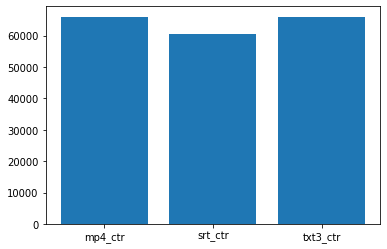

In [13]:
# Bar plot for visualizing the count of various file types
# X-axis: File Type
# Y-axis: Count
plt.bar(["mp4_ctr","srt_ctr","txt3_ctr"], [mp4_ctr,srt_ctr,txt3_ctr])

## Basic Metadata

In [14]:
# Constant label values which are extracted from the file name
COLUMN_LABELS = ['Pull Date','Year','Month','Day','TODO','Lang','Barcode','V No.','File Type','File Path']

In [15]:
# Create pandas DataFrame for all mp4 files
mp4_df = pd.DataFrame(mp4_files_split, columns=COLUMN_LABELS)
mp4_df

,Pull Date,Year,Month,Day,TODO,Lang,Barcode,V No.,File Type,File Path
0,1972-07-01,1972,07,01,0000,US,00010144,V0,DB.mp4,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-07...
1,1972-10-06,1972,10,06,0000,US,00016471,V0,JS.mp4,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10...
2,1972-10-06,1972,10,06,0000,US,00015980,V1,JS.mp4,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10...
3,1972-09-14,1972,09,14,0000,US,00025933,B0,KC.mp4,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09...
4,1972-09-01,1972,09,01,0000,US,00016359,V0,WR.mp4,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09...
...,...,...,...,...,...,...,...,...,...,...
65910,2003-04-22,2003,04,22,0000,US,00009964,V9,NV.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65911,2003-04-22,2003,04,22,0000,US,00009947,V2,ST.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65912,2003-04-22,2003,04,22,0000,US,00009963,V2,DV.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65913,2003-04-22,2003,04,22,0000,US,00016054,V0,WR.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...


In [16]:
# Create pandas DataFrame for all srt files
srt_df = pd.DataFrame(srt_files_split, columns=COLUMN_LABELS)
srt_df

,Pull Date,Year,Month,Day,TODO,Lang,Barcode,V No.,File Type,File Path
0,1972-10-06,1972,10,06,0000,US,00015980,V1,JS.srt,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10...
1,1972-10-06,1972,10,06,0000,US,00016471,V0,JS.srt,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10...
2,1972-09-14,1972,09,14,0000,US,00025933,B0,KC.srt,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09...
3,1972-09-01,1972,09,01,0000,US,00016359,V0,WR.srt,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09...
4,1972-06-20,1972,06,20,0000,US,00019724,B3,WR.srt,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-06...
...,...,...,...,...,...,...,...,...,...,...
60617,2003-04-22,2003,04,22,0000,US,00009947,V2,ST.srt,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
60618,2003-04-22,2003,04,22,0000,US,00009964,V9,NV.srt,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
60619,2003-04-22,2003,04,22,0000,US,00009965,V5,TM.srt,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
60620,2003-04-22,2003,04,22,0000,US,00009966,V3,NV.srt,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...


In [17]:
# Create pandas DataFrame for all txt3 files
txt3_df = pd.DataFrame(txt3_files_split, columns=COLUMN_LABELS)
txt3_df

,Pull Date,Year,Month,Day,TODO,Lang,Barcode,V No.,File Type,File Path
0,1972-07-01,1972,07,01,0000,US,00010144,V0,DB.txt3,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-07...
1,1972-10-06,1972,10,06,0000,US,00015980,V1,JS.txt3,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10...
2,1972-10-06,1972,10,06,0000,US,00016471,V0,JS.txt3,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10...
3,1972-09-14,1972,09,14,0000,US,00025933,B0,KC.txt3,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09...
4,1972-09-01,1972,09,01,0000,US,00016359,V0,WR.txt3,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09...
...,...,...,...,...,...,...,...,...,...,...
65995,2003-04-22,2003,04,22,0000,US,00009965,V5,TM.txt3,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65996,2003-04-22,2003,04,22,0000,US,00009963,V2,SB.txt3,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65997,2003-04-22,2003,04,22,0000,US,00009966,V3,NV.txt3,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65998,2003-04-22,2003,04,22,0000,US,00009947,V2,ST.txt3,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...


### V No. Bar Plot

In [18]:
# Basic filter
# Remove V No. with frequency less than 10
THRESHOLD = 100
value_counts = mp4_df['V No.'].value_counts()
to_remove = value_counts[value_counts <= THRESHOLD].index
mp4_filtered_df = mp4_df.replace(to_remove, np.nan, inplace=False)
mp4_filtered_df.dropna()
mp4_filtered_df

,Pull Date,Year,Month,Day,TODO,Lang,Barcode,V No.,File Type,File Path
0,1972-07-01,1972,07,01,0000,US,00010144,V0,DB.mp4,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-07...
1,1972-10-06,1972,10,06,0000,US,00016471,V0,JS.mp4,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10...
2,1972-10-06,1972,10,06,0000,US,00015980,V1,JS.mp4,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-10...
3,1972-09-14,1972,09,14,0000,US,00025933,B0,KC.mp4,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09...
4,1972-09-01,1972,09,01,0000,US,00016359,V0,WR.mp4,/mnt/rds/redhen/gallina/Rosenthal/1972/1972-09...
...,...,...,...,...,...,...,...,...,...,...
65910,2003-04-22,2003,04,22,0000,US,00009964,V9,NV.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65911,2003-04-22,2003,04,22,0000,US,00009947,V2,ST.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65912,2003-04-22,2003,04,22,0000,US,00009963,V2,DV.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65913,2003-04-22,2003,04,22,0000,US,00016054,V0,WR.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...


In [27]:
# Method to plot bar chart based on Column value
def freq_bar_plot(df,column,x_label,title):
    ax = df[column].value_counts().plot(kind='bar', figsize=(15,8), title=title)

    ax.set_xlabel(x_label)
    ax.set_ylabel("Freequency")

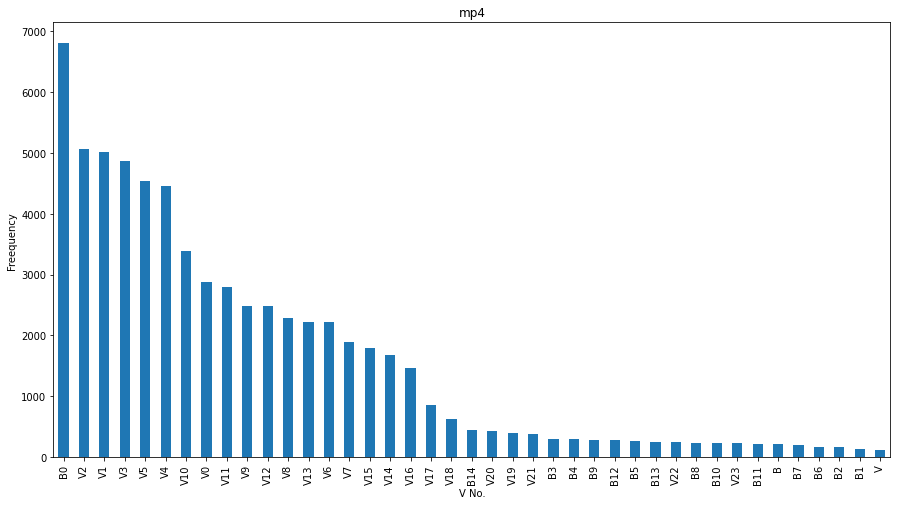

In [28]:
# Plots a bar chart for V No.
# X-Axis = V No.
# Y-Axis = Frequency
freq_bar_plot(mp4_filtered_df,'V No.','V No.','mp4')

### Phase 1 V No. Count

In [21]:
mp4_series = mp4_df['V No.'].value_counts()
mp4_series

B0      6804
V2      5056
V1      5018
V3      4860
V5      4529
        ... 
B714       1
B721       1
B730       1
V713       1
V109       1
Name: V No., Length: 546, dtype: int64

In [22]:
def confusion_matrix(df: pd.DataFrame, col1: str, col2: str):
    """
    Given a dataframe with at least
    two categorical columns, create a 
    confusion matrix of the count of the columns
    cross-counts
    
    use like:
    
    >>> confusion_matrix(test_df, 'actual_label', 'predicted_label')
    """
    return (
            df
            .groupby([col1, col2])
            .size()
            .unstack(fill_value=0)
            )

In [23]:
confusion_matrix(mp4_filtered_df,'V No.', 'Year')

Year,1960,1961,1962,1963,1969,1971,1972,1973,1974,1975,...,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006
V No.,,,,,,,,,,,,,,,,,,,,,
B,0,0,0,0,0,0,4,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B0,2,0,0,0,0,1,357,0,1,1,...,49,5,1,0,1,1,6,1,3,5
B1,0,0,0,0,0,0,2,0,0,0,...,0,1,2,0,0,0,0,0,0,0
B10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
B11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
B12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0


## Preprocessing 

### Category 1

In [24]:
cat1_df = mp4_filtered_df.loc[(mp4_filtered_df['V No.']=='V1')|(mp4_filtered_df['V No.']=='V2')|(mp4_filtered_df['V No.']=='V3')]
cat1_df = cat1_df.loc[cat1_df['Year'].astype(int)>=1995]
cat1_df


,Pull Date,Year,Month,Day,TODO,Lang,Barcode,V No.,File Type,File Path
713,1996-07-01,1996,07,01,0000,US,00017084,V1,HM.mp4,/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07...
714,1996-07-01,1996,07,01,0000,US,00017084,V1,DV.mp4,/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07...
715,1996-07-01,1996,07,01,0000,US,00017103,V2,JS.mp4,/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07...
716,1996-07-01,1996,07,01,0000,US,00017103,V2,KC.mp4,/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07...
717,1996-07-01,1996,07,01,0000,US,00017085,V3,HM.mp4,/mnt/rds/redhen/gallina/Rosenthal/1996/1996-07...
...,...,...,...,...,...,...,...,...,...,...
65904,2003-04-28,2003,04,28,0000,US,00009950,V3,ST.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65907,2003-04-22,2003,04,22,0000,US,00009966,V3,NV.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65908,2003-04-22,2003,04,22,0000,US,00009963,V2,SB.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...
65911,2003-04-22,2003,04,22,0000,US,00009947,V2,ST.mp4,/mnt/rds/redhen/gallina/Rosenthal/2003/2003-04...


2005    1037
2004    1016
2003     947
2002     942
2006     906
2000     882
2001     877
1999     809
1996     806
1997     800
1998     781
1995     596
Name: Year, dtype: int64


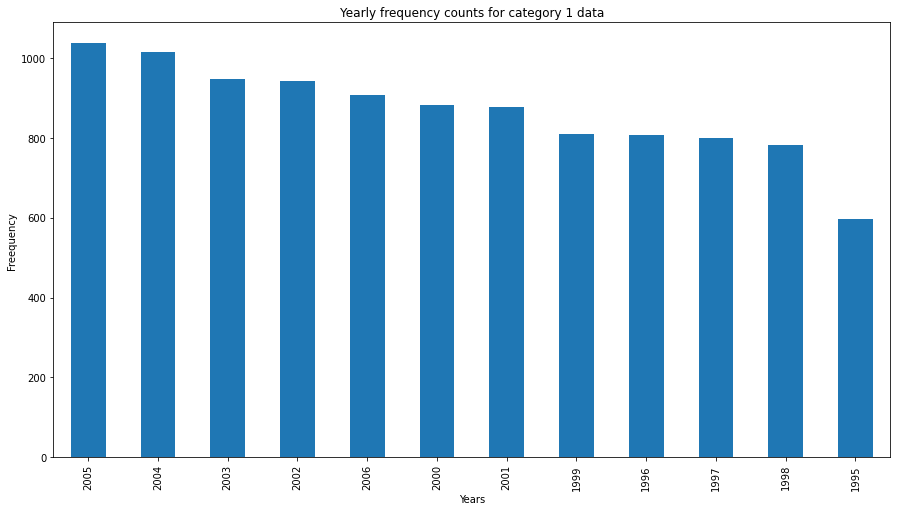

In [37]:
# Plots a bar chart for Years
# X-Axis = Year
# Y-Axis = Frequency
freq_bar_plot(cat1_df,'Year','Years','Yearly frequency counts for category 1 data')
print(cat1_df['Year'].value_counts())

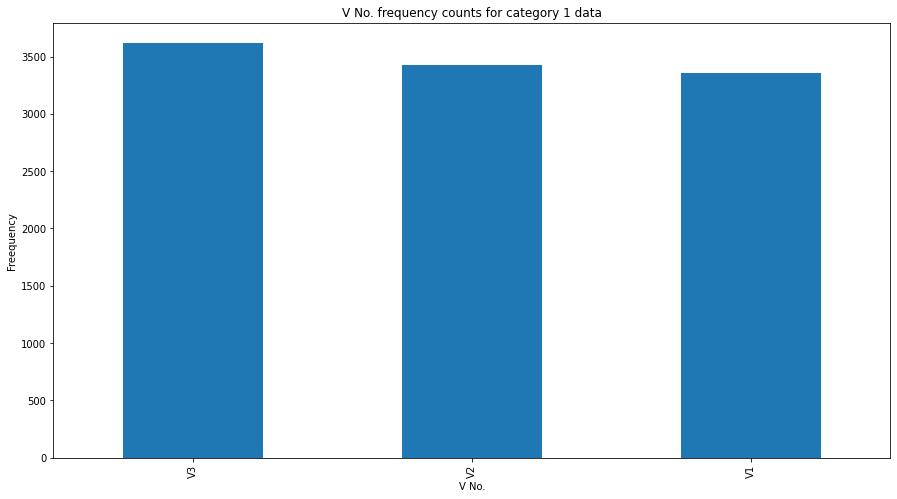

In [34]:
# Plots a bar chart for V No.
# X-Axis = V No.
# Y-Axis = Frequency
freq_bar_plot(cat1_df,'V No.','V No.','V No. frequency counts for category 1 data')

#### Store files 

In [38]:
store_batch_path = '/mnt/rds/redhen/gallina/home/hxm471/RedHenLab-Multimodal_TV_Show_Segmentation/mtvss/data/tmp/batch_cat1.npy'
store_raw_path='/mnt/rds/redhen/gallina/home/hxm471/RedHenLab-Multimodal_TV_Show_Segmentation/mtvss/data/tmp/raw_cat1.csv'

In [39]:
cat1_df.to_csv(store_raw_path)

#### Create Batches 

In [40]:
BATCH_SIZE = 100
batches = []
for g, df_sub in cat1_df.groupby(np.arange(len(cat1_df)) // BATCH_SIZE):
    batches.append(df_sub['File Path'].values[:])
batches = np.array(batches)
np.save(store_batch_path,batches)

/tmp/ipykernel_28531/3476360199.py:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  batches = np.array(batches)


In [41]:
batches_load = np.load(store_batch_path,allow_pickle=True)
batches_load[1]

array(['/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-13/1996-09-13_0000_US_00017463_V3_VHSP20_MB23_H4_NV.mp4',
       '/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-19/1996-09-19_0000_US_00017847_V1_VHSP6_MB11_E2_NV.mp4',
       '/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-19/1996-09-19_0000_US_00013820_V2_VHS53_MB26_E12_HL_BE.mp4',
       '/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-19/1996-09-19_0000_US_00017847_V1_VHSP25_MB27_H22_AZ_BE.mp4',
       '/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-19/1996-09-19_0000_US_00013833_V3_VHS12_MB25_H6_ZY.mp4',
       '/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-19/1996-09-19_0000_US_00013820_V2_VHS26_MB8_EB1_JG.mp4',
       '/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-30/1996-09-30_0000_US_00012251_V2_VHSP18_MB10_H24_GS_BE.mp4',
       '/mnt/rds/redhen/gallina/Rosenthal/1996/1996-09/1996-09-30/1996-09-30_0000_US_00012251_V2_VHSP19_MB26_E12_DB.mp4',
       '/mnt/rds/redhen

In [42]:
store_batch_path_txt = '/mnt/rds/redhen/gallina/home/hxm471/RedHenLab-Multimodal_TV_Show_Segmentation/mtvss/data/tmp/batch_cat1.txt'
f = open(store_batch_path_txt,"w")
for r in batches_load:
    for c in r:
        f.write(str(c))
        f.write(" ")
    f.write("\n")
f.write("\n")
f.close()